###  Data Source

Online Data source:
    
Behavioral Risk Factor Surveillance System (BRFSS) 2023 Data.

Url: https://www.cdc.gov/brfss/annual_data/annual_2023.html \
Zipped data Url: https://www.cdc.gov/brfss/annual_data/2023/files/LLCP2023XPT.zip


Information about the column and definition of column:
https://www.cdc.gov/brfss/annual_data/2023/zip/codebook23_llcp-v2-508.zip

### Loading libraries, setting constants

In [1]:
# import libraries
import pandas as pd
import warnings
import requests
import zipfile
import pyreadstat
import io
import os
import time
import copy
from pathlib import Path
from io import BytesIO
import sas7bdat
import mlxtend
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import joblib
import optuna
import json

from sklearn.preprocessing import LabelEncoder
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier

import pandas as pd
import numpy as np
import statsmodels.api as sm
from scipy.stats import chi2_contingency

from sklearn.feature_selection import VarianceThreshold, SequentialFeatureSelector, RFE, SelectKBest, f_classif, mutual_info_classif
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, KFold, train_test_split, GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold, StratifiedKFold
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import (
    precision_recall_curve, auc, cohen_kappa_score, fbeta_score, roc_auc_score,
    accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report,
    ConfusionMatrixDisplay, PrecisionRecallDisplay, roc_curve, precision_recall_fscore_support

)
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from sklearn import model_selection

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, SVMSMOTE, BorderlineSMOTE, ADASYN
from imblearn.combine import SMOTEENN, SMOTETomek
from sklearn.preprocessing import LabelEncoder
from scipy.stats import ttest_ind
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.inspection import permutation_importance

c:\Users\sherm\AppData\Local\Programs\Python\Python313\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Specify the paths
DATA_PATH = Path(r'C:\Users\sherm\OneDrive\Documents\P2')
RAW_FILE_PATH = DATA_PATH / 'LLCP2023.XPT'
PROCESSED_FILE_PATH_PARQUET = r'C:\Users\sherm\OneDrive\Documents\P2\heart_converted.parquet'

In [3]:
# Check if the SAS file exists
if os.path.exists(RAW_FILE_PATH):
    print(f'The file {RAW_FILE_PATH} exists.')
else:
    print(f'The file {RAW_FILE_PATH} does not exist.')

The file C:\Users\sherm\OneDrive\Documents\P2\LLCP2023.XPT exists.


### Converting SAS to PARQUET

In [ ]:
# ONLY run once to upload dataset
def sas_converter(path: str, dest_path: str, file_format: str):
    assert file_format in ['csv', 'parquet']

    try:
        df = pd.read_sas(path, encoding='utf-8')
    except Exception as e:
        print('Not a valid SAS file.')
    else:
        if file_format == 'csv':
            df.to_csv(dest_path, index=False)
        elif file_format == 'parquet':
            df.to_parquet(dest_path, index=False)

# Call the function with the correct arguments
sas_converter(path=RAW_FILE_PATH, dest_path=PROCESSED_FILE_PATH_PARQUET, file_format='parquet')

### Reading, overviewing data

In [4]:
df = pd.read_parquet(PROCESSED_FILE_PATH_PARQUET)

In [5]:
# Total sample size
print(df.shape)

(433323, 350)


## 2. Data Pre-processing

### Extracting the list of variables

### Filter only the variables related to diabetes based on traditional risk factors from literature review/ research


In [6]:
names = [
    "SEXVAR",
    "GENHLTH",
    "PHYSHLTH",
    "MENTHLTH",
    "CHECKUP1",
    "EXERANY2",
    "CVDINFR4",
    "CVDCRHD4",
    "CVDSTRK3",
    "ASTHMA3",
    "CHCSCNC1",
    "CHCCOPD3",
    "ADDEPEV3",
    "CHCKDNY2",
    "HAVARTH4",
    "DIABETE4",
    "DIFFWALK",
    "_SMOKER3",
    "ECIGNOW2",
    "_RACEGR3",
    "_AGEG5YR",
    "_BMI5",
    "DRNKANY6",
    "INCOME3",
    "CHCOCNC1",
    "EDUCA",
    "_HLTHPL1",
    "_RFCHOL3",
    "_RFHYPE6",

]

df = df.loc[:, names]

### List down all the unique values/ categories of each of the variable from the documentation.

In [7]:
SEXVAR = {1: 'Male', 2: 'Female'}

GENHLTH = {
    1: "Excellent",
    2: "Very good",
    3: "Good",
    4: "Fair",
    5: "Poor",
    7: "Don’t know/Not Sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

PHYSHLTH = lambda x: np.where(x == 88, 0, np.where(x > 30, np.nan, x))

MENTHLTH = lambda x: np.where(x == 88, 0, np.where(x > 30, np.nan, x))

CHECKUP1 = {
    1: "Within past year (anytime less than 12 months ago)",
    2: "Within past 2 years (1 year but less than 2 years ago)",
    3: "Within past 5 years (2 years but less than 5 years ago)",
    4: "5 or more years ago",
    7: "Don’t know/Not Sure",
    8: "Never",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

EXERANY2 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not Sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

CVDINFR4 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

CVDCRHD4 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

CVDSTRK3 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

ASTHMA3 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not Sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

CHCSCNC1 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know / Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

CHCCOPD3 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know / Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

ADDEPEV3 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

CHCKDNY2 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know / Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

HAVARTH4 = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not Sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

DIABETE4 = {
    1: "Yes",
    2: "Yes, but female told only during pregnancy",
    3: "No",
    4: "No, pre-diabetes or borderline diabetes",
    7: "Don’t know/Not Sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

DIFFWALK = {
    1: 'Yes',
    2: 'No',
    7: "Don’t know/Not Sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

_SMOKER3 = {
    1: "Current smoker - now smokes every day",
    2: "Current smoker - now smokes some days",
    3: "Former smoker",
    4: "Never smoked",
    9: "Don’t know/Refused/Missing"
}

ECIGNOW2 = {
    1: "Never used e-cigarettes in your entire life",
    2: "Use them every day",
    3: "Use them some days",
    4: "Not at all (right now)",
    7: "Don’t know / Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

LCSCTSC1 = {
    1: "Yes",
    2: "No",
    7: "Don’t know/Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

_RACEGR3 = {
    1: "White only, Non-Hispanic",
    2: "Black only, Non-Hispanic",
    3: "Other race only, Non-Hispanic",
    4: "Multiracial, Non-Hispanic",
    5: "Hispanic",
    9: "Don’t know/Not sure/Refused",
    np.nan: "Missing"
}

_AGEG5YR = {
    1: "Age 18 to 24",
    2: "Age 25 to 29",
    3: "Age 30 to 34",
    4: "Age 35 to 39",
    5: "Age 40 to 44",
    6: "Age 45 to 49",
    7: "Age 50 to 54",
    8: "Age 55 to 59",
    9: "Age 60 to 64",
    10: "Age 65 to 69",
    11: "Age 70 to 74",
    12: "Age 75 to 79",
    13: "Age 80 or older",
    14: "Don’t know/Refused/Missing"
}

DRNKANY6 = {
    1: 'Yes',
    2: 'No',
    9: "Don’t know/Not Sure",
    np.nan: "Refused/Missing"
}

INCOME3 = {
    1: 'Less than $10,000',
    2: 'Less than $15,000 ($10,000 to < $15,000)',
    3: 'Less than $20,000 ($15,000 to < $20,000)',
    4: 'Less than $25,000 ($20,000 to < $25,000)',
    5: 'Less than $35,000 ($25,000 to < $35,000)',
    6: 'Less than $50,000 ($35,000 to < $50,000)',
    7: 'Less than $75,000 ($50,000 to < $75,000)',
    8: 'Less than $100,000 ($75,000 to < $100,000)',
    9: 'Less than $150,000 ($100,000 to < $150,000)',
    10: 'Less than $200,000 ($150,000 to < $200,000)',
    11: '$200,000 or more',
    77: 'Don’t know/Not sure',
    99: 'Refused',
    np.nan: 'Not asked or Missing'
}

CHCOCNC1 = {
    1: "Yes",
    2: "No",
    7: "Don’t know / Not sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

EDUCA = {
    1: "Never attended school or only kindergarten",
    2: "Grades 1 through 8 (Elementary)",
    3: "Grades 9 through 11 (Some high school)",
    4: "Grade 12 or GED (High school graduate)",
    5: "College 1 year to 3 years (Some college or technical school)",
    6: "College 4 years or more (College graduate)",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

DIABTYPE = {
    1: "Type 1",
    2: "Type 2",
    7: "Don’t know/Not Sure",
    9: "Refused",
    np.nan: "Not asked or Missing"
}

_HLTHPL1 = {
    1: "Have some form of insurance",
    2: "Do not have some form of health insurance",
    9: "Don´t know, refused or missing"
}

_RFCHOL3 = {
    1: "No",
    2: "Yes",
    9: "Don’t know/Not Sure Or Refused/Missing",
    np.nan: "Missing"
}

_RFHYPE6 = {
    1: "No",
    2: "Yes",
    9: "Don’t know/Not Sure/Refused/Missing",
}

### Mapping the values based on the mapping dict

In [8]:
df['SEXVAR']=df['SEXVAR'].map(SEXVAR)
df['GENHLTH']=df['GENHLTH'].map(GENHLTH)
df['PHYSHLTH']=df['PHYSHLTH'].map(PHYSHLTH)
df['MENTHLTH']=df['MENTHLTH'].map(MENTHLTH)
df['CHECKUP1']=df['CHECKUP1'].map(CHECKUP1)
df['EXERANY2']=df['EXERANY2'].map(EXERANY2)
df['CVDINFR4']=df['CVDINFR4'].map(CVDINFR4)
df['CVDCRHD4']=df['CVDCRHD4'].map(CVDCRHD4)
df['CVDSTRK3']=df['CVDSTRK3'].map(CVDSTRK3)
df['ASTHMA3']=df['ASTHMA3'].map(ASTHMA3)
df['CHCSCNC1']=df['CHCSCNC1'].map(CHCSCNC1)
df['CHCCOPD3']=df['CHCCOPD3'].map(CHCCOPD3)
df['ADDEPEV3']=df['ADDEPEV3'].map(ADDEPEV3)
df['CHCKDNY2']=df['CHCKDNY2'].map(CHCKDNY2)
df['HAVARTH4']=df['HAVARTH4'].map(HAVARTH4)
df['DIABETE4']=df['DIABETE4'].map(DIABETE4)
df['DIFFWALK']=df['DIFFWALK'].map(DIFFWALK)
df['_SMOKER3']=df['_SMOKER3'].map(_SMOKER3)
df['ECIGNOW2']=df['ECIGNOW2'].map(ECIGNOW2)
df['_RACEGR3']=df['_RACEGR3'].map(_RACEGR3)
df['_AGEG5YR']=df['_AGEG5YR'].map(_AGEG5YR)
df['DRNKANY6']=df['DRNKANY6'].map(DRNKANY6)
df['INCOME3']=df['INCOME3'].map(INCOME3)
df['CHCOCNC1']=df['CHCOCNC1'].map(CHCOCNC1)
df['EDUCA']=df['EDUCA'].map(EDUCA)
df['_BMI5'] = df['_BMI5'] / 100
df['_HLTHPL1'] = df['_HLTHPL1'].map(_HLTHPL1)
df['_RFCHOL3'] = df['_RFCHOL3'].map(_RFCHOL3)
df['_RFHYPE6'] = df['_RFHYPE6'].map(_RFHYPE6)

### Rename column for better reading

In [9]:
df = df.rename(columns={
    'SEXVAR': 'Gender',
    'GENHLTH': 'GeneralHealth',
    'PHYSHLTH': 'PhysicalHealthDays',
    'MENTHLTH': 'MentalHealthDays',
    'CHECKUP1': 'LastCheckupTime',
    'EXERANY2': 'PhysicalActivities',
    'CVDINFR4': 'HadHeartAttack',
    'CVDCRHD4': 'HadHeartDisease',
    'CVDSTRK3': 'HadStroke',
    'ASTHMA3': 'HadAsthma',
    'CHCSCNC1': 'HadSkinCancer',
    'CHCCOPD3': 'HadCOPD',
    'ADDEPEV3': 'HadDepressiveDisorder',
    'CHCKDNY2': 'HadKidneyDisease',
    'HAVARTH4': 'HadArthritis',
    'DIABETE4': 'HadDiabetes',
    'DIFFWALK': 'DifficultyWalking',
    '_SMOKER3': 'SmokerStatus',
    'ECIGNOW2': 'ECigaretteUsage',
    '_RACEGR3': 'RaceEthnicityCategory',
    '_AGEG5YR': 'AgeCategory',
    '_BMI5': 'BMI',
    'DRNKANY6': 'AlcoholDrinkers',
    'INCOME3': 'HouseholdIncome',
    'CHCOCNC1': 'HadOtherCancer',
    'EDUCA': 'EducationLevel',
    '_HLTHPL1': 'HadInsurance',
    '_RFCHOL3': 'Highcholesterol',
    '_RFHYPE6': 'HighBloodPressure',
})

### Data types

In [10]:
# identify the data type of the columns
df.dtypes

Gender                    object
GeneralHealth             object
PhysicalHealthDays       float64
MentalHealthDays         float64
LastCheckupTime           object
PhysicalActivities        object
HadHeartAttack            object
HadHeartDisease           object
HadStroke                 object
HadAsthma                 object
HadSkinCancer             object
HadCOPD                   object
HadDepressiveDisorder     object
HadKidneyDisease          object
HadArthritis              object
HadDiabetes               object
DifficultyWalking         object
SmokerStatus              object
ECigaretteUsage           object
RaceEthnicityCategory     object
AgeCategory               object
BMI                      float64
AlcoholDrinkers           object
HouseholdIncome           object
HadOtherCancer            object
EducationLevel            object
HadInsurance              object
Highcholesterol           object
HighBloodPressure         object
dtype: object

In [11]:
print(df.shape)

(433323, 29)


### Descriptive statistics of the data

In [77]:
# Display descriptive statistics of the data

def describe_df(df: pd.DataFrame):
    print(f"The dataset contains {df.shape[1]} columns and {len(df)} rows")

    for col in df.columns:
        col_dtype = df[col].dtype

        print(f"\nColumn: {col} ({col_dtype})")
        if col_dtype == 'object':
            print(f"--- Unique values and frequencies:")

            # Calculate value counts and percentages
            value_counts = df[col].value_counts(dropna=False, normalize=True) * 100
            value_counts = value_counts.rename({None: 'NaN'}).sort_values(ascending=False)

            for value, percent in zip(value_counts.index, value_counts):
                count = df[col].value_counts(dropna=False)[value]
                print(f"    {value}: {count} ({percent:.2f}%)")

            mode_val = df[col].mode().iloc[0]
            mode_freq = value_counts.get(mode_val, 0)
            print(f"--- Mode: {mode_val} ({mode_freq:.2f}%)")

            # Display the percentage of NaNs
#             nan_percent = df[col].isna().sum() / len(df[col]) * 100
#             print(f"--- Percentage of NaNs: {nan_percent:.2f}%")
        else:
            print(f"--- Summary statistics:\n {df[col].describe()}")
            print(f"--- Percentage of NaNs: {df[col].isna().sum() / len(df[col]) * 100}")

display(describe_df(df))

The dataset contains 29 columns and 433323 rows

Column: Gender (object)
--- Unique values and frequencies:
    Female: 229541 (52.97%)
    Male: 203782 (47.03%)
--- Mode: Female (52.97%)

Column: GeneralHealth (object)
--- Unique values and frequencies:
    Good: 144209 (33.28%)
    Very good: 142115 (32.80%)
    Excellent: 63410 (14.63%)
    Fair: 61955 (14.30%)
    Poor: 20372 (4.70%)
    Don’t know/Not Sure: 897 (0.21%)
    Refused: 361 (0.08%)
    Not asked or Missing: 4 (0.00%)
--- Mode: Good (33.28%)

Column: PhysicalHealthDays (float64)
--- Summary statistics:
 count    422538.000000
mean          4.482591
std           8.827409
min           0.000000
25%           0.000000
50%           0.000000
75%           4.000000
max          30.000000
Name: PhysicalHealthDays, dtype: float64
--- Percentage of NaNs: 2.488905504669727

Column: MentalHealthDays (float64)
--- Summary statistics:
 count    425215.000000
mean          4.358383
std           8.320868
min           0.000000
25% 

None

### Identify those values that need to be replaced with NaN

In [12]:
# Select only string columns
string_columns = df.select_dtypes(include=['object']).columns

# Stack and get unique string values
unique_values = df[string_columns].stack().unique()

# Print unique string values
for value in unique_values:
    print(value)

Female
Very good
Within past 2 years (1 year but less than 2 years ago)
No
Yes
Never smoked
Never used e-cigarettes in your entire life
White only, Non-Hispanic
Age 80 or older
Refused
College 1 year to 3 years (Some college or technical school)
Have some form of insurance
Fair
Within past year (anytime less than 12 months ago)
Former smoker
Black only, Non-Hispanic
Less than $15,000 ($10,000 to < $15,000)
Grade 12 or GED (High school graduate)
Within past 5 years (2 years but less than 5 years ago)
Age 75 to 79
Less than $75,000 ($50,000 to < $75,000)
Good
Age 60 to 64
Male
Less than $50,000 ($35,000 to < $50,000)
Not at all (right now)
Age 55 to 59
Age 65 to 69
Less than $150,000 ($100,000 to < $150,000)
College 4 years or more (College graduate)
Less than $20,000 ($15,000 to < $20,000)
Poor
Don’t know/Not Sure
Don’t know / Not sure
Don’t know/Not sure
Current smoker - now smokes every day
Less than $35,000 ($25,000 to < $35,000)
Less than $25,000 ($20,000 to < $25,000)
Not asked or 

In [13]:
# Replace the mentioned values with NaN

for col in df.columns:

    df[col] = df[col].replace([
        "Not asked or Missing",
        "Don’t know/Refused/Missing",
        "Don’t know/Not Sure",
        "Don’t know / Not Sure",
        "Don’t know / not Sure",
        "Don’t know / Not sure",
        "Don’t know/Not sure",
        "Don’t know/not Sure",
        "Don’t know/Not Sure/Refused",
        "Refused",
        "Not asked or missing",
        "Missing",
        "Don’t know/Not sure/Refused",
        "Don’t know/Not Sure Or Refused/Missing",
        "Don’t know/Not Sure/Refused/Missing",
        "Don´t know, refused or missing",
        ""
    ], np.nan)

In [14]:
# list down NaN for each of the column

# pass/Fail criteria: NaN Percentages <= 20% then Pass, else Fail

# List down NaN for each column
nan_info = pd.DataFrame({
    'NaN Counts': df.isna().sum(),
    'NaN Percentages': df.isna().mean() * 100,
    'Pass/Fail': ['Fail' if percent > 20 else 'Pass' for percent in (df.isna().mean() * 100)]
})

# Display the NaN information for each column
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(nan_info)

,NaN Counts,NaN Percentages,Pass/Fail
Gender,0,0.000000,Pass
GeneralHealth,1262,0.291238,Pass
PhysicalHealthDays,10785,2.488906,Pass
MentalHealthDays,8108,1.871122,Pass
LastCheckupTime,5781,1.334109,Pass
PhysicalActivities,1251,0.288699,Pass
HadHeartAttack,2568,0.592630,Pass
HadHeartDisease,4231,0.976408,Pass
HadStroke,1474,0.340162,Pass
HadAsthma,1701,0.392548,Pass


#### For columns <= 20%, we remove the rows with NaN.
#### For columns > 20%, data imputation is required to perform in Training SET in order to prevent the data loss.

In [15]:
# Calculate NaN percentages for each column
nan_percentages = df.isna().mean() * 100

# Find columns where NaN percentages are less than or equal to 20%
valid_columns = nan_percentages[nan_percentages <= 20].index

# Remove rows where all valid columns have NaN percentages less than or equal to 20%
df = df.dropna(subset=valid_columns, thresh=len(valid_columns))

# Reset the index after removing rows
df.reset_index(drop=True, inplace=True)

In [16]:
# list down NaN for each of the column

# pass/Fail criteria: NaN Percentages <= 20% then Pass, else Fail

# List down NaN for each column
nan_info = pd.DataFrame({
    'NaN Counts': df.isna().sum(),
    'NaN Percentages': df.isna().mean() * 100,
    'Pass/Fail': ['Fail' if percent > 20 else 'Pass' for percent in (df.isna().mean() * 100)]
})

# Display the NaN information for each column
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(nan_info)

,NaN Counts,NaN Percentages,Pass/Fail
Gender,0,0.0,Pass
GeneralHealth,0,0.0,Pass
PhysicalHealthDays,0,0.0,Pass
MentalHealthDays,0,0.0,Pass
LastCheckupTime,0,0.0,Pass
PhysicalActivities,0,0.0,Pass
HadHeartAttack,0,0.0,Pass
HadHeartDisease,0,0.0,Pass
HadStroke,0,0.0,Pass
HadAsthma,0,0.0,Pass


In [17]:
# check duplicates
duplicates_all_columns = df[df.duplicated()]

# Display the duplicate rows
print("\nDuplicate rows based on all columns:")
print(duplicates_all_columns)


Duplicate rows based on all columns:
        Gender GeneralHealth  PhysicalHealthDays  MentalHealthDays  \
416     Female          Fair                 0.0               0.0   
417     Female          Good                 2.0               3.0   
418       Male          Good                 0.0               0.0   
419       Male          Good                 0.0               0.0   
420       Male          Good                 0.0               0.0   
...        ...           ...                 ...               ...   
246193    Male     Excellent                 0.0               0.0   
247079  Female     Very good                 0.0               0.0   
248289    Male          Good                 0.0               0.0   
248373  Female     Excellent                 0.0               0.0   
252384  Female     Very good                 1.0               0.0   

                                          LastCheckupTime PhysicalActivities  \
416     Within past year (anytime less th

In [18]:
# Remove duplicate rows
df = df.drop_duplicates()
df

,Gender,GeneralHealth,PhysicalHealthDays,MentalHealthDays,LastCheckupTime,PhysicalActivities,HadHeartAttack,HadHeartDisease,HadStroke,HadAsthma,...,RaceEthnicityCategory,AgeCategory,BMI,AlcoholDrinkers,HouseholdIncome,HadOtherCancer,EducationLevel,HadInsurance,Highcholesterol,HighBloodPressure
0,Female,Fair,6.0,2.0,Within past year (anytime less than 12 months ...,Yes,No,No,No,Yes,...,"Black only, Non-Hispanic",Age 80 or older,22.31,No,"Less than $15,000 ($10,000 to < $15,000)",No,Grade 12 or GED (High school graduate),Have some form of insurance,Yes,Yes
1,Female,Fair,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,No,No,No,No,...,"White only, Non-Hispanic",Age 75 to 79,25.85,Yes,"Less than $75,000 ($50,000 to < $75,000)",Yes,College 1 year to 3 years (Some college or tec...,Have some form of insurance,No,Yes
2,Female,Good,2.0,3.0,Within past year (anytime less than 12 months ...,Yes,No,No,No,No,...,"Black only, Non-Hispanic",Age 60 to 64,30.18,Yes,"Less than $75,000 ($50,000 to < $75,000)",No,College 1 year to 3 years (Some college or tec...,Have some form of insurance,Yes,Yes
3,Female,Good,5.0,0.0,Within past year (anytime less than 12 months ...,No,No,No,No,No,...,"Black only, Non-Hispanic",Age 80 or older,33.47,No,"Less than $50,000 ($35,000 to < $50,000)",No,College 1 year to 3 years (Some college or tec...,Have some form of insurance,Yes,Yes
4,Male,Good,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,Yes,Yes,No,No,...,"White only, Non-Hispanic",Age 75 to 79,22.96,No,"Less than $75,000 ($50,000 to < $75,000)",Yes,Grade 12 or GED (High school graduate),Have some form of insurance,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
252866,Female,Good,0.0,0.0,Within past year (anytime less than 12 months ...,Yes,No,No,No,No,...,"Black only, Non-Hispanic",Age 70 to 74,26.31,No,"Less than $15,000 ($10,000 to < $15,000)",No,Grades 1 through 8 (Elementary),Have some form of insurance,Yes,Yes
252867,Male,Very good,0.0,0.0,Within past 2 years (1 year but less than 2 ye...,No,No,No,No,Yes,...,"Black only, Non-Hispanic",Age 45 to 49,21.56,No,"Less than $35,000 ($25,000 to < $35,000)",No,College 4 years or more (College graduate),Do not have some form of health insurance,No,Yes
252868,Female,Very good,0.0,0.0,Within past year (anytime less than 12 months ...,No,No,No,No,No,...,"Black only, Non-Hispanic",Age 30 to 34,24.96,No,"Less than $50,000 ($35,000 to < $50,000)",No,College 4 years or more (College graduate),Have some form of insurance,No,No
252869,Female,Very good,10.0,0.0,Within past year (anytime less than 12 months ...,Yes,No,No,No,No,...,Hispanic,Age 50 to 54,34.38,Yes,"Less than $200,000 ($150,000 to < $200,000)",No,College 4 years or more (College graduate),Have some form of insurance,Yes,No


In [19]:
# double check again on the NaN

with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    nan_info = pd.DataFrame({
        'NaN Counts': df.isna().sum(),
        'NaN Percentages': df.isna().mean() * 100,
        'Pass/Fail': ['Fail' if percent > 20 else 'Pass' for percent in (df.isna().mean() * 100)]
    })
    display(nan_info)

,NaN Counts,NaN Percentages,Pass/Fail
Gender,0,0.0,Pass
GeneralHealth,0,0.0,Pass
PhysicalHealthDays,0,0.0,Pass
MentalHealthDays,0,0.0,Pass
LastCheckupTime,0,0.0,Pass
PhysicalActivities,0,0.0,Pass
HadHeartAttack,0,0.0,Pass
HadHeartDisease,0,0.0,Pass
HadStroke,0,0.0,Pass
HadAsthma,0,0.0,Pass


## 3. Exploratory Data Analysis

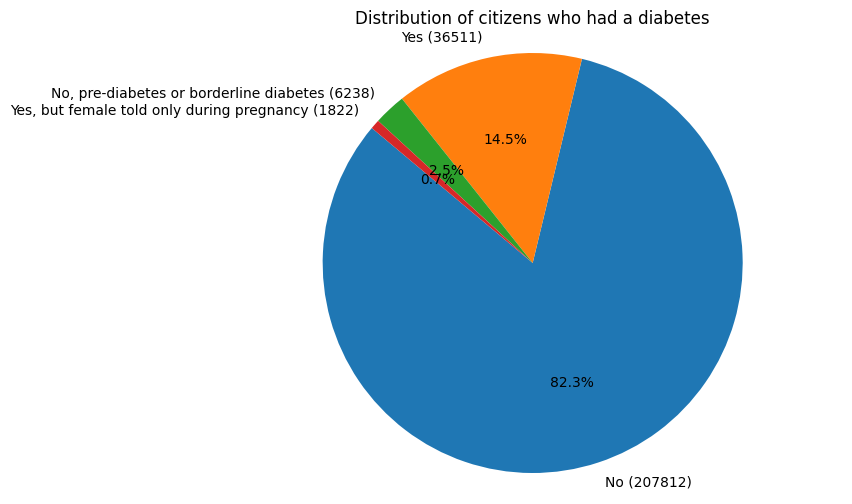

In [20]:
# Get value counts of 'HadDiabetes' column
diabetes_counts = df['HadDiabetes'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(8, 6))
plt.pie(diabetes_counts, labels=[f'{label} ({count})' for label, count in zip(diabetes_counts.index, diabetes_counts)],
        autopct='%1.1f%%', startangle=140)
plt.title('Distribution of citizens who had a diabetes')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

In [21]:
print('Total instances:')
print(len(df['HadDiabetes']), end='\n\n')

print('Values and counts of class HadDiabetes:')
print(df['HadDiabetes'].value_counts(), end='\n\n')

print('Zero R of the dataset:')
print(df['HadDiabetes'].value_counts().max()/len(df['HadDiabetes']))

Total instances:
252383

Values and counts of class HadDiabetes:
HadDiabetes
No                                            207812
Yes                                            36511
No, pre-diabetes or borderline diabetes         6238
Yes, but female told only during pregnancy      1822
Name: count, dtype: int64

Zero R of the dataset:
0.8233993573259689


#### The target: HadDiabetes is imbalanced. Dataset is imbalanced with 83% of instances with class No.

### Categorical Encoding

In [22]:
df_ori = df.copy()

In [39]:
df = df_ori.copy()

In [40]:
# Feature transformation

# HadDiabetes
regrouping_mapping = {
    'No': 'No',
    'No, pre-diabetes or borderline diabetes': 'Yes',
    'Yes': 'Yes',
    'Yes, but female told only during pregnancy': 'No',
}
df['HadDiabetes'] = df['HadDiabetes'].map(regrouping_mapping)

# AgeCategory
def map_age_category_to_midpoint(age_category):
    age_mapping = {
        'Age 18 to 24': 21, 'Age 25 to 29': 27, 'Age 30 to 34': 32, 'Age 35 to 39': 37,
        'Age 40 to 44': 42, 'Age 45 to 49': 47, 'Age 50 to 54': 52, 'Age 55 to 59': 57,
        'Age 60 to 64': 62, 'Age 65 to 69': 67, 'Age 70 to 74': 72, 'Age 75 to 79': 77,
        'Age 80 or older': 85  # Assuming 85 as a representative age for '80+'
    }
    return age_mapping[age_category]
df['AgeCategory'] = df['AgeCategory'].apply(map_age_category_to_midpoint)
df['AgeCategory'] = pd.to_numeric(df['AgeCategory'], errors='coerce')
df['AgeCategory'] = df['AgeCategory'].astype('float64')

# Mapping checkup frequencies to numerical values
checkup_mapping = {
    'Within past year (anytime less than 12 months ago)': 'Yes',        # Most recent checkup
    'Within past 2 years (1 year but less than 2 years ago)': 'Yes',
    'Within past 5 years (2 years but less than 5 years ago)': 'Yes',
    '5 or more years ago': 'Yes',         # Less recent checkup
    'Never': 'No'                       # No checkup
}
df['LastCheckupTime'] = df['LastCheckupTime'].map(checkup_mapping)

# RaceEthnicityCategory
regrouping_mapping = {
    'White only, Non-Hispanic': 'Non-Hispanic',
    'Black only, Non-Hispanic': 'Non-Hispanic',
    'Other race only, Non-Hispanic': 'Non-Hispanic',
    'Multiracial, Non-Hispanic': 'Non-Hispanic',
    'Hispanic': 'Hispanic'
}
df['RaceEthnicityCategory'] = df['RaceEthnicityCategory'].map(regrouping_mapping)

# GeneralHealth
general_health_mapping = {
    'Poor': 1,
    'Fair': 2,
    'Good': 3,
    'Very good': 4,
    'Excellent': 5
}
df['GeneralHealth'] = df['GeneralHealth'].map(general_health_mapping)

# ECigaretteUsage
ECigaretteUsage_mapping = {
    'Never used e-cigarettes in your entire life': 'No',
    'Not at all (right now)': 'No',
    'Use them some days': 'Yes',
    'Use them every day': 'Yes'
}
df['ECigaretteUsage'] = df['ECigaretteUsage'].map(ECigaretteUsage_mapping)

# SmokerStatus
SmokerStatus_mapping = {
    'Never smoked': 'No',
    'Former smoker': 'No',
    'Current smoker - now smokes some days': 'Yes',
    'Current smoker - now smokes every day': 'Yes'
}
df['SmokerStatus'] = df['SmokerStatus'].map(SmokerStatus_mapping)

# HouseholdIncome
HouseholdIncome_mapping = {
    'Less than $20,000 ($15,000 to < $20,000)': 'Low Income',
    'Less than $15,000 ($10,000 to < $15,000)': 'Low Income',
    'Less than $10,000': 'Low Income',
    'Less than $25,000 ($20,000 to < $25,000)': 'Low Income',
    'Less than $35,000 ($25,000 to < $35,000)': 'Middle Income',
    'Less than $50,000 ($35,000 to < $50,000)': 'Middle Income',
    'Less than $75,000 ($50,000 to < $75,000)': 'Middle Income',
    'Less than $100,000 ($75,000 to < $100,000)': 'Middle Income',
    'Less than $150,000 ($100,000 to < $150,000)': 'High Income',
    'Less than $200,000 ($150,000 to < $200,000)': 'High Income',
    '$200,000 or more': 'High Income'
}

df['HouseholdIncome'] = df['HouseholdIncome'].map(HouseholdIncome_mapping)

# EducationLevel
EducationLevel_mapping = {
    "Never attended school or only kindergarten": "Low and Medium Education",
    "Grades 1 through 8 (Elementary)": "Low and Medium Education",
    "Grades 9 through 11 (Some high school)": "Low and Medium Education",
    "Grade 12 or GED (High school graduate)": "Low and Medium Education",
    "College 1 year to 3 years (Some college or technical school)": "Low and Medium Education",
    "College 4 years or more (College graduate)": "High Education"
}

df['EducationLevel'] = df['EducationLevel'].map(EducationLevel_mapping)

# BMI
# ✅ Step 1: Categorize BMI
def categorize_bmi(bmi):
    if bmi < 25:
        return 'Normal'
    elif bmi < 30:
        return 'Overweight'
    else:
        return 'Obese'

df['BMI_Category'] = df['BMI'].apply(categorize_bmi)

# ✅ Step 2: Apply Ordinal Encoding
bmi_mapping = {
    'Normal': 1,
    'Overweight': 2,
    'Obese': 3
}
df['BMI'] = df['BMI_Category'].map(bmi_mapping)

# ✅ Optional: Drop the string column if not needed
df.drop('BMI_Category', axis=1, inplace=True)

# Income
income_mapping = {
    'Low Income': 1,
    'Middle Income': 2,
    'High Income': 3
}
df['HouseholdIncome'] = df['HouseholdIncome'].map(income_mapping)


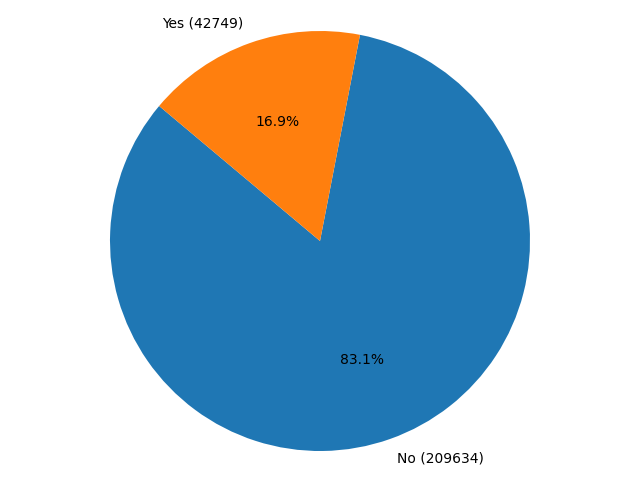

In [41]:
# Get value counts of 'HadDiabetes' column
diabetes_counts = df['HadDiabetes'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(8, 6))
plt.pie(diabetes_counts, labels=[f'{label} ({count})' for label, count in zip(diabetes_counts.index, diabetes_counts)],
        autopct='%1.1f%%', startangle=140)
# plt.title('Distribution of Diabetes Cases')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

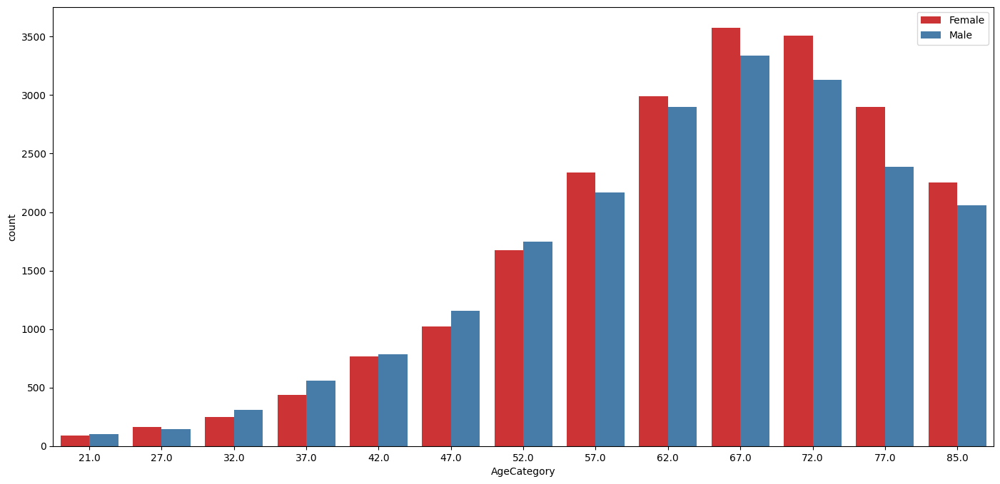

In [42]:
order = pd.unique(df.AgeCategory.values)
order.sort()
plt.figure(figsize = (17,8))
sns.countplot(data=df[df['HadDiabetes']=='Yes'], x='AgeCategory', hue='Gender', palette='Set1', order=order)
plt.legend(['Female','Male'])
# plt.title('Distribution of Diabetes Cases by Age and Gender')
plt.show()

In [43]:
categorical_cols = df.select_dtypes(include=['object']).columns.difference(['HadDiabetes'])

categorical_cols

Index(['AlcoholDrinkers', 'DifficultyWalking', 'ECigaretteUsage',
       'EducationLevel', 'Gender', 'HadArthritis', 'HadAsthma', 'HadCOPD',
       'HadDepressiveDisorder', 'HadHeartAttack', 'HadHeartDisease',
       'HadInsurance', 'HadKidneyDisease', 'HadOtherCancer', 'HadSkinCancer',
       'HadStroke', 'HighBloodPressure', 'Highcholesterol', 'LastCheckupTime',
       'PhysicalActivities', 'RaceEthnicityCategory', 'SmokerStatus'],
      dtype='object')

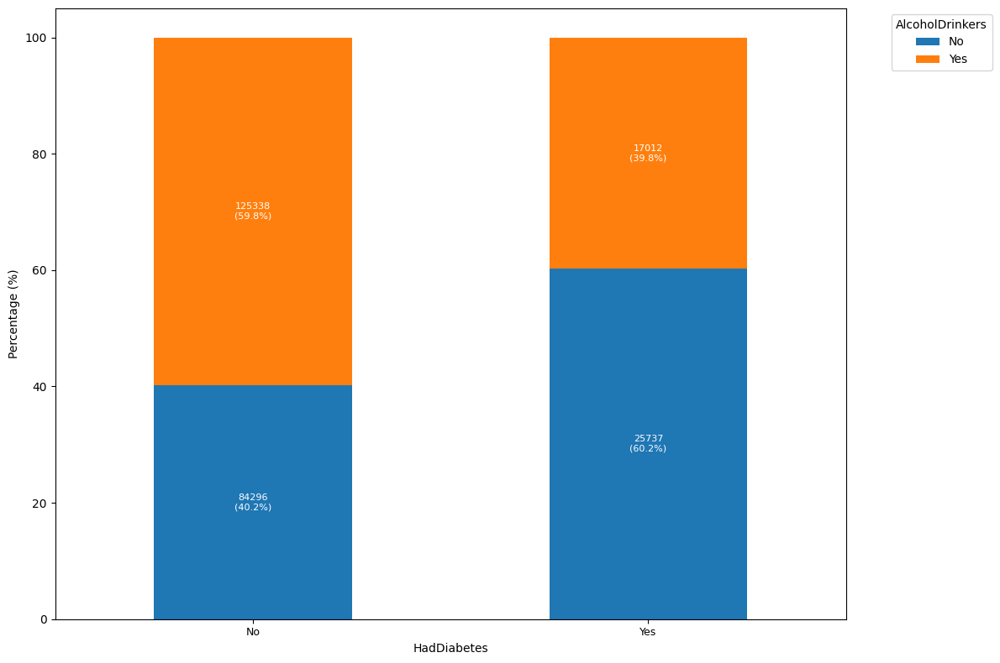

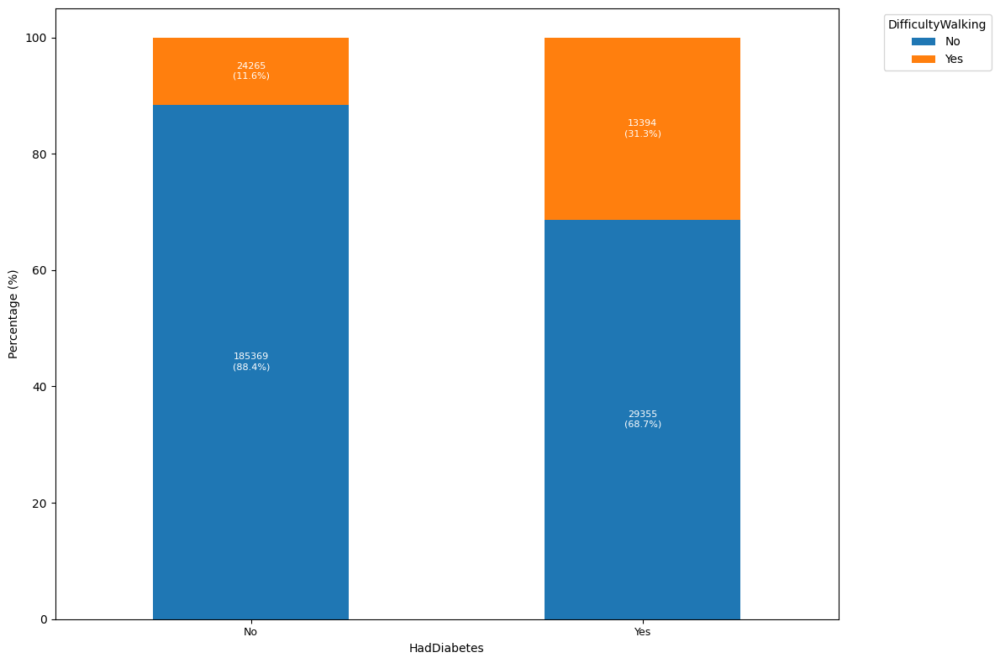

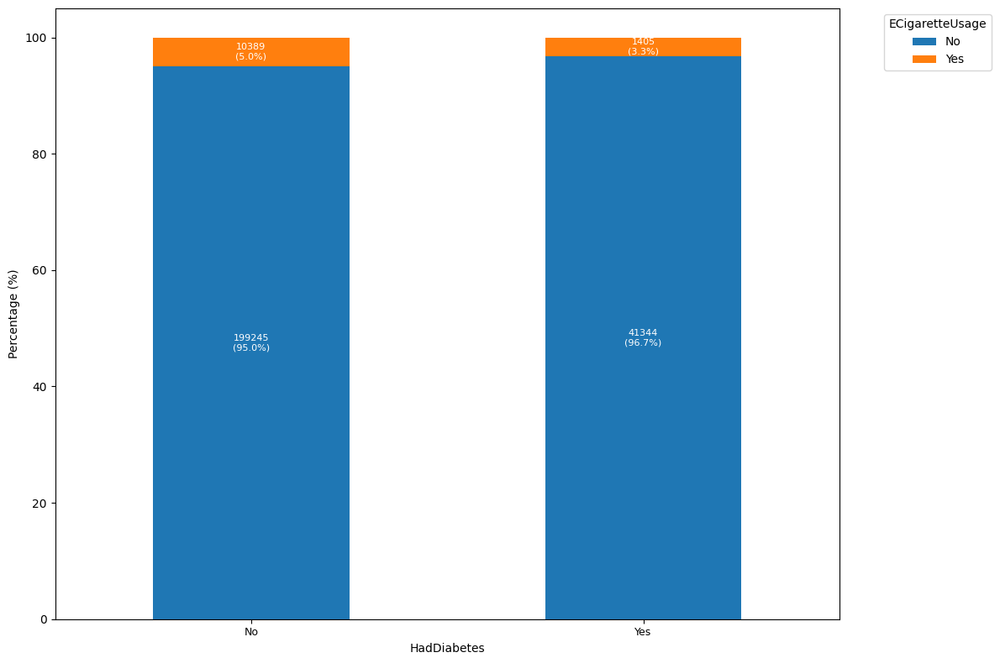

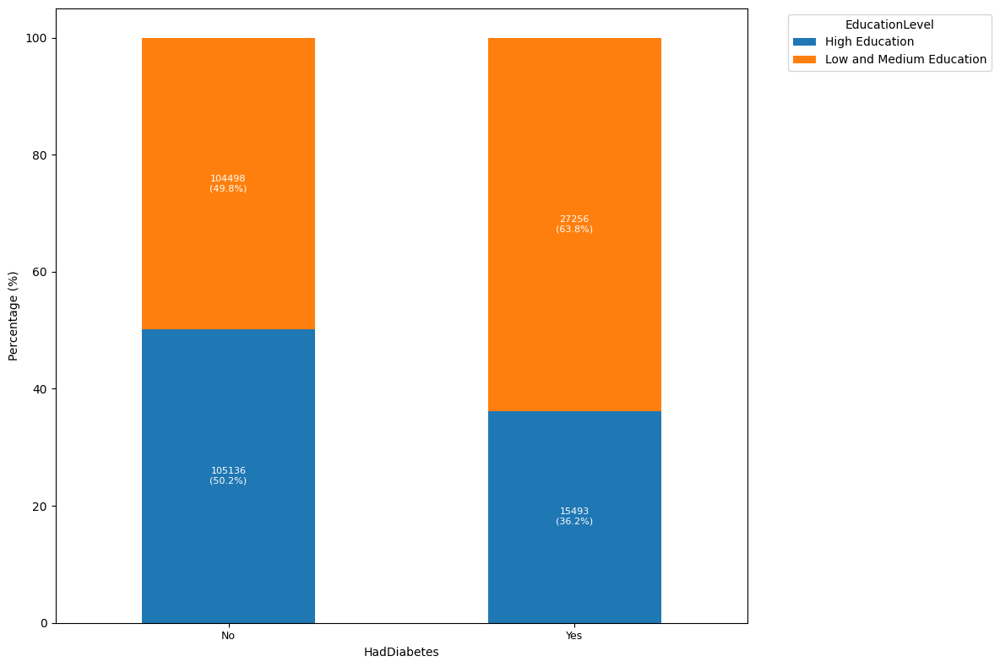

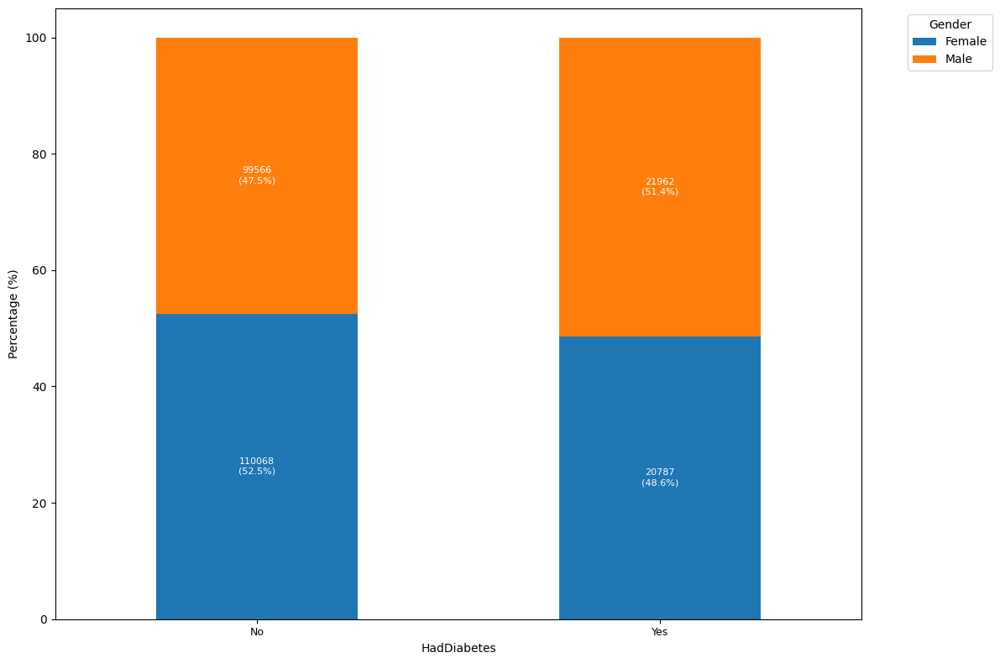

...

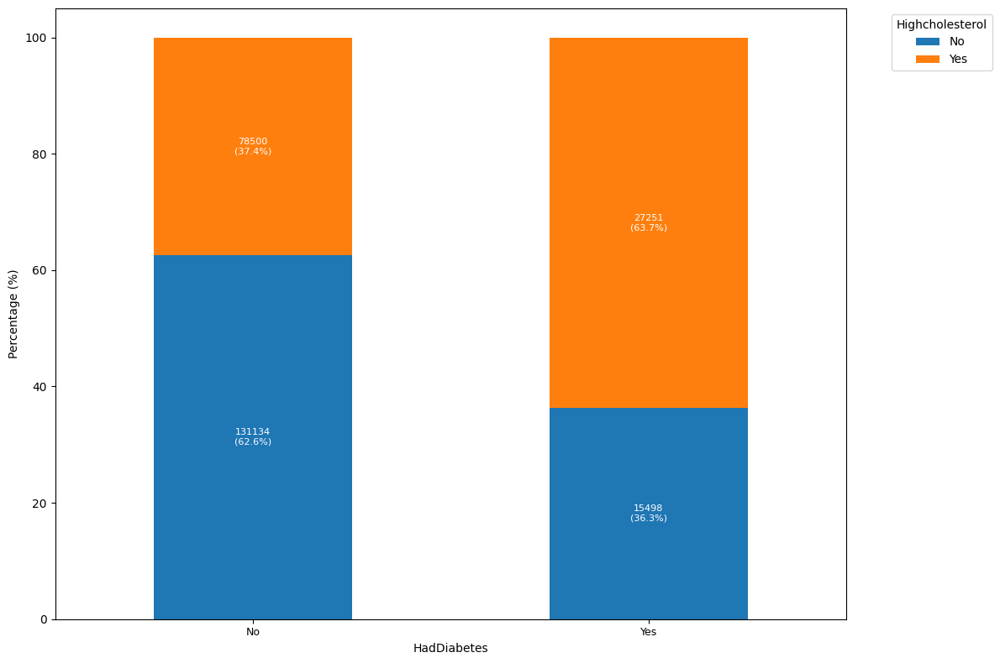

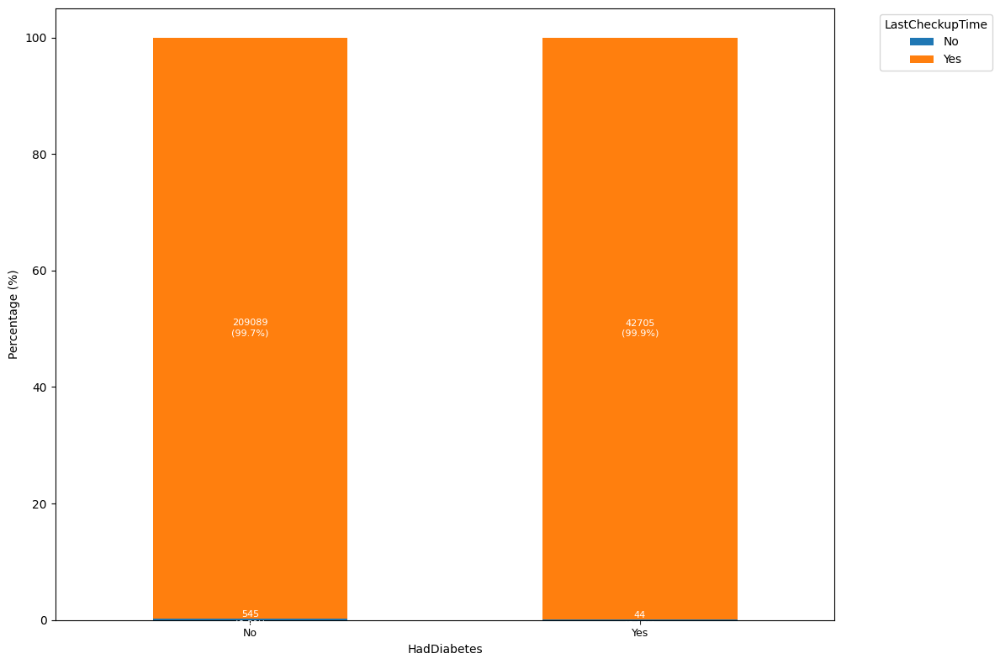

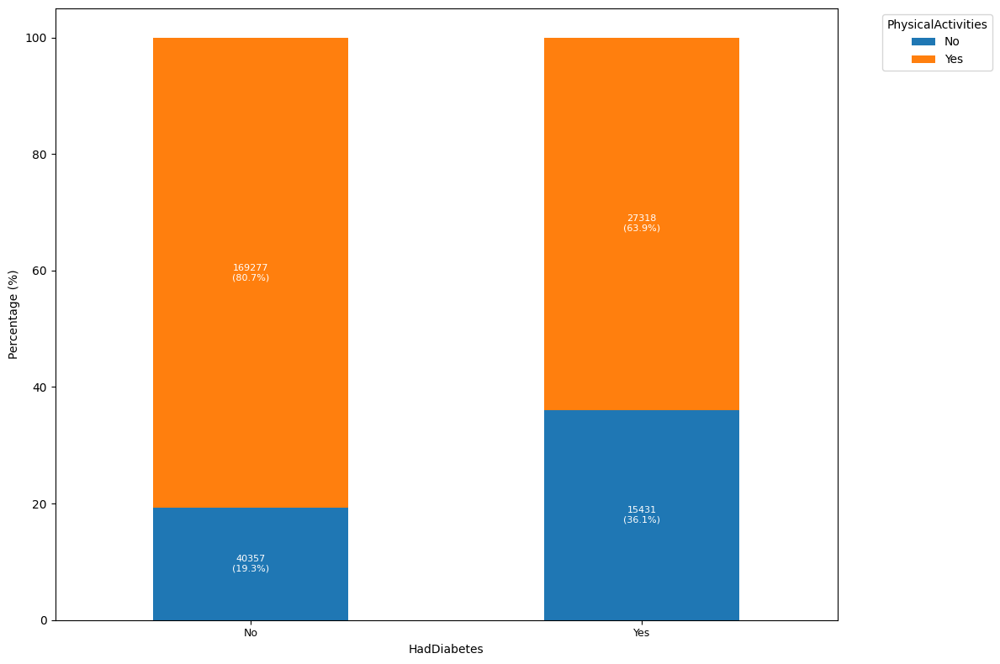

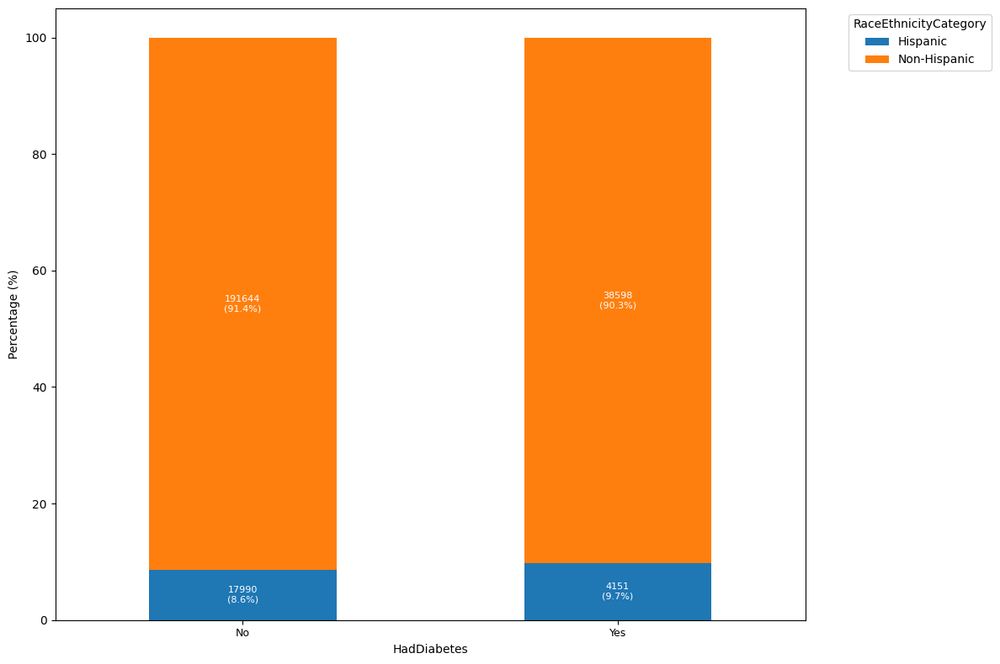

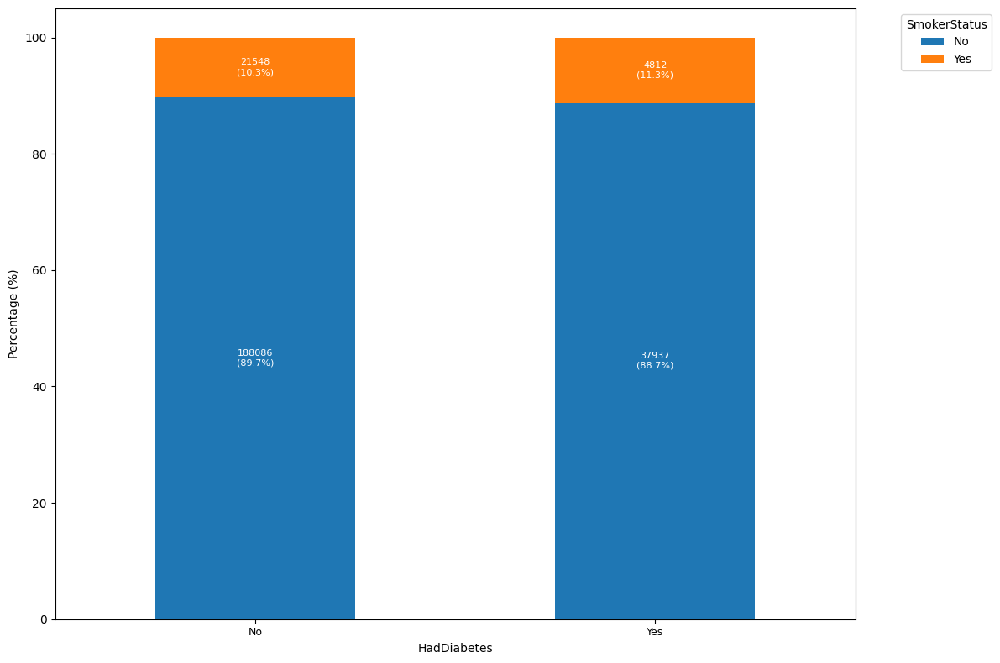

In [27]:
for col in categorical_cols:
    # ✅ Compute count table
    counts = df.groupby(['HadDiabetes', col]).size().unstack(fill_value=0)

    # ✅ Calculate normalized (percentage) per HadDiabetes group
    percent_counts = counts.div(counts.sum(axis=1), axis=0) * 100

    # ✅ Plot normalized stacked bar (100%)
    ax = percent_counts.plot(kind='bar', stacked=True, figsize=(12, 8), color=['#1f77b4', '#ff7f0e'])

    # ✅ Add count and % annotations
    for had_diabetes_class_idx, (had_diabetes_val, row) in enumerate(counts.iterrows()):
        total = row.sum()
        cumulative = 0
        for cat_idx, cat_val in enumerate(row.index):
            count = row[cat_val]
            percent = (count / total) * 100
            height = percent_counts.loc[had_diabetes_val, cat_val]

            # Skip zero counts
            if count == 0:
                continue

            # Compute annotation position
            x = had_diabetes_class_idx
            y = cumulative + height / 2
            cumulative += height

            ax.annotate(f'{int(count)}\n({percent:.1f}%)',
                        (x, y),
                        ha='center', va='center', fontsize=8, color='white')

    ax.set_ylabel('Percentage (%)')
    ax.set_xlabel('HadDiabetes')
    ax.legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_xticklabels(counts.index.astype(str))
    ax.tick_params(axis='x', labelsize=9, rotation=0)

    plt.tight_layout()
    plt.show()


C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\4127212421.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = plot_df.groupby(['HadDiabetes', '__temp__']).size().unstack(fill_value=0)


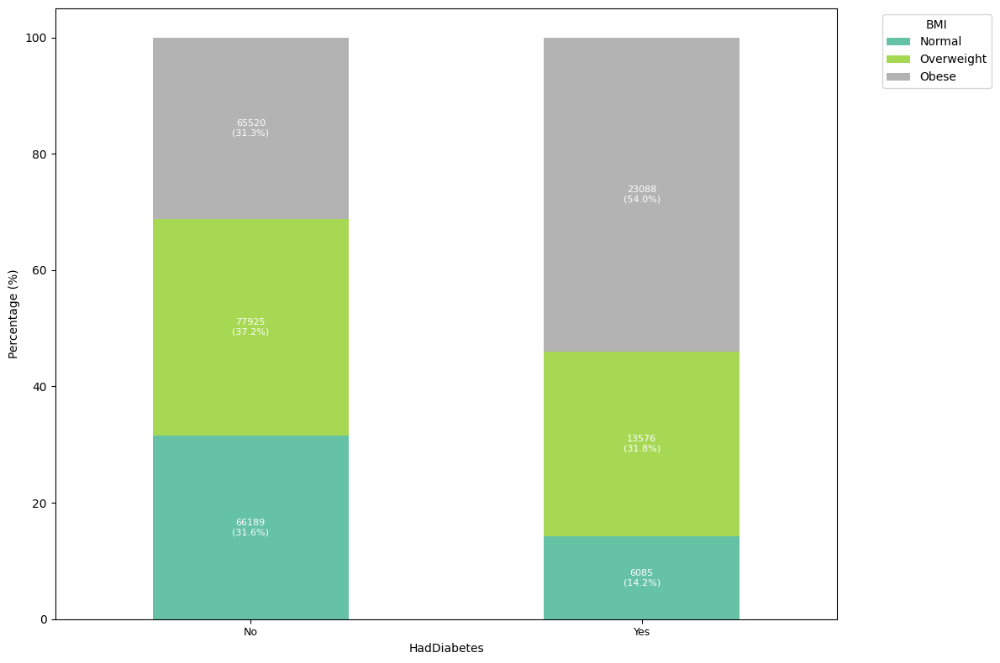

C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\4127212421.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = plot_df.groupby(['HadDiabetes', '__temp__']).size().unstack(fill_value=0)


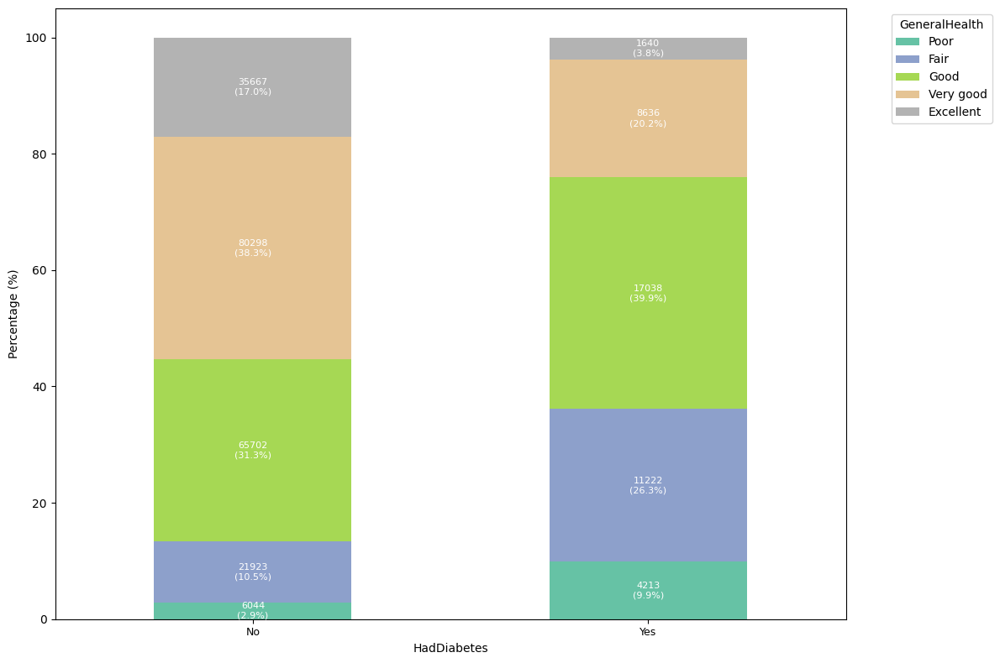

C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\4127212421.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = plot_df.groupby(['HadDiabetes', '__temp__']).size().unstack(fill_value=0)


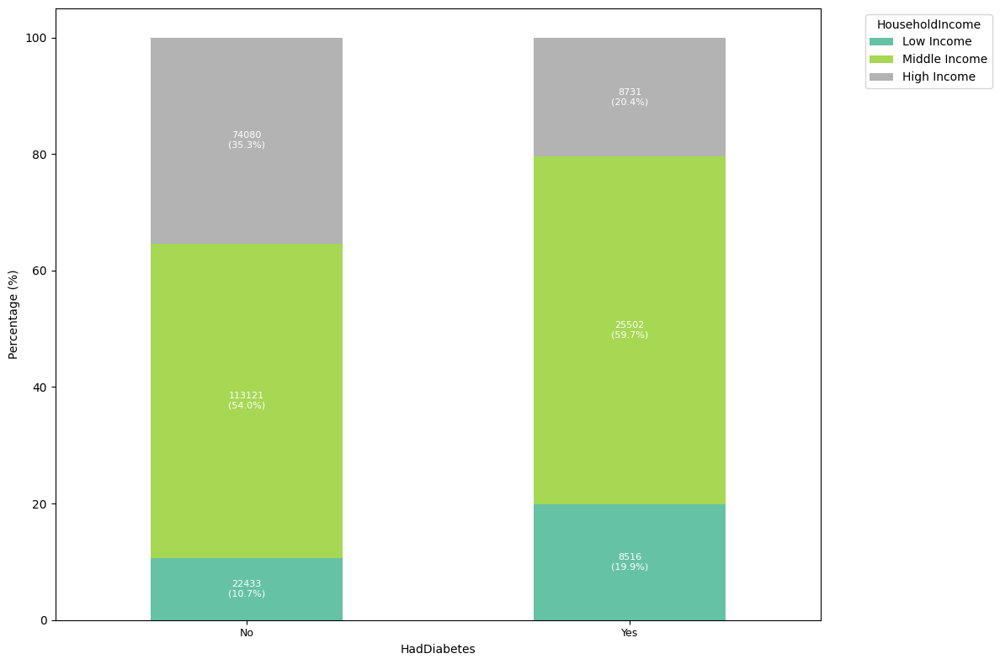

C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\4127212421.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = plot_df.groupby(['HadDiabetes', '__temp__']).size().unstack(fill_value=0)


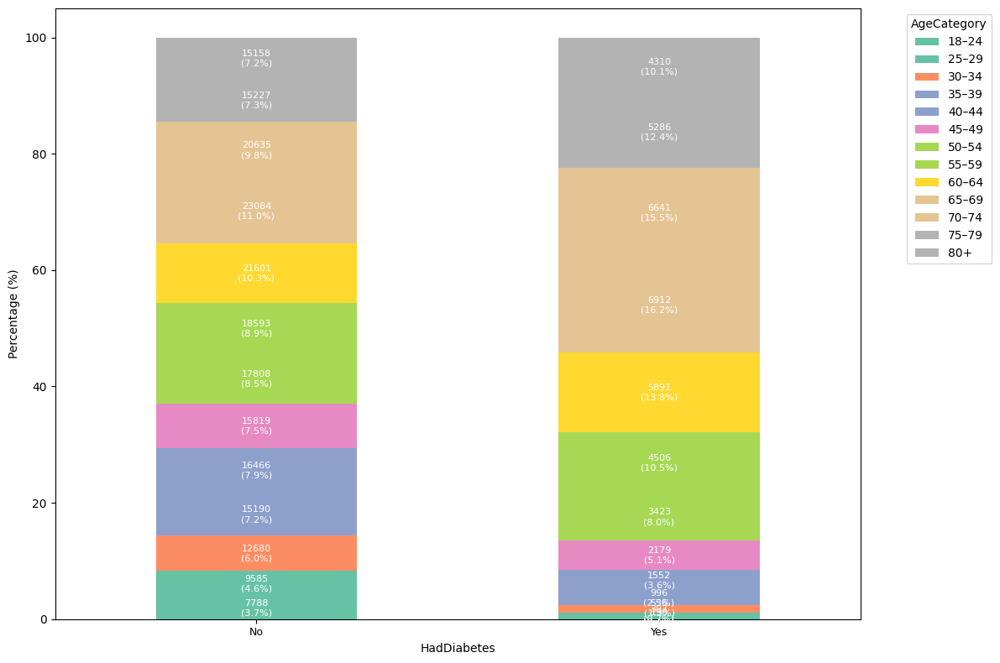

In [48]:
# === Ordinal column config: mappings + order ===
ordinal_config = {
    'BMI': {
        'map': {1: 'Normal', 2: 'Overweight', 3: 'Obese'},
        'order': ['Normal', 'Overweight', 'Obese']
    },
    'GeneralHealth': {
        'map': {1: 'Poor', 2: 'Fair', 3: 'Good', 4: 'Very good', 5: 'Excellent'},
        'order': ['Poor', 'Fair', 'Good', 'Very good', 'Excellent']
    },
    'HouseholdIncome': {
        'map': {1: 'Low Income', 2: 'Middle Income', 3: 'High Income'},
        'order': ['Low Income', 'Middle Income', 'High Income']
    },
    'AgeCategory': {
        'map': {
            21: '18–24', 27: '25–29', 32: '30–34', 37: '35–39',
            42: '40–44', 47: '45–49', 52: '50–54', 57: '55–59',
            62: '60–64', 67: '65–69', 72: '70–74', 77: '75–79', 85: '80+'
        },
        'order': ['18–24', '25–29', '30–34', '35–39', '40–44', '45–49', '50–54',
                  '55–59', '60–64', '65–69', '70–74', '75–79', '80+']
    }
}

# === Ordinal columns to visualize ===
ordinal_cols = list(ordinal_config.keys())

# === Plotting stacked bar charts without altering original columns ===
for col in ordinal_cols:
    col_map = ordinal_config[col]['map']
    col_order = ordinal_config[col]['order']

    # Apply temporary mapping for plotting only
    temp_col = df[col].map(col_map) if col_map else df[col]

    # Convert to categorical with order
    temp_col = pd.Categorical(temp_col, categories=col_order, ordered=True)

    # Combine with HadDiabetes
    plot_df = df.copy()
    plot_df['__temp__'] = temp_col

    # Group + plot
    counts = plot_df.groupby(['HadDiabetes', '__temp__']).size().unstack(fill_value=0)
    counts = counts[col_order]  # enforce order
    percent_counts = counts.div(counts.sum(axis=1), axis=0) * 100

    ax = percent_counts.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='Set2')

    for had_diabetes_class_idx, (had_diabetes_val, row) in enumerate(counts.iterrows()):
        total = row.sum()
        cumulative = 0
        for cat_val in row.index:
            count = row[cat_val]
            if count == 0:
                continue
            percent = (count / total) * 100
            height = percent_counts.loc[had_diabetes_val, cat_val]
            x = had_diabetes_class_idx
            y = cumulative + height / 2
            cumulative += height
            ax.annotate(f'{int(count)}\n({percent:.1f}%)',
                        (x, y),
                        ha='center', va='center', fontsize=8, color='white')

    ax.set_ylabel('Percentage (%)')
    ax.set_xlabel('HadDiabetes')
    # ax.set_title(f'{col} Distribution by Diabetes Status')
    ax.legend(title=col, bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_xticklabels(counts.index.astype(str))
    ax.tick_params(axis='x', labelsize=9, rotation=0)

    plt.tight_layout()
    plt.show()


#### Encoding

In [50]:
# Define columns requiring one-hot encoding explicitly
one_hot_columns = []

# Dynamically identify all binary categorical columns
binary_columns = df.select_dtypes(include=['object']).columns[
    df.select_dtypes(include=['object']).nunique() == 2
]

# Dynamically identify non-binary categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns.difference(
    binary_columns.union(one_hot_columns)
)

# Create a dictionary to store the encoding mappings
encoding_mappings = {}

# Step 1: Map binary categorical columns dynamically (any two unique values)
for col in binary_columns:
    unique_values = df[col].dropna().unique()  # Exclude NaN values
    if len(unique_values) == 2:
        mapping = {val: idx for idx, val in enumerate(sorted(unique_values))}
        df[col] = df[col].map(mapping).astype('uint8')
        encoding_mappings[col] = mapping

# Step 2: Apply Label Encoding to non-binary categorical columns
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    # Store the mapping information
    encoding_mappings[col] = dict(zip(le.classes_, le.transform(le.classes_)))
    df[col] = df[col].astype('uint8')

# Step 3: Apply one-hot encoding to explicitly defined multi-category columns
df = pd.get_dummies(df, columns=one_hot_columns, drop_first=True, dtype='uint8')

# Step 4: Print the encoding mappings for all transformed columns
for col, mapping in encoding_mappings.items():
    print(f'{col} Encoding Mapping:')
    for value, number in mapping.items():
        print(f'{value} = {number}')
    print()

# Display the transformed DataFrame
print(df.head())

Gender Encoding Mapping:
Female = 0
Male = 1

LastCheckupTime Encoding Mapping:
No = 0
Yes = 1

PhysicalActivities Encoding Mapping:
No = 0
Yes = 1

HadHeartAttack Encoding Mapping:
No = 0
Yes = 1

HadHeartDisease Encoding Mapping:
No = 0
Yes = 1

HadStroke Encoding Mapping:
No = 0
Yes = 1

HadAsthma Encoding Mapping:
No = 0
Yes = 1

HadSkinCancer Encoding Mapping:
No = 0
Yes = 1

HadCOPD Encoding Mapping:
No = 0
Yes = 1

HadDepressiveDisorder Encoding Mapping:
No = 0
Yes = 1

HadKidneyDisease Encoding Mapping:
No = 0
Yes = 1

HadArthritis Encoding Mapping:
No = 0
Yes = 1

HadDiabetes Encoding Mapping:
No = 0
Yes = 1

DifficultyWalking Encoding Mapping:
No = 0
Yes = 1

SmokerStatus Encoding Mapping:
No = 0
Yes = 1

ECigaretteUsage Encoding Mapping:
No = 0
Yes = 1

RaceEthnicityCategory Encoding Mapping:
Hispanic = 0
Non-Hispanic = 1

AlcoholDrinkers Encoding Mapping:
No = 0
Yes = 1

HadOtherCancer Encoding Mapping:
No = 0
Yes = 1

EducationLevel Encoding Mapping:
High Education = 0
Low

### Download the dataset for dashboard

In [30]:
df.to_csv('df_final.csv', index=False)

#### Now, df contains label-encoded values for all categorical columns

### Splitting the Dataset as Training and Test Sets

In [52]:
X = df.drop('HadDiabetes', axis=1)
y = df['HadDiabetes']

# Perform stratified train-test split to maintain class proportions
x_train, x_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42, stratify=y
)

# Keeping the old df for reference
x_test_ori = x_test
y_test_ori = y_test

x_train_ori = x_train
y_train_ori = y_train

In [53]:
print("Class distribution in original dataset:")
print(y.value_counts(normalize=True))

print("\nClass distribution in training set:")
print(y_train.value_counts(normalize=True))

print("\nClass distribution in test set:")
print(y_test.value_counts(normalize=True))

Class distribution in original dataset:
HadDiabetes
0    0.830619
1    0.169381
Name: proportion, dtype: float64

Class distribution in training set:
HadDiabetes
0    0.830619
1    0.169381
Name: proportion, dtype: float64

Class distribution in test set:
HadDiabetes
0    0.830616
1    0.169384
Name: proportion, dtype: float64


In [54]:
x_train.columns = x_train.columns.str.replace(' ', '_')
x_test.columns = x_test.columns.str.replace(' ', '_')

In [55]:
print('                      X         y')
print('-'*37)
print('Train data     |', x_train.shape, y_train.shape)
print('Test data      |', x_test.shape, y_test.shape)

                      X         y
-------------------------------------
Train data     | (201906, 28) (201906,)
Test data      | (50477, 28) (50477,)


                       count       mean        std   min   25%   50%   75%  \
PhysicalHealthDays  201906.0   4.313507   8.601961   0.0   0.0   0.0   3.0   
MentalHealthDays    201906.0   4.137683   8.007507   0.0   0.0   0.0   4.0   
AgeCategory         201906.0  57.014016  17.069605  21.0  42.0  57.0  72.0   

                     max  
PhysicalHealthDays  30.0  
MentalHealthDays    30.0  
AgeCategory         85.0  


C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\2276874605.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['HadDiabetes'], y=df[var], palette='Set2')


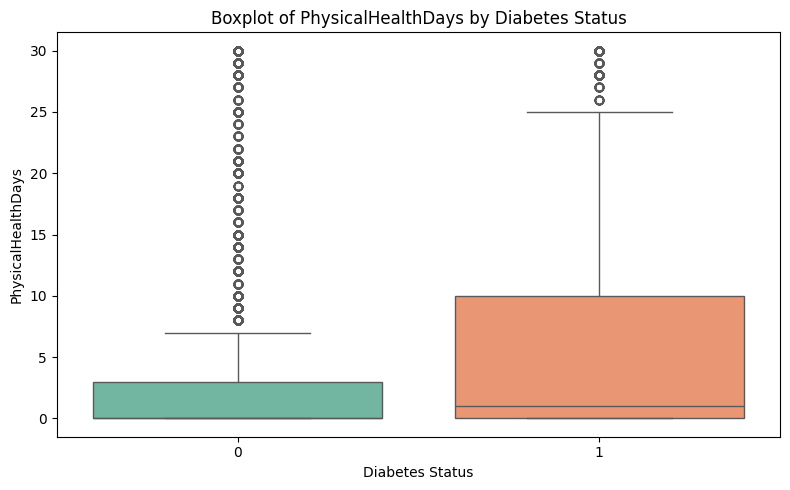

C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\2276874605.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['HadDiabetes'], y=df[var], palette='Set2')


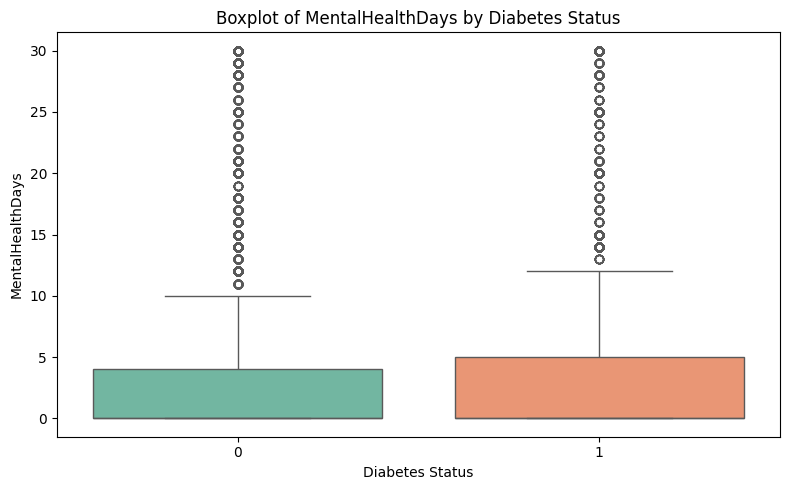

C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\2276874605.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['HadDiabetes'], y=df[var], palette='Set2')


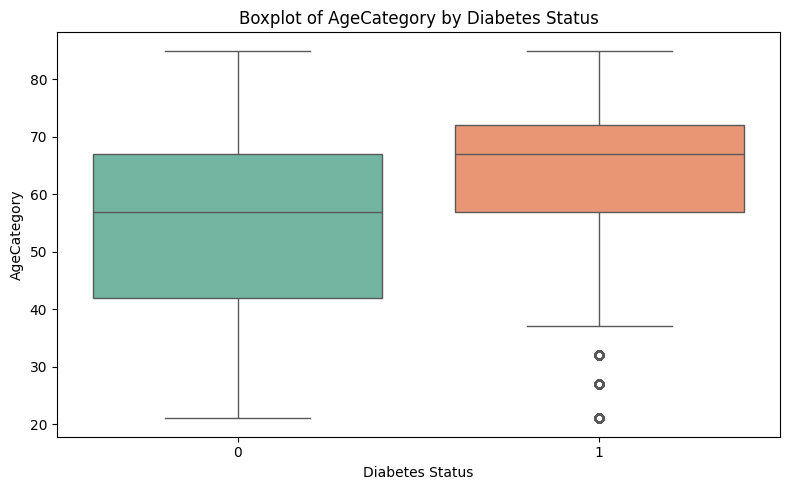

In [56]:
# Display statistical summary for numerical columns
continuous_vars = x_train.select_dtypes(include=['float64']).columns

numerical_summary2 = x_train[continuous_vars].describe().transpose()
print(numerical_summary2)

for var in continuous_vars:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df['HadDiabetes'], y=df[var], palette='Set2')
    plt.title(f'Boxplot of {var} by Diabetes Status')
    plt.xlabel('Diabetes Status')
    plt.ylabel(var)
    plt.tight_layout()
    plt.show()

### Detect outliers from training set

After detecting the outlier, we will remove them from the training set. There are few reasons why we remove only from training set, but not the data as a whole:

   **Real-world Scenario**:
        In real-world scenarios, when deploying a model, it might encounter data with outliers. Training a model on data that mimics real-world conditions (including outliers) can lead to a more robust model.

   **Avoid Leakage**:
        If we remove outliers from the testing set as well, the model might perform artificially well on the testing set, and the evaluation might not accurately represent the model's performance in a real-world setting.
        
   **Data Drift**:
        Outliers may be indicative of data drift or changes in the underlying data distribution. By preserving outliers in the test set, we can assess how well our model generalizes to potential changes in the data.

In [57]:
# Perform outlier removal

def outlier_removal(numerical_cols, x_train, y_train, iqr_factor=1.5):
    is_outlier = pd.Series(False, index=x_train.index)

    for col in numerical_cols:
        Q1 = x_train[col].quantile(0.25)
        Q3 = x_train[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - iqr_factor * IQR
        upper = Q3 + iqr_factor * IQR
        is_outlier |= (x_train[col] < lower) | (x_train[col] > upper)

    x_train_filtered = x_train[~is_outlier]
    y_train_filtered = y_train.loc[x_train_filtered.index]

    ratio_of_outliers = is_outlier.sum() / len(x_train)

    return ratio_of_outliers, x_train_filtered, y_train_filtered

Outliers removed: 23.952%
                       count       mean        std   min   25%   50%   75%  \
PhysicalHealthDays  153545.0   0.808571   1.650692   0.0   0.0   0.0   1.0   
MentalHealthDays    153545.0   1.223986   2.428081   0.0   0.0   0.0   2.0   
AgeCategory         153545.0  57.296493  16.991093  21.0  42.0  57.0  72.0   

                     max  
PhysicalHealthDays   7.0  
MentalHealthDays    10.0  
AgeCategory         85.0  


C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\1951906037.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df.loc[x_train_before.index, 'HadDiabetes'], y=x_train_before[var], palette='Set2', ax=axes[0])
C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\1951906037.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df.loc[x_train.index, 'HadDiabetes'], y=x_train[var], palette='Set3', ax=axes[1])


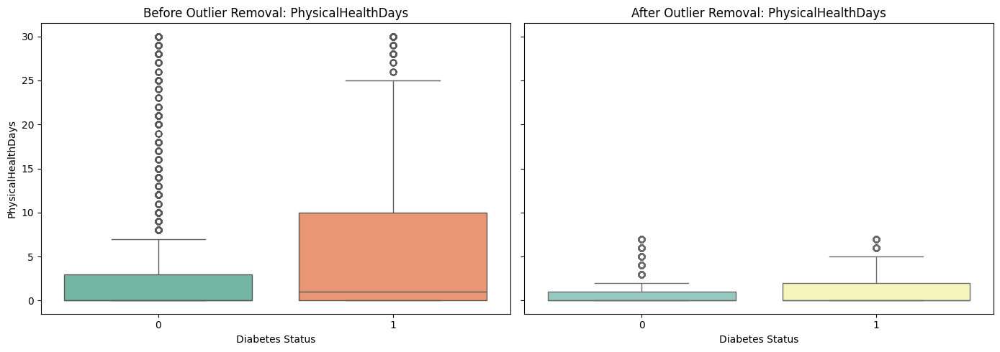

C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\1951906037.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df.loc[x_train_before.index, 'HadDiabetes'], y=x_train_before[var], palette='Set2', ax=axes[0])
C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\1951906037.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df.loc[x_train.index, 'HadDiabetes'], y=x_train[var], palette='Set3', ax=axes[1])


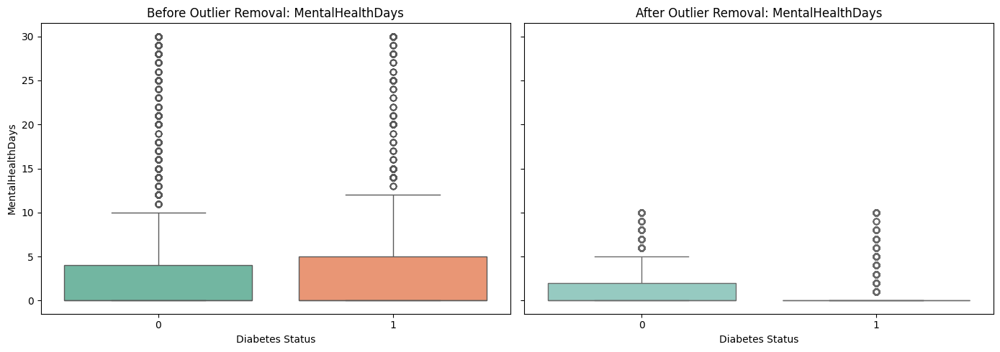

C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\1951906037.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df.loc[x_train_before.index, 'HadDiabetes'], y=x_train_before[var], palette='Set2', ax=axes[0])
C:\Users\sherm\AppData\Local\Temp\ipykernel_13116\1951906037.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df.loc[x_train.index, 'HadDiabetes'], y=x_train[var], palette='Set3', ax=axes[1])


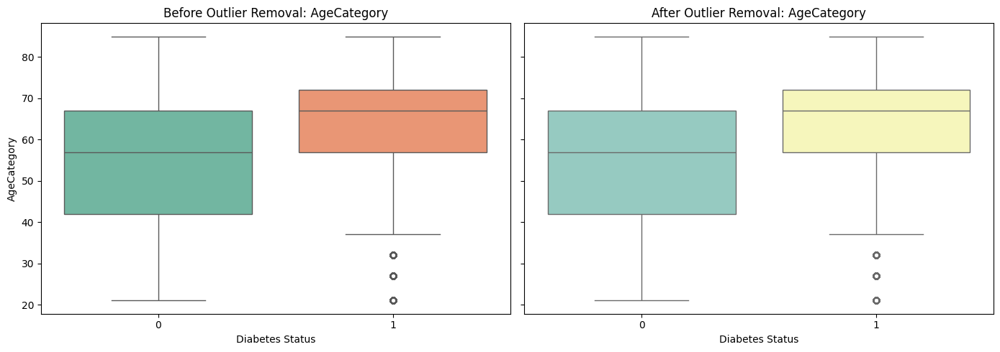

In [58]:
# Backup original x_train before outlier removal
x_train_before = x_train.copy()

numerical_cols = x_train.select_dtypes(include=['float64']).columns

# Perform outlier removal (e.g., using IQR method)
ratio_of_outliers, x_train, y_train = outlier_removal(numerical_cols, x_train, y_train)

print(f"Outliers removed: {ratio_of_outliers:.3%}")

# Display statistical summary for numerical columns
continuous_vars = x_train.select_dtypes(include=['float64']).columns

numerical_summary2 = x_train[continuous_vars].describe().transpose()
print(numerical_summary2)

# Boxplot comparison: Before vs After
for var in continuous_vars:
    fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

    # Before removal
    sns.boxplot(x=df.loc[x_train_before.index, 'HadDiabetes'], y=x_train_before[var], palette='Set2', ax=axes[0])
    axes[0].set_title(f"Before Outlier Removal: {var}")
    axes[0].set_xlabel("Diabetes Status")
    axes[0].set_ylabel(var)

    # After removal
    sns.boxplot(x=df.loc[x_train.index, 'HadDiabetes'], y=x_train[var], palette='Set3', ax=axes[1])
    axes[1].set_title(f"After Outlier Removal: {var}")
    axes[1].set_xlabel("Diabetes Status")
    axes[1].set_ylabel(var)

    plt.tight_layout()
    plt.show()

In [59]:
x_train = x_train[x_test.columns]

In [60]:
print('                      X         y')
print('-'*37)
print('Train data     |', x_train.shape, y_train.shape)
print('Test data      |', x_test.shape, y_test.shape)

                      X         y
-------------------------------------
Train data     | (153545, 28) (153545,)
Test data      | (50477, 28) (50477,)


### Baseline model without feature selection

In [101]:
# Create a dictionary of classifiers
model_dict = {
    'DecisionTreeClassifier': DecisionTreeClassifier(random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000, random_state=42),
    'XGBoost': XGBClassifier(random_state=42),
    'RandomForestClassifier': RandomForestClassifier(random_state=42),
    'KNN': KNeighborsClassifier(),
    'NeuralNetwork': MLPClassifier(max_iter=1000, random_state=42),  # Neural Network
    'GradientBoosting': GradientBoostingClassifier(random_state=42),  # Gradient Boosting
    'AdaBoost': AdaBoostClassifier(random_state=42),  # Adaptive Boosting
    'LightGBM': LGBMClassifier(random_state=42),  # LightGBM
    # 'CatBoost': CatBoostClassifier(verbose=0, random_state=42)  # CatBoost
}

Training and Evaluating: DecisionTreeClassifier

Classification Report for DecisionTreeClassifier:
              precision    recall  f1-score   support

           0       0.86      0.86      0.86     41927
           1       0.32      0.34      0.33      8550

    accuracy                           0.77     50477
   macro avg       0.59      0.60      0.59     50477
weighted avg       0.77      0.77      0.77     50477



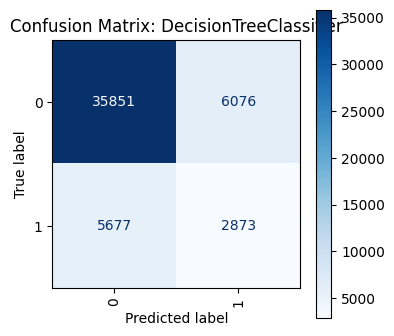

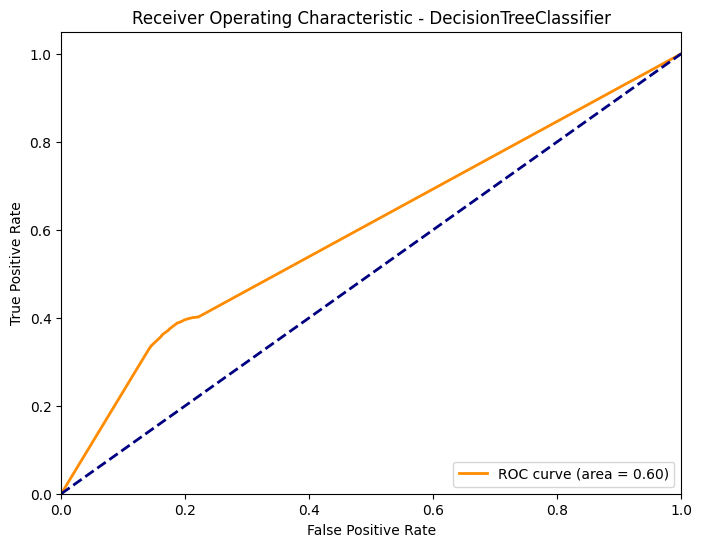

Training and Evaluating: LogisticRegression

Classification Report for LogisticRegression:
              precision    recall  f1-score   support

           0       0.85      0.97      0.91     41927
           1       0.56      0.19      0.29      8550

    accuracy                           0.84     50477
   macro avg       0.71      0.58      0.60     50477
weighted avg       0.80      0.84      0.80     50477



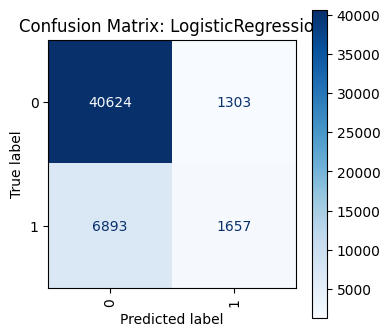

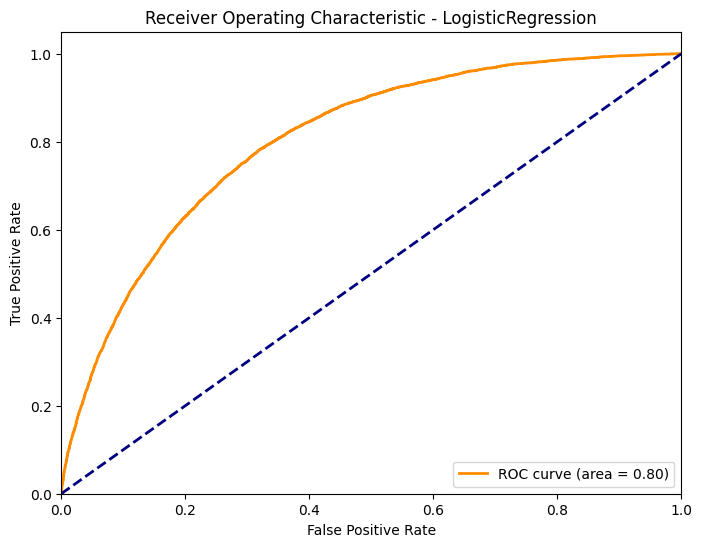

Training and Evaluating: XGBoost

Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.86      0.96      0.91     41927
           1       0.54      0.23      0.32      8550

    accuracy                           0.84     50477
   macro avg       0.70      0.59      0.61     50477
weighted avg       0.81      0.84      0.81     50477



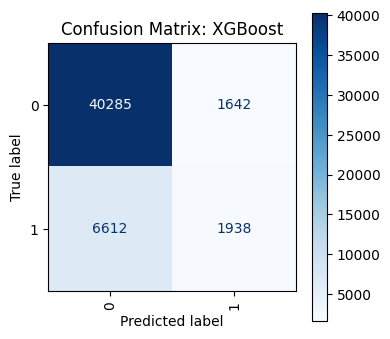

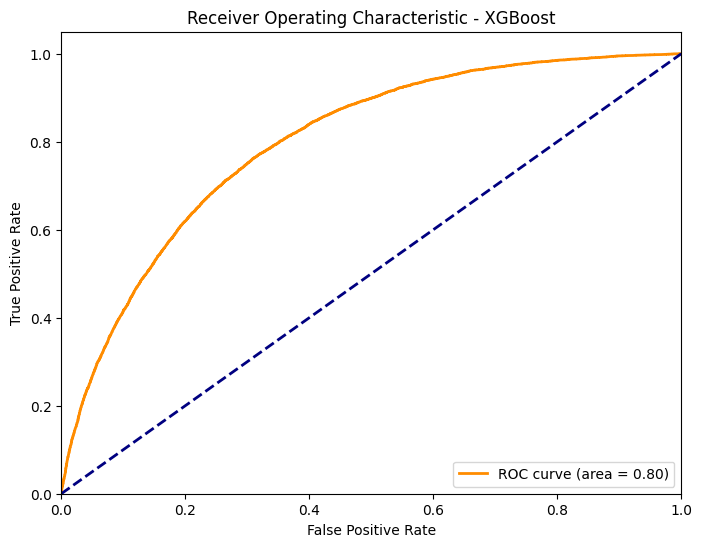

Training and Evaluating: RandomForestClassifier

Classification Report for RandomForestClassifier:
              precision    recall  f1-score   support

           0       0.86      0.95      0.90     41927
           1       0.48      0.22      0.30      8550

    accuracy                           0.83     50477
   macro avg       0.67      0.59      0.60     50477
weighted avg       0.79      0.83      0.80     50477



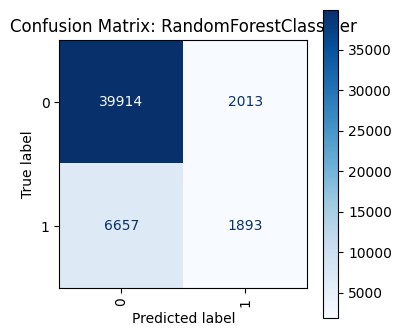

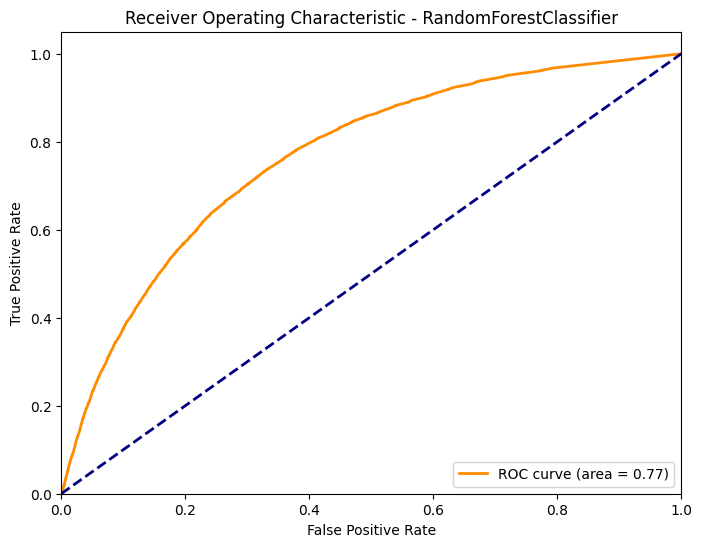

Training and Evaluating: KNN

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90     41927
           1       0.42      0.18      0.25      8550

    accuracy                           0.82     50477
   macro avg       0.63      0.56      0.57     50477
weighted avg       0.78      0.82      0.79     50477



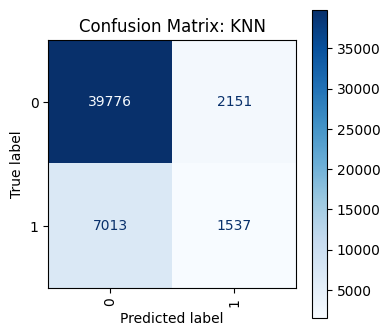

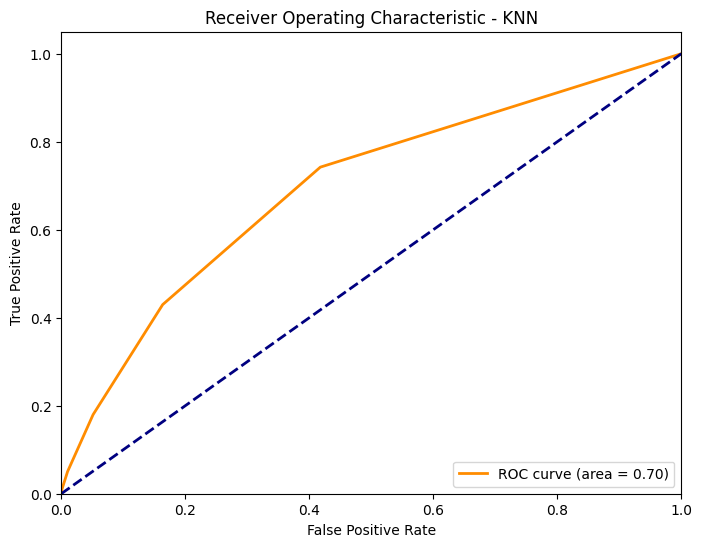

Training and Evaluating: NeuralNetwork

Classification Report for NeuralNetwork:
              precision    recall  f1-score   support

           0       0.85      0.98      0.91     41927
           1       0.55      0.14      0.23      8550

    accuracy                           0.83     50477
   macro avg       0.70      0.56      0.57     50477
weighted avg       0.80      0.83      0.79     50477



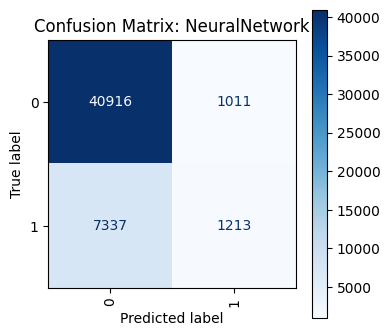

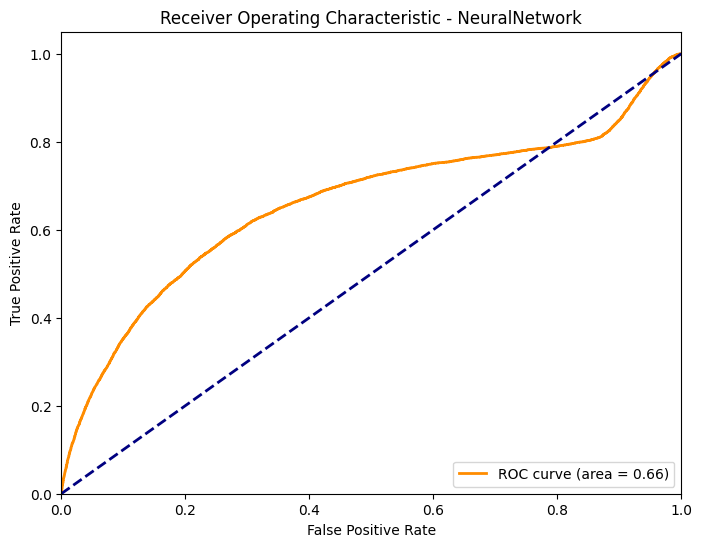

Training and Evaluating: GradientBoosting

Classification Report for GradientBoosting:
              precision    recall  f1-score   support

           0       0.86      0.97      0.91     41927
           1       0.58      0.21      0.31      8550

    accuracy                           0.84     50477
   macro avg       0.72      0.59      0.61     50477
weighted avg       0.81      0.84      0.81     50477



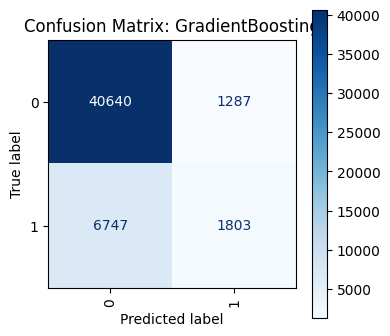

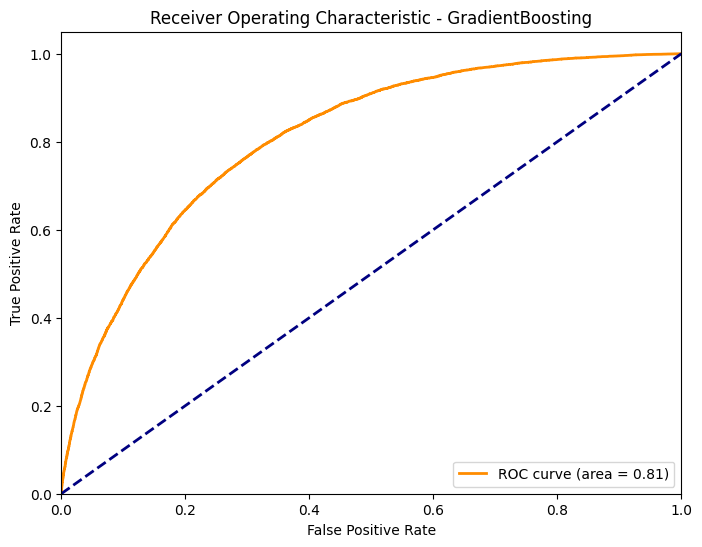

Training and Evaluating: AdaBoost

Classification Report for AdaBoost:
              precision    recall  f1-score   support

           0       0.86      0.97      0.91     41927
           1       0.56      0.22      0.31      8550

    accuracy                           0.84     50477
   macro avg       0.71      0.59      0.61     50477
weighted avg       0.81      0.84      0.81     50477



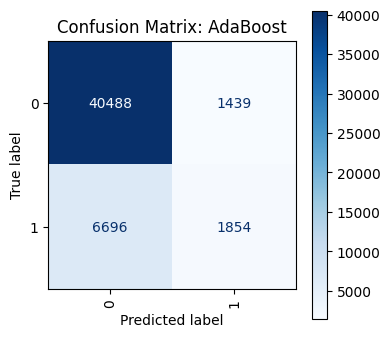

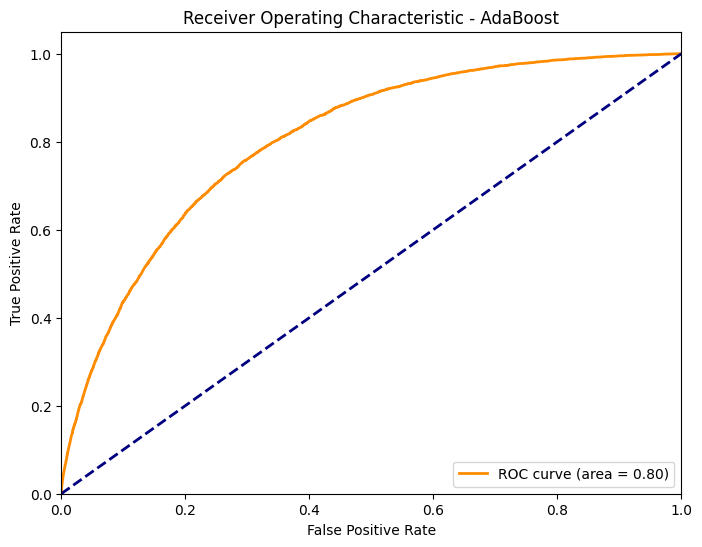

Training and Evaluating: LightGBM
[LightGBM] [Info] Number of positive: 22443, number of negative: 131102
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.043793 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 91
[LightGBM] [Info] Number of data points in the train set: 153545, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.146166 -> initscore=-1.764997
[LightGBM] [Info] Start training from score -1.764997

Classification Report for LightGBM:
              precision    recall  f1-score   support

           0       0.86      0.97      0.91     41927
           1       0.59      0.21      0.30      8550

    accuracy                           0.84     50477
   macro avg       0.72      0.59      0.61     50477
weighted avg       0.81      0.84      0.81     50477



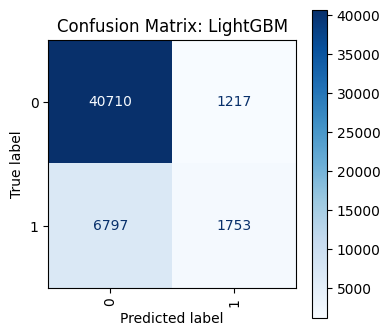

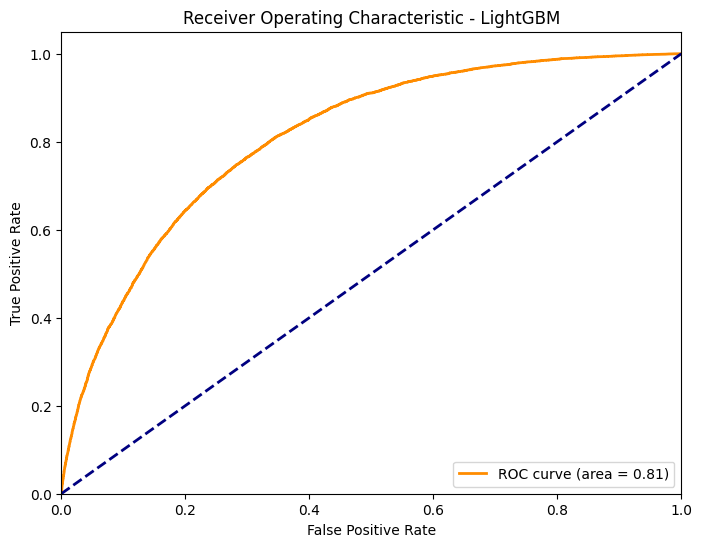

In [44]:
# Iterate over the models in the dictionary
for model_name, model in model_dict.items():
    print(f"Training and Evaluating: {model_name}")

    try:
        # Train the model on the entire training set
        model.fit(x_train, y_train)

        # Predict on the test set
        y_pred = model.predict(x_test)

        # Print classification report
        report = classification_report(y_test, y_pred, zero_division=0)
        print(f"\nClassification Report for {model_name}:\n{report}")

        # Compute confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)

        # Visualize the confusion matrix
        fig, ax = plt.subplots(figsize=(4, 4))
        ConfusionMatrixDisplay(conf_matrix, display_labels=model.classes_).plot(
            ax=ax, cmap='Blues', xticks_rotation='vertical', values_format='.0f'
        )
        plt.title(f'Confusion Matrix: {model_name}')
        plt.show()

        # Try predicting probabilities (if the model supports it)
        if hasattr(model, "predict_proba"):
            y_probs = model.predict_proba(x_test)[:, 1]  # Probabilities of positive class

            # Plot ROC curve
            fpr, tpr, _ = roc_curve(y_test, y_probs)
            roc_auc = auc(fpr, tpr)
            plt.figure(figsize=(8, 6))
            plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic - {model_name}')
            plt.legend(loc="lower right")
            plt.show()
        else:
            print(f"{model_name} does not support probability predictions.\n")

    except Exception as e:
        print(f"An error occurred with {model_name}: {e}\n")


### Feature Selection

#### Dropping features with VarianceThreshold < 0.05

['LastCheckupTime',
 'HadHeartAttack',
 'HadHeartDisease',
 'HadStroke',
 'HadCOPD',
 'HadKidneyDisease',
 'ECigaretteUsage',
 'HadInsurance']

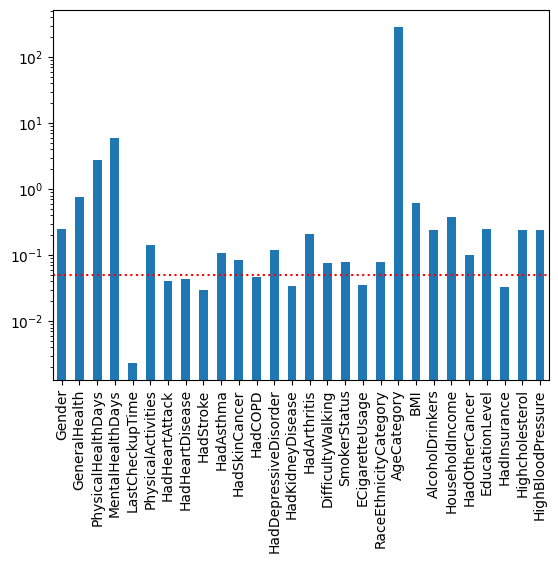

In [43]:
variance_threshold = 0.05
selection = VarianceThreshold(threshold=variance_threshold)
selection.fit(x_train)

ax = pd.Series(selection.variances_, index=x_train.columns).plot(kind='bar', logy=True)
ax.axhline(variance_threshold, ls='dotted', c='r')

# Get the boolean mask of features with variance less than the threshold
features_below_threshold = ~selection.get_support()

# Print the list of features with variance less than the threshold
selected_features = x_train.columns[features_below_threshold].tolist()
selected_features

#### Individual Significance Testing

In [44]:
# Define the list of ordinal columns
ordinal_cols = x_train.select_dtypes(include=['int64'])

# Define the target column
target_col = 'HadDiabetes'

# Exclude numerical_cols and ordinal_cols from all columns
all_cols = x_train.columns.tolist()
category_cols = [col for col in all_cols if col not in numerical_cols and col not in ordinal_cols]

# Create an empty dictionary to store p-values
p_values = {}

# Perform chi-square test for each categorical variable
for col in category_cols:
    # Create a contingency table
    contingency_table = pd.crosstab(x_train[col], y_train)

    # Perform chi-square test
    chi2, p, _, _ = chi2_contingency(contingency_table)

    # Store the p-value in the dictionary
    p_values[col] = p

# Create a DataFrame from the p-values dictionary
result_df_train = pd.DataFrame(list(p_values.items()), columns=['Categorical Variable', 'p-value'])

# Add a column indicating significance based on a threshold (e.g., 0.05)
result_df_train['Significance'] = result_df_train['p-value'].apply(lambda p: 'Significant' if p < 0.05 else 'Not significant')

# Display the resulting DataFrame for x_train
print("Chi-square test results for x_train:")
print(result_df_train)


Chi-square test results for x_train:
     Categorical Variable        p-value     Significance
0                  Gender   1.133836e-45      Significant
1         LastCheckupTime   1.488916e-06      Significant
2      PhysicalActivities   0.000000e+00      Significant
3          HadHeartAttack   0.000000e+00      Significant
4         HadHeartDisease   0.000000e+00      Significant
5               HadStroke  7.108090e-217      Significant
6               HadAsthma   2.505917e-24      Significant
7           HadSkinCancer   2.532603e-06      Significant
8                 HadCOPD  9.909925e-140      Significant
9   HadDepressiveDisorder   2.695243e-11      Significant
10       HadKidneyDisease   0.000000e+00      Significant
11           HadArthritis   0.000000e+00      Significant
12      DifficultyWalking   0.000000e+00      Significant
13           SmokerStatus   1.774274e-01  Not significant
14        ECigaretteUsage   3.423756e-27      Significant
15  RaceEthnicityCategory   7.69591

In [45]:
from scipy.stats import ttest_ind

# for numerical variables
numerical_cols = x_train.select_dtypes(include=['float64']).columns

target_col = 'HadDiabetes'

# Create an empty DataFrame to store results
combined_results_df = pd.DataFrame(columns=['Variable', 't-Statistic', 'p-Value (t-test)', 'Significance (t-test)',
#                                              'Point-Biserial Correlation', 'p-Value (Point-Biserial)', 'Significance (Point-Biserial)'
                                           ])

for col in numerical_cols:
    # Split the training data based on the target variable
    group_0_train = x_train[y_train == 0][col]
    group_1_train = x_train[y_train == 1][col]

    # Perform t-test on the training data
    t_stat, p_value_ttest = ttest_ind(group_0_train, group_1_train, equal_var=False)  # Assuming unequal variances

    # Determine significance for t-test
    significance_ttest = "Significant" if p_value_ttest < 0.05 else "Not significant"

    # Create a DataFrame for the current result
    result_df = pd.DataFrame({'Variable': [col],
                              't-Statistic': [t_stat],
                              'p-Value (t-test)': [p_value_ttest],
                              'Significance (t-test)': [significance_ttest],
#                               'Point-Biserial Correlation': [pb_corr],
#                               'p-Value (Point-Biserial)': [p_value_pb],
#                               'Significance (Point-Biserial)': [significance_pb]
                             })

    # Concatenate the current result with the overall results DataFrame
    combined_results_df = pd.concat([combined_results_df, result_df], ignore_index=True)

# Display the combined results DataFrame
print(combined_results_df)


             Variable  t-Statistic  p-Value (t-test) Significance (t-test)
0  PhysicalHealthDays   -16.645718      6.334877e-62           Significant
1    MentalHealthDays    18.171028      2.020874e-73           Significant
2         AgeCategory   -90.824555      0.000000e+00           Significant


C:\Users\sherm\AppData\Local\Temp\ipykernel_15952\4086595488.py:35: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  combined_results_df = pd.concat([combined_results_df, result_df], ignore_index=True)


In [46]:
from scipy.stats import mannwhitneyu

# Define the list of ordinal columns
ordinal_cols = x_train.select_dtypes(include=['int64'])

# Create an empty DataFrame to store results for ordinal variables
results_df_ordinal = pd.DataFrame(columns=['Ordinal Variable', 'Test', 'Statistic', 'p-Value', 'Significance'])

# Perform Mann-Whitney U test for ordinal variables
for col in ordinal_cols:
    # Group data by the ordinal variable and get values for each group
    groups_1 = x_train[y_train == 1][col]
    groups_0 = x_train[y_train == 0][col]

    # Perform Mann-Whitney U test
    u_statistic, p_value = mannwhitneyu(groups_1, groups_0, alternative='two-sided')

    # Determine significance
    significance = 'Significant' if p_value < 0.05 else 'Not significant'

    # Store the results in the DataFrame
    result = pd.DataFrame({
        'Ordinal Variable': [col],
        'Test': ['Mann-Whitney U test'],
        'Statistic': [u_statistic],
        'p-Value': [p_value],
        'Significance': [significance]
    })

    results_df_ordinal = pd.concat([results_df_ordinal, result], ignore_index=True)

# Display the results DataFrame for ordinal variables
print("Mann-Whitney U test results for ordinal variables in x_train:")
print(results_df_ordinal)


C:\Users\sherm\AppData\Local\Temp\ipykernel_15952\1403858783.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df_ordinal = pd.concat([results_df_ordinal, result], ignore_index=True)


Mann-Whitney U test results for ordinal variables in x_train:
  Ordinal Variable                 Test     Statistic  p-Value Significance
0    GeneralHealth  Mann-Whitney U test  9.246319e+08      0.0  Significant
1              BMI  Mann-Whitney U test  1.861725e+09      0.0  Significant
2  HouseholdIncome  Mann-Whitney U test  1.223350e+09      0.0  Significant


In [47]:
x_train = x_train.drop(['SmokerStatus'], axis = 1)
x_test = x_test.drop(['SmokerStatus'], axis = 1)

#### Correlation Matrix

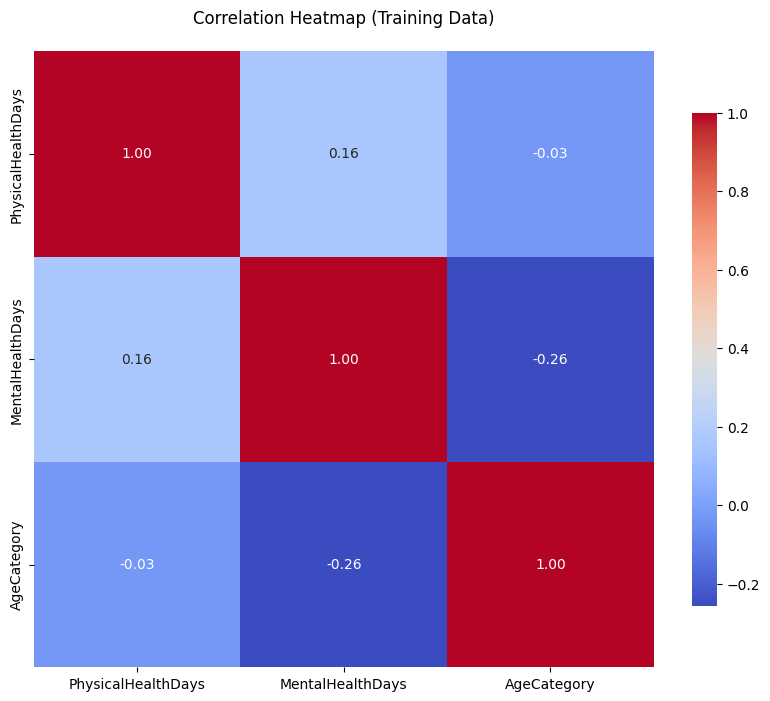

In [48]:
# Display the correlation matrix as a heatmap

# Filter columns with data types int64 or float64 from df
numerical_cols_train = x_train.select_dtypes(include=['float64'])

# Create correlation matrix
correlation_matrix_train = numerical_cols_train.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
heatmap_train = sns.heatmap(correlation_matrix_train, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={'size': 10}, cbar_kws={'shrink': 0.8})
heatmap_train.set_title('Correlation Heatmap (Training Data)', pad=20)
plt.show()

### Find optimal k features

In [51]:
model_rfe_results = {}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Model groups
rfecv_models = ["RandomForestClassifier", "XGBoost", "GradientBoosting", "AdaBoost", "LightGBM", "DecisionTreeClassifier"]

# ✅ Scoring method
scoring_metric = 'roc_auc'  # or 'f1', 'average_precision', etc.

# ✅ Output folder
os.makedirs("feature_selection_outputs", exist_ok=True)

# ✅ Loop through each model
for model_name, model in model_dict.items():
    print(f"\n🔎 Evaluating Model: {model_name}")

    if model_name in rfecv_models:
        print(f"✅ Running RFECV for {model_name}...")

        rfecv = RFECV(
            estimator=model,
            cv=cv,
            scoring=scoring_metric,
            n_jobs=-1
        )
        rfecv.fit(x_train, y_train)

        selected_features = x_train.columns[rfecv.support_]
        print(f"✅ {model_name} RFECV Selected Features ({rfecv.n_features_}): {list(selected_features)}\n")

        # Evaluate on test set
        model.fit(x_train[selected_features], y_train)
        y_pred_proba = model.predict_proba(x_test[selected_features])[:, 1]
        auc_score = roc_auc_score(y_test, y_pred_proba)

        model_rfe_results[model_name] = {
            'method': 'RFECV',
            'feature_count': rfecv.n_features_,
            'selected_features': list(selected_features),
            'test_auc': auc_score,
            'feature_importance': None  # Not applicable here
        }

    else:
        print(f"✅ Running Permutation Importance for {model_name}...")
        model.fit(x_train, y_train)

        if model_name == 'KNN':
            repeats = 3
            x_sample = x_train.sample(frac=0.3, random_state=42)
            y_sample = y_train.loc[x_sample.index]
            print(f"⚠️ Sampling applied for {model_name}, sample size: {x_sample.shape}")
        else:
            repeats = 10
            x_sample = x_train
            y_sample = y_train

        perm_result = permutation_importance(
            model, x_sample, y_sample, scoring=scoring_metric,
            n_repeats=repeats, random_state=42, n_jobs=-1
        )

        perm_importance = pd.Series(perm_result.importances_mean, index=x_train.columns)
        perm_selected = perm_importance[perm_importance > 0].sort_values(ascending=False)

        print(f"✅ {model_name} Permutation Selected Features ({len(perm_selected)}): {list(perm_selected.index)}\n")

        # Evaluate on test set
        model.fit(x_train[perm_selected.index], y_train)
        y_pred_proba = model.predict_proba(x_test[perm_selected.index])[:, 1]
        auc_score = roc_auc_score(y_test, y_pred_proba)

        model_rfe_results[model_name] = {
            'method': 'Permutation',
            'feature_count': len(perm_selected),
            'selected_features': list(perm_selected.index),
            'test_auc': auc_score,
            'feature_importance': perm_selected.to_dict()
        }

# ✅ Final summary DataFrame
rfe_summary = pd.DataFrame([
    {
        'Model': model,
        'Method': data['method'],
        'Feature Count': data['feature_count'],
        'Test ROC-AUC': round(data['test_auc'], 4),
        'Top Features': ', '.join(data['selected_features'][:5]) + ('...' if len(data['selected_features']) > 5 else '')
    }
    for model, data in model_rfe_results.items()
])

print("\n🔹 Feature Selection Summary Across Models:")
print(rfe_summary)


🔎 Evaluating Model: DecisionTreeClassifier
✅ Running RFECV for DecisionTreeClassifier...
✅ DecisionTreeClassifier RFECV Selected Features (3): ['GeneralHealth', 'AgeCategory', 'HighBloodPressure']


🔎 Evaluating Model: LogisticRegression
✅ Running Permutation Importance for LogisticRegression...
✅ LogisticRegression Permutation Selected Features (18): ['GeneralHealth', 'AgeCategory', 'BMI', 'HighBloodPressure', 'Highcholesterol', 'AlcoholDrinkers', 'Gender', 'RaceEthnicityCategory', 'PhysicalActivities', 'HadSkinCancer', 'DifficultyWalking', 'MentalHealthDays', 'HouseholdIncome', 'EducationLevel', 'HadDepressiveDisorder', 'HadAsthma', 'HadOtherCancer', 'PhysicalHealthDays']


🔎 Evaluating Model: XGBoost
✅ Running RFECV for XGBoost...
✅ XGBoost RFECV Selected Features (11): ['Gender', 'GeneralHealth', 'PhysicalActivities', 'DifficultyWalking', 'RaceEthnicityCategory', 'AgeCategory', 'BMI', 'AlcoholDrinkers', 'HouseholdIncome', 'Highcholesterol', 'HighBloodPressure']


🔎 Evaluating Mode

In [52]:
rfe_summary.to_csv(r"C:\Users\sherm\OneDrive\Documents\P2\feature_selection_summary.csv", index=False)

In [53]:
from collections import Counter

# Flatten all selected feature lists into one
all_selected = sum([v['selected_features'] for v in model_rfe_results.values()], [])

# Count occurrences of each feature
feature_counts = Counter(all_selected)

# Keep features that appear in all models
final_features = [f for f, count in feature_counts.items() if count >= 7 ]
print("Final Consensus Features:", final_features)

Final Consensus Features: ['GeneralHealth', 'AgeCategory', 'HighBloodPressure', 'BMI', 'Highcholesterol', 'AlcoholDrinkers', 'Gender', 'RaceEthnicityCategory', 'PhysicalActivities', 'DifficultyWalking', 'HouseholdIncome']


In [62]:
final_features = ['GeneralHealth', 'AgeCategory', 'HighBloodPressure', 'BMI', 'Highcholesterol', 'AlcoholDrinkers', 'Gender', 'RaceEthnicityCategory', 'PhysicalActivities', 'DifficultyWalking', 'HouseholdIncome']

In [63]:
len(final_features)

11

In [64]:
# ✅ Final feature-reduced dataset
x_train = x_train[list(final_features)].copy()
x_test = x_test[list(final_features)].copy()

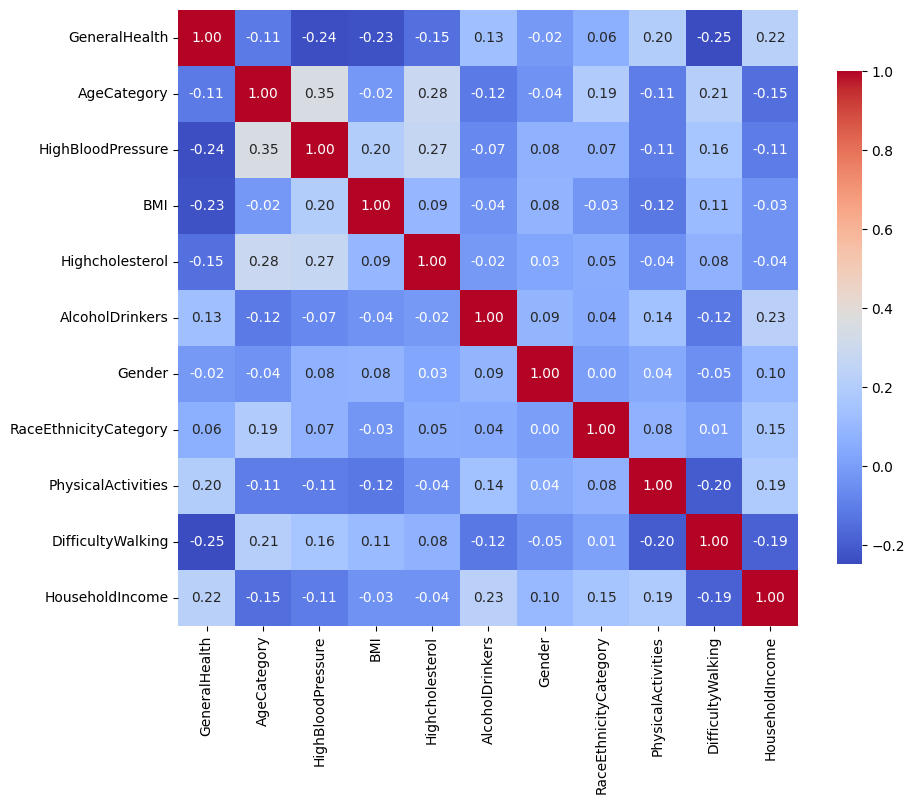

In [66]:
# Display the correlation matrix as a heatmap

# Create correlation matrix
correlation_matrix_train = x_train.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
heatmap_train = sns.heatmap(correlation_matrix_train, annot=True, cmap='coolwarm', fmt='.2f', annot_kws={'size': 10}, cbar_kws={'shrink': 0.8})
# heatmap_train.set_title('Correlation Heatmap (Training Data)', pad=20)
plt.show()

### Baseline model after feature selection without SMOTE

Training and Evaluating: DecisionTreeClassifier

Classification Report for DecisionTreeClassifier:
              precision    recall  f1-score   support

           0       0.85      0.94      0.90     41927
           1       0.43      0.21      0.29      8550

    accuracy                           0.82     50477
   macro avg       0.64      0.58      0.59     50477
weighted avg       0.78      0.82      0.79     50477



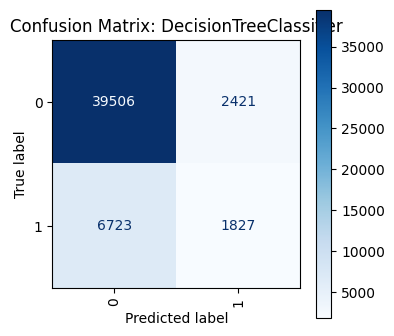

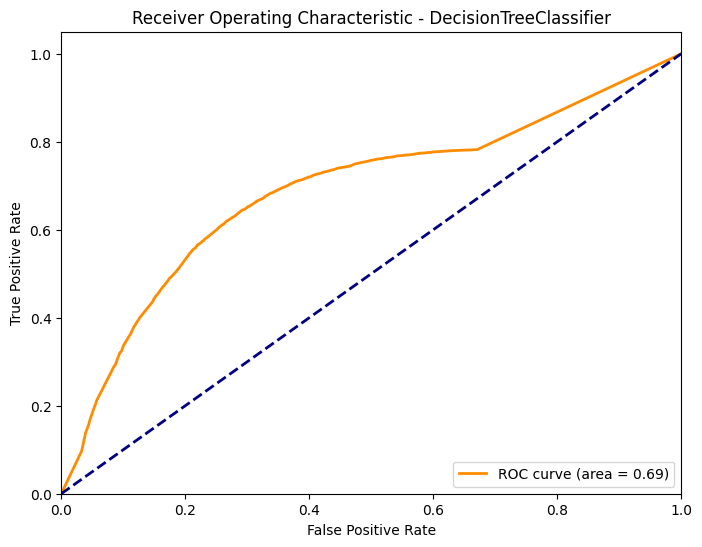

Training and Evaluating: LogisticRegression

Classification Report for LogisticRegression:
              precision    recall  f1-score   support

           0       0.86      0.96      0.91     41927
           1       0.54      0.22      0.31      8550

    accuracy                           0.84     50477
   macro avg       0.70      0.59      0.61     50477
weighted avg       0.80      0.84      0.81     50477



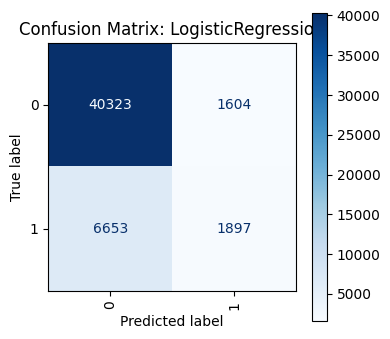

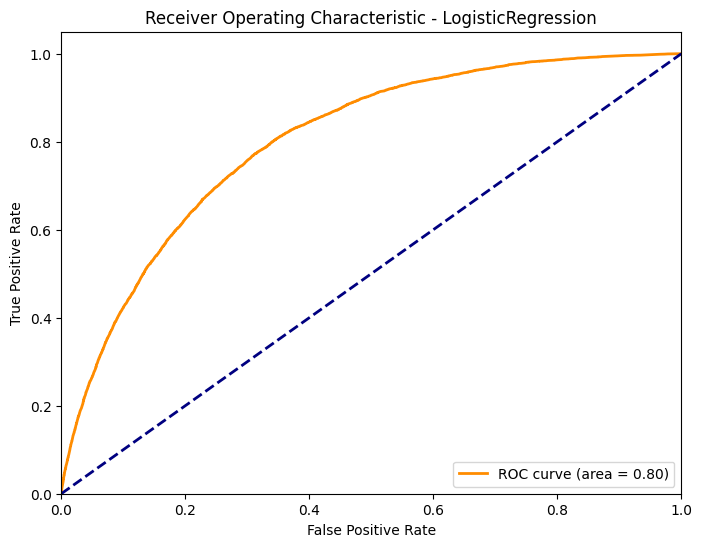

Training and Evaluating: XGBoost

Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       0.86      0.96      0.91     41927
           1       0.55      0.21      0.30      8550

    accuracy                           0.84     50477
   macro avg       0.70      0.59      0.61     50477
weighted avg       0.80      0.84      0.81     50477



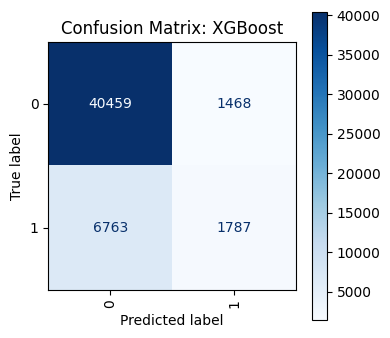

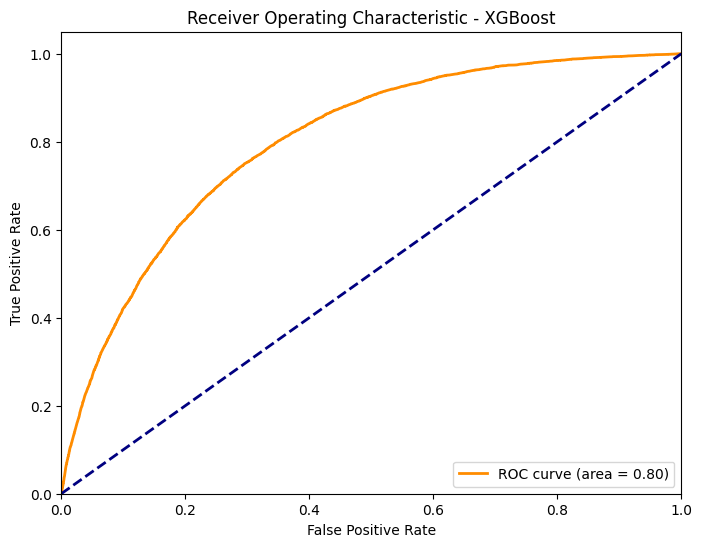

Training and Evaluating: RandomForestClassifier

Classification Report for RandomForestClassifier:
              precision    recall  f1-score   support

           0       0.86      0.94      0.90     41927
           1       0.45      0.24      0.31      8550

    accuracy                           0.82     50477
   macro avg       0.65      0.59      0.60     50477
weighted avg       0.79      0.82      0.80     50477



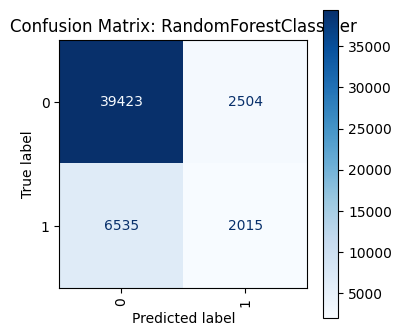

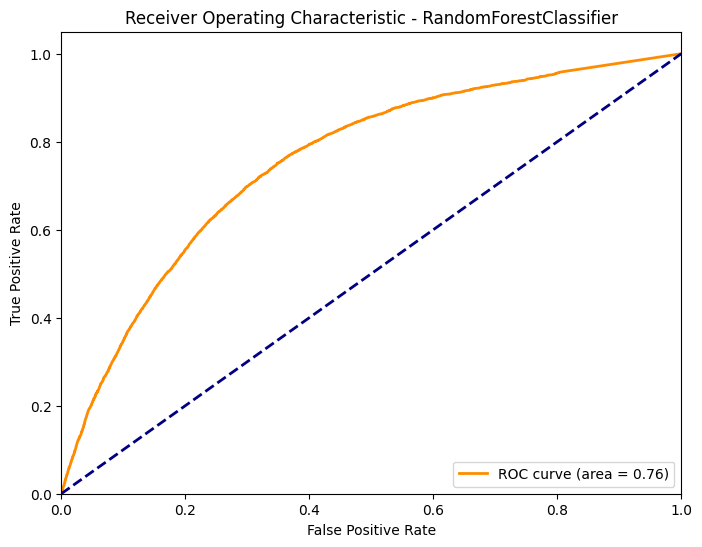

Training and Evaluating: KNN

Classification Report for KNN:
              precision    recall  f1-score   support

           0       0.86      0.93      0.89     41927
           1       0.43      0.26      0.33      8550

    accuracy                           0.82     50477
   macro avg       0.65      0.60      0.61     50477
weighted avg       0.79      0.82      0.80     50477



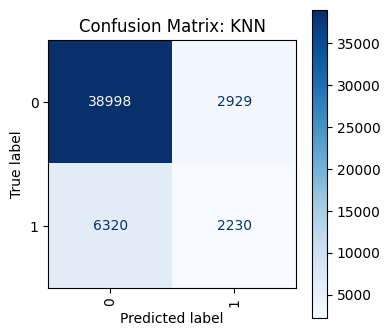

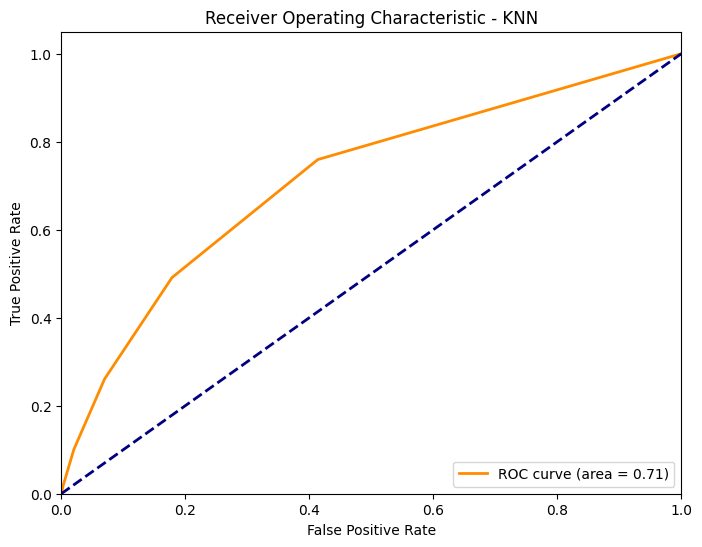

Training and Evaluating: NeuralNetwork

Classification Report for NeuralNetwork:
              precision    recall  f1-score   support

           0       0.86      0.95      0.91     41927
           1       0.54      0.26      0.35      8550

    accuracy                           0.84     50477
   macro avg       0.70      0.61      0.63     50477
weighted avg       0.81      0.84      0.81     50477



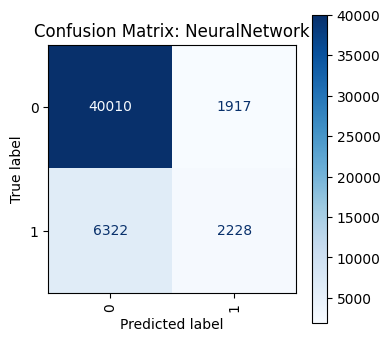

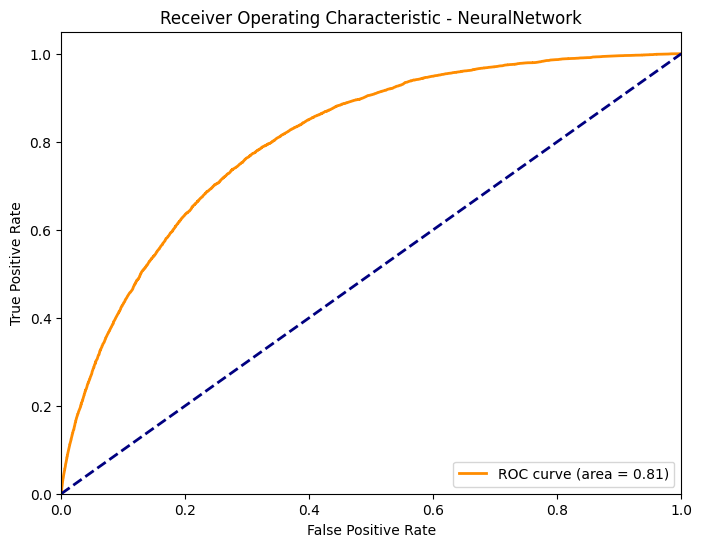

Training and Evaluating: GradientBoosting

Classification Report for GradientBoosting:
              precision    recall  f1-score   support

           0       0.86      0.97      0.91     41927
           1       0.57      0.21      0.31      8550

    accuracy                           0.84     50477
   macro avg       0.71      0.59      0.61     50477
weighted avg       0.81      0.84      0.81     50477



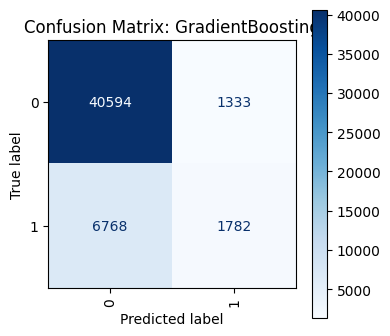

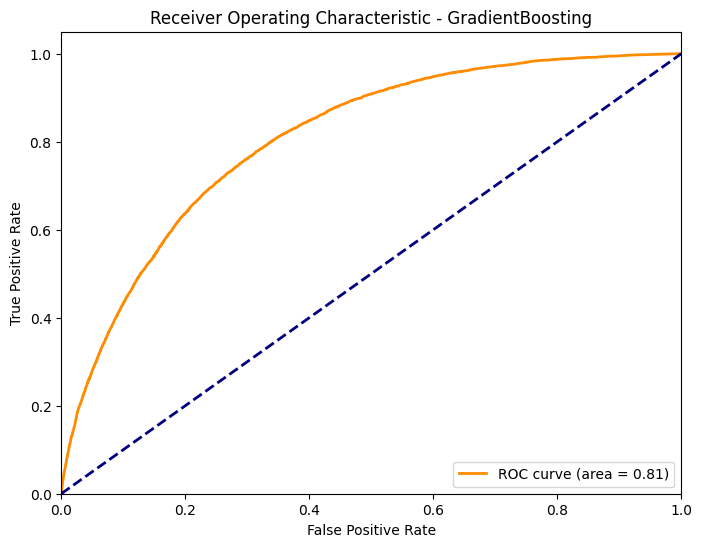

Training and Evaluating: AdaBoost

Classification Report for AdaBoost:
              precision    recall  f1-score   support

           0       0.86      0.96      0.91     41927
           1       0.55      0.21      0.31      8550

    accuracy                           0.84     50477
   macro avg       0.70      0.59      0.61     50477
weighted avg       0.80      0.84      0.81     50477



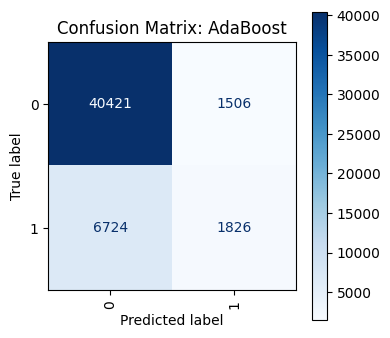

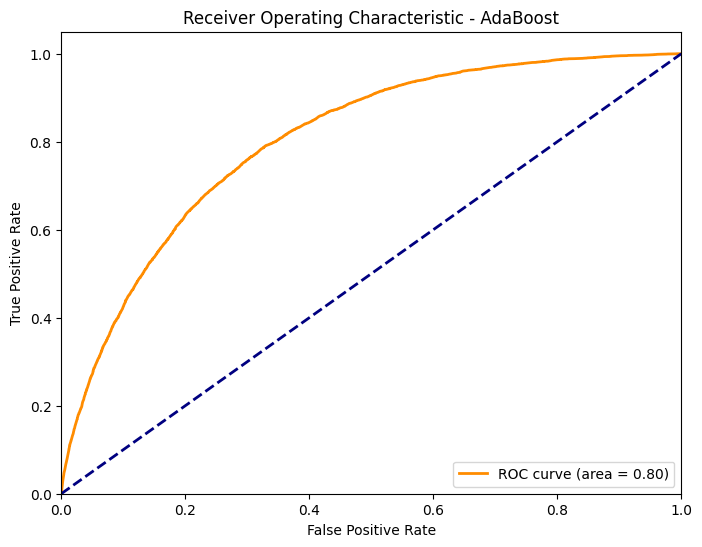

Training and Evaluating: LightGBM
[LightGBM] [Info] Number of positive: 22443, number of negative: 131102
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007323 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 153545, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.146166 -> initscore=-1.764997
[LightGBM] [Info] Start training from score -1.764997

Classification Report for LightGBM:
              precision    recall  f1-score   support

           0       0.86      0.97      0.91     41927
           1       0.57      0.20      0.30      8550

    accuracy                           0.84     50477
   macro avg       0.72      0.59      0.60     50477
weighted avg       0.81      0.84      0.81     50477



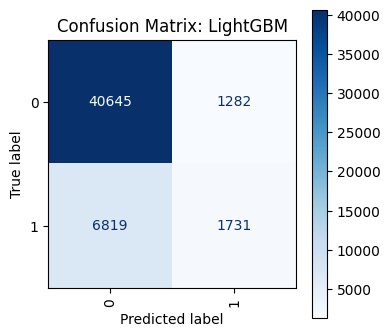

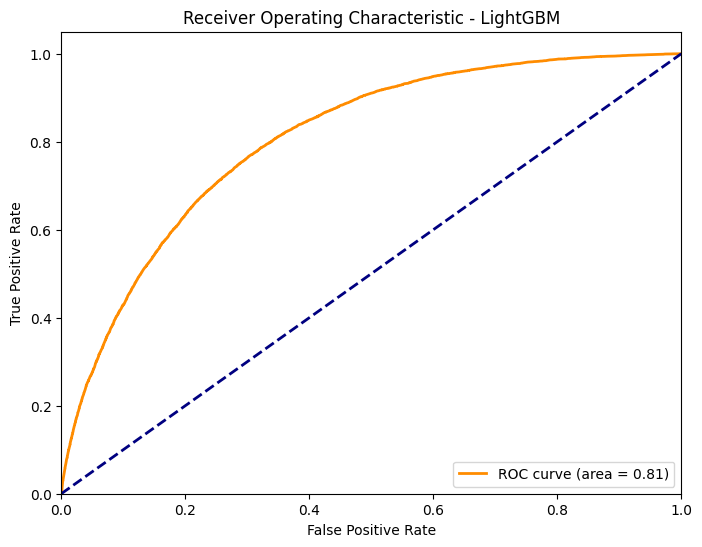

In [57]:
# Iterate over the models in the dictionary
for model_name, model in model_dict.items():
    print(f"Training and Evaluating: {model_name}")

    try:
        # Train the model on the entire training set
        model.fit(x_train, y_train)

        # Predict on the test set
        y_pred = model.predict(x_test)

        # Print classification report
        report = classification_report(y_test, y_pred, zero_division=0)
        print(f"\nClassification Report for {model_name}:\n{report}")

        # Compute confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)

        # Visualize the confusion matrix
        fig, ax = plt.subplots(figsize=(4, 4))
        ConfusionMatrixDisplay(conf_matrix, display_labels=model.classes_).plot(
            ax=ax, cmap='Blues', xticks_rotation='vertical', values_format='.0f'
        )
        plt.title(f'Confusion Matrix: {model_name}')
        plt.show()

        # Try predicting probabilities (if the model supports it)
        if hasattr(model, "predict_proba"):
            y_probs = model.predict_proba(x_test)[:, 1]  # Probabilities of positive class

            # Plot ROC curve
            fpr, tpr, _ = roc_curve(y_test, y_probs)
            roc_auc = auc(fpr, tpr)
            plt.figure(figsize=(8, 6))
            plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'Receiver Operating Characteristic - {model_name}')
            plt.legend(loc="lower right")
            plt.show()
        else:
            print(f"{model_name} does not support probability predictions.\n")

    except Exception as e:
        print(f"An error occurred with {model_name}: {e}\n")

### Since the data is imbalanced, so we will perform SMOTE on training set after splitting the data into training and test set

#### Looking for the most ideal SMOTE technique

In [58]:
import numpy as np
import pandas as pd
from imblearn.over_sampling import SMOTE, ADASYN, SVMSMOTE, BorderlineSMOTE
from imblearn.combine import SMOTEENN, SMOTETomek
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score
from collections import Counter
from sklearn.metrics import average_precision_score

# ✅ Define classifiers

# ✅ Define resampling techniques
resampling_techniques = {
    'SMOTE': SMOTE(random_state=42),
    'SMOTEENN': SMOTEENN(random_state=42),
    'SMOTETomek': SMOTETomek(random_state=42),
    'SVMSMOTE': SVMSMOTE(random_state=42),
    'ADASYN': ADASYN(random_state=42),
    'BorderlineSMOTE': BorderlineSMOTE(random_state=42),
}

# ✅ Create Stratified K-Fold for cross-validation
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Store results
results = []

# 🚀 Ensure x_train and y_train are defined before running the loop
if 'x_train' not in globals() or 'y_train' not in globals():
    raise ValueError("❌ x_train and y_train must be defined before running the script!")

# ✅ Identify categorical/integer columns
int_cols = x_train.select_dtypes(include=['int', 'uint8']).columns
float_cols = []  # Keep continuous float columns unchanged

# ✅ Convert integer columns to `int64` before resampling (to prevent type issues)
x_train[int_cols] = x_train[int_cols].astype('int64')

# ✅ Iterate over resampling techniques and apply resampling INSIDE the CV loop
for resampling_name, resampler in resampling_techniques.items():
    for clf_name, clf in model_dict.items():
        cv_scores_roc_auc = []
        cv_scores_pr_auc = []

        for train_index, test_index in skf.split(x_train, y_train):
            X_train_fold, X_test_fold = x_train.iloc[train_index], x_train.iloc[test_index]
            y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

            X_train_resampled, y_train_resampled = resampler.fit_resample(X_train_fold, y_train_fold)
            X_train_resampled = pd.DataFrame(X_train_resampled, columns=x_train.columns)

            for col in int_cols:
                X_train_resampled[col] = X_train_resampled[col].round().astype('int64')

            clf.fit(X_train_resampled, y_train_resampled)

            y_pred_probs = clf.predict_proba(X_test_fold)[:, 1]

            # ✅ Compute both ROC-AUC and PR-AUC
            roc_auc = roc_auc_score(y_test_fold, y_pred_probs)
            pr_auc = average_precision_score(y_test_fold, y_pred_probs)

            cv_scores_roc_auc.append(roc_auc)
            cv_scores_pr_auc.append(pr_auc)

        # ✅ Save both metrics
        results.append({
            'Resampling': resampling_name,
            'Classifier': clf_name,
            'Mean ROC-AUC': np.mean(cv_scores_roc_auc),
            'Std ROC-AUC': np.std(cv_scores_roc_auc),
            'Mean PR-AUC': np.mean(cv_scores_pr_auc),
            'Std PR-AUC': np.std(cv_scores_pr_auc)
        })

# ✅ Convert results /
results_df = pd.DataFrame(results)

# Sort by ROC-AUC
results_roc = results_df.sort_values(by=['Classifier', 'Mean ROC-AUC'], ascending=False)

# Sort by PR-AUC
results_pr = results_df.sort_values(by=['Classifier', 'Mean PR-AUC'], ascending=False)

[LightGBM] [Info] Number of positive: 104881, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013220 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 209762, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 104881, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 209762, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0

In [59]:
print("\n🔹 Top Models by ROC-AUC:")
print(results_roc)
results_roc.to_csv(r'C:\Users\sherm\OneDrive\Documents\P2\results_roc.csv')


🔹 Top Models by ROC-AUC:
         Resampling              Classifier  Mean ROC-AUC  Std ROC-AUC  \
29         SVMSMOTE                 XGBoost      0.790787     0.003240   
2             SMOTE                 XGBoost      0.786424     0.003410   
20       SMOTETomek                 XGBoost      0.786205     0.003986   
47  BorderlineSMOTE                 XGBoost      0.784348     0.003789   
38           ADASYN                 XGBoost      0.782910     0.003684   
11         SMOTEENN                 XGBoost      0.761859     0.003392   
30         SVMSMOTE  RandomForestClassifier      0.734566     0.005024   
21       SMOTETomek  RandomForestClassifier      0.724207     0.004858   
3             SMOTE  RandomForestClassifier      0.724061     0.004856   
48  BorderlineSMOTE  RandomForestClassifier      0.722848     0.005240   
39           ADASYN  RandomForestClassifier      0.716230     0.005084   
12         SMOTEENN  RandomForestClassifier      0.690679     0.002789   
32         S

In [60]:
print("\n🔹 Top Models by PR-AUC:")
print(results_pr)
results_pr.to_csv(r'C:\Users\sherm\OneDrive\Documents\P2\results_pr.csv')


🔹 Top Models by PR-AUC:
         Resampling              Classifier  Mean ROC-AUC  Std ROC-AUC  \
29         SVMSMOTE                 XGBoost      0.790787     0.003240   
2             SMOTE                 XGBoost      0.786424     0.003410   
20       SMOTETomek                 XGBoost      0.786205     0.003986   
38           ADASYN                 XGBoost      0.782910     0.003684   
47  BorderlineSMOTE                 XGBoost      0.784348     0.003789   
11         SMOTEENN                 XGBoost      0.761859     0.003392   
30         SVMSMOTE  RandomForestClassifier      0.734566     0.005024   
21       SMOTETomek  RandomForestClassifier      0.724207     0.004858   
3             SMOTE  RandomForestClassifier      0.724061     0.004856   
39           ADASYN  RandomForestClassifier      0.716230     0.005084   
48  BorderlineSMOTE  RandomForestClassifier      0.722848     0.005240   
12         SMOTEENN  RandomForestClassifier      0.690679     0.002789   
32         SV

### Look for the best parameter for SMOTE VS SMOTETomek

[I 2025-05-17 00:44:37,789] A new study created in memory with name: no-name-ab27ad0a-2674-4471-a163-90616895b913



🔍 Optimizing DecisionTreeClassifier + SMOTE...


[I 2025-05-17 00:44:42,028] Trial 0 finished with value: 0.28512181562448086 and parameters: {'smote_k': 15, 'smote_sampling': 0.7}. Best is trial 0 with value: 0.28512181562448086.


[DecisionTreeClassifier + SMOTE] Trial - k=15, sampling=0.70 => PR-AUC: 0.2851


[I 2025-05-17 00:44:46,051] Trial 1 finished with value: 0.2821803811355408 and parameters: {'smote_k': 9, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.28512181562448086.


[DecisionTreeClassifier + SMOTE] Trial - k=9, sampling=1.00 => PR-AUC: 0.2822


[I 2025-05-17 00:44:49,567] Trial 2 finished with value: 0.284948158231549 and parameters: {'smote_k': 11, 'smote_sampling': 0.4}. Best is trial 0 with value: 0.28512181562448086.


[DecisionTreeClassifier + SMOTE] Trial - k=11, sampling=0.40 => PR-AUC: 0.2849


[I 2025-05-17 00:44:53,036] Trial 3 finished with value: 0.28384034734450064 and parameters: {'smote_k': 12, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.28512181562448086.


[DecisionTreeClassifier + SMOTE] Trial - k=12, sampling=0.30 => PR-AUC: 0.2838


[I 2025-05-17 00:44:57,103] Trial 4 finished with value: 0.2851282924685886 and parameters: {'smote_k': 13, 'smote_sampling': 0.9000000000000001}. Best is trial 4 with value: 0.2851282924685886.


[DecisionTreeClassifier + SMOTE] Trial - k=13, sampling=0.90 => PR-AUC: 0.2851
✔️ Best Params for DecisionTreeClassifier + SMOTE: {'smote_k': 13, 'smote_sampling': 0.9000000000000001}


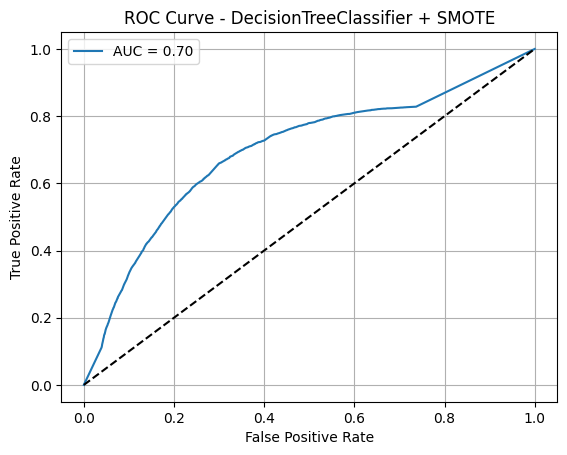

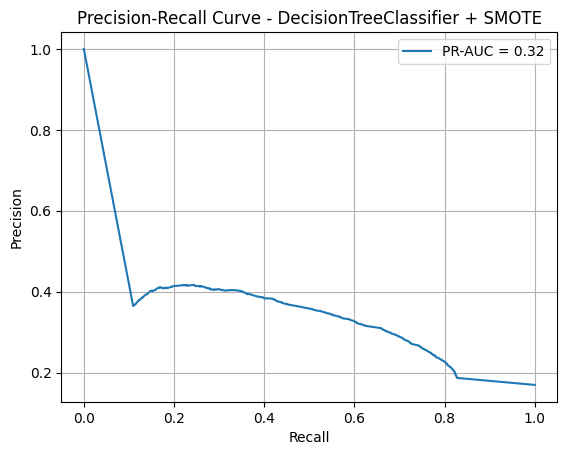

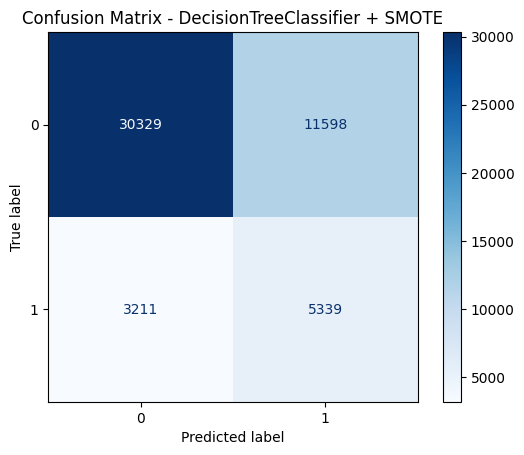

[I 2025-05-17 00:44:58,502] A new study created in memory with name: no-name-61f23153-2bfc-467a-8648-b10887f46348



🔍 Optimizing DecisionTreeClassifier + SMOTETomek...


[I 2025-05-17 00:46:19,702] Trial 0 finished with value: 0.2849700960102113 and parameters: {'smote_k': 14, 'smote_sampling': 0.5}. Best is trial 0 with value: 0.2849700960102113.


[DecisionTreeClassifier + SMOTETomek] Trial - k=14, sampling=0.50 => PR-AUC: 0.2850


[I 2025-05-17 00:48:56,909] Trial 1 finished with value: 0.28276225212260525 and parameters: {'smote_k': 4, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.2849700960102113.


[DecisionTreeClassifier + SMOTETomek] Trial - k=4, sampling=1.00 => PR-AUC: 0.2828


[I 2025-05-17 00:51:26,409] Trial 2 finished with value: 0.28224167811954104 and parameters: {'smote_k': 9, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.2849700960102113.


[DecisionTreeClassifier + SMOTETomek] Trial - k=9, sampling=1.00 => PR-AUC: 0.2822


[I 2025-05-17 00:53:57,827] Trial 3 finished with value: 0.2816241675242717 and parameters: {'smote_k': 3, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.2849700960102113.


[DecisionTreeClassifier + SMOTETomek] Trial - k=3, sampling=1.00 => PR-AUC: 0.2816


[I 2025-05-17 00:56:12,518] Trial 4 finished with value: 0.2837317038881048 and parameters: {'smote_k': 4, 'smote_sampling': 0.9000000000000001}. Best is trial 0 with value: 0.2849700960102113.


[DecisionTreeClassifier + SMOTETomek] Trial - k=4, sampling=0.90 => PR-AUC: 0.2837
✔️ Best Params for DecisionTreeClassifier + SMOTETomek: {'smote_k': 14, 'smote_sampling': 0.5}


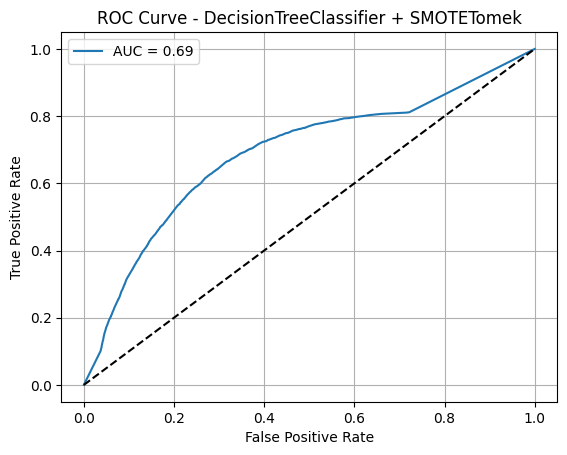

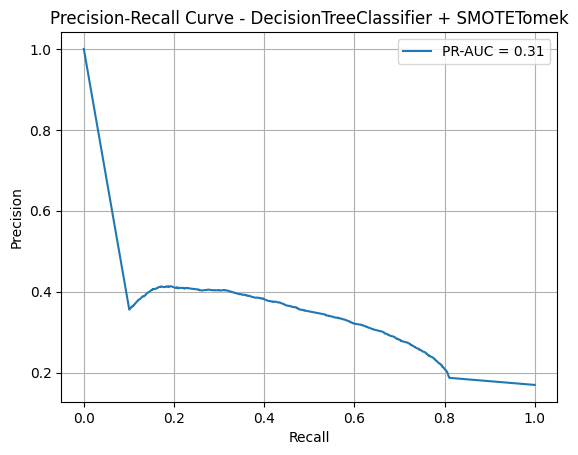

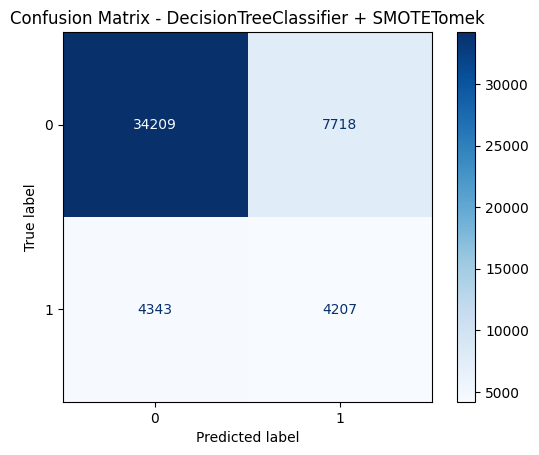

[I 2025-05-17 00:56:38,980] A new study created in memory with name: no-name-4b8d2f34-a0ae-40d4-906a-902ab7862a9a



🔍 Optimizing LogisticRegression + SMOTE...


[I 2025-05-17 00:56:45,425] Trial 0 finished with value: 0.3793714804437174 and parameters: {'smote_k': 15, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.3793714804437174.


[LogisticRegression + SMOTE] Trial - k=15, sampling=0.30 => PR-AUC: 0.3794


[I 2025-05-17 00:56:52,141] Trial 1 finished with value: 0.37449486924302294 and parameters: {'smote_k': 10, 'smote_sampling': 0.7}. Best is trial 0 with value: 0.3793714804437174.


[LogisticRegression + SMOTE] Trial - k=10, sampling=0.70 => PR-AUC: 0.3745


[I 2025-05-17 00:56:58,445] Trial 2 finished with value: 0.3736959451571786 and parameters: {'smote_k': 10, 'smote_sampling': 0.8}. Best is trial 0 with value: 0.3793714804437174.


[LogisticRegression + SMOTE] Trial - k=10, sampling=0.80 => PR-AUC: 0.3737


[I 2025-05-17 00:57:05,798] Trial 3 finished with value: 0.37618287729190275 and parameters: {'smote_k': 6, 'smote_sampling': 0.7}. Best is trial 0 with value: 0.3793714804437174.


[LogisticRegression + SMOTE] Trial - k=6, sampling=0.70 => PR-AUC: 0.3762


[I 2025-05-17 00:57:14,273] Trial 4 finished with value: 0.37251889670824523 and parameters: {'smote_k': 10, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.3793714804437174.


[LogisticRegression + SMOTE] Trial - k=10, sampling=1.00 => PR-AUC: 0.3725
✔️ Best Params for LogisticRegression + SMOTE: {'smote_k': 15, 'smote_sampling': 0.3}


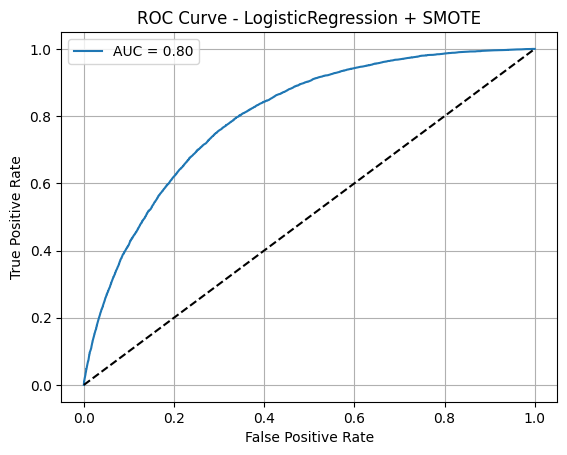

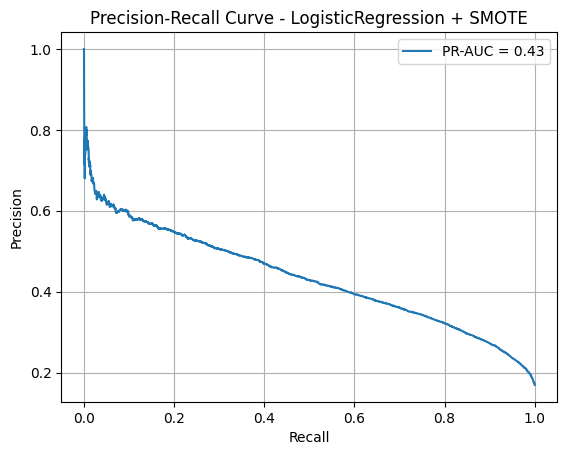

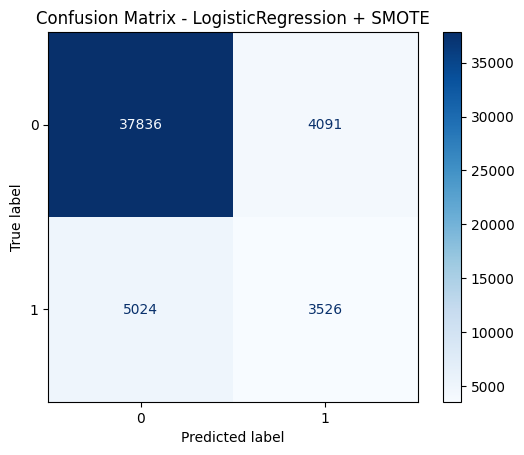

[I 2025-05-17 00:57:16,047] A new study created in memory with name: no-name-15d3e8a5-d83c-42b9-aa7e-07dbd7db6e7a



🔍 Optimizing LogisticRegression + SMOTETomek...


[I 2025-05-17 00:58:49,068] Trial 0 finished with value: 0.37466543591974555 and parameters: {'smote_k': 13, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.37466543591974555.


[LogisticRegression + SMOTETomek] Trial - k=13, sampling=0.60 => PR-AUC: 0.3747


[I 2025-05-17 01:00:58,147] Trial 1 finished with value: 0.3719451294142554 and parameters: {'smote_k': 15, 'smote_sampling': 0.8}. Best is trial 0 with value: 0.37466543591974555.


[LogisticRegression + SMOTETomek] Trial - k=15, sampling=0.80 => PR-AUC: 0.3719


[I 2025-05-17 01:03:39,049] Trial 2 finished with value: 0.37390017461771663 and parameters: {'smote_k': 7, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.37466543591974555.


[LogisticRegression + SMOTETomek] Trial - k=7, sampling=1.00 => PR-AUC: 0.3739


[I 2025-05-17 01:06:17,760] Trial 3 finished with value: 0.3707352996039188 and parameters: {'smote_k': 14, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.37466543591974555.


[LogisticRegression + SMOTETomek] Trial - k=14, sampling=1.00 => PR-AUC: 0.3707


[I 2025-05-17 01:08:42,917] Trial 4 finished with value: 0.37201509499317875 and parameters: {'smote_k': 13, 'smote_sampling': 0.9000000000000001}. Best is trial 0 with value: 0.37466543591974555.


[LogisticRegression + SMOTETomek] Trial - k=13, sampling=0.90 => PR-AUC: 0.3720
✔️ Best Params for LogisticRegression + SMOTETomek: {'smote_k': 13, 'smote_sampling': 0.6000000000000001}


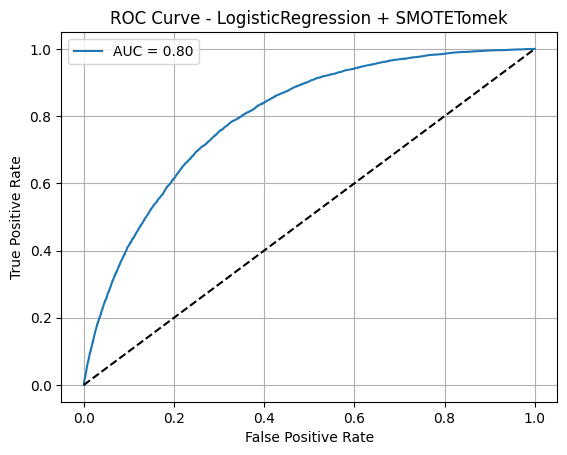

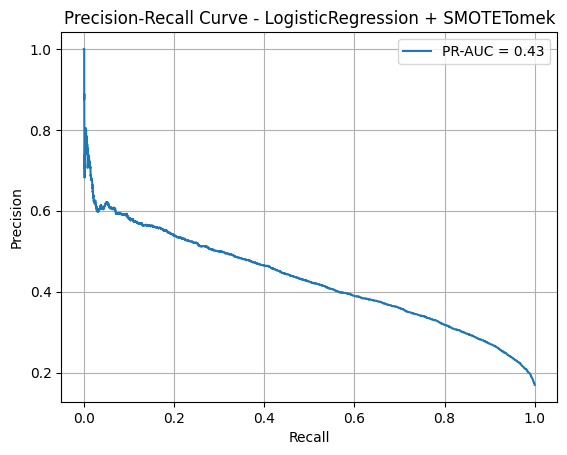

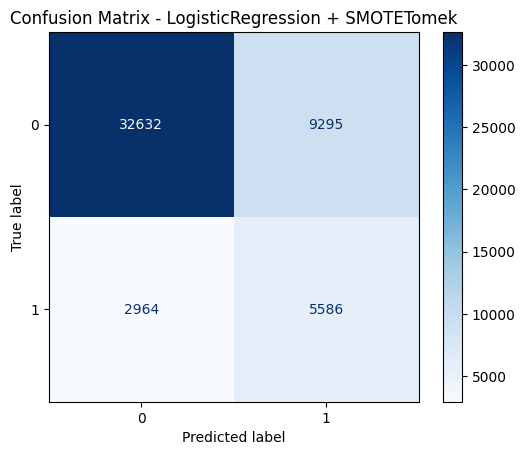

[I 2025-05-17 01:09:16,131] A new study created in memory with name: no-name-1ac1f4bb-12a4-4eec-8c90-8ac4b443a09e



🔍 Optimizing XGBoost + SMOTE...


[I 2025-05-17 01:09:20,503] Trial 0 finished with value: 0.3831368016377779 and parameters: {'smote_k': 9, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.3831368016377779.


[XGBoost + SMOTE] Trial - k=9, sampling=0.30 => PR-AUC: 0.3831


[I 2025-05-17 01:09:25,385] Trial 1 finished with value: 0.3810002579652285 and parameters: {'smote_k': 8, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.3831368016377779.


[XGBoost + SMOTE] Trial - k=8, sampling=0.60 => PR-AUC: 0.3810


[I 2025-05-17 01:09:30,326] Trial 2 finished with value: 0.37948006886412927 and parameters: {'smote_k': 14, 'smote_sampling': 0.4}. Best is trial 0 with value: 0.3831368016377779.


[XGBoost + SMOTE] Trial - k=14, sampling=0.40 => PR-AUC: 0.3795


[I 2025-05-17 01:09:35,570] Trial 3 finished with value: 0.37589269041096685 and parameters: {'smote_k': 15, 'smote_sampling': 0.8}. Best is trial 0 with value: 0.3831368016377779.


[XGBoost + SMOTE] Trial - k=15, sampling=0.80 => PR-AUC: 0.3759


[I 2025-05-17 01:09:40,366] Trial 4 finished with value: 0.3802017556879705 and parameters: {'smote_k': 9, 'smote_sampling': 0.5}. Best is trial 0 with value: 0.3831368016377779.


[XGBoost + SMOTE] Trial - k=9, sampling=0.50 => PR-AUC: 0.3802
✔️ Best Params for XGBoost + SMOTE: {'smote_k': 9, 'smote_sampling': 0.3}


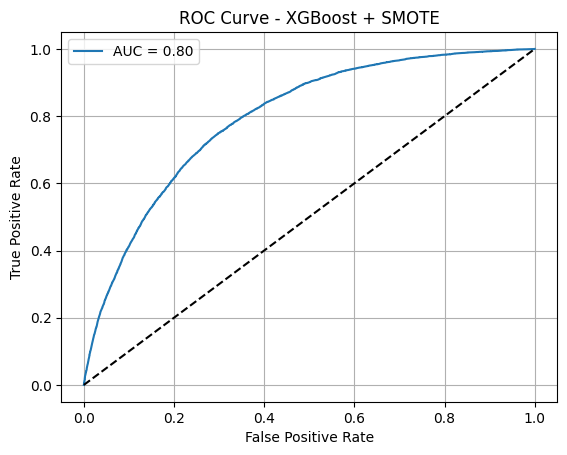

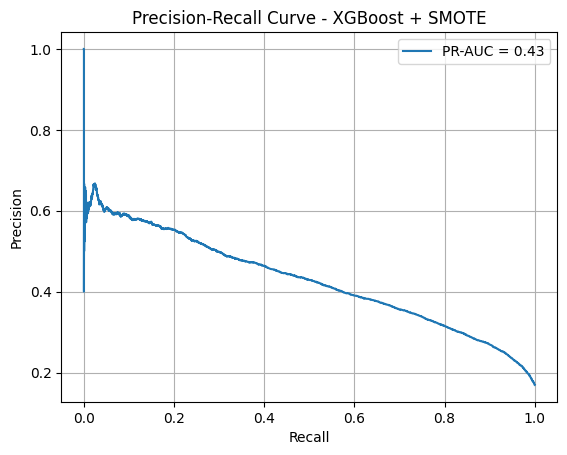

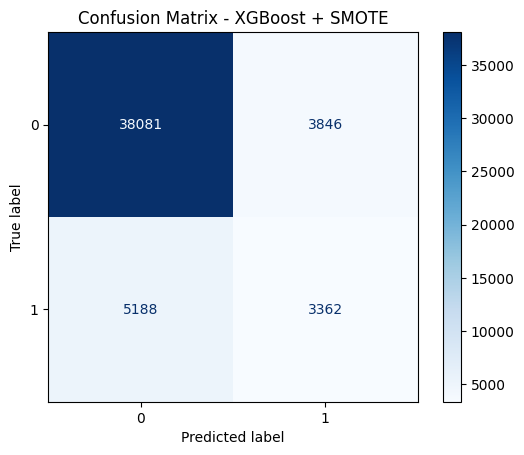

[I 2025-05-17 01:09:41,920] A new study created in memory with name: no-name-2bef9031-a87e-4b6c-a861-f1181ac69e55



🔍 Optimizing XGBoost + SMOTETomek...


[I 2025-05-17 01:10:41,445] Trial 0 finished with value: 0.38345036179831116 and parameters: {'smote_k': 3, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.38345036179831116.


[XGBoost + SMOTETomek] Trial - k=3, sampling=0.30 => PR-AUC: 0.3835


[I 2025-05-17 01:12:04,256] Trial 1 finished with value: 0.37820847147882264 and parameters: {'smote_k': 15, 'smote_sampling': 0.5}. Best is trial 0 with value: 0.38345036179831116.


[XGBoost + SMOTETomek] Trial - k=15, sampling=0.50 => PR-AUC: 0.3782


[I 2025-05-17 01:13:34,372] Trial 2 finished with value: 0.37870666628625227 and parameters: {'smote_k': 14, 'smote_sampling': 0.5}. Best is trial 0 with value: 0.38345036179831116.


[XGBoost + SMOTETomek] Trial - k=14, sampling=0.50 => PR-AUC: 0.3787


[I 2025-05-17 01:15:14,446] Trial 3 finished with value: 0.3807145236371925 and parameters: {'smote_k': 5, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.38345036179831116.


[XGBoost + SMOTETomek] Trial - k=5, sampling=0.60 => PR-AUC: 0.3807


[I 2025-05-17 01:16:55,759] Trial 4 finished with value: 0.3793100077858428 and parameters: {'smote_k': 12, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.38345036179831116.


[XGBoost + SMOTETomek] Trial - k=12, sampling=0.60 => PR-AUC: 0.3793
✔️ Best Params for XGBoost + SMOTETomek: {'smote_k': 3, 'smote_sampling': 0.3}


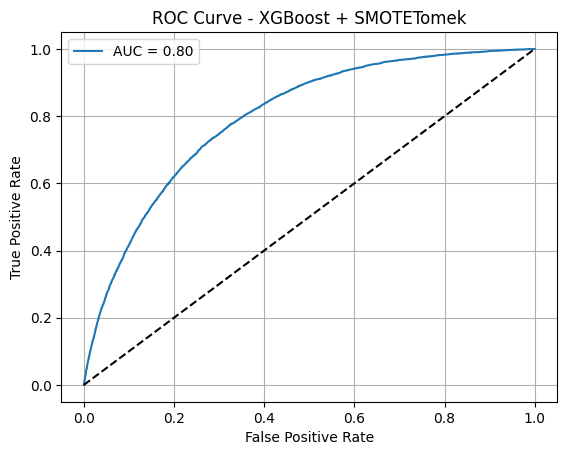

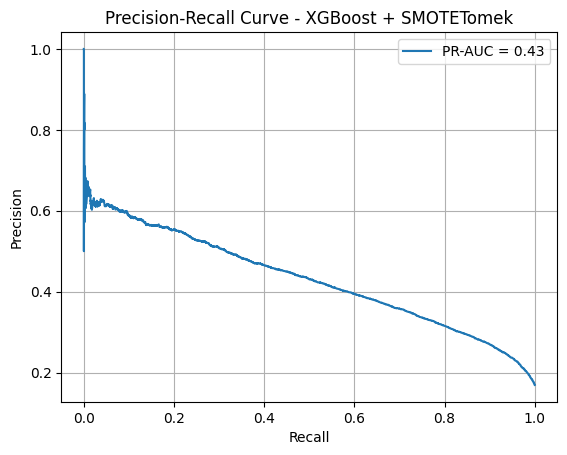

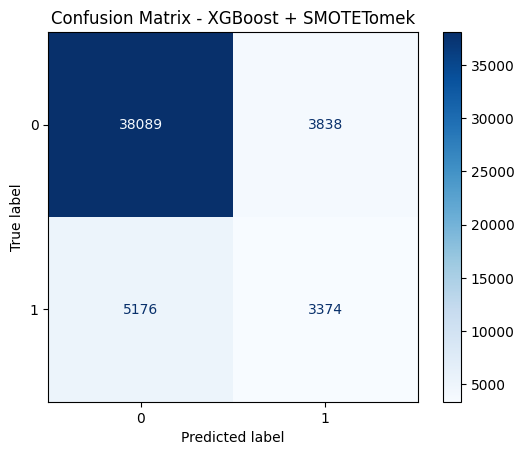

[I 2025-05-17 01:17:15,641] A new study created in memory with name: no-name-448eb7fe-6414-4459-82aa-38bdad4dc961



🔍 Optimizing RandomForestClassifier + SMOTE...


[I 2025-05-17 01:17:47,967] Trial 0 finished with value: 0.3128011116234744 and parameters: {'smote_k': 13, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.3128011116234744.


[RandomForestClassifier + SMOTE] Trial - k=13, sampling=0.30 => PR-AUC: 0.3128


[I 2025-05-17 01:18:24,961] Trial 1 finished with value: 0.30682653034404817 and parameters: {'smote_k': 8, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.3128011116234744.


[RandomForestClassifier + SMOTE] Trial - k=8, sampling=0.60 => PR-AUC: 0.3068


[I 2025-05-17 01:19:03,193] Trial 2 finished with value: 0.3092150719142921 and parameters: {'smote_k': 13, 'smote_sampling': 0.5}. Best is trial 0 with value: 0.3128011116234744.


[RandomForestClassifier + SMOTE] Trial - k=13, sampling=0.50 => PR-AUC: 0.3092


[I 2025-05-17 01:19:40,663] Trial 3 finished with value: 0.306462647701902 and parameters: {'smote_k': 10, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.3128011116234744.


[RandomForestClassifier + SMOTE] Trial - k=10, sampling=0.60 => PR-AUC: 0.3065


[I 2025-05-17 01:20:25,107] Trial 4 finished with value: 0.3054123211583804 and parameters: {'smote_k': 15, 'smote_sampling': 0.9000000000000001}. Best is trial 0 with value: 0.3128011116234744.


[RandomForestClassifier + SMOTE] Trial - k=15, sampling=0.90 => PR-AUC: 0.3054
✔️ Best Params for RandomForestClassifier + SMOTE: {'smote_k': 13, 'smote_sampling': 0.3}


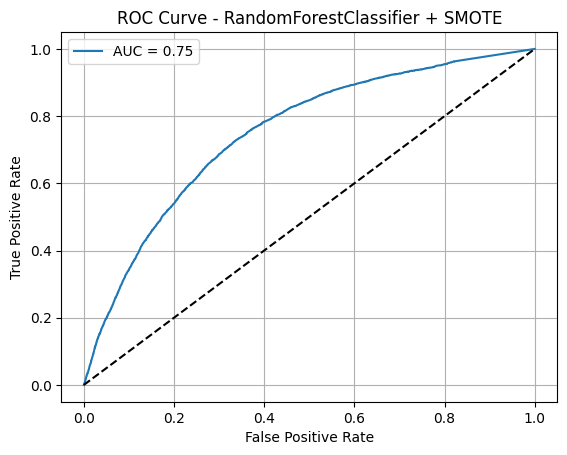

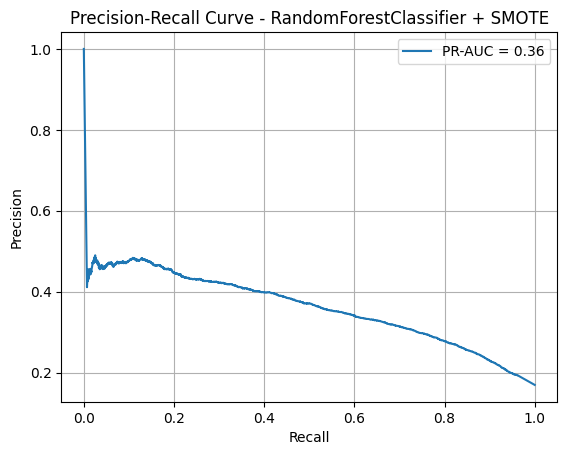

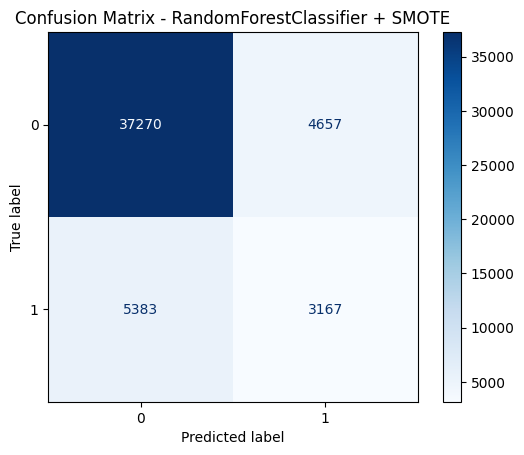

[I 2025-05-17 01:20:34,161] A new study created in memory with name: no-name-8f384972-e050-456b-812b-d1e68fce2976



🔍 Optimizing RandomForestClassifier + SMOTETomek...


[I 2025-05-17 01:22:07,161] Trial 0 finished with value: 0.3128445228144292 and parameters: {'smote_k': 3, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.3128445228144292.


[RandomForestClassifier + SMOTETomek] Trial - k=3, sampling=0.30 => PR-AUC: 0.3128


[I 2025-05-17 01:24:28,622] Trial 1 finished with value: 0.30654576394466615 and parameters: {'smote_k': 12, 'smote_sampling': 0.7}. Best is trial 0 with value: 0.3128445228144292.


[RandomForestClassifier + SMOTETomek] Trial - k=12, sampling=0.70 => PR-AUC: 0.3065


[I 2025-05-17 01:26:30,963] Trial 2 finished with value: 0.3085805865836061 and parameters: {'smote_k': 15, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.3128445228144292.


[RandomForestClassifier + SMOTETomek] Trial - k=15, sampling=0.60 => PR-AUC: 0.3086


[I 2025-05-17 01:28:05,466] Trial 3 finished with value: 0.3128569014831896 and parameters: {'smote_k': 14, 'smote_sampling': 0.4}. Best is trial 3 with value: 0.3128569014831896.


[RandomForestClassifier + SMOTETomek] Trial - k=14, sampling=0.40 => PR-AUC: 0.3129


[I 2025-05-17 01:30:45,374] Trial 4 finished with value: 0.3020032650082772 and parameters: {'smote_k': 3, 'smote_sampling': 0.8}. Best is trial 3 with value: 0.3128569014831896.


[RandomForestClassifier + SMOTETomek] Trial - k=3, sampling=0.80 => PR-AUC: 0.3020
✔️ Best Params for RandomForestClassifier + SMOTETomek: {'smote_k': 14, 'smote_sampling': 0.4}


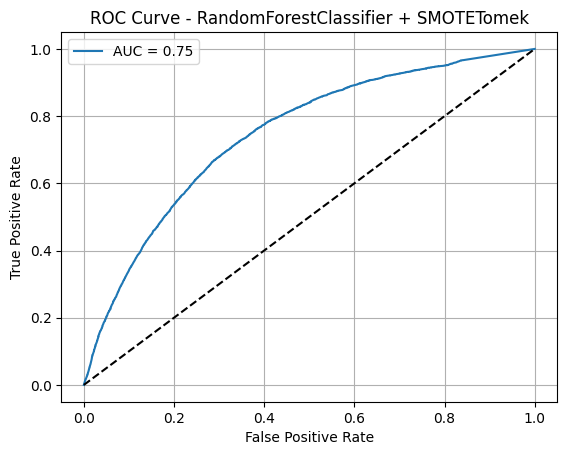

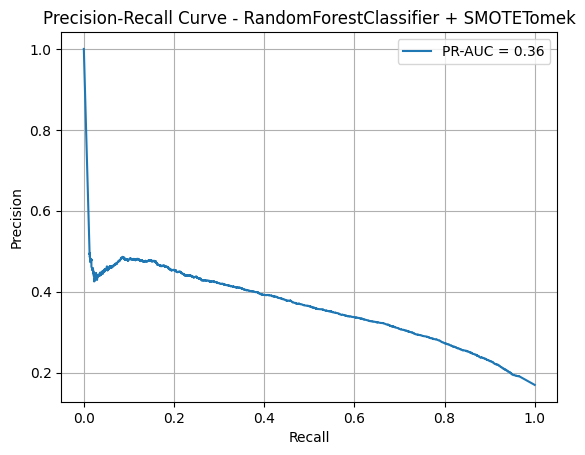

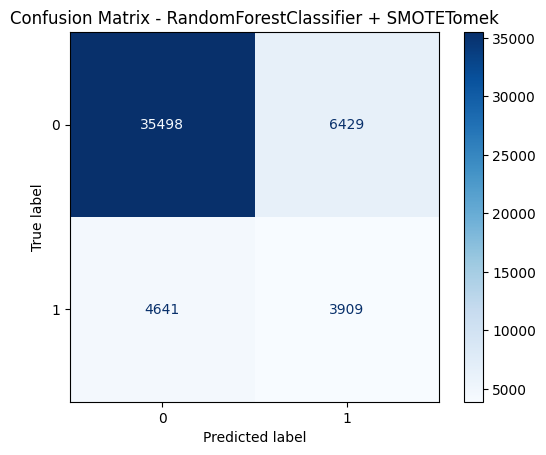

[I 2025-05-17 01:31:17,122] A new study created in memory with name: no-name-944744eb-2eff-44eb-99cd-4827766159f6



🔍 Optimizing KNN + SMOTE...


[I 2025-05-17 01:31:48,800] Trial 0 finished with value: 0.2625832836530781 and parameters: {'smote_k': 9, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.2625832836530781.


[KNN + SMOTE] Trial - k=9, sampling=1.00 => PR-AUC: 0.2626


[I 2025-05-17 01:32:21,202] Trial 1 finished with value: 0.2652766631837287 and parameters: {'smote_k': 13, 'smote_sampling': 1.0}. Best is trial 1 with value: 0.2652766631837287.


[KNN + SMOTE] Trial - k=13, sampling=1.00 => PR-AUC: 0.2653


[I 2025-05-17 01:32:51,461] Trial 2 finished with value: 0.2641914296977306 and parameters: {'smote_k': 9, 'smote_sampling': 0.9000000000000001}. Best is trial 1 with value: 0.2652766631837287.


[KNN + SMOTE] Trial - k=9, sampling=0.90 => PR-AUC: 0.2642


[I 2025-05-17 01:33:14,505] Trial 3 finished with value: 0.2677864387279969 and parameters: {'smote_k': 7, 'smote_sampling': 0.5}. Best is trial 3 with value: 0.2677864387279969.


[KNN + SMOTE] Trial - k=7, sampling=0.50 => PR-AUC: 0.2678


[I 2025-05-17 01:33:48,598] Trial 4 finished with value: 0.26361966539273046 and parameters: {'smote_k': 14, 'smote_sampling': 1.0}. Best is trial 3 with value: 0.2677864387279969.


[KNN + SMOTE] Trial - k=14, sampling=1.00 => PR-AUC: 0.2636
✔️ Best Params for KNN + SMOTE: {'smote_k': 7, 'smote_sampling': 0.5}


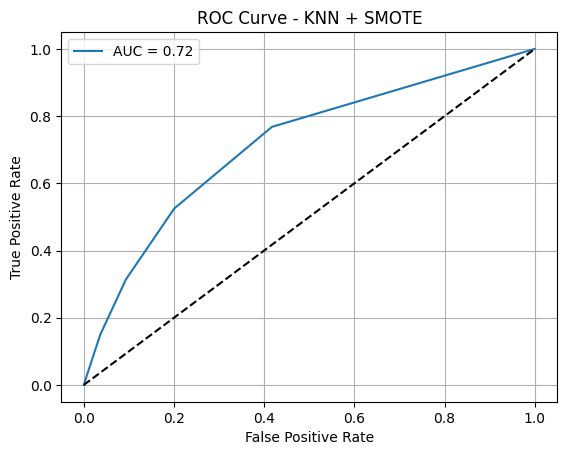

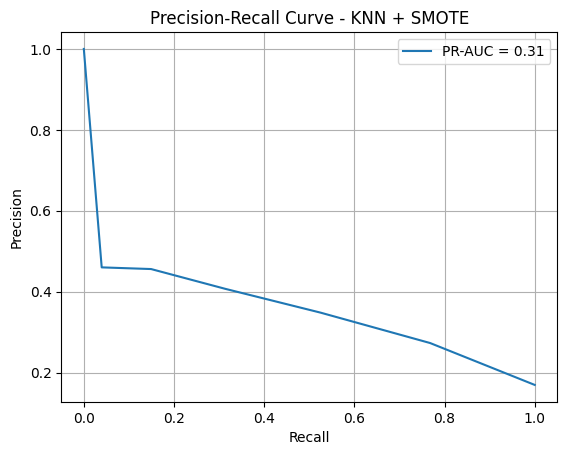

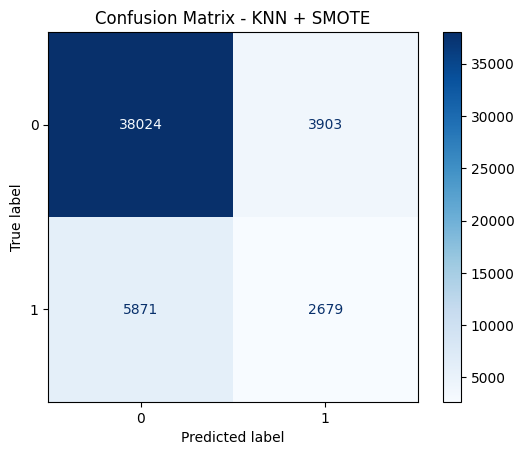

[I 2025-05-17 01:34:08,445] A new study created in memory with name: no-name-9fca0793-ba2d-46c1-847d-7872e57f490a



🔍 Optimizing KNN + SMOTETomek...


[I 2025-05-17 01:36:49,190] Trial 0 finished with value: 0.2636689966135213 and parameters: {'smote_k': 3, 'smote_sampling': 0.9000000000000001}. Best is trial 0 with value: 0.2636689966135213.


[KNN + SMOTETomek] Trial - k=3, sampling=0.90 => PR-AUC: 0.2637


[I 2025-05-17 01:38:58,709] Trial 1 finished with value: 0.2649975692465848 and parameters: {'smote_k': 8, 'smote_sampling': 0.7}. Best is trial 1 with value: 0.2649975692465848.


[KNN + SMOTETomek] Trial - k=8, sampling=0.70 => PR-AUC: 0.2650


[I 2025-05-17 01:41:23,778] Trial 2 finished with value: 0.26530378430545887 and parameters: {'smote_k': 15, 'smote_sampling': 0.8}. Best is trial 2 with value: 0.26530378430545887.


[KNN + SMOTETomek] Trial - k=15, sampling=0.80 => PR-AUC: 0.2653


[I 2025-05-17 01:42:59,907] Trial 3 finished with value: 0.26743814262024485 and parameters: {'smote_k': 12, 'smote_sampling': 0.5}. Best is trial 3 with value: 0.26743814262024485.


[KNN + SMOTETomek] Trial - k=12, sampling=0.50 => PR-AUC: 0.2674


[I 2025-05-17 01:44:12,578] Trial 4 finished with value: 0.2700478729657659 and parameters: {'smote_k': 9, 'smote_sampling': 0.3}. Best is trial 4 with value: 0.2700478729657659.


[KNN + SMOTETomek] Trial - k=9, sampling=0.30 => PR-AUC: 0.2700
✔️ Best Params for KNN + SMOTETomek: {'smote_k': 9, 'smote_sampling': 0.3}


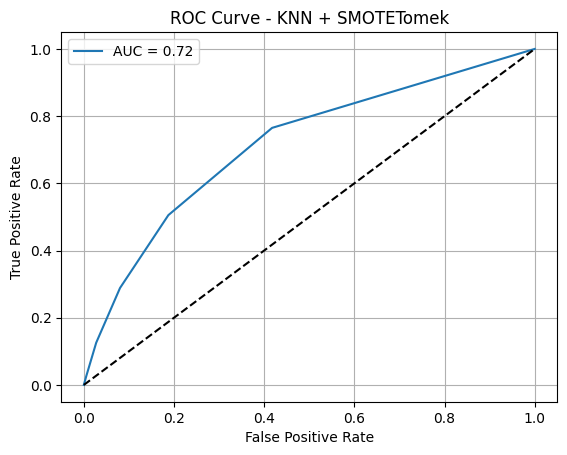

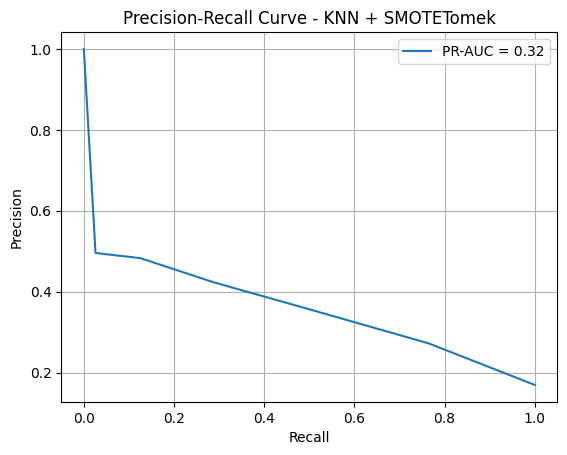

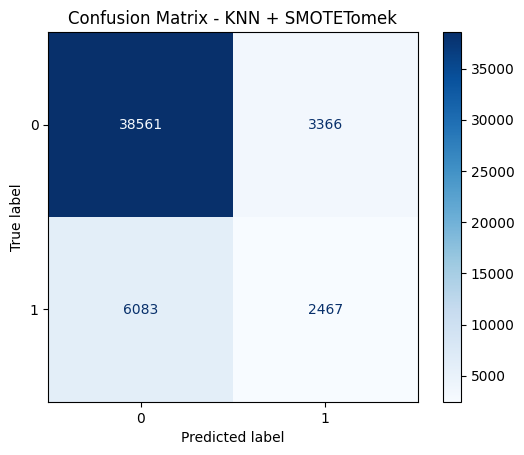

[I 2025-05-17 01:44:46,196] A new study created in memory with name: no-name-3aa8de77-ca89-4885-9051-ed93d96aeb2e



🔍 Optimizing NeuralNetwork + SMOTE...


[I 2025-05-17 01:49:33,961] Trial 0 finished with value: 0.390493873875486 and parameters: {'smote_k': 8, 'smote_sampling': 0.4}. Best is trial 0 with value: 0.390493873875486.


[NeuralNetwork + SMOTE] Trial - k=8, sampling=0.40 => PR-AUC: 0.3905


[I 2025-05-17 02:00:47,163] Trial 1 finished with value: 0.38948212999708653 and parameters: {'smote_k': 5, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.390493873875486.


[NeuralNetwork + SMOTE] Trial - k=5, sampling=1.00 => PR-AUC: 0.3895


[I 2025-05-17 02:04:41,260] Trial 2 finished with value: 0.38985097533512647 and parameters: {'smote_k': 13, 'smote_sampling': 0.4}. Best is trial 0 with value: 0.390493873875486.


[NeuralNetwork + SMOTE] Trial - k=13, sampling=0.40 => PR-AUC: 0.3899


[I 2025-05-17 02:14:18,540] Trial 3 finished with value: 0.38394611566938674 and parameters: {'smote_k': 15, 'smote_sampling': 0.7}. Best is trial 0 with value: 0.390493873875486.


[NeuralNetwork + SMOTE] Trial - k=15, sampling=0.70 => PR-AUC: 0.3839


[I 2025-05-17 02:20:29,067] Trial 4 finished with value: 0.39204250403899243 and parameters: {'smote_k': 4, 'smote_sampling': 0.4}. Best is trial 4 with value: 0.39204250403899243.


[NeuralNetwork + SMOTE] Trial - k=4, sampling=0.40 => PR-AUC: 0.3920
✔️ Best Params for NeuralNetwork + SMOTE: {'smote_k': 4, 'smote_sampling': 0.4}


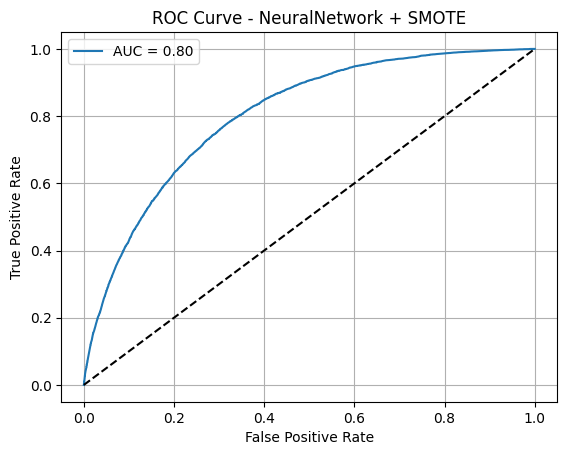

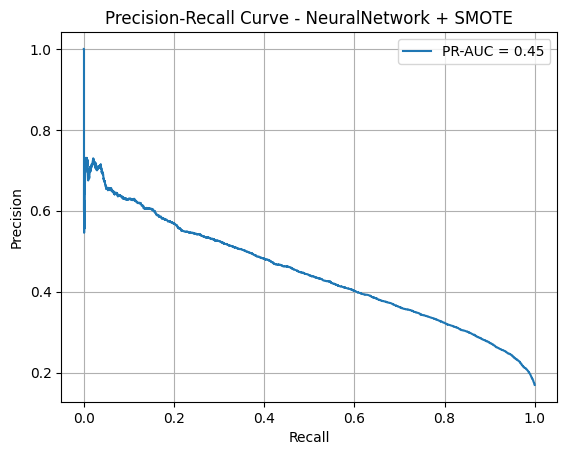

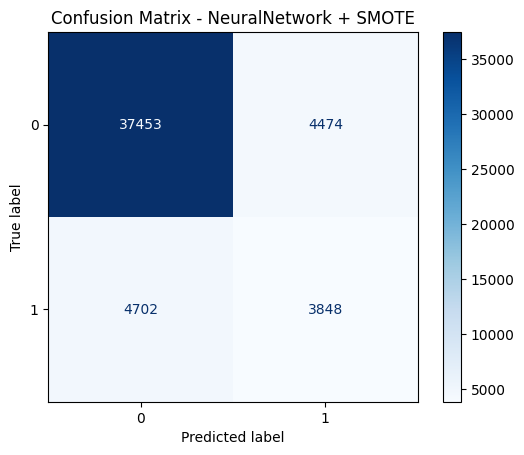

[I 2025-05-17 02:21:37,240] A new study created in memory with name: no-name-c3624701-4943-428b-ac7f-527f1ed138c3



🔍 Optimizing NeuralNetwork + SMOTETomek...


[I 2025-05-17 02:27:16,621] Trial 0 finished with value: 0.39156373147186896 and parameters: {'smote_k': 4, 'smote_sampling': 0.4}. Best is trial 0 with value: 0.39156373147186896.


[NeuralNetwork + SMOTETomek] Trial - k=4, sampling=0.40 => PR-AUC: 0.3916


[I 2025-05-17 02:35:57,778] Trial 1 finished with value: 0.39188715371417493 and parameters: {'smote_k': 3, 'smote_sampling': 0.6000000000000001}. Best is trial 1 with value: 0.39188715371417493.


[NeuralNetwork + SMOTETomek] Trial - k=3, sampling=0.60 => PR-AUC: 0.3919


[I 2025-05-17 02:47:29,967] Trial 2 finished with value: 0.3848468062755902 and parameters: {'smote_k': 11, 'smote_sampling': 0.9000000000000001}. Best is trial 1 with value: 0.39188715371417493.


[NeuralNetwork + SMOTETomek] Trial - k=11, sampling=0.90 => PR-AUC: 0.3848


[I 2025-05-17 02:53:46,764] Trial 3 finished with value: 0.3940471101372557 and parameters: {'smote_k': 3, 'smote_sampling': 0.3}. Best is trial 3 with value: 0.3940471101372557.


[NeuralNetwork + SMOTETomek] Trial - k=3, sampling=0.30 => PR-AUC: 0.3940


[I 2025-05-17 03:06:55,157] Trial 4 finished with value: 0.38624938544621507 and parameters: {'smote_k': 10, 'smote_sampling': 0.9000000000000001}. Best is trial 3 with value: 0.3940471101372557.


[NeuralNetwork + SMOTETomek] Trial - k=10, sampling=0.90 => PR-AUC: 0.3862
✔️ Best Params for NeuralNetwork + SMOTETomek: {'smote_k': 3, 'smote_sampling': 0.3}


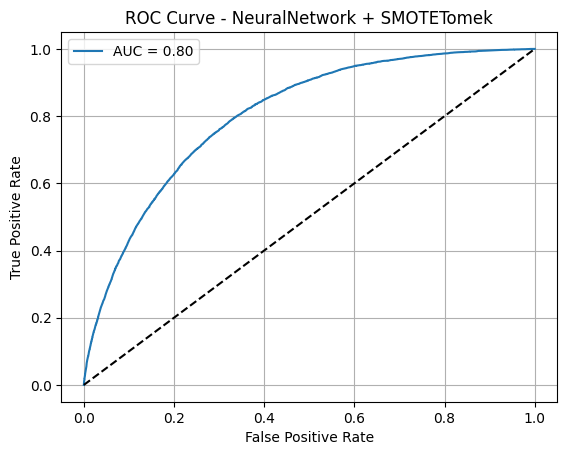

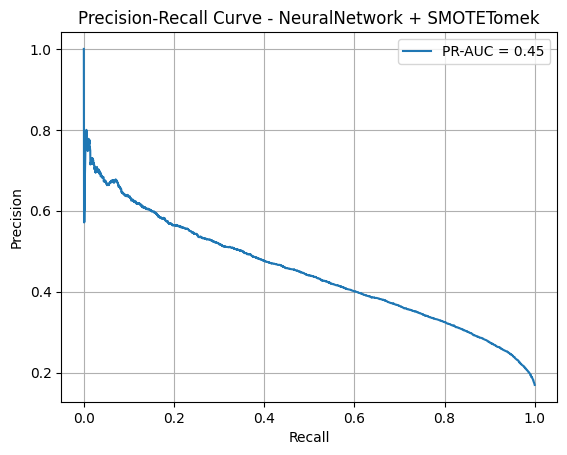

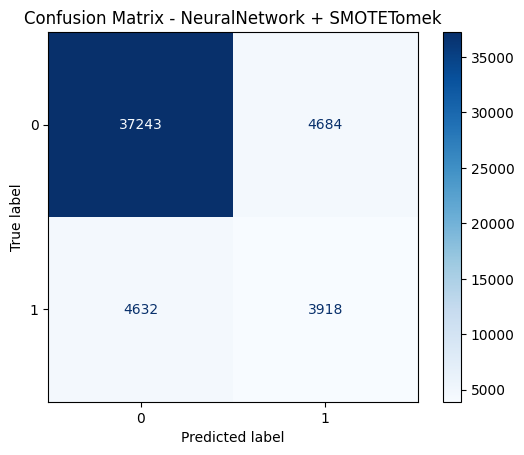

[I 2025-05-17 03:08:04,479] A new study created in memory with name: no-name-c07e9f82-7317-44d9-a2fb-4628d8bb426a



🔍 Optimizing GradientBoosting + SMOTE...


[I 2025-05-17 03:08:50,231] Trial 0 finished with value: 0.3859206478097867 and parameters: {'smote_k': 14, 'smote_sampling': 0.9000000000000001}. Best is trial 0 with value: 0.3859206478097867.


[GradientBoosting + SMOTE] Trial - k=14, sampling=0.90 => PR-AUC: 0.3859


[I 2025-05-17 03:09:40,166] Trial 1 finished with value: 0.38573945858673897 and parameters: {'smote_k': 14, 'smote_sampling': 1.0}. Best is trial 0 with value: 0.3859206478097867.


[GradientBoosting + SMOTE] Trial - k=14, sampling=1.00 => PR-AUC: 0.3857


[I 2025-05-17 03:10:23,663] Trial 2 finished with value: 0.38677219293883225 and parameters: {'smote_k': 14, 'smote_sampling': 0.8}. Best is trial 2 with value: 0.38677219293883225.


[GradientBoosting + SMOTE] Trial - k=14, sampling=0.80 => PR-AUC: 0.3868


[I 2025-05-17 03:10:58,980] Trial 3 finished with value: 0.39102286544101206 and parameters: {'smote_k': 8, 'smote_sampling': 0.5}. Best is trial 3 with value: 0.39102286544101206.


[GradientBoosting + SMOTE] Trial - k=8, sampling=0.50 => PR-AUC: 0.3910


[I 2025-05-17 03:11:45,338] Trial 4 finished with value: 0.3859206478097867 and parameters: {'smote_k': 14, 'smote_sampling': 0.9000000000000001}. Best is trial 3 with value: 0.39102286544101206.


[GradientBoosting + SMOTE] Trial - k=14, sampling=0.90 => PR-AUC: 0.3859
✔️ Best Params for GradientBoosting + SMOTE: {'smote_k': 8, 'smote_sampling': 0.5}


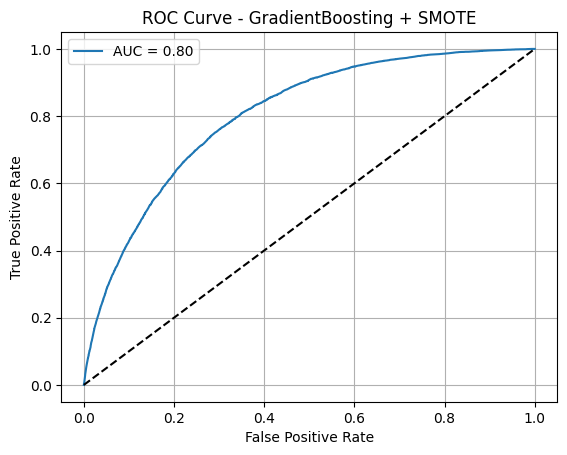

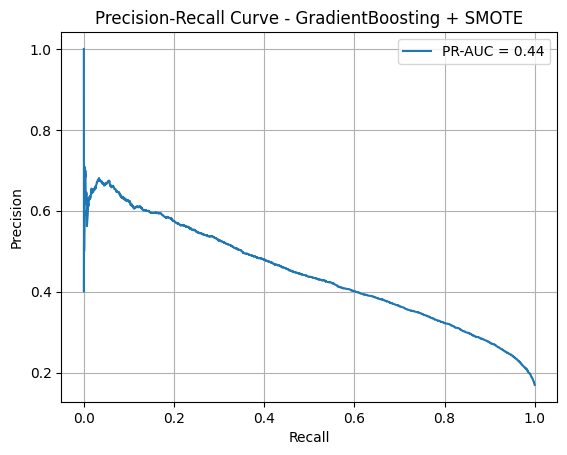

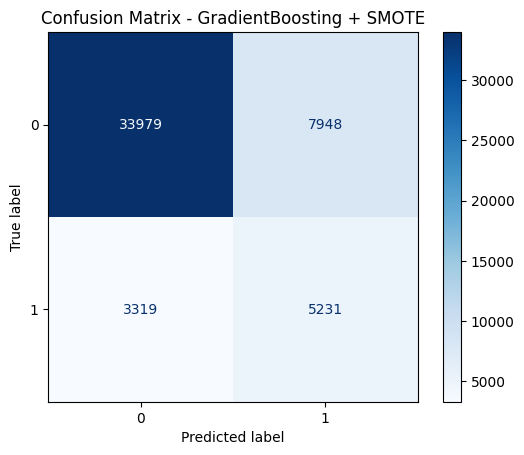

[I 2025-05-17 03:11:55,016] A new study created in memory with name: no-name-46977e0d-7d94-484b-84bb-69ade6ab624a



🔍 Optimizing GradientBoosting + SMOTETomek...


[I 2025-05-17 03:14:54,109] Trial 0 finished with value: 0.38587468930717056 and parameters: {'smote_k': 15, 'smote_sampling': 0.9000000000000001}. Best is trial 0 with value: 0.38587468930717056.


[GradientBoosting + SMOTETomek] Trial - k=15, sampling=0.90 => PR-AUC: 0.3859


[I 2025-05-17 03:17:35,973] Trial 1 finished with value: 0.38997804780718964 and parameters: {'smote_k': 7, 'smote_sampling': 0.8}. Best is trial 1 with value: 0.38997804780718964.


[GradientBoosting + SMOTETomek] Trial - k=7, sampling=0.80 => PR-AUC: 0.3900


[I 2025-05-17 03:20:15,856] Trial 2 finished with value: 0.3866536338065675 and parameters: {'smote_k': 15, 'smote_sampling': 0.8}. Best is trial 1 with value: 0.38997804780718964.


[GradientBoosting + SMOTETomek] Trial - k=15, sampling=0.80 => PR-AUC: 0.3867


[I 2025-05-17 03:22:21,263] Trial 3 finished with value: 0.388143862930947 and parameters: {'smote_k': 15, 'smote_sampling': 0.6000000000000001}. Best is trial 1 with value: 0.38997804780718964.


[GradientBoosting + SMOTETomek] Trial - k=15, sampling=0.60 => PR-AUC: 0.3881


[I 2025-05-17 03:25:16,708] Trial 4 finished with value: 0.3901420283317803 and parameters: {'smote_k': 6, 'smote_sampling': 0.9000000000000001}. Best is trial 4 with value: 0.3901420283317803.


[GradientBoosting + SMOTETomek] Trial - k=6, sampling=0.90 => PR-AUC: 0.3901
✔️ Best Params for GradientBoosting + SMOTETomek: {'smote_k': 6, 'smote_sampling': 0.9000000000000001}


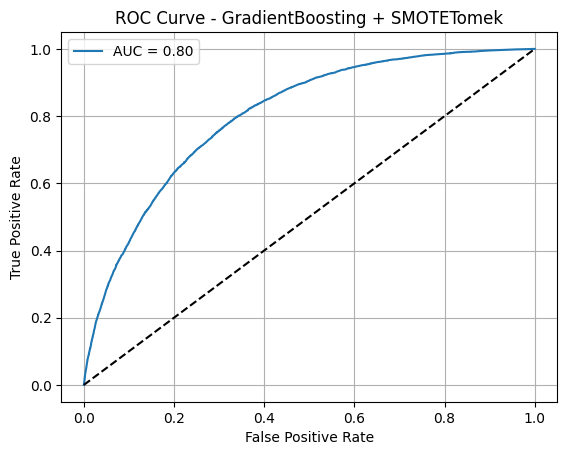

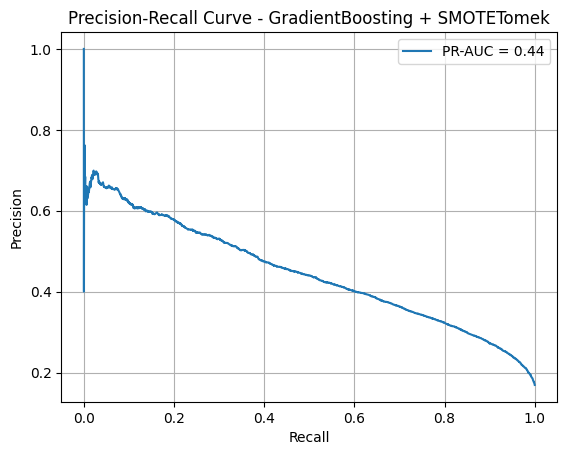

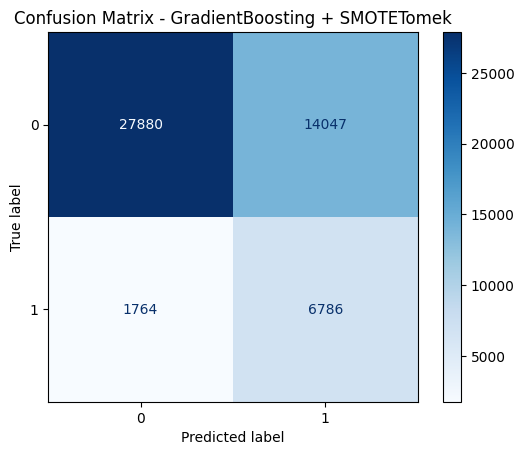

[I 2025-05-17 03:26:06,909] A new study created in memory with name: no-name-dcdd9a94-eef6-410a-9d1c-1badaa46014e



🔍 Optimizing AdaBoost + SMOTE...


[I 2025-05-17 03:26:19,804] Trial 0 finished with value: 0.384903077934041 and parameters: {'smote_k': 11, 'smote_sampling': 0.5}. Best is trial 0 with value: 0.384903077934041.


[AdaBoost + SMOTE] Trial - k=11, sampling=0.50 => PR-AUC: 0.3849


[I 2025-05-17 03:26:36,015] Trial 1 finished with value: 0.3860942869133896 and parameters: {'smote_k': 4, 'smote_sampling': 1.0}. Best is trial 1 with value: 0.3860942869133896.


[AdaBoost + SMOTE] Trial - k=4, sampling=1.00 => PR-AUC: 0.3861


[I 2025-05-17 03:26:49,403] Trial 2 finished with value: 0.3849792295206317 and parameters: {'smote_k': 10, 'smote_sampling': 0.6000000000000001}. Best is trial 1 with value: 0.3860942869133896.


[AdaBoost + SMOTE] Trial - k=10, sampling=0.60 => PR-AUC: 0.3850


[I 2025-05-17 03:27:02,865] Trial 3 finished with value: 0.38674752187766087 and parameters: {'smote_k': 4, 'smote_sampling': 0.6000000000000001}. Best is trial 3 with value: 0.38674752187766087.


[AdaBoost + SMOTE] Trial - k=4, sampling=0.60 => PR-AUC: 0.3867


[I 2025-05-17 03:27:18,169] Trial 4 finished with value: 0.3853938611430817 and parameters: {'smote_k': 6, 'smote_sampling': 0.9000000000000001}. Best is trial 3 with value: 0.38674752187766087.


[AdaBoost + SMOTE] Trial - k=6, sampling=0.90 => PR-AUC: 0.3854
✔️ Best Params for AdaBoost + SMOTE: {'smote_k': 4, 'smote_sampling': 0.6000000000000001}


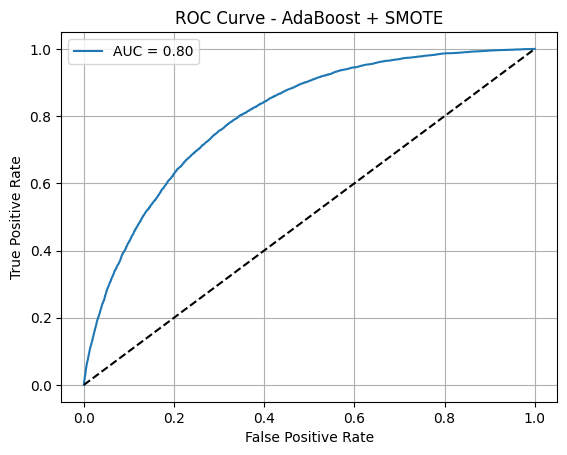

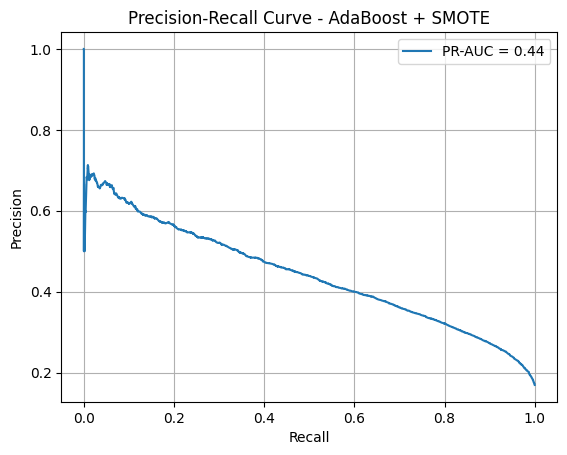

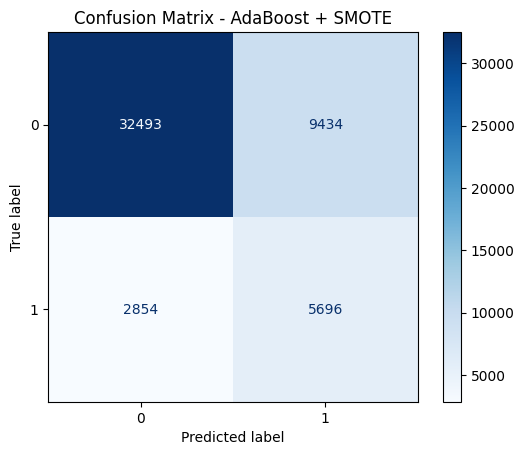

[I 2025-05-17 03:27:22,053] A new study created in memory with name: no-name-dcd0516f-e998-4e6b-a99e-52a4d9e1f935



🔍 Optimizing AdaBoost + SMOTETomek...


[I 2025-05-17 03:28:37,526] Trial 0 finished with value: 0.3858160033814169 and parameters: {'smote_k': 13, 'smote_sampling': 0.4}. Best is trial 0 with value: 0.3858160033814169.


[AdaBoost + SMOTETomek] Trial - k=13, sampling=0.40 => PR-AUC: 0.3858


[I 2025-05-17 03:30:18,505] Trial 1 finished with value: 0.3845484497943906 and parameters: {'smote_k': 9, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.3858160033814169.


[AdaBoost + SMOTETomek] Trial - k=9, sampling=0.60 => PR-AUC: 0.3845


[I 2025-05-17 03:31:57,380] Trial 2 finished with value: 0.38389260318280066 and parameters: {'smote_k': 13, 'smote_sampling': 0.6000000000000001}. Best is trial 0 with value: 0.3858160033814169.


[AdaBoost + SMOTETomek] Trial - k=13, sampling=0.60 => PR-AUC: 0.3839


[I 2025-05-17 03:34:27,900] Trial 3 finished with value: 0.3863994406430936 and parameters: {'smote_k': 4, 'smote_sampling': 0.9000000000000001}. Best is trial 3 with value: 0.3863994406430936.


[AdaBoost + SMOTETomek] Trial - k=4, sampling=0.90 => PR-AUC: 0.3864


[I 2025-05-17 03:36:38,858] Trial 4 finished with value: 0.3852688725914189 and parameters: {'smote_k': 6, 'smote_sampling': 0.8}. Best is trial 3 with value: 0.3863994406430936.


[AdaBoost + SMOTETomek] Trial - k=6, sampling=0.80 => PR-AUC: 0.3853
✔️ Best Params for AdaBoost + SMOTETomek: {'smote_k': 4, 'smote_sampling': 0.9000000000000001}


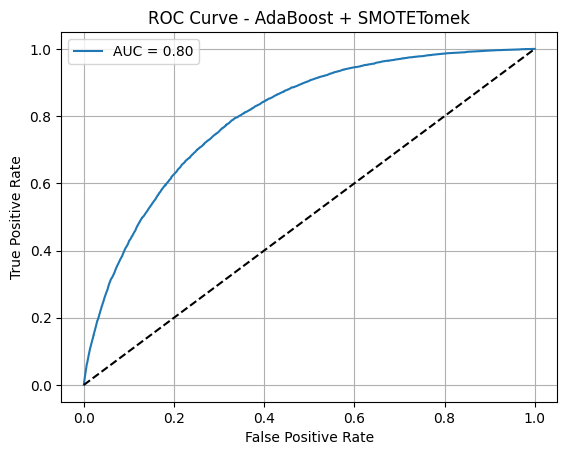

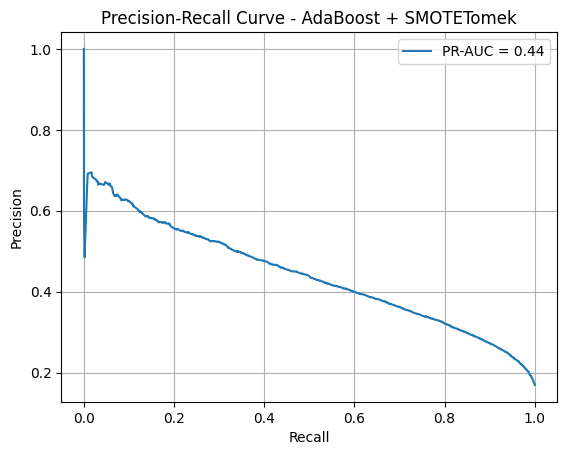

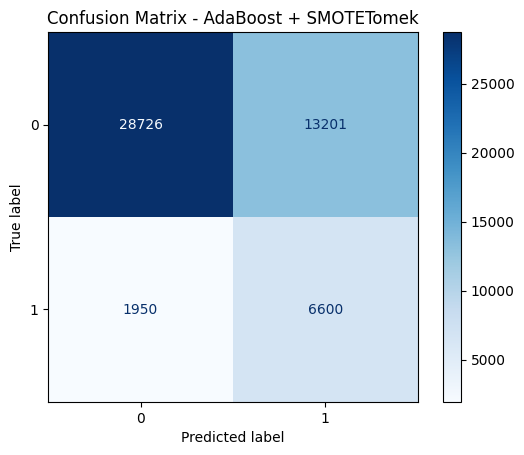

[I 2025-05-17 03:37:21,323] A new study created in memory with name: no-name-eb2116d6-d2d3-4255-ba52-c67e970e370c



🔍 Optimizing LightGBM + SMOTE...
[LightGBM] [Info] Number of positive: 31464, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002984 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 136345, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230768 -> initscore=-1.203982
[LightGBM] [Info] Start training from score -1.203982
[LightGBM] [Info] Number of positive: 31464, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 136345, number of us

[I 2025-05-17 03:37:24,878] Trial 0 finished with value: 0.3955313825311092 and parameters: {'smote_k': 3, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.3955313825311092.


[LightGBM] [Info] Number of positive: 31464, number of negative: 104882
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 136346, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230766 -> initscore=-1.203992
[LightGBM] [Info] Start training from score -1.203992
[LightGBM + SMOTE] Trial - k=3, sampling=0.30 => PR-AUC: 0.3955
[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005236 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the t

[I 2025-05-17 03:37:29,566] Trial 1 finished with value: 0.3885247444535629 and parameters: {'smote_k': 10, 'smote_sampling': 0.8}. Best is trial 0 with value: 0.3955313825311092.


[LightGBM + SMOTE] Trial - k=10, sampling=0.80 => PR-AUC: 0.3885
[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 188785, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444442 -> initscore=-0.223153
[LightGBM] [Info] Start training from score -0.223153
[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005843 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the 

[I 2025-05-17 03:37:33,980] Trial 2 finished with value: 0.3885247444535629 and parameters: {'smote_k': 10, 'smote_sampling': 0.8}. Best is trial 0 with value: 0.3955313825311092.


[LightGBM + SMOTE] Trial - k=10, sampling=0.80 => PR-AUC: 0.3885
[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 188785, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444442 -> initscore=-0.223153
[LightGBM] [Info] Start training from score -0.223153
[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004319 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the 

[I 2025-05-17 03:37:38,657] Trial 3 finished with value: 0.3891331621001093 and parameters: {'smote_k': 9, 'smote_sampling': 0.8}. Best is trial 0 with value: 0.3955313825311092.


[LightGBM + SMOTE] Trial - k=9, sampling=0.80 => PR-AUC: 0.3891
[LightGBM] [Info] Number of positive: 31464, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 136345, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230768 -> initscore=-1.203982
[LightGBM] [Info] Start training from score -1.203982
[LightGBM] [Info] Number of positive: 31464, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003744 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the t

[I 2025-05-17 03:37:43,881] Trial 4 finished with value: 0.3928776689586936 and parameters: {'smote_k': 11, 'smote_sampling': 0.3}. Best is trial 0 with value: 0.3955313825311092.


[LightGBM + SMOTE] Trial - k=11, sampling=0.30 => PR-AUC: 0.3929
✔️ Best Params for LightGBM + SMOTE: {'smote_k': 3, 'smote_sampling': 0.3}
[LightGBM] [Info] Number of positive: 39330, number of negative: 131102
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003924 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 170432, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230767 -> initscore=-1.203988
[LightGBM] [Info] Start training from score -1.203988


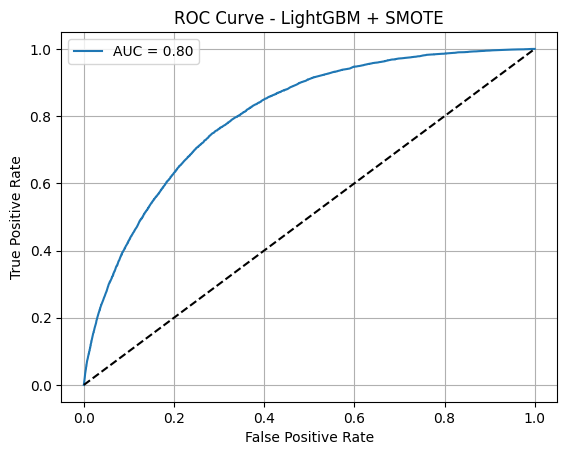

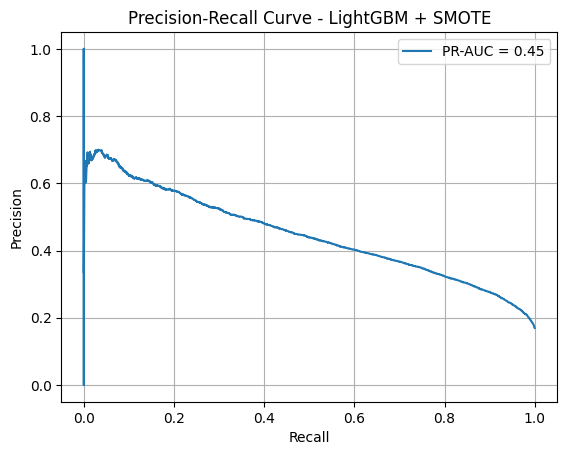

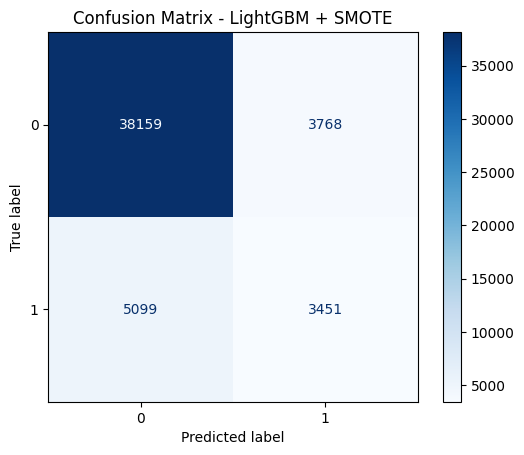

[I 2025-05-17 03:37:45,241] A new study created in memory with name: no-name-e2e1e50a-50c5-4bb5-8c90-083e4bac586d



🔍 Optimizing LightGBM + SMOTETomek...
[LightGBM] [Info] Number of positive: 94392, number of negative: 104879
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 199271, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.473687 -> initscore=-0.105351
[LightGBM] [Info] Start training from score -0.105351
[LightGBM] [Info] Number of positive: 94392, number of negative: 104878
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006102 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 199270, number 

[I 2025-05-17 03:39:59,115] Trial 0 finished with value: 0.3876692391518996 and parameters: {'smote_k': 12, 'smote_sampling': 0.9000000000000001}. Best is trial 0 with value: 0.3876692391518996.


[LightGBM + SMOTETomek] Trial - k=12, sampling=0.90 => PR-AUC: 0.3877
[LightGBM] [Info] Number of positive: 83904, number of negative: 104879
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003337 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 188783, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444447 -> initscore=-0.223134
[LightGBM] [Info] Start training from score -0.223134
[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005790 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in

[I 2025-05-17 03:42:00,087] Trial 1 finished with value: 0.3905794904242712 and parameters: {'smote_k': 7, 'smote_sampling': 0.8}. Best is trial 1 with value: 0.3905794904242712.


[LightGBM + SMOTETomek] Trial - k=7, sampling=0.80 => PR-AUC: 0.3906
[LightGBM] [Info] Number of positive: 104880, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006412 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 209761, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499998 -> initscore=-0.000010
[LightGBM] [Info] Start training from score -0.000010
[LightGBM] [Info] Number of positive: 104880, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points i

[I 2025-05-17 03:44:33,510] Trial 2 finished with value: 0.39149141912533325 and parameters: {'smote_k': 4, 'smote_sampling': 1.0}. Best is trial 2 with value: 0.39149141912533325.


[LightGBM + SMOTETomek] Trial - k=4, sampling=1.00 => PR-AUC: 0.3915
[LightGBM] [Info] Number of positive: 31464, number of negative: 104857
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 136321, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230808 -> initscore=-1.203753
[LightGBM] [Info] Start training from score -1.203753
[LightGBM] [Info] Number of positive: 31464, number of negative: 104847
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in 

[I 2025-05-17 03:45:33,425] Trial 3 finished with value: 0.39293516371092707 and parameters: {'smote_k': 14, 'smote_sampling': 0.3}. Best is trial 3 with value: 0.39293516371092707.


[LightGBM + SMOTETomek] Trial - k=14, sampling=0.30 => PR-AUC: 0.3929
[LightGBM] [Info] Number of positive: 83904, number of negative: 104878
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004134 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 188782, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444449 -> initscore=-0.223124
[LightGBM] [Info] Start training from score -0.223124
[LightGBM] [Info] Number of positive: 83904, number of negative: 104880
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007879 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in

[I 2025-05-17 03:47:36,348] Trial 4 finished with value: 0.39026037373271133 and parameters: {'smote_k': 8, 'smote_sampling': 0.8}. Best is trial 3 with value: 0.39293516371092707.


[LightGBM + SMOTETomek] Trial - k=8, sampling=0.80 => PR-AUC: 0.3903
✔️ Best Params for LightGBM + SMOTETomek: {'smote_k': 14, 'smote_sampling': 0.3}
[LightGBM] [Info] Number of positive: 39330, number of negative: 131074
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 170404, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230804 -> initscore=-1.203774
[LightGBM] [Info] Start training from score -1.203774


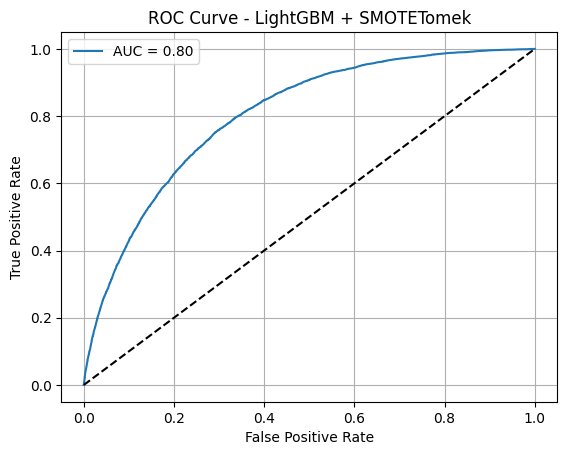

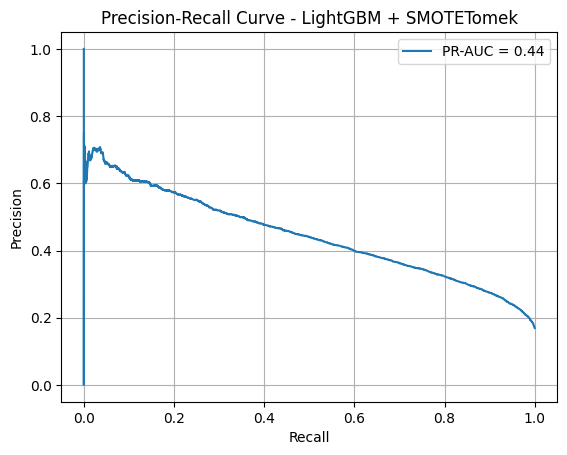

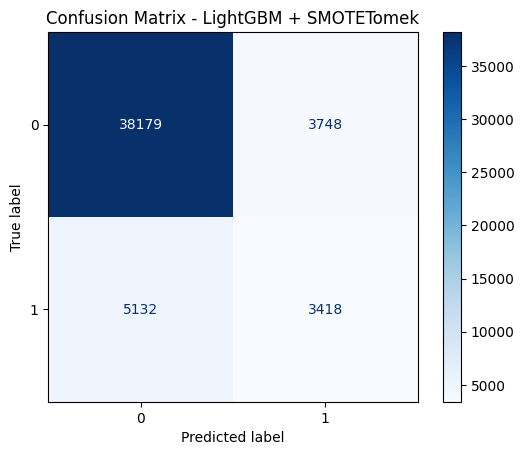


📊 Summary of All Models with Best Resampling:
                                  Model    PR-AUC   ROC-AUC  Precision  \
11           NeuralNetwork + SMOTETomek  0.446812  0.804144   0.455475   
16                     LightGBM + SMOTE  0.446270  0.804661   0.478044   
10                NeuralNetwork + SMOTE  0.445870  0.803683   0.462389   
13        GradientBoosting + SMOTETomek  0.444196  0.803274   0.325733   
17                LightGBM + SMOTETomek  0.443972  0.803347   0.476975   
12             GradientBoosting + SMOTE  0.443647  0.803729   0.396919   
14                     AdaBoost + SMOTE  0.440383  0.801738   0.376471   
15                AdaBoost + SMOTETomek  0.439722  0.801865   0.333316   
2            LogisticRegression + SMOTE  0.433425  0.799714   0.462912   
5                  XGBoost + SMOTETomek  0.429776  0.796947   0.467831   
3       LogisticRegression + SMOTETomek  0.428629  0.797785   0.375378   
4                       XGBoost + SMOTE  0.426996  0.795942   0.4

In [71]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import optuna
import json
from imblearn.combine import SMOTETomek
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import TomekLinks
from sklearn.metrics import (
    average_precision_score,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    roc_curve,
    precision_recall_curve,
    ConfusionMatrixDisplay
)
from sklearn.base import clone
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

# ✅ Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Objective function for Optuna
def objective(trial, clf_name, resampling_method):
    clf = clone(model_dict[clf_name])
    smote_k = trial.suggest_int('smote_k', 3, 15)
    smote_sampling = trial.suggest_float('smote_sampling', 0.3, 1.0, step=0.1)
    pr_scores = []

    for train_idx, test_idx in skf.split(x_train, y_train):
        X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[test_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[test_idx]

        smote = SMOTE(k_neighbors=smote_k, sampling_strategy=smote_sampling, random_state=42)

        if resampling_method == "SMOTETomek":
            resampler = SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)
        else:
            resampler = smote

        X_res, y_res = resampler.fit_resample(X_tr, y_tr)
        clf.fit(X_res, y_res)
        y_probs = clf.predict_proba(X_val)[:, 1]
        pr_auc = average_precision_score(y_val, y_probs)
        pr_scores.append(pr_auc)

    mean_pr_auc = np.mean(pr_scores)
    print(f"[{clf_name} + {resampling_method}] Trial - k={smote_k}, sampling={smote_sampling:.2f} => PR-AUC: {mean_pr_auc:.4f}")
    return mean_pr_auc

# ✅ Evaluation containers
results = {}
smote_params_dict = {}

# ✅ Tuning and evaluation
for clf_name in model_dict:
    for method in ["SMOTE", "SMOTETomek"]:
        label = f"{clf_name} + {method}"
        print(f"\n🔍 Optimizing {label}...")

        study = optuna.create_study(direction="maximize")
        study.optimize(lambda trial: objective(trial, clf_name, method), n_trials=5)

        best_params = study.best_params
        print(f"✔️ Best Params for {label}: {best_params}")

        # Store best params per model-method
        if clf_name not in smote_params_dict:
            smote_params_dict[clf_name] = {}
        smote_params_dict[clf_name][method] = best_params

        # Resample using best params
        smote_final = SMOTE(
            k_neighbors=best_params['smote_k'],
            sampling_strategy=best_params['smote_sampling'],
            random_state=42
        )
        resampler = (
            SMOTETomek(smote=smote_final, tomek=TomekLinks(), random_state=42)
            if method == "SMOTETomek" else smote_final
        )

        X_res, y_res = resampler.fit_resample(x_train, y_train)
        clf = clone(model_dict[clf_name])
        clf.fit(X_res, y_res)

        y_probs = clf.predict_proba(x_test)[:, 1]
        y_pred = clf.predict(x_test)

        roc = roc_auc_score(y_test, y_probs)
        pr = average_precision_score(y_test, y_probs)
        cm = confusion_matrix(y_test, y_pred)

        results[label] = {
            "PR-AUC": pr,
            "ROC-AUC": roc,
            "Best Params": best_params,
            "Classification Report": classification_report(y_test, y_pred, output_dict=True),
            "Confusion Matrix": cm.tolist()
        }

        # ROC Curve
        fpr, tpr, _ = roc_curve(y_test, y_probs)
        plt.figure()
        plt.plot(fpr, tpr, label=f'AUC = {roc:.2f}')
        plt.plot([0, 1], [0, 1], 'k--')
        plt.title(f'ROC Curve - {label}')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend()
        plt.grid(True)
        plt.show()

        # PR Curve
        precision, recall, _ = precision_recall_curve(y_test, y_probs)
        plt.figure()
        plt.plot(recall, precision, label=f'PR-AUC = {pr:.2f}')
        plt.title(f'Precision-Recall Curve - {label}')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.legend()
        plt.grid(True)
        plt.show()

        # Confusion Matrix
        fig, ax = plt.subplots()
        ConfusionMatrixDisplay(confusion_matrix=cm).plot(ax=ax, cmap='Blues', values_format='d')
        plt.title(f'Confusion Matrix - {label}')
        plt.grid(False)
        plt.show()

# ✅ Build summary table
summary_data = []
for model_label, metrics in results.items():
    entry = {
        "Model": model_label,
        "PR-AUC": metrics["PR-AUC"],
        "ROC-AUC": metrics["ROC-AUC"],
        "Precision": metrics["Classification Report"]["1"]["precision"],
        "Recall": metrics["Classification Report"]["1"]["recall"],
        "F1-Score": metrics["Classification Report"]["1"]["f1-score"],
        "Confusion Matrix": metrics["Confusion Matrix"],
        "Classification Report": metrics["Classification Report"]
    }
    summary_data.append(entry)

summary_df = pd.DataFrame(summary_data).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Summary of All Models with Best Resampling:")
print(summary_df)

# ✅ Save best tuning params
with open("smote_params_dict.json", "w") as f:
    json.dump(smote_params_dict, f, indent=2)

### Look for the best parameter for SVMSMOTE

[I 2025-05-25 18:33:33,784] A new study created in memory with name: no-name-a100b6de-de2c-46d7-b4e3-5a386eff6ecc



🔍 Optimizing DecisionTreeClassifier + SVMSMOTE...


[I 2025-05-25 19:26:22,627] Trial 0 finished with value: 0.2884814693401595 and parameters: {'smote_k': 14, 'smote_sampling': 1.0, 'm_neighbors': 20, 'out_step': 0.6}. Best is trial 0 with value: 0.2884814693401595.
[I 2025-05-25 20:17:21,932] Trial 1 finished with value: 0.29025861268945824 and parameters: {'smote_k': 13, 'smote_sampling': 0.7, 'm_neighbors': 13, 'out_step': 0.9}. Best is trial 1 with value: 0.29025861268945824.
[I 2025-05-25 21:09:44,024] Trial 2 finished with value: 0.2888557485679956 and parameters: {'smote_k': 5, 'smote_sampling': 0.6000000000000001, 'm_neighbors': 9, 'out_step': 0.7000000000000001}. Best is trial 1 with value: 0.29025861268945824.
[I 2025-05-25 22:01:17,137] Trial 3 finished with value: 0.28645599761705043 and parameters: {'smote_k': 8, 'smote_sampling': 0.8, 'm_neighbors': 18, 'out_step': 0.6}. Best is trial 1 with value: 0.29025861268945824.
[I 2025-05-25 22:53:23,597] Trial 4 finished with value: 0.28687495461859863 and parameters: {'smote_k':

✔️ Best Params for DecisionTreeClassifier + SVMSMOTE: {'smote_k': 13, 'smote_sampling': 0.7, 'm_neighbors': 13, 'out_step': 0.9}


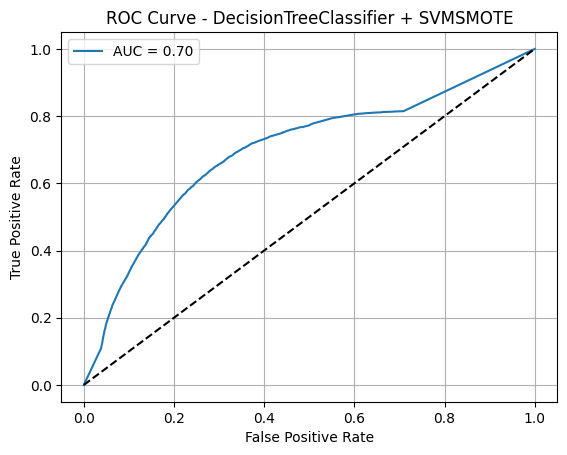

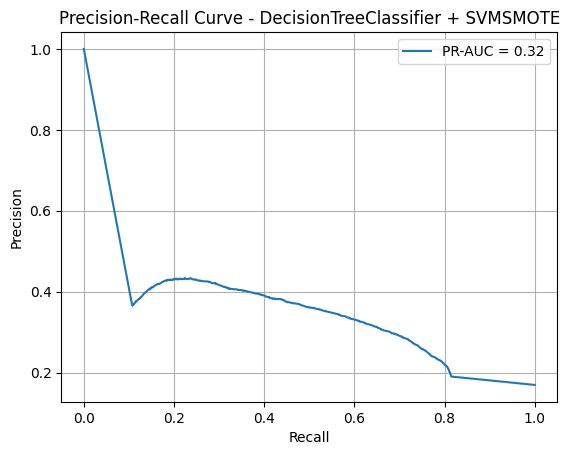

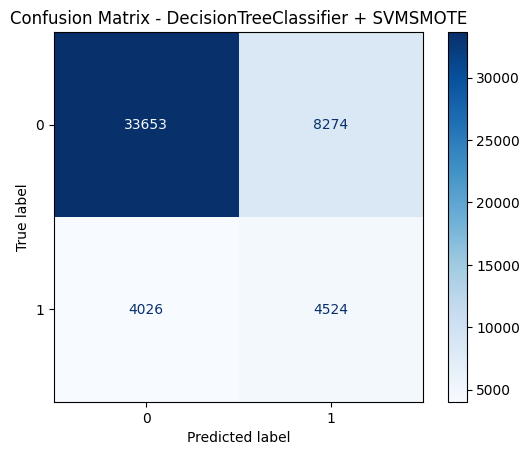

[I 2025-05-25 23:03:56,461] A new study created in memory with name: no-name-ff9a3f60-ebab-4e16-91f2-aa6451e79ed4



🔍 Optimizing LogisticRegression + SVMSMOTE...


[I 2025-05-25 23:56:24,182] Trial 0 finished with value: 0.3820533368569533 and parameters: {'smote_k': 11, 'smote_sampling': 0.4, 'm_neighbors': 19, 'out_step': 0.4}. Best is trial 0 with value: 0.3820533368569533.
[I 2025-05-26 00:48:03,785] Trial 1 finished with value: 0.38041855609575026 and parameters: {'smote_k': 8, 'smote_sampling': 1.0, 'm_neighbors': 10, 'out_step': 0.30000000000000004}. Best is trial 0 with value: 0.3820533368569533.
[I 2025-05-26 01:39:21,099] Trial 2 finished with value: 0.38230123870710075 and parameters: {'smote_k': 15, 'smote_sampling': 0.3, 'm_neighbors': 8, 'out_step': 0.30000000000000004}. Best is trial 2 with value: 0.38230123870710075.
[I 2025-05-26 02:30:53,598] Trial 3 finished with value: 0.37832021520094533 and parameters: {'smote_k': 14, 'smote_sampling': 0.9000000000000001, 'm_neighbors': 5, 'out_step': 0.2}. Best is trial 2 with value: 0.38230123870710075.
[I 2025-05-26 03:23:57,747] Trial 4 finished with value: 0.38034025251436354 and parame

✔️ Best Params for LogisticRegression + SVMSMOTE: {'smote_k': 15, 'smote_sampling': 0.3, 'm_neighbors': 8, 'out_step': 0.30000000000000004}


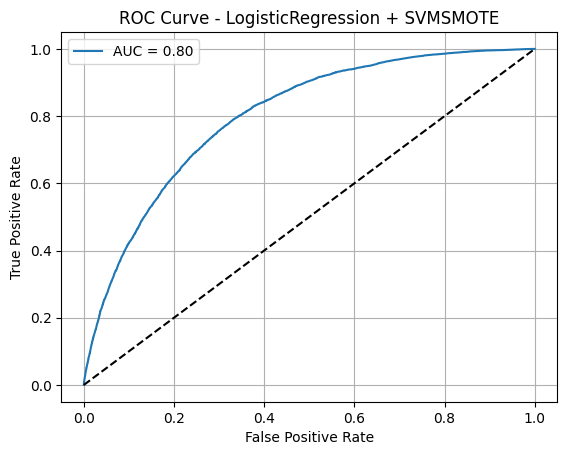

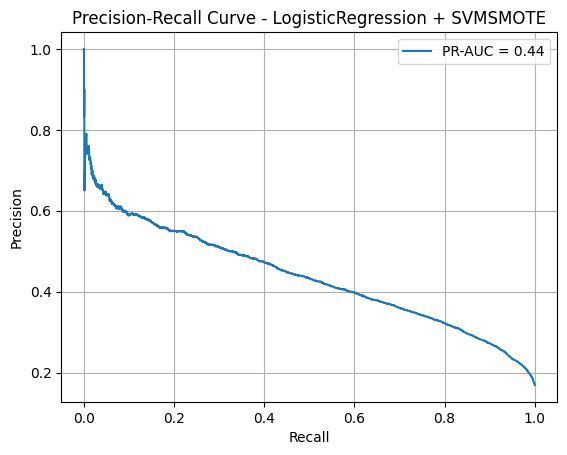

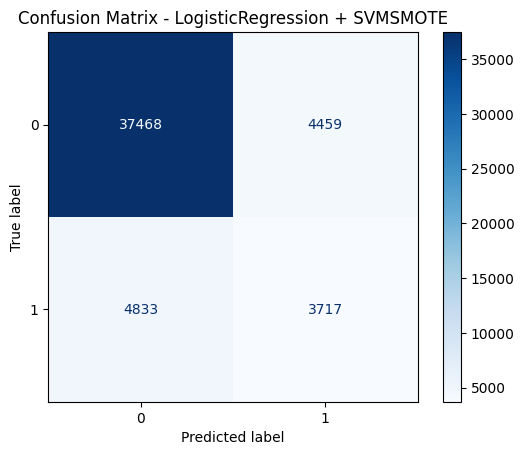

[I 2025-05-26 03:34:27,434] A new study created in memory with name: no-name-6dc0160a-c0ad-4884-8b88-9d1e681efabe



🔍 Optimizing XGBoost + SVMSMOTE...


[I 2025-05-26 04:27:08,382] Trial 0 finished with value: 0.38686106735271986 and parameters: {'smote_k': 7, 'smote_sampling': 0.5, 'm_neighbors': 20, 'out_step': 0.30000000000000004}. Best is trial 0 with value: 0.38686106735271986.
[I 2025-05-26 05:19:21,828] Trial 1 finished with value: 0.3861065033426096 and parameters: {'smote_k': 14, 'smote_sampling': 0.7, 'm_neighbors': 15, 'out_step': 0.7000000000000001}. Best is trial 0 with value: 0.38686106735271986.
[I 2025-05-26 06:10:40,264] Trial 2 finished with value: 0.3881563040612545 and parameters: {'smote_k': 6, 'smote_sampling': 0.4, 'm_neighbors': 12, 'out_step': 0.7000000000000001}. Best is trial 2 with value: 0.3881563040612545.
[I 2025-05-26 07:01:24,630] Trial 3 finished with value: 0.38568401089438964 and parameters: {'smote_k': 15, 'smote_sampling': 0.9000000000000001, 'm_neighbors': 10, 'out_step': 0.2}. Best is trial 2 with value: 0.3881563040612545.
[I 2025-05-26 07:53:23,851] Trial 4 finished with value: 0.38468963382332

✔️ Best Params for XGBoost + SVMSMOTE: {'smote_k': 6, 'smote_sampling': 0.4, 'm_neighbors': 12, 'out_step': 0.7000000000000001}


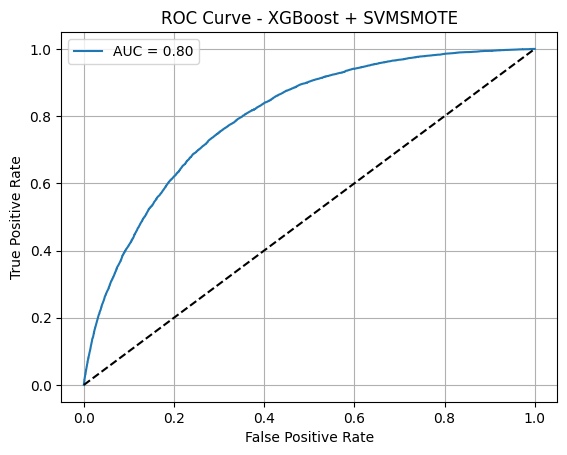

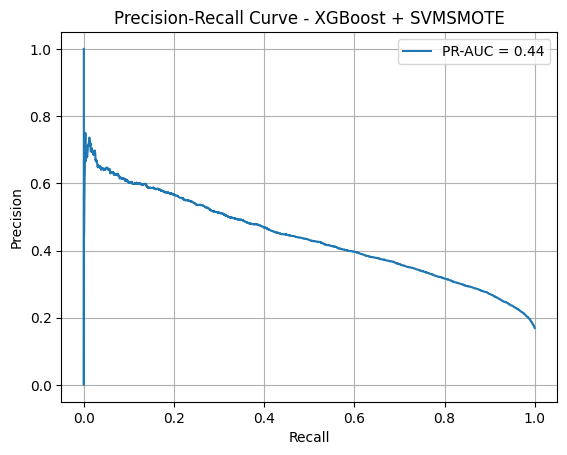

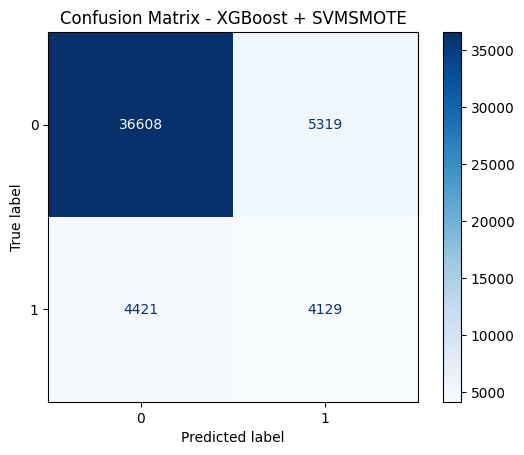

[I 2025-05-26 08:04:01,255] A new study created in memory with name: no-name-fb58013b-e2df-4a36-af7e-c562315f5909



🔍 Optimizing RandomForestClassifier + SVMSMOTE...


[I 2025-05-26 08:57:04,572] Trial 0 finished with value: 0.3208450627541027 and parameters: {'smote_k': 13, 'smote_sampling': 0.4, 'm_neighbors': 12, 'out_step': 0.2}. Best is trial 0 with value: 0.3208450627541027.
[I 2025-05-26 09:50:45,575] Trial 1 finished with value: 0.31934543268322724 and parameters: {'smote_k': 5, 'smote_sampling': 0.4, 'm_neighbors': 20, 'out_step': 0.1}. Best is trial 0 with value: 0.3208450627541027.
[I 2025-05-26 10:43:24,913] Trial 2 finished with value: 0.31696660868043774 and parameters: {'smote_k': 14, 'smote_sampling': 0.6000000000000001, 'm_neighbors': 5, 'out_step': 0.5}. Best is trial 0 with value: 0.3208450627541027.
[I 2025-05-26 11:36:21,930] Trial 3 finished with value: 0.3142472957797845 and parameters: {'smote_k': 4, 'smote_sampling': 0.8, 'm_neighbors': 11, 'out_step': 1.0}. Best is trial 0 with value: 0.3208450627541027.
[I 2025-05-26 12:30:00,150] Trial 4 finished with value: 0.31942224013342785 and parameters: {'smote_k': 12, 'smote_sampli

✔️ Best Params for RandomForestClassifier + SVMSMOTE: {'smote_k': 13, 'smote_sampling': 0.4, 'm_neighbors': 12, 'out_step': 0.2}


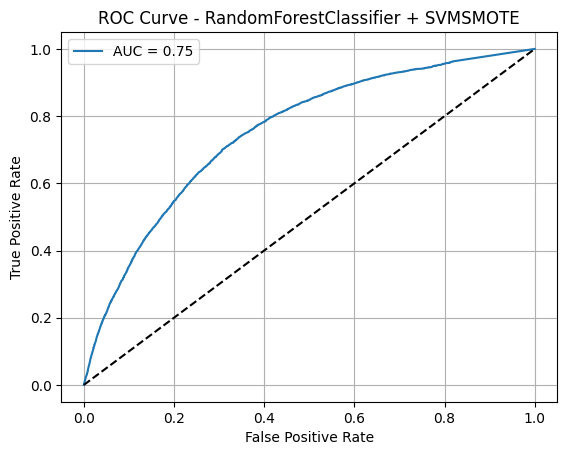

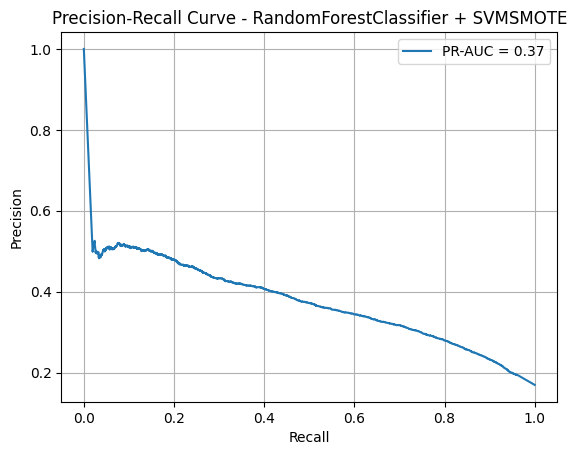

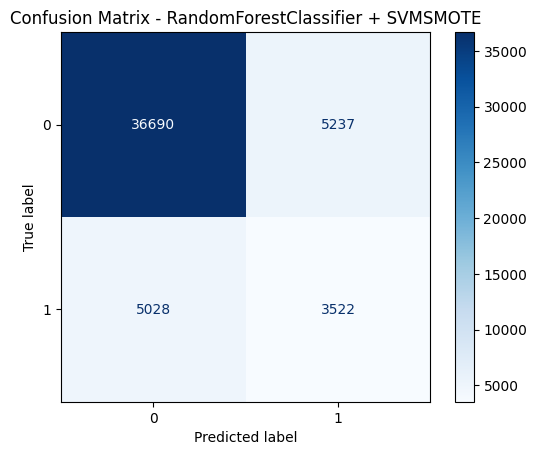

[I 2025-05-26 12:40:55,684] A new study created in memory with name: no-name-e128b30d-291f-459d-aae9-72e1d8b0e762



🔍 Optimizing KNN + SVMSMOTE...


[I 2025-05-26 13:32:26,095] Trial 0 finished with value: 0.270101901785833 and parameters: {'smote_k': 4, 'smote_sampling': 0.4, 'm_neighbors': 15, 'out_step': 0.8}. Best is trial 0 with value: 0.270101901785833.
[I 2025-05-26 14:23:59,703] Trial 1 finished with value: 0.27123835675430186 and parameters: {'smote_k': 9, 'smote_sampling': 0.3, 'm_neighbors': 5, 'out_step': 0.2}. Best is trial 1 with value: 0.27123835675430186.
[I 2025-05-26 15:15:37,264] Trial 2 finished with value: 0.2709790216326938 and parameters: {'smote_k': 6, 'smote_sampling': 0.3, 'm_neighbors': 14, 'out_step': 0.7000000000000001}. Best is trial 1 with value: 0.27123835675430186.
[I 2025-05-26 16:07:22,413] Trial 3 finished with value: 0.2673488688080752 and parameters: {'smote_k': 6, 'smote_sampling': 1.0, 'm_neighbors': 10, 'out_step': 0.9}. Best is trial 1 with value: 0.27123835675430186.
[I 2025-05-26 16:59:30,681] Trial 4 finished with value: 0.2691002697868067 and parameters: {'smote_k': 11, 'smote_sampling'

✔️ Best Params for KNN + SVMSMOTE: {'smote_k': 9, 'smote_sampling': 0.3, 'm_neighbors': 5, 'out_step': 0.2}


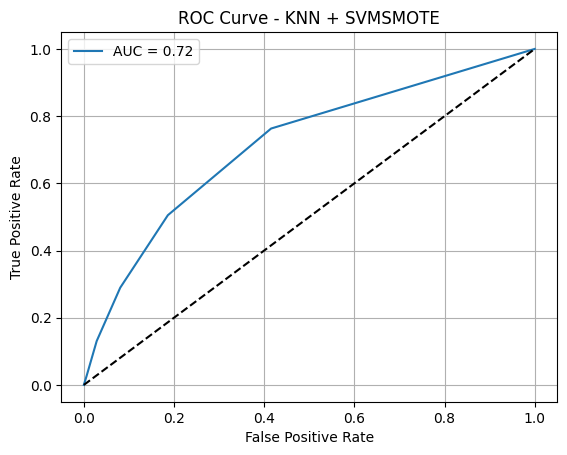

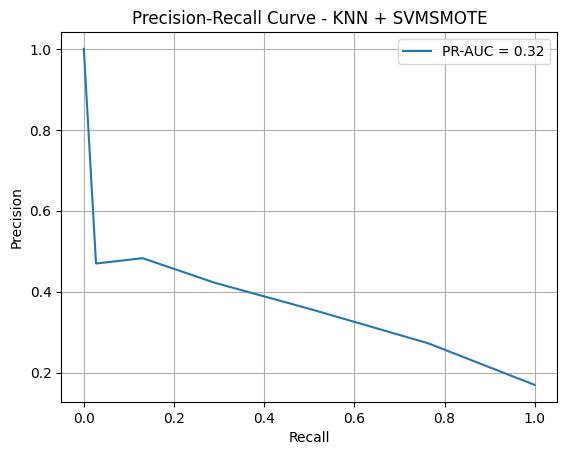

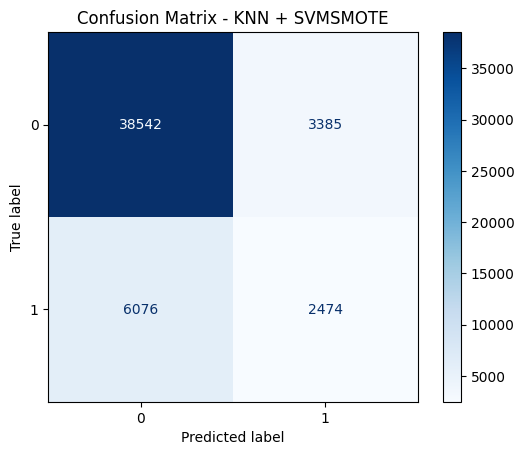

[I 2025-05-26 17:10:35,229] A new study created in memory with name: no-name-108d7947-9e7f-48f8-b5b7-9ebcfd7c8856



🔍 Optimizing NeuralNetwork + SVMSMOTE...


[I 2025-05-26 18:23:42,400] Trial 0 finished with value: 0.392800151102579 and parameters: {'smote_k': 7, 'smote_sampling': 0.6000000000000001, 'm_neighbors': 12, 'out_step': 0.8}. Best is trial 0 with value: 0.392800151102579.
[I 2025-05-26 19:38:34,396] Trial 1 finished with value: 0.39197236867329527 and parameters: {'smote_k': 10, 'smote_sampling': 0.5, 'm_neighbors': 20, 'out_step': 0.1}. Best is trial 0 with value: 0.392800151102579.
[I 2025-05-26 20:45:44,958] Trial 2 finished with value: 0.3940355054277383 and parameters: {'smote_k': 9, 'smote_sampling': 0.4, 'm_neighbors': 6, 'out_step': 1.0}. Best is trial 2 with value: 0.3940355054277383.
[I 2025-05-26 21:58:56,206] Trial 3 finished with value: 0.3910324599217864 and parameters: {'smote_k': 12, 'smote_sampling': 1.0, 'm_neighbors': 8, 'out_step': 0.30000000000000004}. Best is trial 2 with value: 0.3940355054277383.
[I 2025-05-26 22:59:20,100] Trial 4 finished with value: 0.39307053797827535 and parameters: {'smote_k': 13, 's

✔️ Best Params for NeuralNetwork + SVMSMOTE: {'smote_k': 9, 'smote_sampling': 0.4, 'm_neighbors': 6, 'out_step': 1.0}


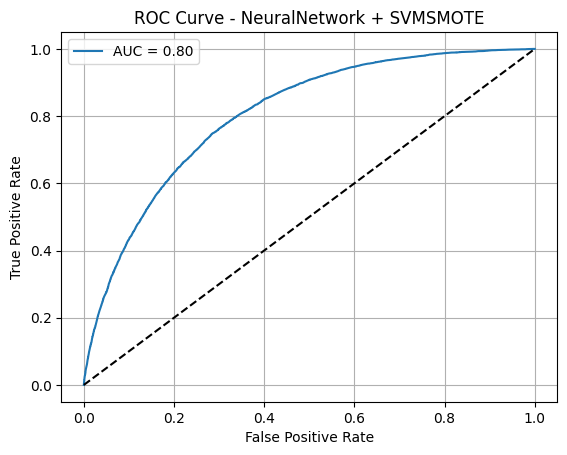

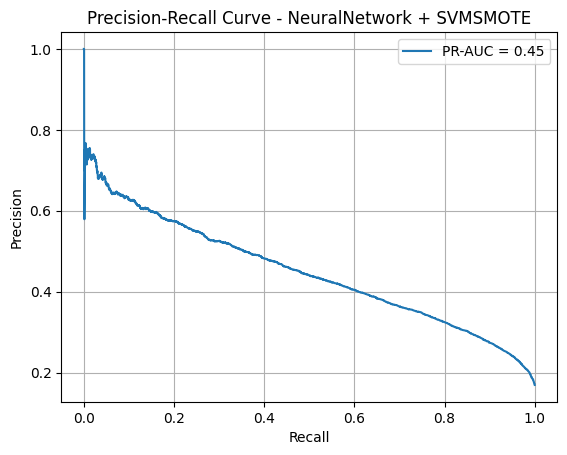

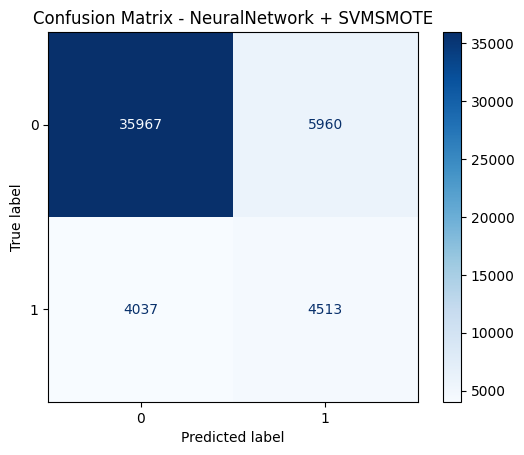

[I 2025-05-26 23:10:23,431] A new study created in memory with name: no-name-66a1066c-622e-4b1a-8d5f-4b69377db14c



🔍 Optimizing GradientBoosting + SVMSMOTE...


[I 2025-05-26 23:50:02,461] Trial 0 finished with value: 0.3948358154818249 and parameters: {'smote_k': 7, 'smote_sampling': 0.8, 'm_neighbors': 8, 'out_step': 0.1}. Best is trial 0 with value: 0.3948358154818249.
[I 2025-05-27 00:30:04,784] Trial 1 finished with value: 0.3941129065310711 and parameters: {'smote_k': 9, 'smote_sampling': 0.9000000000000001, 'm_neighbors': 19, 'out_step': 0.7000000000000001}. Best is trial 0 with value: 0.3948358154818249.
[I 2025-05-27 01:09:17,257] Trial 2 finished with value: 0.3953793569072722 and parameters: {'smote_k': 13, 'smote_sampling': 0.3, 'm_neighbors': 9, 'out_step': 0.6}. Best is trial 2 with value: 0.3953793569072722.
[I 2025-05-27 01:48:56,591] Trial 3 finished with value: 0.3945980778529439 and parameters: {'smote_k': 10, 'smote_sampling': 0.9000000000000001, 'm_neighbors': 14, 'out_step': 0.1}. Best is trial 2 with value: 0.3953793569072722.
[I 2025-05-27 02:28:15,715] Trial 4 finished with value: 0.39466210871545554 and parameters: {'

✔️ Best Params for GradientBoosting + SVMSMOTE: {'smote_k': 13, 'smote_sampling': 0.3, 'm_neighbors': 9, 'out_step': 0.6}


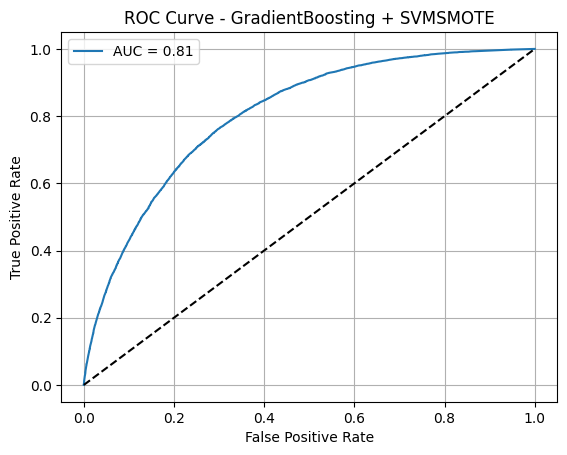

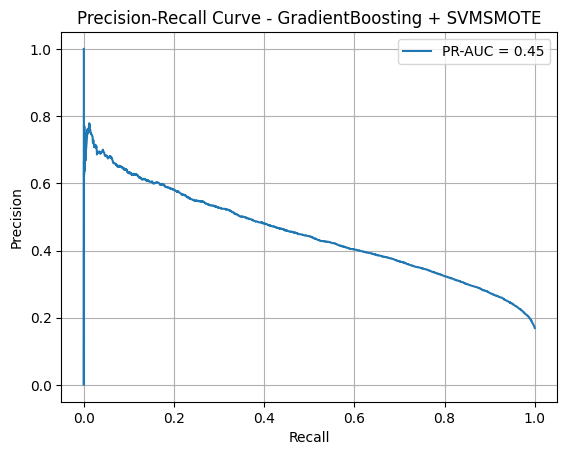

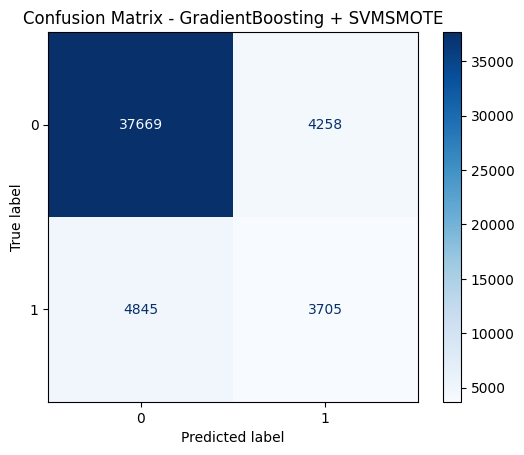

[I 2025-05-27 02:36:00,953] A new study created in memory with name: no-name-c54d84de-d3bd-434e-9083-16221979f2f0



🔍 Optimizing AdaBoost + SVMSMOTE...


[I 2025-05-27 03:14:12,935] Trial 0 finished with value: 0.3848923002641405 and parameters: {'smote_k': 6, 'smote_sampling': 0.3, 'm_neighbors': 19, 'out_step': 0.2}. Best is trial 0 with value: 0.3848923002641405.
[I 2025-05-27 03:53:12,114] Trial 1 finished with value: 0.3831798911454515 and parameters: {'smote_k': 9, 'smote_sampling': 0.4, 'm_neighbors': 13, 'out_step': 0.2}. Best is trial 0 with value: 0.3848923002641405.
[I 2025-05-27 04:31:34,468] Trial 2 finished with value: 0.3816191230586548 and parameters: {'smote_k': 15, 'smote_sampling': 0.6000000000000001, 'm_neighbors': 20, 'out_step': 0.30000000000000004}. Best is trial 0 with value: 0.3848923002641405.
[I 2025-05-27 05:10:15,650] Trial 3 finished with value: 0.3827933396632045 and parameters: {'smote_k': 10, 'smote_sampling': 0.4, 'm_neighbors': 11, 'out_step': 0.7000000000000001}. Best is trial 0 with value: 0.3848923002641405.
[I 2025-05-27 05:48:46,834] Trial 4 finished with value: 0.3830385998603295 and parameters: 

✔️ Best Params for AdaBoost + SVMSMOTE: {'smote_k': 6, 'smote_sampling': 0.3, 'm_neighbors': 19, 'out_step': 0.2}


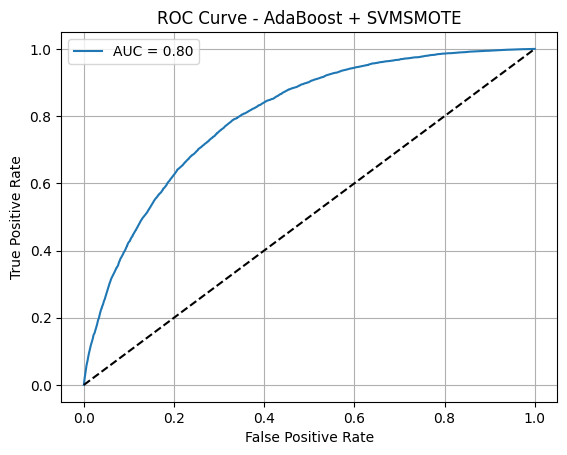

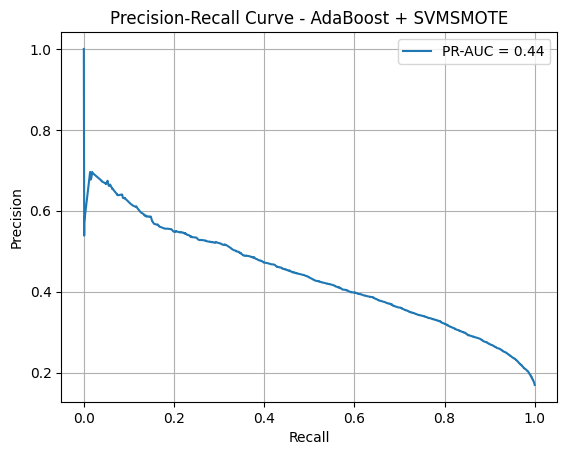

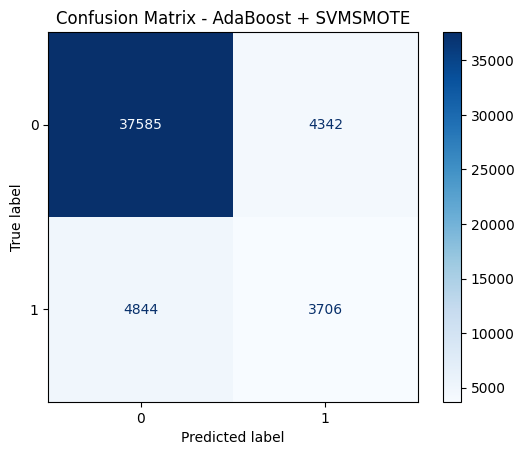

[I 2025-05-27 05:56:30,119] A new study created in memory with name: no-name-672239d7-a13c-4d5a-a6a6-b9caf625a1a6



🔍 Optimizing LightGBM + SVMSMOTE...
[LightGBM] [Info] Number of positive: 31464, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009729 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 136345, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230768 -> initscore=-1.203982
[LightGBM] [Info] Start training from score -1.203982
[LightGBM] [Info] Number of positive: 31464, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007897 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 136345, number of

[I 2025-05-27 06:34:47,335] Trial 0 finished with value: 0.3959964200907358 and parameters: {'smote_k': 15, 'smote_sampling': 0.3, 'm_neighbors': 6, 'out_step': 0.4}. Best is trial 0 with value: 0.3959964200907358.


[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 188785, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.444442 -> initscore=-0.223153
[LightGBM] [Info] Start training from score -0.223153
[LightGBM] [Info] Number of positive: 83904, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013143 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 188785, number of used features: 11
[LightGBM] [Info] 

[I 2025-05-27 07:13:01,749] Trial 1 finished with value: 0.39469601164623336 and parameters: {'smote_k': 8, 'smote_sampling': 0.8, 'm_neighbors': 9, 'out_step': 0.4}. Best is trial 0 with value: 0.3959964200907358.


[LightGBM] [Info] Number of positive: 104881, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011603 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 209762, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 104881, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014788 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 209762, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0

[I 2025-05-27 07:51:20,409] Trial 2 finished with value: 0.3935334631590487 and parameters: {'smote_k': 9, 'smote_sampling': 1.0, 'm_neighbors': 10, 'out_step': 0.5}. Best is trial 0 with value: 0.3959964200907358.


[LightGBM] [Info] Number of positive: 41952, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007321 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 146833, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.285712 -> initscore=-0.916300
[LightGBM] [Info] Start training from score -0.916300
[LightGBM] [Info] Number of positive: 41952, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010837 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 146833, number of used features: 11
[LightGBM] [Info] 

[I 2025-05-27 08:30:08,303] Trial 3 finished with value: 0.39403656346057775 and parameters: {'smote_k': 13, 'smote_sampling': 0.4, 'm_neighbors': 16, 'out_step': 0.6}. Best is trial 0 with value: 0.3959964200907358.


[LightGBM] [Info] Number of positive: 73416, number of negative: 104881
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 178297, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.411762 -> initscore=-0.356684
[LightGBM] [Info] Start training from score -0.356684
[LightGBM] [Info] Number of positive: 73416, number of negative: 104881
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.031451 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 178297, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.411762 -> initscore=-0.356684
[L

[I 2025-05-27 09:08:57,146] Trial 4 finished with value: 0.3935760480990849 and parameters: {'smote_k': 15, 'smote_sampling': 0.7, 'm_neighbors': 18, 'out_step': 0.1}. Best is trial 0 with value: 0.3959964200907358.


✔️ Best Params for LightGBM + SVMSMOTE: {'smote_k': 15, 'smote_sampling': 0.3, 'm_neighbors': 6, 'out_step': 0.4}
[LightGBM] [Info] Number of positive: 39330, number of negative: 131102
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009121 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 42
[LightGBM] [Info] Number of data points in the train set: 170432, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230767 -> initscore=-1.203988
[LightGBM] [Info] Start training from score -1.203988


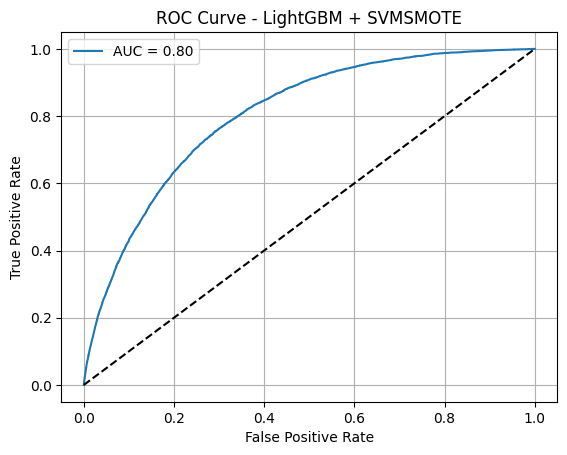

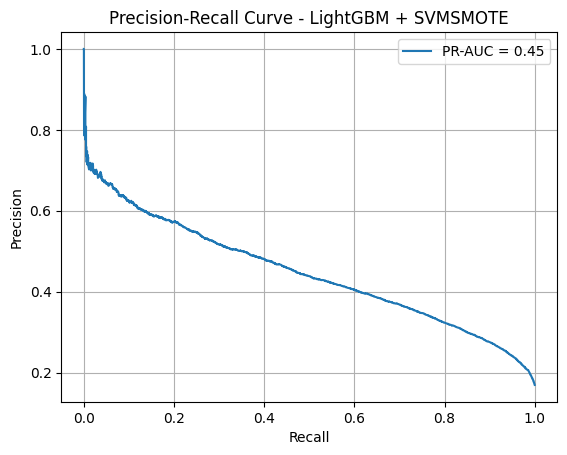

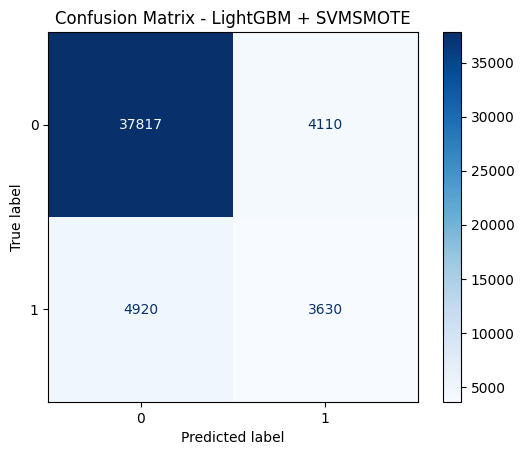


📊 Summary of All Models with SVMSMOTE:
                               Model    PR-AUC   ROC-AUC  Precision    Recall  \
6        GradientBoosting + SVMSMOTE  0.449503  0.805174   0.465277  0.433333   
5           NeuralNetwork + SVMSMOTE  0.447888  0.804694   0.430918  0.527836   
8                LightGBM + SVMSMOTE  0.446370  0.804599   0.468992  0.424561   
7                AdaBoost + SVMSMOTE  0.438277  0.800439   0.460487  0.433450   
2                 XGBoost + SVMSMOTE  0.436555  0.798641   0.437024  0.482924   
1      LogisticRegression + SVMSMOTE  0.436328  0.800251   0.454623  0.434737   
3  RandomForestClassifier + SVMSMOTE  0.370432  0.753156   0.402101  0.411930   
0  DecisionTreeClassifier + SVMSMOTE  0.323282  0.698359   0.353493  0.529123   
4                     KNN + SVMSMOTE  0.316960  0.715355   0.422256  0.289357   

   F1-Score               Confusion Matrix  \
6  0.448737  [[37669, 4258], [4845, 3705]]   
5  0.474478  [[35967, 5960], [4037, 4513]]   
8  0.445672

NameError: name 'json' is not defined

In [62]:
from sklearn.base import clone

# ✅ Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Evaluation containers
results = {}
svmsmote_params_dict = {}

# ✅ Tuning and evaluation using SVMSMOTE only
for clf_name in model_dict:
    label = f"{clf_name} + SVMSMOTE"
    print(f"\n🔍 Optimizing {label}...")

    def objective(trial):
        clf = clone(model_dict[clf_name])
        smote_k = trial.suggest_int('smote_k', 3, 15)
        smote_sampling = trial.suggest_float('smote_sampling', 0.3, 1.0, step=0.1)
        m_neighbors = trial.suggest_int('m_neighbors', 5, 20)
        out_step = trial.suggest_float('out_step', 0.1, 1.0, step=0.1)
        pr_scores = []

        for train_idx, test_idx in skf.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[test_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[test_idx]

            resampler = SVMSMOTE(
                k_neighbors=smote_k,
                m_neighbors=m_neighbors,
                sampling_strategy=smote_sampling,
                out_step=out_step,
                random_state=42
            )

            X_res, y_res = resampler.fit_resample(X_tr, y_tr)
            clf.fit(X_res, y_res)
            y_probs = clf.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # Optimize
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=5)

    best_params = study.best_params
    print(f"✔️ Best Params for {label}: {best_params}")

    svmsmote_params_dict[clf_name] = best_params

    # Final model training and test evaluation
    resampler = SVMSMOTE(
        k_neighbors=best_params['smote_k'],
        m_neighbors=best_params['m_neighbors'],
        sampling_strategy=best_params['smote_sampling'],
        out_step=best_params['out_step'],
        random_state=42
    )
    X_res, y_res = resampler.fit_resample(x_train, y_train)
    clf = clone(model_dict[clf_name])
    clf.fit(X_res, y_res)

    y_probs = clf.predict_proba(x_test)[:, 1]
    y_pred = clf.predict(x_test)

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    cm = confusion_matrix(y_test, y_pred)

    results[label] = {
        "PR-AUC": pr,
        "ROC-AUC": roc,
        "Best Params": best_params,
        "Classification Report": classification_report(y_test, y_pred, output_dict=True),
        "Confusion Matrix": cm.tolist()
    }

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_probs)
    plt.figure()
    plt.plot(fpr, tpr, label=f'AUC = {roc:.2f}')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'ROC Curve - {label}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.grid(True)
    plt.show()

    # PR Curve
    precision, recall, _ = precision_recall_curve(y_test, y_probs)
    plt.figure()
    plt.plot(recall, precision, label=f'PR-AUC = {pr:.2f}')
    plt.title(f'Precision-Recall Curve - {label}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Confusion Matrix
    fig, ax = plt.subplots()
    ConfusionMatrixDisplay(confusion_matrix=cm).plot(ax=ax, cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix - {label}')
    plt.grid(False)
    plt.show()

# ✅ Build summary table
summary_data = []
for model_label, metrics in results.items():
    entry = {
        "Model": model_label,
        "PR-AUC": metrics["PR-AUC"],
        "ROC-AUC": metrics["ROC-AUC"],
        "Precision": metrics["Classification Report"]["1"]["precision"],
        "Recall": metrics["Classification Report"]["1"]["recall"],
        "F1-Score": metrics["Classification Report"]["1"]["f1-score"],
        "Confusion Matrix": metrics["Confusion Matrix"],
        "Classification Report": metrics["Classification Report"]
    }
    summary_data.append(entry)

summary_df = pd.DataFrame(summary_data).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Summary of All Models with SVMSMOTE:")
print(summary_df)

# ✅ Save best tuning params
with open(r"C:\Users\sherm\OneDrive\Documents\P2\svmsmote_params_dict.json", "w") as f:
    json.dump(svmsmote_params_dict, f, indent=2)

In [64]:
import json

with open(r"C:\Users\sherm\OneDrive\Documents\P2\svmsmote_params_dict.json", "w") as f:
    json.dump(svmsmote_params_dict, f, indent=2)

In [72]:
# ✅ Load tuned SMOTE parameters from file
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

smote_params_dict

{'DecisionTreeClassifier': {'SMOTE': {'smote_k': 13,
   'smote_sampling': 0.9000000000000001},
  'SMOTETomek': {'smote_k': 14, 'smote_sampling': 0.5}},
 'LogisticRegression': {'SMOTE': {'smote_k': 15, 'smote_sampling': 0.3},
  'SMOTETomek': {'smote_k': 13, 'smote_sampling': 0.6000000000000001}},
 'XGBoost': {'SMOTE': {'smote_k': 9, 'smote_sampling': 0.3},
  'SMOTETomek': {'smote_k': 3, 'smote_sampling': 0.3}},
 'RandomForestClassifier': {'SMOTE': {'smote_k': 13, 'smote_sampling': 0.3},
  'SMOTETomek': {'smote_k': 14, 'smote_sampling': 0.4}},
 'KNN': {'SMOTE': {'smote_k': 7, 'smote_sampling': 0.5},
  'SMOTETomek': {'smote_k': 9, 'smote_sampling': 0.3}},
 'NeuralNetwork': {'SMOTE': {'smote_k': 4, 'smote_sampling': 0.4},
  'SMOTETomek': {'smote_k': 3, 'smote_sampling': 0.3}},
 'GradientBoosting': {'SMOTE': {'smote_k': 8, 'smote_sampling': 0.5},
  'SMOTETomek': {'smote_k': 6, 'smote_sampling': 0.9000000000000001}},
 'AdaBoost': {'SMOTE': {'smote_k': 4, 'smote_sampling': 0.6000000000000001}

In [53]:
# ✅ Load tuned SVMSmote parameters from file
with open(r"C:\Users\sherm\OneDrive\Documents\P2\svmsmote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

smote_params_dict

{'DecisionTreeClassifier': {'smote_k': 13,
  'smote_sampling': 0.7,
  'm_neighbors': 13,
  'out_step': 0.9},
 'LogisticRegression': {'smote_k': 15,
  'smote_sampling': 0.3,
  'm_neighbors': 8,
  'out_step': 0.30000000000000004},
 'XGBoost': {'smote_k': 6,
  'smote_sampling': 0.4,
  'm_neighbors': 12,
  'out_step': 0.7000000000000001},
 'RandomForestClassifier': {'smote_k': 13,
  'smote_sampling': 0.4,
  'm_neighbors': 12,
  'out_step': 0.2},
 'KNN': {'smote_k': 9,
  'smote_sampling': 0.3,
  'm_neighbors': 5,
  'out_step': 0.2},
 'NeuralNetwork': {'smote_k': 9,
  'smote_sampling': 0.4,
  'm_neighbors': 6,
  'out_step': 1.0},
 'GradientBoosting': {'smote_k': 13,
  'smote_sampling': 0.3,
  'm_neighbors': 9,
  'out_step': 0.6},
 'AdaBoost': {'smote_k': 6,
  'smote_sampling': 0.3,
  'm_neighbors': 19,
  'out_step': 0.2},
 'LightGBM': {'smote_k': 15,
  'smote_sampling': 0.3,
  'm_neighbors': 6,
  'out_step': 0.4}}

#### Baseline model (Standard VS Model specified)


🔍 Evaluating DecisionTreeClassifier
  ➤ StandardSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(131102)}
  ➤ StandardSMOTETomek
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131100), 1: np.int64(131100)}
  ➤ SMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(117991)}
  ➤ SMOTETomek
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131094), 1: np.int64(65551)}

🔍 Evaluating LogisticRegression
  ➤ StandardSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(131102)}
  ➤ StandardSMOTETomek
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131100), 1: np.int64(131100)}
  ➤ SMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(39330)}
  ➤ SMOTET

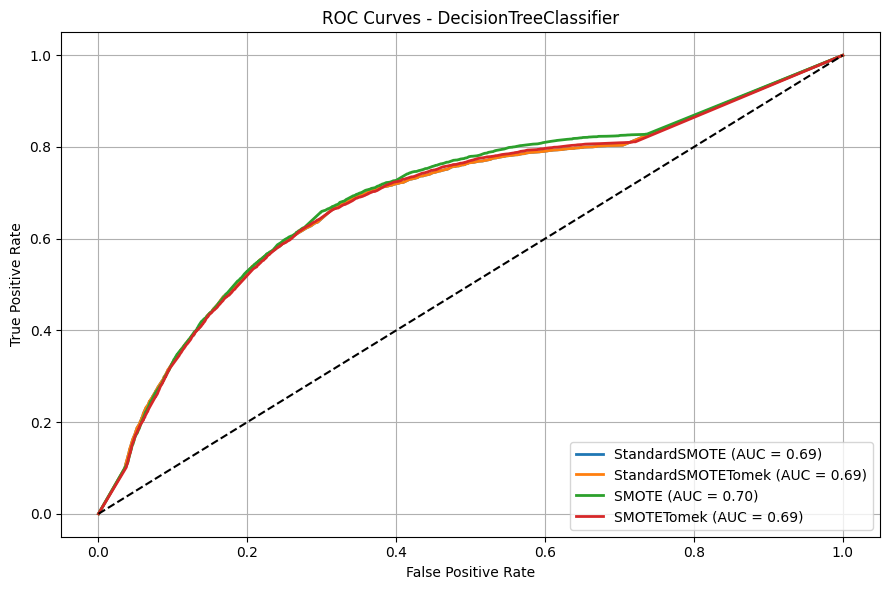

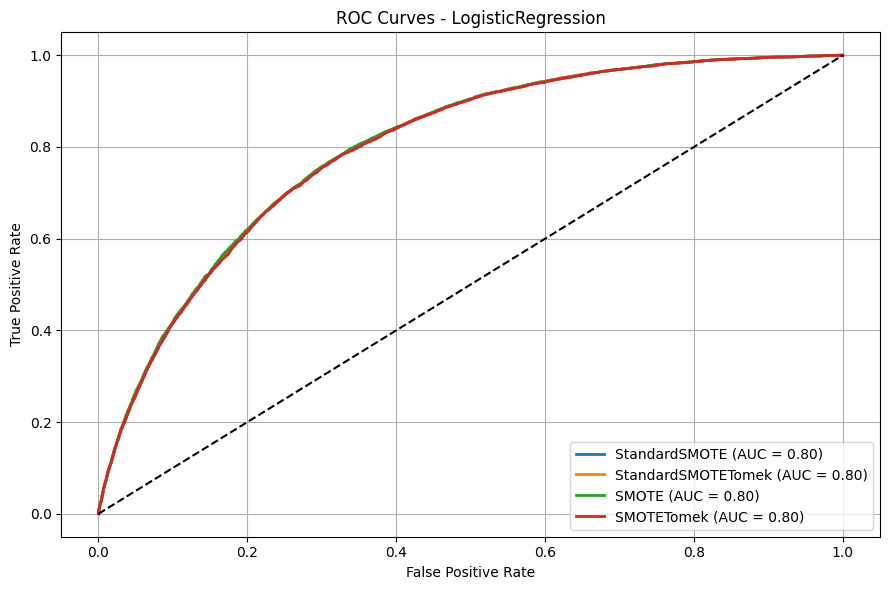

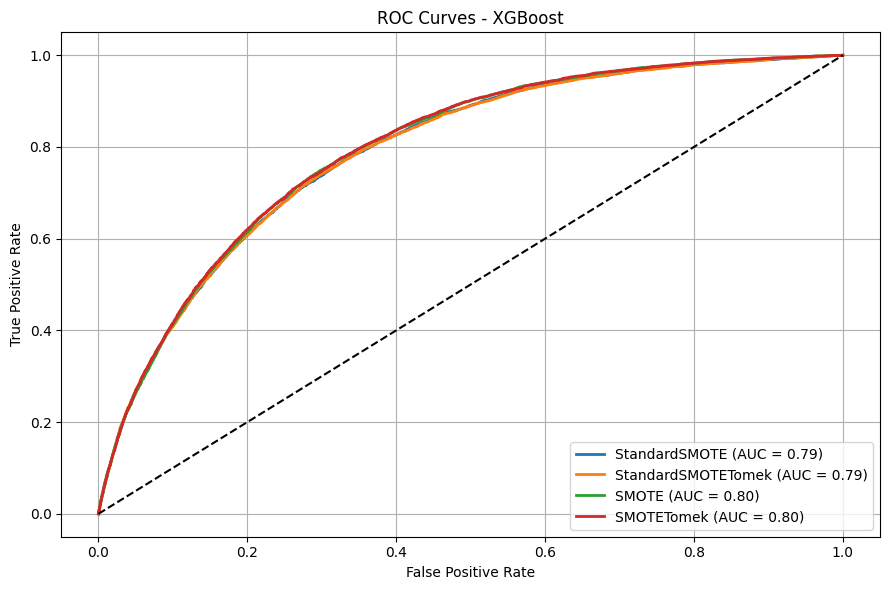

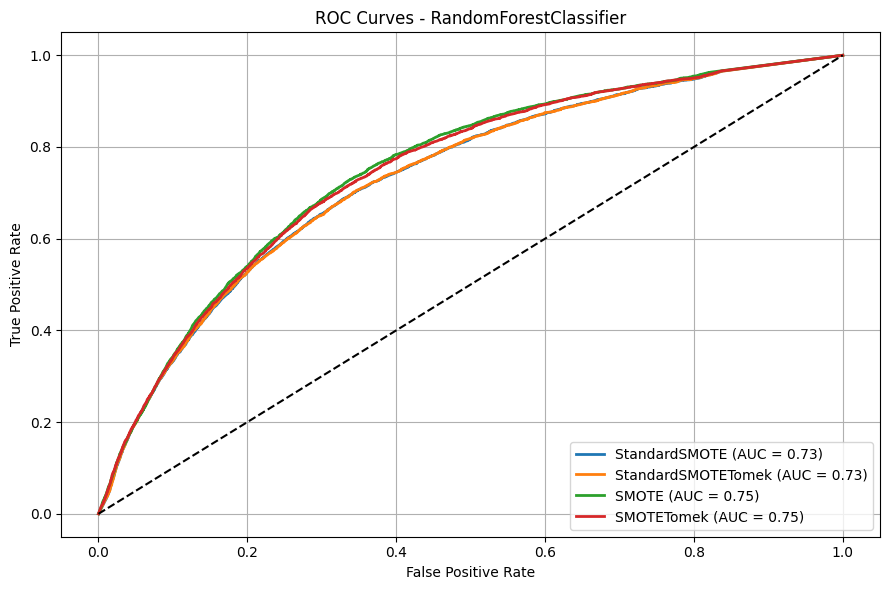

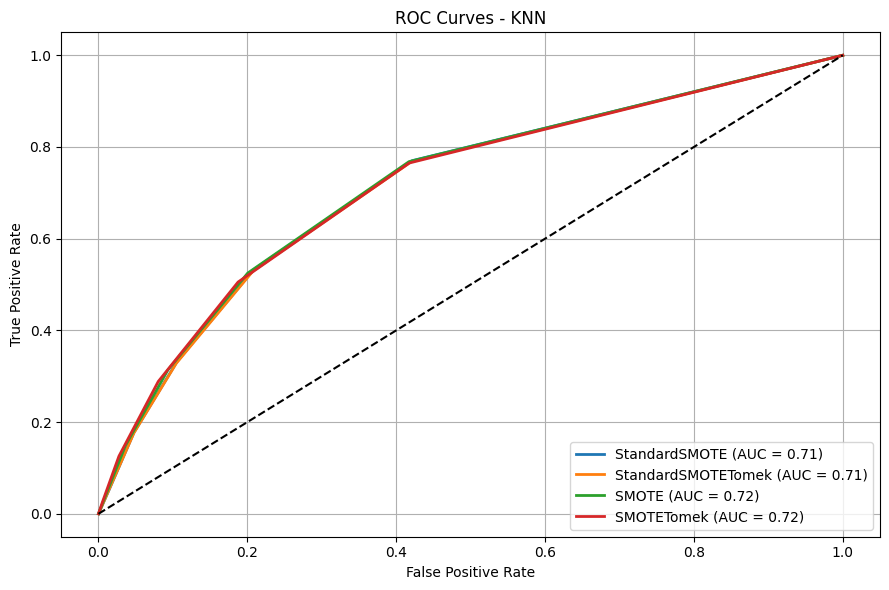

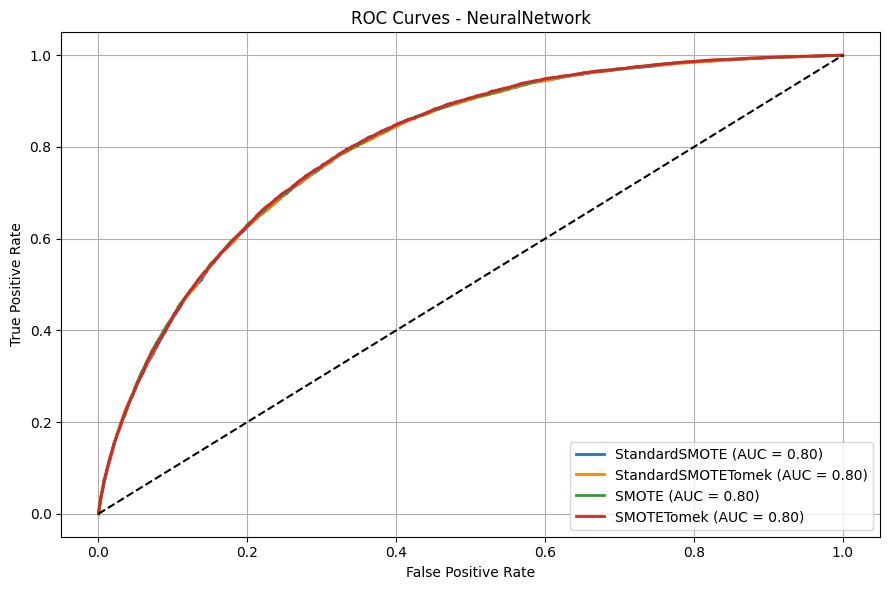

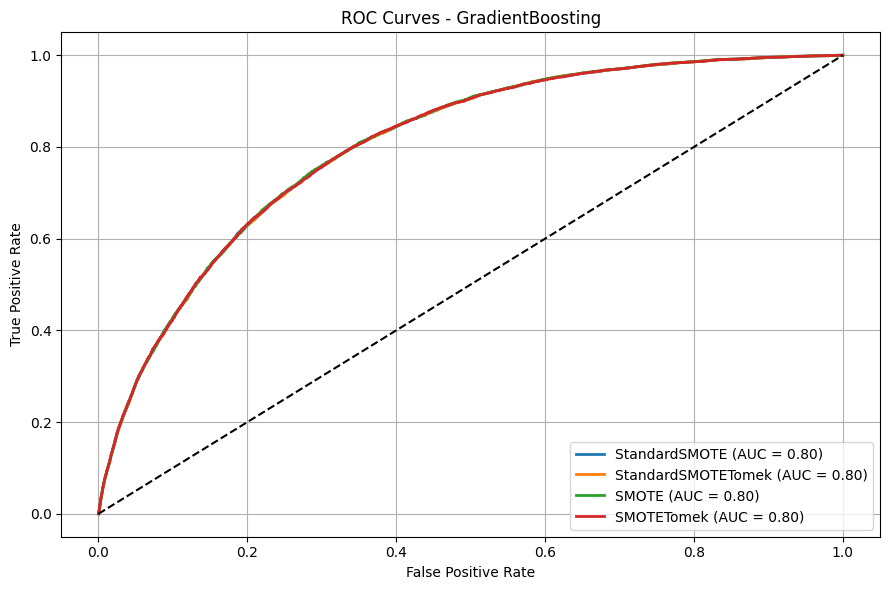

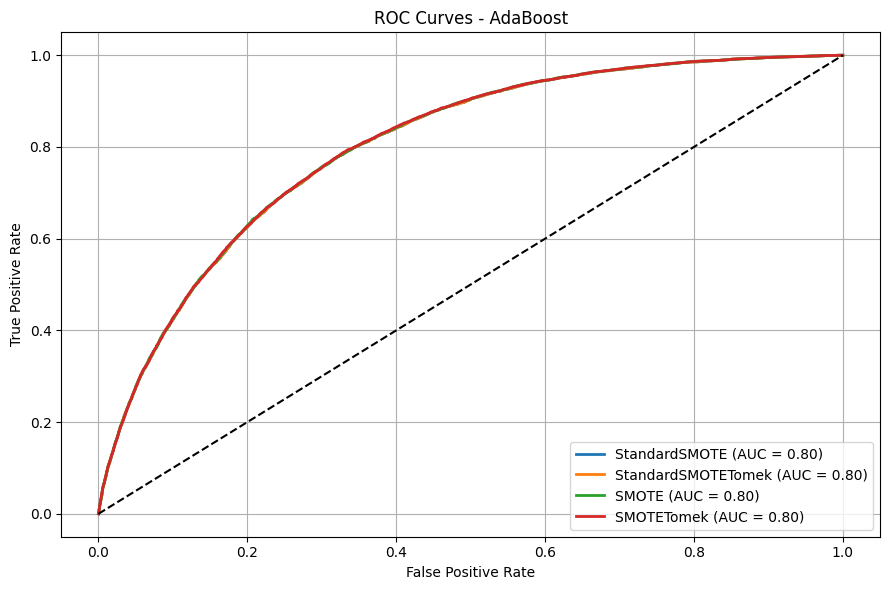

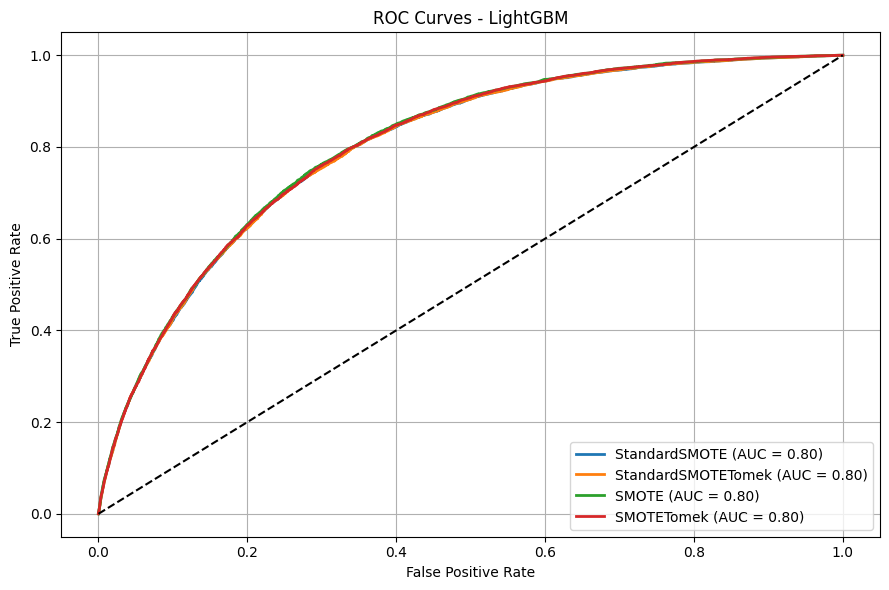

In [73]:
# ✅ Storage
all_results = {}
roc_curves = {}
methods = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Evaluation loop
for model_name, model in model_dict.items():
    print(f"\n🔍 Evaluating {model_name}")
    all_results[model_name] = {}

    for resample_type in methods:
        print(f"  ➤ {resample_type}")

        # Select resampler based on strategy
        if resample_type == "StandardSMOTE":
            resampler = SMOTE(random_state=42)

        elif resample_type == "StandardSMOTETomek":
            resampler = SMOTETomek(random_state=42)

        elif resample_type == "SMOTE":
            params = smote_params_dict[model_name][resample_type]
            smote = SMOTE(
                k_neighbors=params["smote_k"],
                sampling_strategy=params["smote_sampling"],
                random_state=42
            )
            resampler = smote

        elif resample_type == "SMOTETomek":
            params = smote_params_dict[model_name][resample_type]
            smote = SMOTE(
                k_neighbors=params["smote_k"],
                sampling_strategy=params["smote_sampling"],
                random_state=42
            )
            resampler = SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

        # Class counts before
        before_counts = dict(pd.Series(y_train).value_counts())

        # Apply resampling
        X_res, y_res = resampler.fit_resample(x_train, y_train)

        # Class counts after
        after_counts = dict(pd.Series(y_res).value_counts())
        print(f"     ➤ Before: {before_counts}")
        print(f"     ➤ After:  {after_counts}")

        # Train & evaluate
        model_fit = clone(model)
        model_fit.fit(X_res, y_res)
        y_probs = model_fit.predict_proba(x_test)[:, 1]
        y_pred = model_fit.predict(x_test)

        fpr, tpr, _ = roc_curve(y_test, y_probs)
        roc_auc = auc(fpr, tpr)
        pr_auc = average_precision_score(y_test, y_probs)
        report = classification_report(y_test, y_pred, output_dict=True)

        all_results[model_name][resample_type] = {
            "Counts Before": before_counts,
            "Counts After": after_counts,
            "ROC-AUC": roc_auc,
            "PR-AUC": pr_auc,
            "F1": report["1"]["f1-score"],
            "Precision": report["1"]["precision"],
            "Recall": report["1"]["recall"],
            "Classification Report": report,
            "ROC Curve": (fpr, tpr)
        }

# ✅ Summary table
summary_rows = []

for model_name in all_results:
    row = {"Model": model_name}
    for method in methods:
        metrics = all_results[model_name][method]
        row[f"{method} PR-AUC"] = metrics["PR-AUC"]
        row[f"{method} ROC-AUC"] = metrics["ROC-AUC"]
        row[f"{method} F1"] = metrics["F1"]
        row[f"{method} Precision"] = metrics["Precision"]
        row[f"{method} Recall"] = metrics["Recall"]
    summary_rows.append(row)

summary_df = pd.DataFrame(summary_rows)
print("\n📊 Summary of All Models Across 4 SMOTE Types:")
print(summary_df.sort_values(by="SMOTETomek PR-AUC", ascending=False))

# ✅ ROC Curve Plots
for model_name in all_results:
    plt.figure(figsize=(9, 6))
    for method in methods:
        fpr, tpr = all_results[model_name][method]["ROC Curve"]
        auc_score = all_results[model_name][method]["ROC-AUC"]
        plt.plot(fpr, tpr, lw=2, label=f'{method} (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'ROC Curves - {model_name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


🔍 Evaluating DecisionTreeClassifier
  ➤ StandardSVMSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(131102)}
  ➤ SVMSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(91771)}

🔍 Evaluating LogisticRegression
  ➤ StandardSVMSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(131102)}
  ➤ SVMSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(39330)}

🔍 Evaluating XGBoost
  ➤ StandardSVMSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(131102)}
  ➤ SVMSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
     ➤ After:  {0: np.int64(131102), 1: np.int64(52440)}

🔍 Evaluating RandomForestClassifier
  ➤ StandardSVMSMOTE
     ➤ Before: {0: np.int64(131102), 1: np.int64(22443)}
    

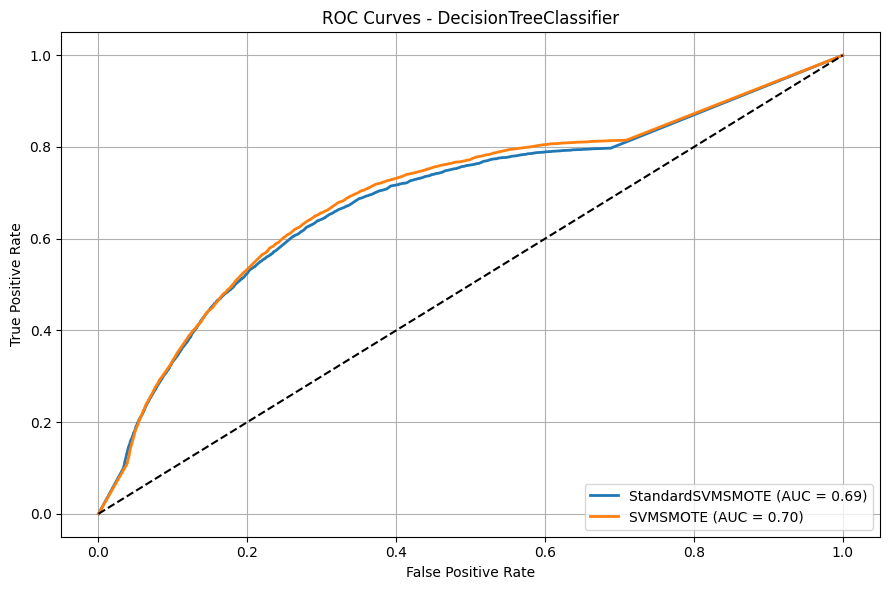

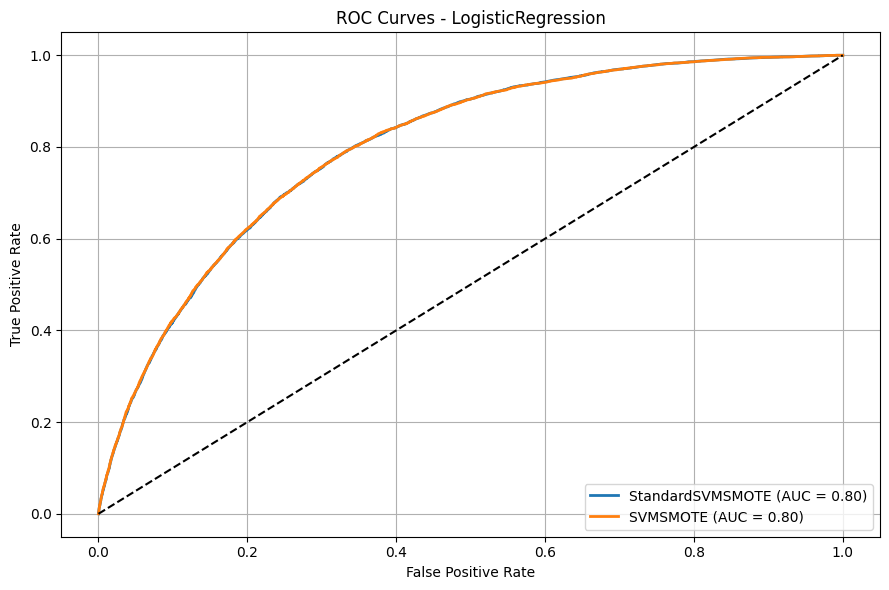

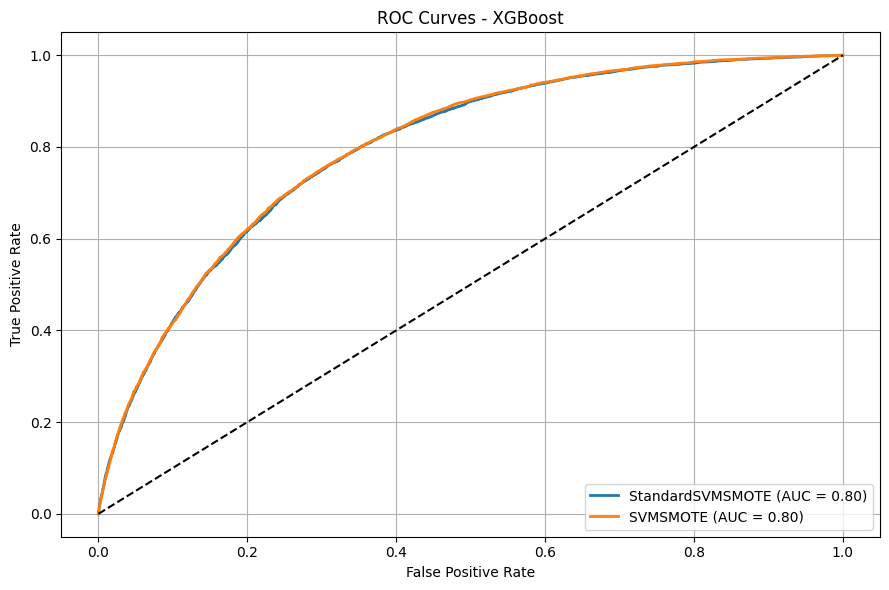

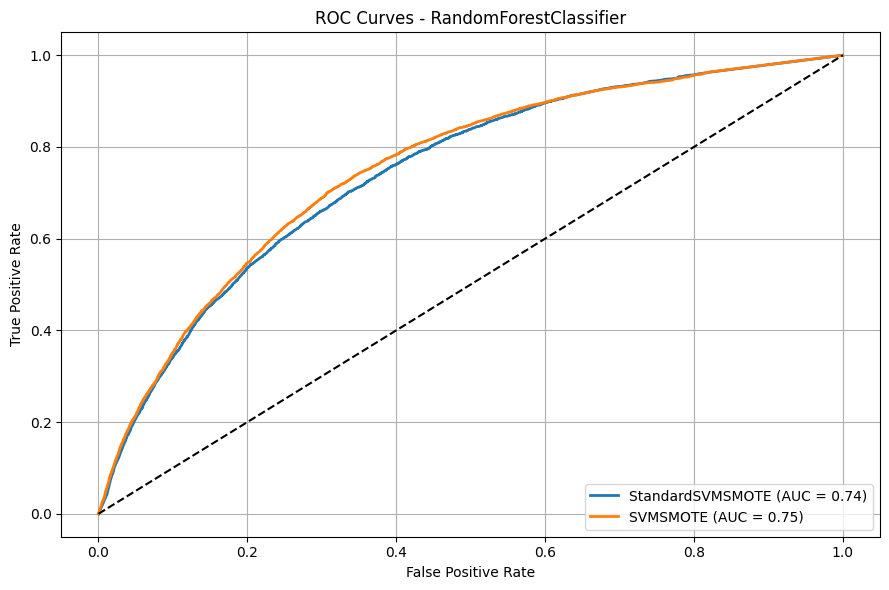

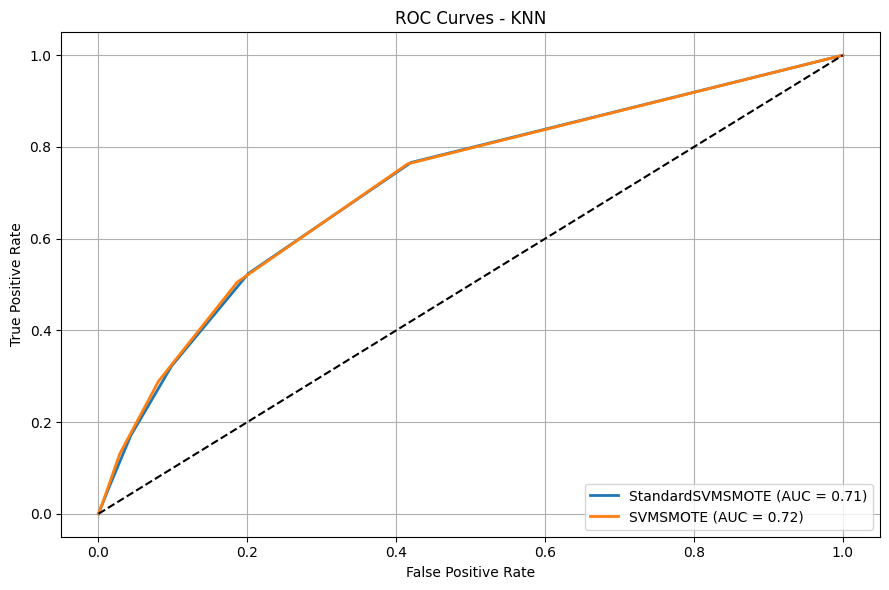

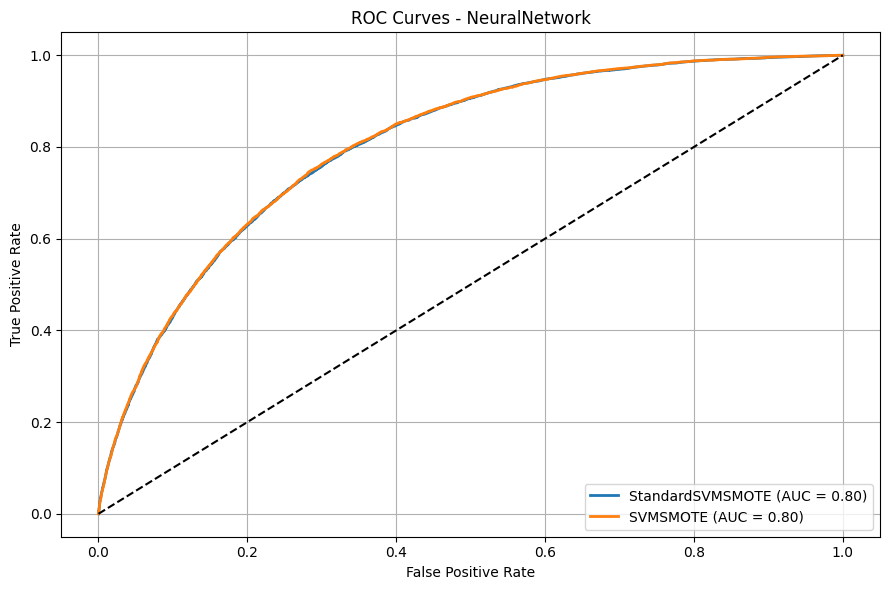

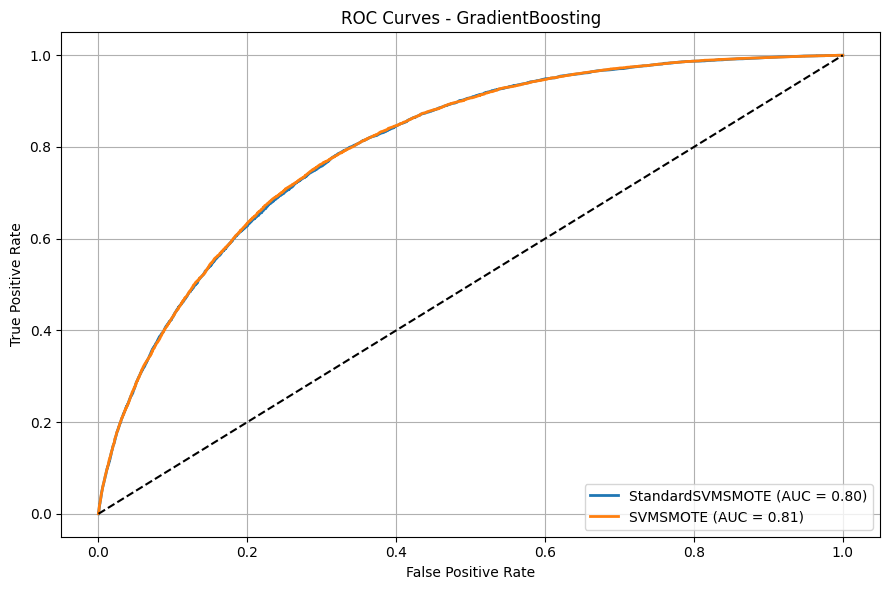

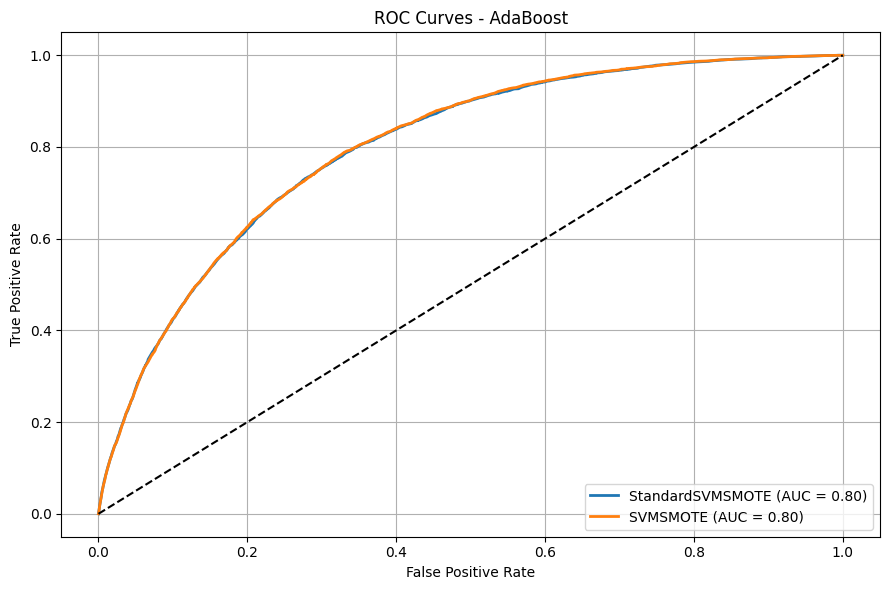

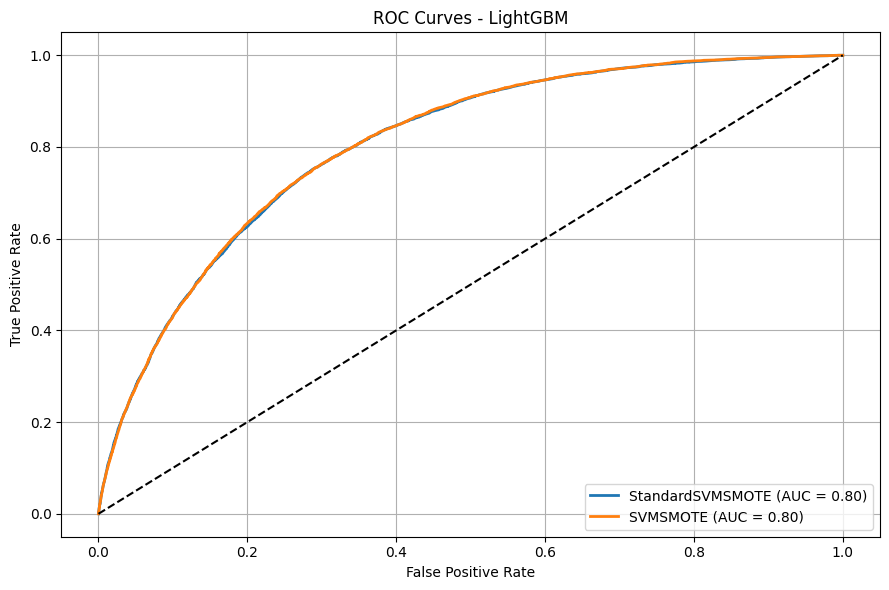

In [67]:
from imblearn.over_sampling import SVMSMOTE
from sklearn.metrics import auc

# ✅ Storage
all_results = {}
roc_curves = {}
methods = ["StandardSVMSMOTE", "SVMSMOTE"]

# ✅ Evaluation loop
for model_name, model in model_dict.items():
    print(f"\n🔍 Evaluating {model_name}")
    all_results[model_name] = {}

    for method in methods:
        print(f"  ➤ {method}")

        if method == "StandardSVMSMOTE":
            resampler = SVMSMOTE(random_state=42)
        elif method == "SVMSMOTE":
            params = svmsmote_params_dict[model_name]
            resampler = SVMSMOTE(
                k_neighbors=params["smote_k"],
                m_neighbors=params["m_neighbors"],
                sampling_strategy=params["smote_sampling"],
                out_step=params["out_step"],
                random_state=42
            )

        # Class counts before
        before_counts = dict(pd.Series(y_train).value_counts())

        # Apply resampling
        X_res, y_res = resampler.fit_resample(x_train, y_train)

        # Class counts after
        after_counts = dict(pd.Series(y_res).value_counts())
        print(f"     ➤ Before: {before_counts}")
        print(f"     ➤ After:  {after_counts}")

        # Train & evaluate
        model_fit = clone(model)
        model_fit.fit(X_res, y_res)
        y_probs = model_fit.predict_proba(x_test)[:, 1]
        y_pred = model_fit.predict(x_test)

        fpr, tpr, _ = roc_curve(y_test, y_probs)
        roc_auc = auc(fpr, tpr)
        pr_auc = average_precision_score(y_test, y_probs)
        report = classification_report(y_test, y_pred, output_dict=True)

        all_results[model_name][method] = {
            "Counts Before": before_counts,
            "Counts After": after_counts,
            "ROC-AUC": roc_auc,
            "PR-AUC": pr_auc,
            "F1": report["1"]["f1-score"],
            "Precision": report["1"]["precision"],
            "Recall": report["1"]["recall"],
            "Classification Report": report,
            "ROC Curve": (fpr, tpr)
        }

# ✅ Summary table
summary_rows = []
for model_name in all_results:
    row = {"Model": model_name}
    for method in methods:
        metrics = all_results[model_name][method]
        row[f"{method} PR-AUC"] = metrics["PR-AUC"]
        row[f"{method} ROC-AUC"] = metrics["ROC-AUC"]
        row[f"{method} F1"] = metrics["F1"]
        row[f"{method} Precision"] = metrics["Precision"]
        row[f"{method} Recall"] = metrics["Recall"]
    summary_rows.append(row)

summary_df = pd.DataFrame(summary_rows)
print("\n📊 Summary of All Models with SVMSMOTE Variants:")
print(summary_df.sort_values(by="SVMSMOTE PR-AUC", ascending=False))

# ✅ ROC Curve Plots
for model_name in all_results:
    plt.figure(figsize=(9, 6))
    for method in methods:
        fpr, tpr = all_results[model_name][method]["ROC Curve"]
        auc_score = all_results[model_name][method]["ROC-AUC"]
        plt.plot(fpr, tpr, lw=2, label=f'{method} (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f'ROC Curves - {model_name}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [69]:
import csv
from sklearn.metrics import accuracy_score, confusion_matrix
import math

flattened_rows = []

for model_name, methods in all_results.items():
    for method_name, metrics in methods.items():
        report = metrics["Classification Report"]
        
        # Extract confusion matrix for specificity
        cm = confusion_matrix(y_test, 
                              y_test if 'Confusion Matrix' not in metrics else None)
        if 'Confusion Matrix' in metrics:
            cm = metrics['Confusion Matrix']
        tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
        
        sensitivity = tp / (tp + fn) if (tp + fn) != 0 else 0  # Recall
        specificity = tn / (tn + fp) if (tn + fp) != 0 else 0
        gmean = math.sqrt(sensitivity * specificity)

        row = {
            "Model": model_name,
            "Method": method_name,
            "Counts Before 0": metrics["Counts Before"].get(0, 0),
            "Counts Before 1": metrics["Counts Before"].get(1, 0),
            "Counts After 0": metrics["Counts After"].get(0, 0),
            "Counts After 1": metrics["Counts After"].get(1, 0),
            "ROC-AUC": metrics["ROC-AUC"],
            "PR-AUC": metrics["PR-AUC"],
            "Accuracy": report["accuracy"],
            "G-Mean": gmean,
            "F1 (Class 1)": report["1"]["f1-score"],
            "Precision (Class 1)": report["1"]["precision"],
            "Recall (Class 1)": report["1"]["recall"],
            "F1 (Weighted)": report["weighted avg"]["f1-score"],
            "Precision (Weighted)": report["weighted avg"]["precision"],
            "Recall (Weighted)": report["weighted avg"]["recall"]
        }
        flattened_rows.append(row)

# Write to CSV
output_file = r"C:\Users\sherm\OneDrive\Documents\P2\enhanced_svmsmote_results.csv"
keys = flattened_rows[0].keys()

with open(output_file, "w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=keys)
    writer.writeheader()
    writer.writerows(flattened_rows)

print(f"✅ Saved enhanced SMOTE results to {output_file}")

✅ Saved enhanced SMOTE results to C:\Users\sherm\OneDrive\Documents\P2\enhanced_svmsmote_results.csv


### Parameter tuning for each of the ML model

#### Random Forest

In [89]:
# ✅ Your stratified K-fold setup
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load tuned SMOTE parameters from file
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_rf = smote_params_dict["RandomForestClassifier"]

# ✅ Strategies to evaluate
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Reusable resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)

    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote

    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store final results
tuning_results = {}

# ✅ Run for each SMOTE strategy
for resample_type in resample_types:
    print(f"\n🔧 Tuning RandomForest with {resample_type}")

    def objective(trial):
        rf_params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 150, step=50),
            'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy']),
            'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
            'max_depth': trial.suggest_int('max_depth', 20, 100, step=30),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 8, step=3),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 4),
            'class_weight': trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample']),
            'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        }

        model = RandomForestClassifier(**rf_params, random_state=42, n_jobs=-1)
        pr_scores = []

        for train_idx, val_idx in cv.split(X, y):
            X_tr, X_val = X.iloc[train_idx], X.iloc[val_idx]
            y_tr, y_val = y.iloc[train_idx], y.iloc[val_idx]

            resampler = get_resampler(resample_type, params_rf)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna study
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best params for {resample_type}: {best_params}")

    # ✅ Final model on full training data (resampled)
    final_resampler = get_resampler(resample_type, params_rf)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = RandomForestClassifier(**best_params, random_state=42, n_jobs=-1)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test data
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    tuning_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary table
summary = []
for method, result in tuning_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final RandomForest Comparison Across 4 SMOTE Strategies:")
print(summary_df)


[I 2025-05-17 10:07:36,935] A new study created in memory with name: no-name-c95de83c-b692-4074-b41d-51e9afebf56f



🔧 Tuning RandomForest with StandardSMOTE


c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 10:08:00,835] Trial 0 finished with value: 0.31917563905437063 and parameters: {'n_estimators': 150, 'criterion': 'entropy', 'max_features': 'log2', 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 2, 'class_weight': 'balanced', 'bootstrap': False}. Best is trial 0 with value: 0.31917563905437063.
c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 10:08:09,914] Trial 1 finished with value: 0.3265510166370148 and parameters: {'n_estimators': 50, 'criterion': 'entropy', 'max_f

✔️ Best params for StandardSMOTE: {'n_estimators': 150, 'criterion': 'gini', 'max_features': 'log2', 'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 4, 'class_weight': 'balanced', 'bootstrap': True}


[I 2025-05-17 10:17:47,588] A new study created in memory with name: no-name-6d682677-e742-4d60-aaa8-93c50ea99656



🔧 Tuning RandomForest with StandardSMOTETomek


c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 10:21:12,681] Trial 0 finished with value: 0.34612158017162226 and parameters: {'n_estimators': 100, 'criterion': 'entropy', 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 8, 'min_samples_leaf': 4, 'class_weight': 'balanced_subsample', 'bootstrap': True}. Best is trial 0 with value: 0.34612158017162226.
c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 10:24:33,261] Trial 1 finished with value: 0.3387425850736573 and parameters: {'n_estimators': 150, 'criterion': 'gini',

✔️ Best params for StandardSMOTETomek: {'n_estimators': 150, 'criterion': 'entropy', 'max_features': 'log2', 'max_depth': 50, 'min_samples_split': 5, 'min_samples_leaf': 4, 'class_weight': 'balanced_subsample', 'bootstrap': True}


[I 2025-05-17 14:30:52,140] A new study created in memory with name: no-name-6bf7a8d8-724a-4cf6-b5b6-b04d8fbd0af1



🔧 Tuning RandomForest with SMOTE


c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 14:30:58,069] Trial 0 finished with value: 0.3195992566294489 and parameters: {'n_estimators': 50, 'criterion': 'entropy', 'max_features': 'log2', 'max_depth': 80, 'min_samples_split': 5, 'min_samples_leaf': 1, 'class_weight': 'balanced', 'bootstrap': True}. Best is trial 0 with value: 0.3195992566294489.
c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 14:31:04,180] Trial 1 finished with value: 0.34682170833693937 and parameters: {'n_estimators': 50, 'criterion': 'entropy', 'max_feat

✔️ Best params for SMOTE: {'n_estimators': 150, 'criterion': 'gini', 'max_features': 'sqrt', 'max_depth': 50, 'min_samples_split': 5, 'min_samples_leaf': 4, 'class_weight': 'balanced_subsample', 'bootstrap': True}


[I 2025-05-17 14:38:40,201] A new study created in memory with name: no-name-c95051f6-0f7c-4e4e-bc41-b9c72b958126



🔧 Tuning RandomForest with SMOTETomek


c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 14:39:49,610] Trial 0 finished with value: 0.33823949298135236 and parameters: {'n_estimators': 50, 'criterion': 'gini', 'max_features': 'log2', 'max_depth': 80, 'min_samples_split': 8, 'min_samples_leaf': 2, 'class_weight': 'balanced', 'bootstrap': True}. Best is trial 0 with value: 0.33823949298135236.
c:\Users\MYMAHSEA\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-17 14:41:05,002] Trial 1 finished with value: 0.2949481002636278 and parameters: {'n_estimators': 150, 'criterion': 'gini', 'max_features

✔️ Best params for SMOTETomek: {'n_estimators': 150, 'criterion': 'gini', 'max_features': 'sqrt', 'max_depth': 80, 'min_samples_split': 5, 'min_samples_leaf': 4, 'class_weight': 'balanced', 'bootstrap': True}

📊 Final RandomForest Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
2               SMOTE  0.411193  0.784507  0.451991   0.324575  0.744094
3          SMOTETomek  0.406133  0.781918  0.449239   0.322008  0.742690
0       StandardSMOTE  0.396056  0.776011  0.445126   0.318641  0.738129
1  StandardSMOTETomek  0.395248  0.776146  0.444797   0.318303  0.738129


In [72]:
import json
import optuna
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import average_precision_score, roc_auc_score, classification_report
from sklearn.base import clone
from imblearn.over_sampling import SVMSMOTE

# ✅ Stratified K-fold setup
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load tuned SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_rf = svmsmote_params_dict["RandomForestClassifier"]

# ✅ Resampling strategies to evaluate
resample_types = ["StandardSVMSMOTE", "SVMSMOTE"]

# ✅ Reusable resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# ✅ Store results
tuning_results = {}

# ✅ Run for each SVMSMOTE strategy
for resample_type in resample_types:
    print(f"\n🔧 Tuning RandomForest with {resample_type}")

    def objective(trial):
        rf_params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 150, step=50),
            'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy']),
            'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
            'max_depth': trial.suggest_int('max_depth', 20, 100, step=30),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 8, step=3),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 4),
            'class_weight': trial.suggest_categorical('class_weight', ['balanced', 'balanced_subsample']),
            'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        }

        model = RandomForestClassifier(**rf_params, random_state=42, n_jobs=-1)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_rf if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna study
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best params for {resample_type}: {best_params}")

    # ✅ Final model on full training data (resampled)
    final_resampler = get_resampler(resample_type, params_rf if resample_type == "SVMSMOTE" else None)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = RandomForestClassifier(**best_params, random_state=42, n_jobs=-1)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test data
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    tuning_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary table
summary = []
for method, result in tuning_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final RandomForest Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)

[I 2025-05-28 05:45:23,924] A new study created in memory with name: no-name-61bb4d73-cd2b-4ae1-8786-c03e80777d2e



🔧 Tuning RandomForest with StandardSVMSMOTE


c:\Users\sherm\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-28 06:24:55,462] Trial 0 finished with value: 0.3539931141444254 and parameters: {'n_estimators': 50, 'criterion': 'gini', 'max_features': 'log2', 'max_depth': 80, 'min_samples_split': 8, 'min_samples_leaf': 4, 'class_weight': 'balanced_subsample', 'bootstrap': True}. Best is trial 0 with value: 0.3539931141444254.
c:\Users\sherm\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-28 07:03:39,663] Trial 1 finished with value: 0.34731084055672884 and parameters: {'n_estimators': 50, 'criterion': 'entropy', 'max_fea

✔️ Best params for StandardSVMSMOTE: {'n_estimators': 100, 'criterion': 'gini', 'max_features': 'log2', 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 4, 'class_weight': 'balanced_subsample', 'bootstrap': True}


[I 2025-05-29 02:31:12,978] A new study created in memory with name: no-name-ace6fe0b-bd0f-4a58-8d74-3e4af67bd435



🔧 Tuning RandomForest with SVMSMOTE


c:\Users\sherm\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-29 03:10:16,727] Trial 0 finished with value: 0.31775694647074826 and parameters: {'n_estimators': 50, 'criterion': 'entropy', 'max_features': 'sqrt', 'max_depth': 20, 'min_samples_split': 2, 'min_samples_leaf': 1, 'class_weight': 'balanced', 'bootstrap': True}. Best is trial 0 with value: 0.31775694647074826.
c:\Users\sherm\AppData\Local\Programs\Python\Python313\Lib\site-packages\optuna\distributions.py:699: UserWarning: The distribution is specified by [20, 100] and step=30, but the range is not divisible by `step`. It will be replaced by [20, 80].
  warnings.warn(
[I 2025-05-29 03:50:24,066] Trial 1 finished with value: 0.3433162326818281 and parameters: {'n_estimators': 100, 'criterion': 'gini', 'max_features': 

✔️ Best params for SVMSMOTE: {'n_estimators': 150, 'criterion': 'gini', 'max_features': 'log2', 'max_depth': 80, 'min_samples_split': 5, 'min_samples_leaf': 4, 'class_weight': 'balanced', 'bootstrap': True}

📊 Final RandomForest Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
1          SVMSMOTE  0.415622  0.786822  0.463509   0.346891  0.698246
0  StandardSVMSMOTE  0.405886  0.782370  0.459733   0.348922  0.673684


#### Decision Tree

In [90]:
import optuna
import json
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    average_precision_score, roc_auc_score,
    classification_report
)
from sklearn.inspection import permutation_importance
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# ✅ Parse sklearn version correctly
from packaging import version
import sklearn
use_log_loss = version.parse(sklearn.__version__) >= version.parse("1.1")

# ✅ Stratified cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load tuned SMOTE parameters from file
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_dt = smote_params_dict.get("DecisionTreeClassifier", {})  # fallback empty

# ✅ Supported SMOTE strategies
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store results
dt_results = {}

# ✅ Iterate through SMOTE strategies
for resample_type in resample_types:
    print(f"\n🔧 Tuning DecisionTree with {resample_type}")

    def objective(trial):
        params = {
            'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy'] + (['log_loss'] if use_log_loss else [])),
            'splitter': trial.suggest_categorical('splitter', ['best', 'random']),
            'max_depth': trial.suggest_int('max_depth', 5, 50, step=5),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 8),
            'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2']),
            'max_leaf_nodes': trial.suggest_categorical('max_leaf_nodes', [None, 10, 20, 50]),
        }

        model = DecisionTreeClassifier(random_state=42, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_dt)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna tuning
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best params for {resample_type}: {best_params}")

    # ✅ Final model training
    final_resampler = get_resampler(resample_type, params_dt)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = DecisionTreeClassifier(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test set
    x_test_aligned = x_test[X_final.columns] if hasattr(X_final, "columns") else x_test
    y_pred = best_model.predict(x_test_aligned)
    y_probs = best_model.predict_proba(x_test_aligned)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    dt_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary DataFrame
summary = []
for method, result in dt_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final DecisionTree Comparison Across 4 SMOTE Strategies:")
print(summary_df)


[I 2025-05-17 15:23:22,292] A new study created in memory with name: no-name-69f0f809-187e-4290-acca-5cd1b4b7ce55



🔧 Tuning DecisionTree with StandardSMOTE


[I 2025-05-17 15:23:26,380] Trial 0 finished with value: 0.33310632348922087 and parameters: {'criterion': 'log_loss', 'splitter': 'best', 'max_depth': 5, 'min_samples_split': 6, 'min_samples_leaf': 1, 'max_features': None, 'max_leaf_nodes': 20}. Best is trial 0 with value: 0.33310632348922087.
[I 2025-05-17 15:23:30,475] Trial 1 finished with value: 0.3324784699406749 and parameters: {'criterion': 'gini', 'splitter': 'random', 'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'max_leaf_nodes': None}. Best is trial 0 with value: 0.33310632348922087.
[I 2025-05-17 15:23:35,609] Trial 2 finished with value: 0.33165409371044713 and parameters: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_features': None, 'max_leaf_nodes': 20}. Best is trial 0 with value: 0.33310632348922087.
[I 2025-05-17 15:23:39,991] Trial 3 finished with value: 0.3162211929557023 and parameters: {'criterion': 'gin

✔️ Best params for StandardSMOTE: {'criterion': 'log_loss', 'splitter': 'best', 'max_depth': 35, 'min_samples_split': 8, 'min_samples_leaf': 6, 'max_features': None, 'max_leaf_nodes': 50}


[I 2025-05-17 15:25:34,924] A new study created in memory with name: no-name-22b2af95-0c46-4254-8ccc-c97f571c6197



🔧 Tuning DecisionTree with StandardSMOTETomek


[I 2025-05-17 15:29:44,049] Trial 0 finished with value: 0.36199639688082896 and parameters: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_leaf_nodes': None}. Best is trial 0 with value: 0.36199639688082896.
[I 2025-05-17 15:33:55,948] Trial 1 finished with value: 0.3283952830299436 and parameters: {'criterion': 'gini', 'splitter': 'random', 'max_depth': 45, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_leaf_nodes': None}. Best is trial 0 with value: 0.36199639688082896.
[I 2025-05-17 15:38:14,736] Trial 2 finished with value: 0.2927968646847477 and parameters: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 35, 'min_samples_split': 9, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_leaf_nodes': 20}. Best is trial 0 with value: 0.36199639688082896.
[I 2025-05-17 15:41:42,174] Trial 3 finished with value: 0.2822575653743228 and parameters: {'criterion'

✔️ Best params for StandardSMOTETomek: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_leaf_nodes': None}


[I 2025-05-17 18:04:45,538] A new study created in memory with name: no-name-1591665b-74e0-4230-8afa-0ead419d7bc7



🔧 Tuning DecisionTree with SMOTE


[I 2025-05-17 18:04:48,817] Trial 0 finished with value: 0.3004752073495295 and parameters: {'criterion': 'log_loss', 'splitter': 'best', 'max_depth': 30, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_leaf_nodes': None}. Best is trial 0 with value: 0.3004752073495295.
[I 2025-05-17 18:04:51,920] Trial 1 finished with value: 0.32851191965536974 and parameters: {'criterion': 'log_loss', 'splitter': 'best', 'max_depth': 45, 'min_samples_split': 9, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_leaf_nodes': 50}. Best is trial 1 with value: 0.32851191965536974.
[I 2025-05-17 18:04:55,186] Trial 2 finished with value: 0.3110811116978337 and parameters: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 10, 'min_samples_split': 8, 'min_samples_leaf': 1, 'max_features': None, 'max_leaf_nodes': 10}. Best is trial 1 with value: 0.32851191965536974.
[I 2025-05-17 18:04:58,365] Trial 3 finished with value: 0.31567081940990627 and parameters: {'criterion': 

✔️ Best params for SMOTE: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': None, 'max_leaf_nodes': None}


[I 2025-05-17 18:06:29,561] A new study created in memory with name: no-name-3b8713b0-f7b4-4fca-9282-2020ddd7af9f



🔧 Tuning DecisionTree with SMOTETomek


[I 2025-05-17 18:07:43,162] Trial 0 finished with value: 0.35672336466513727 and parameters: {'criterion': 'entropy', 'splitter': 'random', 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 6, 'max_features': 'log2', 'max_leaf_nodes': None}. Best is trial 0 with value: 0.35672336466513727.
[I 2025-05-17 18:08:57,894] Trial 1 finished with value: 0.2755003933101194 and parameters: {'criterion': 'gini', 'splitter': 'random', 'max_depth': 25, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_leaf_nodes': 10}. Best is trial 0 with value: 0.35672336466513727.
[I 2025-05-17 18:10:50,745] Trial 2 finished with value: 0.35855480210496493 and parameters: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 45, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': None, 'max_leaf_nodes': 50}. Best is trial 2 with value: 0.35855480210496493.
[I 2025-05-17 18:12:47,424] Trial 3 finished with value: 0.3012189682664781 and parameters: {'criterion':

✔️ Best params for SMOTETomek: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 45, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': None, 'max_leaf_nodes': 50}

📊 Final DecisionTree Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
2               SMOTE  0.417251  0.788312  0.456818   0.322971  0.780117
1  StandardSMOTETomek  0.411914  0.784572  0.442925   0.306358  0.799181
3          SMOTETomek  0.402814  0.783509  0.459219   0.375353  0.591345
0       StandardSMOTE  0.397350  0.784619  0.448406   0.315918  0.772281


In [73]:
import optuna
import json
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import (
    average_precision_score, roc_auc_score, classification_report
)
from packaging import version
import sklearn
from imblearn.over_sampling import SVMSMOTE

# ✅ Version check for log_loss support
use_log_loss = version.parse(sklearn.__version__) >= version.parse("1.1")

# ✅ Stratified cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load tuned SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_dt = svmsmote_params_dict.get("DecisionTreeClassifier", {})  # fallback empty

# ✅ SMOTE strategies to evaluate
resample_types = ["StandardSVMSMOTE", "SVMSMOTE"]

# ✅ Resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# ✅ Store results
dt_results = {}

# ✅ Iterate through resampling strategies
for resample_type in resample_types:
    print(f"\n🔧 Tuning DecisionTree with {resample_type}")

    def objective(trial):
        params = {
            'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy'] + (['log_loss'] if use_log_loss else [])),
            'splitter': trial.suggest_categorical('splitter', ['best', 'random']),
            'max_depth': trial.suggest_int('max_depth', 5, 50, step=5),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 8),
            'max_features': trial.suggest_categorical('max_features', [None, 'sqrt', 'log2']),
            'max_leaf_nodes': trial.suggest_categorical('max_leaf_nodes', [None, 10, 20, 50]),
        }

        model = DecisionTreeClassifier(random_state=42, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            
            resampler = get_resampler(resample_type, params_dt if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna tuning
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best params for {resample_type}: {best_params}")

    # ✅ Final model training
    final_resampler = get_resampler(resample_type, params_dt if resample_type == "SVMSMOTE" else None)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = DecisionTreeClassifier(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test set
    x_test_aligned = x_test[X_final.columns] if hasattr(X_final, "columns") else x_test
    y_pred = best_model.predict(x_test_aligned)
    y_probs = best_model.predict_proba(x_test_aligned)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    dt_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary DataFrame
summary = []
for method, result in dt_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final DecisionTree Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)

[I 2025-05-29 22:54:17,686] A new study created in memory with name: no-name-0fa08ba1-2797-497c-aa10-78fa0135a065



🔧 Tuning DecisionTree with StandardSVMSMOTE


[I 2025-05-29 23:32:03,118] Trial 0 finished with value: 0.3286035224882973 and parameters: {'criterion': 'log_loss', 'splitter': 'random', 'max_depth': 50, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_leaf_nodes': 50}. Best is trial 0 with value: 0.3286035224882973.
[I 2025-05-30 00:09:57,786] Trial 1 finished with value: 0.2930240581077135 and parameters: {'criterion': 'entropy', 'splitter': 'random', 'max_depth': 45, 'min_samples_split': 6, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_leaf_nodes': 10}. Best is trial 0 with value: 0.3286035224882973.
[I 2025-05-30 00:48:04,853] Trial 2 finished with value: 0.33590732088344327 and parameters: {'criterion': 'gini', 'splitter': 'best', 'max_depth': 35, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': None, 'max_leaf_nodes': 20}. Best is trial 2 with value: 0.33590732088344327.
[I 2025-05-30 01:25:44,646] Trial 3 finished with value: 0.33005422368925713 and parameters: {'criterion': 'e

✔️ Best params for StandardSVMSMOTE: {'criterion': 'log_loss', 'splitter': 'best', 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_leaf_nodes': None}


[I 2025-05-30 18:57:51,806] A new study created in memory with name: no-name-3ab7c8e7-e393-453b-843f-d3a368f6208b



🔧 Tuning DecisionTree with SVMSMOTE


[I 2025-05-30 19:38:50,000] Trial 0 finished with value: 0.33419999069023404 and parameters: {'criterion': 'entropy', 'splitter': 'random', 'max_depth': 25, 'min_samples_split': 7, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_leaf_nodes': 50}. Best is trial 0 with value: 0.33419999069023404.
[I 2025-05-30 20:17:55,905] Trial 1 finished with value: 0.3337324161809462 and parameters: {'criterion': 'gini', 'splitter': 'random', 'max_depth': 25, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_leaf_nodes': 50}. Best is trial 0 with value: 0.33419999069023404.
[I 2025-05-30 20:57:09,475] Trial 2 finished with value: 0.3150853966293309 and parameters: {'criterion': 'log_loss', 'splitter': 'random', 'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 6, 'max_features': 'sqrt', 'max_leaf_nodes': 20}. Best is trial 0 with value: 0.33419999069023404.
[I 2025-05-30 21:35:52,741] Trial 3 finished with value: 0.3180762761602579 and parameters: {'criterion'

✔️ Best params for SVMSMOTE: {'criterion': 'entropy', 'splitter': 'random', 'max_depth': 20, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_features': None, 'max_leaf_nodes': 50}

📊 Final DecisionTree Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
0  StandardSVMSMOTE  0.410221  0.782701  0.456193   0.331722  0.730175
1          SVMSMOTE  0.405254  0.786747  0.460578   0.351300  0.668538


#### KNN

In [91]:
import optuna
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
import json

# ✅ Stratified K-Fold setup
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load SMOTE parameters if applicable
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_knn = smote_params_dict.get("KNN", {})

# ✅ SMOTE strategies
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store all results
knn_results = {}

for resample_type in resample_types:
    print(f"\n🔧 Tuning KNN with {resample_type}")

    def knn_objective(trial):
        params = {
            'n_neighbors': trial.suggest_int('n_neighbors', 2, 10),
            'weights': trial.suggest_categorical('weights', ['uniform', 'distance']),
            'algorithm': trial.suggest_categorical('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute']),
            'leaf_size': trial.suggest_int('leaf_size', 10, 50, step=10),
            'metric': trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'chebyshev', 'minkowski']),
        }

        # Only for minkowski
        if params['metric'] == 'minkowski':
            params['p'] = trial.suggest_int('p', 1, 2)
        else:
            params['p'] = 2

        model = KNeighborsClassifier(**params)

        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            # ✅ Apply SMOTE
            resampler = get_resampler(resample_type, params_knn)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Optuna tuning
    study = optuna.create_study(direction="maximize")
    study.optimize(knn_objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best KNN params for {resample_type}: {best_params}")

    # ✅ Train final model
    resampler = get_resampler(resample_type, params_knn)
    X_final, y_final = resampler.fit_resample(x_train, y_train)

    best_model = KNeighborsClassifier(**best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    knn_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary DataFrame
summary = []
for method, result in knn_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final KNN Comparison Across 4 SMOTE Strategies:")
print(summary_df)


[I 2025-05-17 19:02:41,245] A new study created in memory with name: no-name-2c7a51e0-233d-4c6e-8de6-da7b744bf568



🔧 Tuning KNN with StandardSMOTE


[I 2025-05-17 19:04:59,854] Trial 0 finished with value: 0.21430883038571227 and parameters: {'n_neighbors': 2, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 30, 'metric': 'manhattan'}. Best is trial 0 with value: 0.21430883038571227.
[I 2025-05-17 19:06:12,306] Trial 1 finished with value: 0.21459563807331325 and parameters: {'n_neighbors': 2, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 10, 'metric': 'manhattan'}. Best is trial 1 with value: 0.21459563807331325.
[I 2025-05-17 19:07:25,630] Trial 2 finished with value: 0.23110932226994488 and parameters: {'n_neighbors': 3, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 40, 'metric': 'chebyshev'}. Best is trial 2 with value: 0.23110932226994488.
[I 2025-05-17 19:08:38,134] Trial 3 finished with value: 0.28319608191438894 and parameters: {'n_neighbors': 8, 'weights': 'uniform', 'algorithm': 'ball_tree', 'leaf_size': 10, 'metric': 'manhattan'}. Best is trial 3 with value: 0.28319608191438894.
[I 

✔️ Best KNN params for StandardSMOTE: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 50, 'metric': 'euclidean'}


[I 2025-05-17 19:32:55,943] A new study created in memory with name: no-name-1b13bbe3-628a-4854-9868-fa5bdf68f7a7



🔧 Tuning KNN with StandardSMOTETomek


[I 2025-05-17 19:38:59,619] Trial 0 finished with value: 0.2663098890849779 and parameters: {'n_neighbors': 8, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 10, 'metric': 'manhattan'}. Best is trial 0 with value: 0.2663098890849779.
[I 2025-05-17 19:44:16,674] Trial 1 finished with value: 0.21610149891509395 and parameters: {'n_neighbors': 2, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'p': 1}. Best is trial 0 with value: 0.2663098890849779.
[I 2025-05-17 19:50:01,289] Trial 2 finished with value: 0.2870236949221236 and parameters: {'n_neighbors': 9, 'weights': 'uniform', 'algorithm': 'kd_tree', 'leaf_size': 50, 'metric': 'manhattan'}. Best is trial 2 with value: 0.2870236949221236.
[I 2025-05-17 19:53:40,030] Trial 3 finished with value: 0.26846582956151555 and parameters: {'n_neighbors': 9, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 20, 'metric': 'minkowski', 'p': 1}. Best is trial 2 with value: 0.2870236949221

✔️ Best KNN params for StandardSMOTETomek: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'kd_tree', 'leaf_size': 40, 'metric': 'euclidean'}


[I 2025-05-17 23:32:40,257] A new study created in memory with name: no-name-39cf5054-4896-4ef2-ac8b-d23361959d53



🔧 Tuning KNN with SMOTE


[I 2025-05-17 23:33:05,037] Trial 0 finished with value: 0.2773748638665388 and parameters: {'n_neighbors': 6, 'weights': 'uniform', 'algorithm': 'kd_tree', 'leaf_size': 20, 'metric': 'minkowski', 'p': 1}. Best is trial 0 with value: 0.2773748638665388.
[I 2025-05-17 23:33:56,395] Trial 1 finished with value: 0.21547990586898602 and parameters: {'n_neighbors': 2, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 30, 'metric': 'minkowski', 'p': 1}. Best is trial 0 with value: 0.2773748638665388.
[I 2025-05-17 23:34:10,523] Trial 2 finished with value: 0.2686156665842076 and parameters: {'n_neighbors': 7, 'weights': 'distance', 'algorithm': 'brute', 'leaf_size': 40, 'metric': 'minkowski', 'p': 2}. Best is trial 0 with value: 0.2773748638665388.
[I 2025-05-17 23:34:26,238] Trial 3 finished with value: 0.21491505506829817 and parameters: {'n_neighbors': 2, 'weights': 'distance', 'algorithm': 'brute', 'leaf_size': 20, 'metric': 'minkowski', 'p': 2}. Best is trial 0 with value: 0

✔️ Best KNN params for SMOTE: {'n_neighbors': 9, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 40, 'metric': 'manhattan'}


[I 2025-05-17 23:51:14,915] A new study created in memory with name: no-name-3ac029c2-a02d-4456-8a1c-e0f47f1ea5ad



🔧 Tuning KNN with SMOTETomek


[I 2025-05-17 23:52:51,572] Trial 0 finished with value: 0.2598687344355247 and parameters: {'n_neighbors': 5, 'weights': 'uniform', 'algorithm': 'ball_tree', 'leaf_size': 50, 'metric': 'chebyshev'}. Best is trial 0 with value: 0.2598687344355247.
[I 2025-05-17 23:54:26,836] Trial 1 finished with value: 0.25250914996888174 and parameters: {'n_neighbors': 5, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 40, 'metric': 'chebyshev'}. Best is trial 0 with value: 0.2598687344355247.
[I 2025-05-17 23:55:56,112] Trial 2 finished with value: 0.24616817144249134 and parameters: {'n_neighbors': 4, 'weights': 'distance', 'algorithm': 'ball_tree', 'leaf_size': 40, 'metric': 'minkowski', 'p': 2}. Best is trial 0 with value: 0.2598687344355247.
[I 2025-05-17 23:57:09,108] Trial 3 finished with value: 0.2376941288904077 and parameters: {'n_neighbors': 3, 'weights': 'uniform', 'algorithm': 'kd_tree', 'leaf_size': 10, 'metric': 'manhattan'}. Best is trial 0 with value: 0.2598687344355247

✔️ Best KNN params for SMOTETomek: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 20, 'metric': 'minkowski', 'p': 2}

📊 Final KNN Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
3          SMOTETomek  0.360066  0.754038  0.306126   0.478607  0.225029
2               SMOTE  0.345751  0.746509  0.363429   0.427352  0.316140
0       StandardSMOTE  0.338422  0.747114  0.354948   0.402341  0.317544
1  StandardSMOTETomek  0.338132  0.747144  0.352570   0.401886  0.314035


In [42]:
import optuna
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SVMSMOTE
import json

# ✅ Stratified K-Fold setup
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# ✅ Load SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_knn = svmsmote_params_dict.get("KNN", {})

# ✅ SVMSMOTE strategies
resample_types = ["StandardSVMSMOTE", "SVMSMOTE"]

# ✅ Resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# ✅ Store all results
knn_results = {}

for resample_type in resample_types:
    print(f"\n🔧 Tuning KNN with {resample_type}")

    def knn_objective(trial):
        params = {
            'n_neighbors': trial.suggest_int('n_neighbors', 2, 10),
            'weights': trial.suggest_categorical('weights', ['uniform', 'distance']),
            'algorithm': trial.suggest_categorical('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute']),
            'leaf_size': trial.suggest_int('leaf_size', 10, 50, step=10),
            'metric': trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'chebyshev', 'minkowski']),
        }

        if params['metric'] == 'minkowski':
            params['p'] = trial.suggest_int('p', 1, 2)
        else:
            params['p'] = 2

        model = KNeighborsClassifier(**params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_knn if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Optuna tuning (reduced trials + parallel jobs)
    study = optuna.create_study(direction="maximize")
    study.optimize(knn_objective, n_trials=15, n_jobs=4)

    best_params = study.best_params
    print(f"✔️ Best KNN params for {resample_type}: {best_params}")

    # ✅ Final training
    resampler = get_resampler(resample_type, params_knn if resample_type == "SVMSMOTE" else None)
    X_final, y_final = resampler.fit_resample(x_train, y_train)

    best_model = KNeighborsClassifier(**best_params)
    best_model.fit(X_final, y_final)

    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    knn_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary table
summary = []
for method, result in knn_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="ROC-AUC", ascending=False)
print("\n📊 Final KNN Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)

[I 2025-06-04 01:04:56,450] A new study created in memory with name: no-name-4753cee5-d6b9-4eb0-afce-e22345d7ccb3



🔧 Tuning KNN with StandardSVMSMOTE


[I 2025-06-04 01:39:45,880] Trial 3 finished with value: 0.21413847289144264 and parameters: {'n_neighbors': 2, 'weights': 'distance', 'algorithm': 'auto', 'leaf_size': 50, 'metric': 'minkowski', 'p': 2}. Best is trial 3 with value: 0.21413847289144264.
[I 2025-06-04 01:39:52,611] Trial 1 finished with value: 0.2717319171586807 and parameters: {'n_neighbors': 8, 'weights': 'distance', 'algorithm': 'auto', 'leaf_size': 20, 'metric': 'euclidean'}. Best is trial 1 with value: 0.2717319171586807.
[I 2025-06-04 01:40:47,297] Trial 2 finished with value: 0.2269893434433553 and parameters: {'n_neighbors': 3, 'weights': 'distance', 'algorithm': 'kd_tree', 'leaf_size': 50, 'metric': 'chebyshev'}. Best is trial 1 with value: 0.2717319171586807.
[I 2025-06-04 01:41:25,073] Trial 0 finished with value: 0.2445166129182771 and parameters: {'n_neighbors': 4, 'weights': 'distance', 'algorithm': 'brute', 'leaf_size': 30, 'metric': 'minkowski', 'p': 2}. Best is trial 1 with value: 0.2717319171586807.
[I

✔️ Best KNN params for StandardSVMSMOTE: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'ball_tree', 'leaf_size': 40, 'metric': 'manhattan'}


[I 2025-06-04 03:36:57,862] A new study created in memory with name: no-name-9ad2a7cb-850a-4715-80c1-2daee2459d64



🔧 Tuning KNN with SVMSMOTE


[I 2025-06-04 04:10:14,416] Trial 3 finished with value: 0.2170762526806315 and parameters: {'n_neighbors': 2, 'weights': 'uniform', 'algorithm': 'kd_tree', 'leaf_size': 20, 'metric': 'manhattan'}. Best is trial 3 with value: 0.2170762526806315.
[I 2025-06-04 04:10:49,028] Trial 0 finished with value: 0.2863927735870952 and parameters: {'n_neighbors': 7, 'weights': 'uniform', 'algorithm': 'auto', 'leaf_size': 40, 'metric': 'euclidean'}. Best is trial 0 with value: 0.2863927735870952.
[I 2025-06-04 04:11:41,100] Trial 2 finished with value: 0.30575824109275634 and parameters: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'ball_tree', 'leaf_size': 10, 'metric': 'minkowski', 'p': 1}. Best is trial 2 with value: 0.30575824109275634.
[I 2025-06-04 04:13:11,173] Trial 1 finished with value: 0.30594780964523616 and parameters: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'ball_tree', 'leaf_size': 30, 'metric': 'manhattan'}. Best is trial 1 with value: 0.30594780964523616.
[

✔️ Best KNN params for SVMSMOTE: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'ball_tree', 'leaf_size': 30, 'metric': 'manhattan'}

📊 Final KNN Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
1          SVMSMOTE  0.358506  0.753827  0.322437   0.466652  0.246316
0  StandardSVMSMOTE  0.341589  0.748598  0.360864   0.405216  0.325263


#### XGBoost

In [93]:
import optuna
import numpy as np
import pandas as pd
import json
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# ✅ Stratified K-Fold
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load tuned SMOTE params
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_xgb = smote_params_dict.get("XGBoost", {})

# ✅ Supported SMOTE strategies
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Reusable resampler
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store results
xgb_results = {}

# ✅ Loop over SMOTE strategies
for resample_type in resample_types:
    print(f"\n🔧 Tuning XGBoost with {resample_type}")

    def objective(trial):
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.2, step=0.01),
            'n_estimators': trial.suggest_int('n_estimators', 100, 250, step=50),
            'subsample': trial.suggest_float('subsample', 0.6, 0.9, step=0.1),
            'scale_pos_weight': trial.suggest_float('scale_pos_weight', 0.9, 1.2, step=0.05),
            'gamma': trial.suggest_float('gamma', 0.05, 0.3, step=0.05),
            'max_depth': trial.suggest_int('max_depth', 3, 7),
            'min_child_weight': trial.suggest_int('min_child_weight', 2, 8),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.9, step=0.05),
            'lambda': trial.suggest_float('lambda', 1e-3, 10, log=True),
            'alpha': trial.suggest_float('alpha', 1e-3, 10, log=True),
            'tree_method': 'hist',
        }

        model = XGBClassifier(random_state=42, use_label_encoder=False, verbosity=0, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_xgb)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.set_params(eval_metric='auc', early_stopping_rounds=30)
            model.fit(X_res, y_res, eval_set=[(X_val, y_val)], verbose=False)

            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna tuning
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best XGBoost params for {resample_type}: {best_params}")

    # ✅ Train best model
    resampler = get_resampler(resample_type, params_xgb)
    X_final, y_final = resampler.fit_resample(x_train, y_train)

    best_model = XGBClassifier(**best_params, random_state=42, use_label_encoder=False, verbosity=0)
    best_model.set_params(early_stopping_rounds=30, eval_metric="auc")
    best_model.fit(X_final, y_final, eval_set=[(X_final, y_final)], verbose=True)

    # ✅ Evaluate on test set
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    xgb_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary DataFrame
summary = []
for method, result in xgb_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final XGBoost Comparison Across 4 SMOTE Strategies:")
print(summary_df)

[I 2025-05-18 00:42:33,317] A new study created in memory with name: no-name-72b6e4ee-2a5d-41c6-9c2f-4d7b372181dd



🔧 Tuning XGBoost with StandardSMOTE


[I 2025-05-18 00:42:39,172] Trial 0 finished with value: 0.39117787678537735 and parameters: {'learning_rate': 0.15, 'n_estimators': 200, 'subsample': 0.9, 'scale_pos_weight': 1.05, 'gamma': 0.15000000000000002, 'max_depth': 6, 'min_child_weight': 7, 'colsample_bytree': 0.7, 'lambda': 0.30430512585213243, 'alpha': 0.18636748203666725}. Best is trial 0 with value: 0.39117787678537735.
[I 2025-05-18 00:42:45,003] Trial 1 finished with value: 0.39129422374476747 and parameters: {'learning_rate': 0.2, 'n_estimators': 150, 'subsample': 0.6, 'scale_pos_weight': 0.9500000000000001, 'gamma': 0.25, 'max_depth': 4, 'min_child_weight': 8, 'colsample_bytree': 0.8999999999999999, 'lambda': 0.16070216612453808, 'alpha': 0.010722448153136624}. Best is trial 1 with value: 0.39129422374476747.
[I 2025-05-18 00:42:54,129] Trial 2 finished with value: 0.3911736519383423 and parameters: {'learning_rate': 0.06, 'n_estimators': 250, 'subsample': 0.9, 'scale_pos_weight': 1.0, 'gamma': 0.25, 'max_depth': 3, '

✔️ Best XGBoost params for StandardSMOTE: {'learning_rate': 0.03, 'n_estimators': 200, 'subsample': 0.7, 'scale_pos_weight': 0.9, 'gamma': 0.05, 'max_depth': 5, 'min_child_weight': 8, 'colsample_bytree': 0.7, 'lambda': 0.01886765014867485, 'alpha': 0.0010634250042485275}
[0]	validation_0-auc:0.75053
[1]	validation_0-auc:0.76392
[2]	validation_0-auc:0.78379
[3]	validation_0-auc:0.78808
[4]	validation_0-auc:0.79249
[5]	validation_0-auc:0.79087
[6]	validation_0-auc:0.79457
[7]	validation_0-auc:0.79433
[8]	validation_0-auc:0.79489
[9]	validation_0-auc:0.79424
[10]	validation_0-auc:0.79407
[11]	validation_0-auc:0.79335
[12]	validation_0-auc:0.79402
[13]	validation_0-auc:0.79556
[14]	validation_0-auc:0.79561
[15]	validation_0-auc:0.79596
[16]	validation_0-auc:0.79608
[17]	validation_0-auc:0.79689
[18]	validation_0-auc:0.79683
[19]	validation_0-auc:0.79698
[20]	validation_0-auc:0.79742
[21]	validation_0-auc:0.79732
[22]	validation_0-auc:0.79734
[23]	validation_0-auc:0.79737
[24]	validation_0-

[I 2025-05-18 00:47:07,540] A new study created in memory with name: no-name-3e254909-20ea-4381-a74f-c129e9cead30


[I 2025-05-18 00:51:33,462] Trial 0 finished with value: 0.3918915541803024 and parameters: {'learning_rate': 0.08, 'n_estimators': 200, 'subsample': 0.8, 'scale_pos_weight': 0.9500000000000001, 'gamma': 0.1, 'max_depth': 5, 'min_child_weight': 7, 'colsample_bytree': 0.7, 'lambda': 0.2990715466283931, 'alpha': 0.0033578724115876863}. Best is trial 0 with value: 0.3918915541803024.
[I 2025-05-18 00:55:53,518] Trial 1 finished with value: 0.3918792256244391 and parameters: {'learning_rate': 0.1, 'n_estimators': 150, 'subsample': 0.6, 'scale_pos_weight': 1.0, 'gamma': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'colsample_bytree': 0.8999999999999999, 'lambda': 0.00885293175270115, 'alpha': 9.37494786643913}. Best is trial 0 with value: 0.3918915541803024.
[I 2025-05-18 01:00:17,762] Trial 2 finished with value: 0.39141487046772766 and parameters: {'learning_rate': 0.17, 'n_estimators': 150, 'subsample': 0.7, 'scale_pos_weight': 1.2, 'gamma': 0.25, 'max_depth': 6, 'min_child_weight': 7, '

✔️ Best XGBoost params for StandardSMOTETomek: {'learning_rate': 0.04, 'n_estimators': 250, 'subsample': 0.8, 'scale_pos_weight': 0.9500000000000001, 'gamma': 0.05, 'max_depth': 5, 'min_child_weight': 6, 'colsample_bytree': 0.75, 'lambda': 0.18115085826151658, 'alpha': 0.03763974975286129}
[0]	validation_0-auc:0.75126
[1]	validation_0-auc:0.78584
[2]	validation_0-auc:0.78877
[3]	validation_0-auc:0.78990
[4]	validation_0-auc:0.79199
[5]	validation_0-auc:0.79155
[6]	validation_0-auc:0.79350
[7]	validation_0-auc:0.79273
[8]	validation_0-auc:0.79302
[9]	validation_0-auc:0.79410
[10]	validation_0-auc:0.79386
[11]	validation_0-auc:0.79349
[12]	validation_0-auc:0.79375
[13]	validation_0-auc:0.79465
[14]	validation_0-auc:0.79460
[15]	validation_0-auc:0.79470
[16]	validation_0-auc:0.79482
[17]	validation_0-auc:0.79549
[18]	validation_0-auc:0.79609
[19]	validation_0-auc:0.79624
[20]	validation_0-auc:0.79662
[21]	validation_0-auc:0.79654
[22]	validation_0-auc:0.79658
[23]	validation_0-auc:0.79673

[I 2025-05-18 02:37:30,705] A new study created in memory with name: no-name-d51eff2b-c0ac-4382-9dec-cb1bcb34665d



🔧 Tuning XGBoost with SMOTE


[I 2025-05-18 02:37:37,866] Trial 0 finished with value: 0.3938515732010031 and parameters: {'learning_rate': 0.07, 'n_estimators': 250, 'subsample': 0.7, 'scale_pos_weight': 1.1, 'gamma': 0.2, 'max_depth': 7, 'min_child_weight': 6, 'colsample_bytree': 0.85, 'lambda': 0.001290819522573926, 'alpha': 1.6797195242612446}. Best is trial 0 with value: 0.3938515732010031.
[I 2025-05-18 02:37:45,339] Trial 1 finished with value: 0.395057483528244 and parameters: {'learning_rate': 0.07, 'n_estimators': 250, 'subsample': 0.9, 'scale_pos_weight': 1.05, 'gamma': 0.2, 'max_depth': 6, 'min_child_weight': 8, 'colsample_bytree': 0.7, 'lambda': 0.004386627603027987, 'alpha': 0.2866399839356048}. Best is trial 1 with value: 0.395057483528244.
[I 2025-05-18 02:37:52,223] Trial 2 finished with value: 0.3951005700789295 and parameters: {'learning_rate': 0.09, 'n_estimators': 100, 'subsample': 0.8, 'scale_pos_weight': 0.9500000000000001, 'gamma': 0.15000000000000002, 'max_depth': 4, 'min_child_weight': 4, 

✔️ Best XGBoost params for SMOTE: {'learning_rate': 0.16, 'n_estimators': 250, 'subsample': 0.7, 'scale_pos_weight': 0.9500000000000001, 'gamma': 0.15000000000000002, 'max_depth': 3, 'min_child_weight': 3, 'colsample_bytree': 0.7, 'lambda': 0.10638965265817384, 'alpha': 0.029154717720657246}
[0]	validation_0-auc:0.72796
[1]	validation_0-auc:0.74780
[2]	validation_0-auc:0.77567
[3]	validation_0-auc:0.77877
[4]	validation_0-auc:0.78302
[5]	validation_0-auc:0.78265
[6]	validation_0-auc:0.78669
[7]	validation_0-auc:0.78742
[8]	validation_0-auc:0.78846
[9]	validation_0-auc:0.78922
[10]	validation_0-auc:0.78973
[11]	validation_0-auc:0.79073
[12]	validation_0-auc:0.79240
[13]	validation_0-auc:0.79386
[14]	validation_0-auc:0.79410
[15]	validation_0-auc:0.79505
[16]	validation_0-auc:0.79576
[17]	validation_0-auc:0.79615
[18]	validation_0-auc:0.79661
[19]	validation_0-auc:0.79692
[20]	validation_0-auc:0.79742
[21]	validation_0-auc:0.79759
[22]	validation_0-auc:0.79792
[23]	validation_0-auc:0.798

[I 2025-05-18 02:41:34,258] A new study created in memory with name: no-name-06dc159e-2a86-46e2-86ff-43431a376a0e



🔧 Tuning XGBoost with SMOTETomek


[I 2025-05-18 02:42:56,038] Trial 0 finished with value: 0.39622309201948924 and parameters: {'learning_rate': 0.08, 'n_estimators': 200, 'subsample': 0.6, 'scale_pos_weight': 1.0, 'gamma': 0.1, 'max_depth': 6, 'min_child_weight': 5, 'colsample_bytree': 0.7, 'lambda': 1.1682990947058496, 'alpha': 0.2905323518732628}. Best is trial 0 with value: 0.39622309201948924.
[I 2025-05-18 02:44:06,152] Trial 1 finished with value: 0.3965673340991151 and parameters: {'learning_rate': 0.15, 'n_estimators': 200, 'subsample': 0.9, 'scale_pos_weight': 1.05, 'gamma': 0.25, 'max_depth': 4, 'min_child_weight': 6, 'colsample_bytree': 0.7999999999999999, 'lambda': 0.04060150085215897, 'alpha': 0.1037391711910917}. Best is trial 1 with value: 0.3965673340991151.
[I 2025-05-18 02:45:17,625] Trial 2 finished with value: 0.396559055616214 and parameters: {'learning_rate': 0.13, 'n_estimators': 250, 'subsample': 0.9, 'scale_pos_weight': 1.05, 'gamma': 0.1, 'max_depth': 3, 'min_child_weight': 8, 'colsample_bytr

✔️ Best XGBoost params for SMOTETomek: {'learning_rate': 0.15, 'n_estimators': 150, 'subsample': 0.7, 'scale_pos_weight': 1.0, 'gamma': 0.2, 'max_depth': 3, 'min_child_weight': 5, 'colsample_bytree': 0.7, 'lambda': 0.5196864271075727, 'alpha': 0.002449050768993896}
[0]	validation_0-auc:0.73180
[1]	validation_0-auc:0.74860
[2]	validation_0-auc:0.77587
[3]	validation_0-auc:0.77795
[4]	validation_0-auc:0.78273
[5]	validation_0-auc:0.78364
[6]	validation_0-auc:0.78716
[7]	validation_0-auc:0.78770
[8]	validation_0-auc:0.78835
[9]	validation_0-auc:0.78847
[10]	validation_0-auc:0.78897
[11]	validation_0-auc:0.78962
[12]	validation_0-auc:0.79137
[13]	validation_0-auc:0.79297
[14]	validation_0-auc:0.79372
[15]	validation_0-auc:0.79451
[16]	validation_0-auc:0.79501
[17]	validation_0-auc:0.79536
[18]	validation_0-auc:0.79579
[19]	validation_0-auc:0.79609
[20]	validation_0-auc:0.79645
[21]	validation_0-auc:0.79666
[22]	validation_0-auc:0.79688
[23]	validation_0-auc:0.79708
[24]	validation_0-auc:0.

In [41]:
import optuna
import numpy as np
import pandas as pd
import json
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SVMSMOTE

# ✅ Stratified K-Fold
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# ✅ Load SVMSMOTE-tuned parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_xgb = svmsmote_params_dict.get("XGBoost", {})

# ✅ Supported resampling types
resample_types = ["StandardSVMSMOTE", "SVMSMOTE"]

# ✅ Resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# ✅ Store results
xgb_results = {}

# ✅ Loop over resampling types
for resample_type in resample_types:
    print(f"\n🔧 Tuning XGBoost with {resample_type}")

    def objective(trial):
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 0.03, 0.2, step=0.01),
            'n_estimators': trial.suggest_int('n_estimators', 100, 250, step=50),
            'subsample': trial.suggest_float('subsample', 0.6, 0.9, step=0.1),
            'scale_pos_weight': trial.suggest_float('scale_pos_weight', 0.9, 1.2, step=0.05),
            'gamma': trial.suggest_float('gamma', 0.05, 0.3, step=0.05),
            'max_depth': trial.suggest_int('max_depth', 3, 7),
            'min_child_weight': trial.suggest_int('min_child_weight', 2, 8),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.7, 0.9, step=0.05),
            'lambda': trial.suggest_float('lambda', 1e-3, 10, log=True),
            'alpha': trial.suggest_float('alpha', 1e-3, 10, log=True),
            'tree_method': 'hist',
        }

        model = XGBClassifier(random_state=42, use_label_encoder=False, verbosity=0, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_xgb if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.set_params(eval_metric='auc', early_stopping_rounds=30)
            model.fit(X_res, y_res, eval_set=[(X_val, y_val)], verbose=False)

            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna study with fewer trials and jobs
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=15, n_jobs=4)

    best_params = study.best_params
    print(f"✔️ Best XGBoost params for {resample_type}: {best_params}")

    # ✅ Final training on full training set
    resampler = get_resampler(resample_type, params_xgb if resample_type == "SVMSMOTE" else None)
    X_final, y_final = resampler.fit_resample(x_train, y_train)

    best_model = XGBClassifier(**best_params, random_state=42, use_label_encoder=False, verbosity=0)
    best_model.set_params(eval_metric="auc", early_stopping_rounds=30)
    best_model.fit(X_final, y_final, eval_set=[(X_final, y_final)], verbose=False)

    # ✅ Evaluate on test set
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    xgb_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary DataFrame
summary = []
for method, result in xgb_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="ROC-AUC", ascending=False)
print("\n📊 Final XGBoost Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)

[I 2025-06-03 20:48:45,058] A new study created in memory with name: no-name-f8eb734a-112e-49d4-af97-91c614b4d874



🔧 Tuning XGBoost with StandardSVMSMOTE


[I 2025-06-03 21:19:55,621] Trial 3 finished with value: 0.39213308789590867 and parameters: {'learning_rate': 0.16, 'n_estimators': 100, 'subsample': 0.8, 'scale_pos_weight': 1.15, 'gamma': 0.3, 'max_depth': 6, 'min_child_weight': 2, 'colsample_bytree': 0.7999999999999999, 'lambda': 0.2999371376717886, 'alpha': 0.0011424475154470743}. Best is trial 3 with value: 0.39213308789590867.
[I 2025-06-03 21:19:59,629] Trial 2 finished with value: 0.391578428604559 and parameters: {'learning_rate': 0.17, 'n_estimators': 200, 'subsample': 0.9, 'scale_pos_weight': 1.15, 'gamma': 0.3, 'max_depth': 3, 'min_child_weight': 5, 'colsample_bytree': 0.7, 'lambda': 0.09775859356195597, 'alpha': 0.15215021240891347}. Best is trial 3 with value: 0.39213308789590867.
[I 2025-06-03 21:19:59,720] Trial 0 finished with value: 0.3913731250279768 and parameters: {'learning_rate': 0.12, 'n_estimators': 100, 'subsample': 0.9, 'scale_pos_weight': 0.9, 'gamma': 0.3, 'max_depth': 7, 'min_child_weight': 4, 'colsample_

✔️ Best XGBoost params for StandardSVMSMOTE: {'learning_rate': 0.1, 'n_estimators': 200, 'subsample': 0.8, 'scale_pos_weight': 1.0, 'gamma': 0.25, 'max_depth': 4, 'min_child_weight': 2, 'colsample_bytree': 0.8999999999999999, 'lambda': 3.261067160375399, 'alpha': 4.937748321110715}


[I 2025-06-03 22:57:06,351] A new study created in memory with name: no-name-09c6c15f-719e-42e6-b3ee-32079203127d



🔧 Tuning XGBoost with SVMSMOTE


[I 2025-06-03 23:28:17,273] Trial 3 finished with value: 0.39241782163756267 and parameters: {'learning_rate': 0.07, 'n_estimators': 100, 'subsample': 0.8, 'scale_pos_weight': 0.9500000000000001, 'gamma': 0.2, 'max_depth': 3, 'min_child_weight': 6, 'colsample_bytree': 0.7999999999999999, 'lambda': 0.7028874929294753, 'alpha': 0.9018682435089378}. Best is trial 3 with value: 0.39241782163756267.
[I 2025-06-03 23:28:26,493] Trial 1 finished with value: 0.3938711425680004 and parameters: {'learning_rate': 0.06, 'n_estimators': 150, 'subsample': 0.6, 'scale_pos_weight': 1.2, 'gamma': 0.25, 'max_depth': 7, 'min_child_weight': 6, 'colsample_bytree': 0.8999999999999999, 'lambda': 0.010129171661756737, 'alpha': 0.006554142168060726}. Best is trial 1 with value: 0.3938711425680004.
[I 2025-06-03 23:28:39,628] Trial 2 finished with value: 0.394957229609147 and parameters: {'learning_rate': 0.12, 'n_estimators': 250, 'subsample': 0.9, 'scale_pos_weight': 1.15, 'gamma': 0.3, 'max_depth': 3, 'min_c

✔️ Best XGBoost params for SVMSMOTE: {'learning_rate': 0.05, 'n_estimators': 250, 'subsample': 0.6, 'scale_pos_weight': 0.9, 'gamma': 0.25, 'max_depth': 5, 'min_child_weight': 2, 'colsample_bytree': 0.8999999999999999, 'lambda': 1.1603158631304784, 'alpha': 8.510819353478341}

📊 Final XGBoost Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
1          SVMSMOTE  0.446721  0.805695  0.449589   0.465224  0.434971
0  StandardSVMSMOTE  0.438834  0.801633  0.478254   0.374652  0.661053


#### AdaBoost

In [96]:
import optuna
import numpy as np
import pandas as pd
import json
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# ✅ Stratified CV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load SMOTE parameters from file
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_ada = smote_params_dict.get("AdaBoost", {})

# ✅ SMOTE strategies
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Result storage
ada_results = {}

# ✅ Loop over strategies
for resample_type in resample_types:
    print(f"\n🔧 Tuning AdaBoost with {resample_type}")

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300, step=50),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.5, log=True),
            # 'algorithm': trial.suggest_categorical('algorithm', ['SAMME', 'SAMME.R']),
            'max_depth': trial.suggest_int('max_depth', 2, 10),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        }

        base_estimator = DecisionTreeClassifier(
            max_depth=params['max_depth'],
            min_samples_split=params['min_samples_split'],
            min_samples_leaf=params['min_samples_leaf'],
            random_state=42
        )

        model = AdaBoostClassifier(
            estimator=base_estimator,
            n_estimators=params['n_estimators'],
            learning_rate=params['learning_rate'],
            # algorithm=params['algorithm'],
            random_state=42
        )

        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_ada)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best AdaBoost params for {resample_type}: {best_params}")

    # ✅ Final model training
    base = DecisionTreeClassifier(
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        min_samples_leaf=best_params['min_samples_leaf'],
        random_state=42
    )

    final_resampler = get_resampler(resample_type, params_ada)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = AdaBoostClassifier(
        estimator=base,
        n_estimators=best_params['n_estimators'],
        learning_rate=best_params['learning_rate'],
        # algorithm=best_params['algorithm'],
        random_state=42
    )

    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test set
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    ada_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary DataFrame
summary = []
for method, result in ada_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final AdaBoost Comparison Across 4 SMOTE Strategies:")
print(summary_df)

[I 2025-05-18 08:13:50,567] A new study created in memory with name: no-name-0f69a597-9d6e-4d47-8894-abe69171ccdc



🔧 Tuning AdaBoost with StandardSMOTE


[I 2025-05-18 08:14:57,481] Trial 0 finished with value: 0.37531998534152267 and parameters: {'n_estimators': 50, 'learning_rate': 0.057336617001529415, 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.37531998534152267.
[I 2025-05-18 08:20:43,633] Trial 1 finished with value: 0.38797830860323257 and parameters: {'n_estimators': 300, 'learning_rate': 0.10802014819457512, 'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 1 with value: 0.38797830860323257.
[I 2025-05-18 08:27:33,082] Trial 2 finished with value: 0.36631967149029065 and parameters: {'n_estimators': 250, 'learning_rate': 0.3186758515461898, 'max_depth': 9, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.38797830860323257.
[I 2025-05-18 08:33:46,342] Trial 3 finished with value: 0.31438072139031437 and parameters: {'n_estimators': 200, 'learning_rate': 1.194289349618874, 'max_depth': 10, 'min_samples_split': 9, 'min_sample

✔️ Best AdaBoost params for StandardSMOTE: {'n_estimators': 300, 'learning_rate': 0.16562000741240637, 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 4}


[I 2025-05-18 12:38:06,202] A new study created in memory with name: no-name-952b5c51-9a76-4ae3-a275-faf59a125de3



🔧 Tuning AdaBoost with StandardSMOTETomek


[I 2025-05-18 12:42:15,564] Trial 0 finished with value: 0.36868861496764266 and parameters: {'n_estimators': 100, 'learning_rate': 0.019954931010834048, 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.36868861496764266.
[I 2025-05-18 12:48:33,085] Trial 1 finished with value: 0.38432015927634744 and parameters: {'n_estimators': 200, 'learning_rate': 0.030848541068287952, 'max_depth': 8, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 1 with value: 0.38432015927634744.
[I 2025-05-18 12:55:04,503] Trial 2 finished with value: 0.35597940133443406 and parameters: {'n_estimators': 150, 'learning_rate': 0.39368852117366404, 'max_depth': 10, 'min_samples_split': 8, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.38432015927634744.
[I 2025-05-18 13:06:14,264] Trial 3 finished with value: 0.3566623736027914 and parameters: {'n_estimators': 150, 'learning_rate': 1.206302092948257, 'max_depth': 7, 'min_samples_split': 4, 'min_samp

✔️ Best AdaBoost params for StandardSMOTETomek: {'n_estimators': 300, 'learning_rate': 0.21589983547032465, 'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 5}


[I 2025-05-18 18:06:00,396] A new study created in memory with name: no-name-b05a7c30-5326-4cfc-bf1e-7d57f4237410



🔧 Tuning AdaBoost with SMOTE


[I 2025-05-18 19:17:03,769] Trial 0 finished with value: 0.38624199936109455 and parameters: {'n_estimators': 250, 'learning_rate': 0.010213056136341185, 'max_depth': 5, 'min_samples_split': 8, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.38624199936109455.
[I 2025-05-18 19:18:59,735] Trial 1 finished with value: 0.3784597455001223 and parameters: {'n_estimators': 150, 'learning_rate': 0.5799149674659405, 'max_depth': 7, 'min_samples_split': 4, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.38624199936109455.
[I 2025-05-18 19:22:47,592] Trial 2 finished with value: 0.38266585711509343 and parameters: {'n_estimators': 250, 'learning_rate': 0.028942379057165356, 'max_depth': 9, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.38624199936109455.
[I 2025-05-18 19:24:50,327] Trial 3 finished with value: 0.3898109534331885 and parameters: {'n_estimators': 300, 'learning_rate': 0.07447452450221613, 'max_depth': 3, 'min_samples_split': 9, 'min_sampl

✔️ Best AdaBoost params for SMOTE: {'n_estimators': 250, 'learning_rate': 0.9633479667813287, 'max_depth': 3, 'min_samples_split': 6, 'min_samples_leaf': 3}


[I 2025-05-18 20:25:56,081] A new study created in memory with name: no-name-0f189085-fc1f-4a34-8619-665996d14def



🔧 Tuning AdaBoost with SMOTETomek


[I 2025-05-18 20:32:18,634] Trial 0 finished with value: 0.38513826096595577 and parameters: {'n_estimators': 150, 'learning_rate': 0.8734555674429666, 'max_depth': 5, 'min_samples_split': 6, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.38513826096595577.
[I 2025-05-18 20:36:49,326] Trial 1 finished with value: 0.3603650816541403 and parameters: {'n_estimators': 50, 'learning_rate': 0.04097177278403008, 'max_depth': 2, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.38513826096595577.
[I 2025-05-18 20:46:37,533] Trial 2 finished with value: 0.3899797972307034 and parameters: {'n_estimators': 300, 'learning_rate': 0.227542415169229, 'max_depth': 5, 'min_samples_split': 10, 'min_samples_leaf': 4}. Best is trial 2 with value: 0.3899797972307034.
[I 2025-05-18 20:53:53,243] Trial 3 finished with value: 0.3902498507541183 and parameters: {'n_estimators': 300, 'learning_rate': 1.2440829855262998, 'max_depth': 3, 'min_samples_split': 6, 'min_samples_leaf

✔️ Best AdaBoost params for SMOTETomek: {'n_estimators': 100, 'learning_rate': 0.06302075066840895, 'max_depth': 5, 'min_samples_split': 6, 'min_samples_leaf': 3}

📊 Final AdaBoost Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
2               SMOTE  0.444286  0.803477  0.481584   0.372419  0.681287
3          SMOTETomek  0.442067  0.801948  0.462686   0.328910  0.779883
0       StandardSMOTE  0.440563  0.801455  0.456665   0.318718  0.805146
1  StandardSMOTETomek  0.440235  0.800953  0.455885   0.317940  0.805263


In [43]:
import optuna
import numpy as np
import pandas as pd
import json
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SVMSMOTE

# Convert to float32
x_train = x_train.astype(np.float32)
x_test = x_test.astype(np.float32)

# Load SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_ada = svmsmote_params_dict.get("AdaBoost", {})

# Resampling strategies
resample_types = ["StandardSVMSMOTE", "SVMSMOTE"]

# Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# Stratified CV
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Store results
ada_results = {}

# Loop through SVMSMOTE variants
for resample_type in resample_types:
    print(f"\n🔧 Tuning AdaBoost with {resample_type}")

    def objective(trial):
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 300, step=50),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 1.5, log=True),
            'max_depth': trial.suggest_int('max_depth', 2, 10),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        }

        base_estimator = DecisionTreeClassifier(
            max_depth=params['max_depth'],
            min_samples_split=params['min_samples_split'],
            min_samples_leaf=params['min_samples_leaf'],
            random_state=42
        )

        model = AdaBoostClassifier(
            estimator=base_estimator,
            n_estimators=params['n_estimators'],
            learning_rate=params['learning_rate'],
            random_state=42
        )

        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_ada if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # Run Optuna with parallel execution
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=15, n_jobs=4)

    best_params = study.best_params
    print(f"✔️ Best AdaBoost params for {resample_type}: {best_params}")

    # Final model training
    base = DecisionTreeClassifier(
        max_depth=best_params['max_depth'],
        min_samples_split=best_params['min_samples_split'],
        min_samples_leaf=best_params['min_samples_leaf'],
        random_state=42
    )

    final_resampler = get_resampler(resample_type, params_ada if resample_type == "SVMSMOTE" else None)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = AdaBoostClassifier(
        estimator=base,
        n_estimators=best_params['n_estimators'],
        learning_rate=best_params['learning_rate'],
        random_state=42
    )

    best_model.fit(X_final, y_final)

    # Evaluation
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    ada_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# Summary DataFrame
summary = []
for method, result in ada_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="ROC-AUC", ascending=False)
print("\n📊 Final AdaBoost Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)


[I 2025-06-04 06:10:31,528] A new study created in memory with name: no-name-0b5aace3-85b2-4ae3-bf55-63a7a83fbf64



🔧 Tuning AdaBoost with StandardSVMSMOTE


[I 2025-06-04 06:48:56,593] Trial 2 finished with value: 0.3861573517302945 and parameters: {'n_estimators': 200, 'learning_rate': 0.3200115400736605, 'max_depth': 3, 'min_samples_split': 2, 'min_samples_leaf': 1}. Best is trial 2 with value: 0.3861573517302945.
[I 2025-06-04 06:49:22,072] Trial 3 finished with value: 0.3880407263764267 and parameters: {'n_estimators': 300, 'learning_rate': 0.07131280289962713, 'max_depth': 2, 'min_samples_split': 4, 'min_samples_leaf': 3}. Best is trial 3 with value: 0.3880407263764267.
[I 2025-06-04 06:53:19,522] Trial 1 finished with value: 0.386301890230182 and parameters: {'n_estimators': 300, 'learning_rate': 0.260686682522418, 'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 4}. Best is trial 3 with value: 0.3880407263764267.
[I 2025-06-04 06:55:17,530] Trial 0 finished with value: 0.38783044578132947 and parameters: {'n_estimators': 200, 'learning_rate': 0.027343940098545558, 'max_depth': 8, 'min_samples_split': 9, 'min_samples_leaf'

✔️ Best AdaBoost params for StandardSVMSMOTE: {'n_estimators': 150, 'learning_rate': 0.15140874135853066, 'max_depth': 6, 'min_samples_split': 5, 'min_samples_leaf': 3}


[I 2025-06-04 09:00:34,990] A new study created in memory with name: no-name-e7b3ba7b-09b9-4005-8f65-b8683f4d5ca1



🔧 Tuning AdaBoost with SVMSMOTE


[I 2025-06-04 09:35:54,262] Trial 2 finished with value: 0.3821038158953673 and parameters: {'n_estimators': 100, 'learning_rate': 0.4375685510361908, 'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 3}. Best is trial 2 with value: 0.3821038158953673.
[I 2025-06-04 09:36:50,438] Trial 1 finished with value: 0.3897724707163989 and parameters: {'n_estimators': 100, 'learning_rate': 0.10703725706992738, 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 5}. Best is trial 1 with value: 0.3897724707163989.
[I 2025-06-04 09:38:38,202] Trial 0 finished with value: 0.3883353948029707 and parameters: {'n_estimators': 200, 'learning_rate': 0.041603543200053765, 'max_depth': 5, 'min_samples_split': 6, 'min_samples_leaf': 1}. Best is trial 1 with value: 0.3897724707163989.
[I 2025-06-04 09:46:35,388] Trial 3 finished with value: 0.3452894404932348 and parameters: {'n_estimators': 300, 'learning_rate': 1.3777092662891977, 'max_depth': 10, 'min_samples_split': 5, 'min_samples_lea

✔️ Best AdaBoost params for SVMSMOTE: {'n_estimators': 200, 'learning_rate': 0.05151601269852955, 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 5}

📊 Final AdaBoost Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
0  StandardSVMSMOTE  0.446028  0.803717  0.479315   0.362643  0.706667
1          SVMSMOTE  0.446399  0.803099  0.427003   0.483857  0.382105


#### Neural Network

In [ ]:
import optuna
import numpy as np
import pandas as pd
import warnings
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
import json

# ✅ Suppress convergence warnings for MLP
warnings.filterwarnings("ignore", category=UserWarning)

# ✅ Stratified CV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load SMOTE parameters
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_nn = smote_params_dict.get("NeuralNetwork", {})

# ✅ SMOTE strategies
# resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]
resample_types = ["StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store results
nn_results = {}

# ✅ Loop through each SMOTE strategy
for resample_type in resample_types:
    print(f"\n🔧 Tuning Neural Network (MLP) with {resample_type}")

    def objective(trial):
        params = {
            'hidden_layer_sizes': trial.suggest_categorical('hidden_layer_sizes', [(100,), (50, 50)]),
            'activation': trial.suggest_categorical('activation', ['relu', 'tanh', 'logistic']),
            'solver': trial.suggest_categorical('solver', ['adam', 'sgd']),
            'alpha': trial.suggest_float('alpha', 1e-5, 0.01, log=True),
            'learning_rate': trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive']),
            'max_iter': trial.suggest_int('max_iter', 300, 1000, step=200),
        }

        model = MLPClassifier(random_state=42, **params)

        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_nn)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Optuna optimization
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best MLP params for {resample_type}: {best_params}")

    # ✅ Final model training
    resampler = get_resampler(resample_type, params_nn)
    X_final, y_final = resampler.fit_resample(x_train, y_train)

    best_model = MLPClassifier(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test set
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    nn_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary table
summary = []
for method, result in nn_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final Neural Network Comparison Across 4 SMOTE Strategies:")
print(summary_df)

[I 2025-05-21 08:39:41,173] A new study created in memory with name: no-name-49b49d5f-e010-430f-b02e-075a5e569787



🔧 Tuning Neural Network (MLP) with StandardSMOTE


[I 2025-05-21 08:51:41,947] Trial 0 finished with value: 0.388542540319621 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'adam', 'alpha': 0.001257703097659503, 'learning_rate': 'invscaling', 'max_iter': 700}. Best is trial 0 with value: 0.388542540319621.
[I 2025-05-21 08:58:40,542] Trial 1 finished with value: 0.389995850774399 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'adam', 'alpha': 1.3463744158075523e-05, 'learning_rate': 'invscaling', 'max_iter': 700}. Best is trial 1 with value: 0.389995850774399.
[I 2025-05-21 09:35:13,367] Trial 2 finished with value: 0.39049995479612065 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 3.676695217064436e-05, 'learning_rate': 'adaptive', 'max_iter': 500}. Best is trial 2 with value: 0.39049995479612065.
[I 2025-05-21 09:50:35,683] Trial 3 finished with value: 0.3898778395098549 and parameters: {'hidden_layer_sizes': (50, 50),

✔️ Best MLP params for StandardSMOTE: {'hidden_layer_sizes': (50, 50), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0015956829414901516, 'learning_rate': 'constant', 'max_iter': 500}


[I 2025-05-21 15:42:03,340] A new study created in memory with name: no-name-55649a31-5a32-43a8-a9e6-51cb111093d7



🔧 Tuning Neural Network (MLP) with StandardSMOTETomek


[I 2025-05-21 15:50:01,831] Trial 0 finished with value: 0.3888765162168616 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0016865444224919174, 'learning_rate': 'constant', 'max_iter': 300}. Best is trial 0 with value: 0.3888765162168616.
[I 2025-05-21 15:58:43,711] Trial 1 finished with value: 0.3865523511984693 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.008104700952055156, 'learning_rate': 'adaptive', 'max_iter': 300}. Best is trial 0 with value: 0.3888765162168616.
[I 2025-05-21 16:06:52,104] Trial 2 finished with value: 0.3863336276478317 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0011195898173605877, 'learning_rate': 'adaptive', 'max_iter': 700}. Best is trial 0 with value: 0.3888765162168616.
[I 2025-05-21 17:49:37,427] Trial 3 finished with value: 0.3879279728095413 and parameters: {'hidden_layer_sizes': (50, 50), 'activa

In [50]:
import optuna
import numpy as np
import pandas as pd
import warnings
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
import json

# ✅ Suppress convergence warnings for MLP
warnings.filterwarnings("ignore", category=UserWarning)

# ✅ Stratified CV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load SMOTE parameters
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_nn = smote_params_dict.get("NeuralNetwork", {})

# ✅ SMOTE strategies
# resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]
resample_types = ["StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store results
nn_results = {}

# ✅ Loop through each SMOTE strategy
for resample_type in resample_types:
    print(f"\n🔧 Tuning Neural Network (MLP) with {resample_type}")

    def objective(trial):
        params = {
            'hidden_layer_sizes': trial.suggest_categorical('hidden_layer_sizes', [(100,), (50, 50)]),
            'activation': trial.suggest_categorical('activation', ['relu', 'tanh', 'logistic']),
            'solver': trial.suggest_categorical('solver', ['adam', 'sgd']),
            'alpha': trial.suggest_float('alpha', 1e-5, 0.01, log=True),
            'learning_rate': trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive']),
            'max_iter': trial.suggest_int('max_iter', 300, 1000, step=200),
        }

        model = MLPClassifier(random_state=42, **params)

        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_nn)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Optuna optimization
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best MLP params for {resample_type}: {best_params}")

    # ✅ Final model training
    resampler = get_resampler(resample_type, params_nn)
    X_final, y_final = resampler.fit_resample(x_train, y_train)

    best_model = MLPClassifier(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test set
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    nn_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary table
summary = []
for method, result in nn_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final Neural Network Comparison Across 4 SMOTE Strategies:")
print(summary_df)

[I 2025-05-22 08:27:26,620] A new study created in memory with name: no-name-c87eb140-764b-43b3-bbe2-2dd37d468e27



🔧 Tuning Neural Network (MLP) with StandardSMOTETomek


[I 2025-05-22 08:49:15,770] Trial 0 finished with value: 0.39001529369117005 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 2.7286119382317355e-05, 'learning_rate': 'invscaling', 'max_iter': 300}. Best is trial 0 with value: 0.39001529369117005.
[I 2025-05-22 09:04:23,945] Trial 1 finished with value: 0.3913466150322404 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0032242893360597794, 'learning_rate': 'invscaling', 'max_iter': 500}. Best is trial 1 with value: 0.3913466150322404.
[I 2025-05-22 09:27:47,862] Trial 2 finished with value: 0.38057072262900304 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0002986279406639702, 'learning_rate': 'invscaling', 'max_iter': 500}. Best is trial 1 with value: 0.3913466150322404.
[I 2025-05-22 10:09:39,327] Trial 3 finished with value: 0.3870986694046899 and parameters: {'hidden_layer_s

✔️ Best MLP params for StandardSMOTETomek: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001005542967438305, 'learning_rate': 'constant', 'max_iter': 500}


[I 2025-05-22 22:09:16,917] A new study created in memory with name: no-name-29df6b6b-a3f4-4d3e-a202-129638eaba59



🔧 Tuning Neural Network (MLP) with SMOTE


[I 2025-05-22 22:12:47,738] Trial 0 finished with value: 0.39464148878656563 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.00018679799418274974, 'learning_rate': 'invscaling', 'max_iter': 500}. Best is trial 0 with value: 0.39464148878656563.
[I 2025-05-22 22:15:20,111] Trial 1 finished with value: 0.3946123123906972 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0003067917793538901, 'learning_rate': 'adaptive', 'max_iter': 300}. Best is trial 0 with value: 0.39464148878656563.
[I 2025-05-22 22:15:41,001] Trial 2 finished with value: 0.363274792518704 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.0077211499732023, 'learning_rate': 'invscaling', 'max_iter': 500}. Best is trial 0 with value: 0.39464148878656563.
[I 2025-05-22 22:17:50,262] Trial 3 finished with value: 0.39266622424065745 and parameters: {'hidden_layer_sizes': (1

✔️ Best MLP params for SMOTE: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 1.4955391879464104e-05, 'learning_rate': 'constant', 'max_iter': 300}


[I 2025-05-22 23:51:27,797] A new study created in memory with name: no-name-f20ca443-f434-4f52-bf08-17615bd17742



🔧 Tuning Neural Network (MLP) with SMOTETomek


[I 2025-05-22 23:53:33,119] Trial 0 finished with value: 0.3923499633624627 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'tanh', 'solver': 'sgd', 'alpha': 1.68509833912153e-05, 'learning_rate': 'constant', 'max_iter': 700}. Best is trial 0 with value: 0.3923499633624627.
[I 2025-05-23 00:02:56,100] Trial 1 finished with value: 0.3939805455399489 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'relu', 'solver': 'adam', 'alpha': 0.0017434747231778649, 'learning_rate': 'invscaling', 'max_iter': 300}. Best is trial 1 with value: 0.3939805455399489.
[I 2025-05-23 00:08:04,179] Trial 2 finished with value: 0.3927755685378659 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'tanh', 'solver': 'adam', 'alpha': 4.1455084976420644e-05, 'learning_rate': 'invscaling', 'max_iter': 900}. Best is trial 1 with value: 0.3939805455399489.
[I 2025-05-23 00:10:02,603] Trial 3 finished with value: 0.3902178854425761 and parameters: {'hidden_layer_sizes': (100,), 

✔️ Best MLP params for SMOTETomek: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0010246736217397225, 'learning_rate': 'invscaling', 'max_iter': 300}

📊 Final Neural Network Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
2          SMOTETomek  0.445189  0.804375  0.414667   0.496896  0.355789
1               SMOTE  0.444716  0.804165  0.469091   0.432118  0.512982
0  StandardSMOTETomek  0.442565  0.802168  0.466432   0.335018  0.767485


In [39]:
import optuna
import numpy as np
import pandas as pd
import json
import warnings
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SVMSMOTE

# Suppress convergence warnings
warnings.filterwarnings("ignore", category=UserWarning)

# Convert input data to float32
x_train = x_train.astype(np.float32)
x_test = x_test.astype(np.float32)

# Load SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_nn = svmsmote_params_dict.get("NeuralNetwork", {})

# Resampling strategies
resample_types = ["StandardSVMSMOTE", "SVMSMOTE"]

# Resampler selector
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# Stratified K-Fold
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Store results
nn_results = {}

# Loop through SVMSMOTE options
for resample_type in resample_types:
    print(f"\n🔧 Tuning Neural Network (MLP) with {resample_type}")

    def objective(trial):
        params = {
            'hidden_layer_sizes': trial.suggest_categorical('hidden_layer_sizes', [(100,), (50, 50)]),
            'activation': trial.suggest_categorical('activation', ['relu', 'tanh', 'logistic']),
            'solver': trial.suggest_categorical('solver', ['adam', 'sgd']),
            'alpha': trial.suggest_float('alpha', 1e-5, 0.01, log=True),
            'learning_rate': trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive']),
            'max_iter': trial.suggest_int('max_iter', 300, 1000, step=200),
        }

        model = MLPClassifier(random_state=42, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_nn if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # Parallelized Optuna run
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=15, n_jobs=4)

    best_params = study.best_params
    print(f"✔️ Best MLP params for {resample_type}: {best_params}")

    # Final model evaluation
    final_resampler = get_resampler(resample_type, params_nn if resample_type == "SVMSMOTE" else None)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = MLPClassifier(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    nn_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# Summary table
summary = []
for method, result in nn_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final Neural Network Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)


[I 2025-06-03 12:04:46,450] A new study created in memory with name: no-name-3a21f6ab-302d-422e-b6c1-736ffdf303ac



🔧 Tuning Neural Network (MLP) with StandardSVMSMOTE


[I 2025-06-03 12:38:37,944] Trial 1 finished with value: 0.372666972414957 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.000642633897098135, 'learning_rate': 'invscaling', 'max_iter': 300}. Best is trial 1 with value: 0.372666972414957.
[I 2025-06-03 12:39:37,198] Trial 2 finished with value: 0.24339475603214208 and parameters: {'hidden_layer_sizes': (50, 50), 'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.00156663392550974, 'learning_rate': 'invscaling', 'max_iter': 300}. Best is trial 1 with value: 0.372666972414957.
[I 2025-06-03 14:07:24,923] Trial 4 finished with value: 0.3911347815458199 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0006458299023971967, 'learning_rate': 'constant', 'max_iter': 300}. Best is trial 4 with value: 0.3911347815458199.
[I 2025-06-03 14:16:23,223] Trial 0 finished with value: 0.38436276183886803 and parameters: {'hidden_layer_sizes': (50, 50

✔️ Best MLP params for StandardSVMSMOTE: {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.005970441860811586, 'learning_rate': 'adaptive', 'max_iter': 300}


[I 2025-06-03 16:29:29,031] A new study created in memory with name: no-name-279d9c77-28af-44bd-b3ad-7e4cfaba1229



🔧 Tuning Neural Network (MLP) with SVMSMOTE


[I 2025-06-03 17:08:26,526] Trial 1 finished with value: 0.3904859556314771 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'sgd', 'alpha': 2.4751392534101463e-05, 'learning_rate': 'constant', 'max_iter': 300}. Best is trial 1 with value: 0.3904859556314771.
[I 2025-06-03 17:11:44,430] Trial 2 finished with value: 0.3948643926864479 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'tanh', 'solver': 'adam', 'alpha': 0.00017464901944836057, 'learning_rate': 'adaptive', 'max_iter': 500}. Best is trial 2 with value: 0.3948643926864479.
[I 2025-06-03 17:14:17,048] Trial 3 finished with value: 0.3930770526179079 and parameters: {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'adam', 'alpha': 0.003175172486523176, 'learning_rate': 'adaptive', 'max_iter': 300}. Best is trial 2 with value: 0.3948643926864479.
[I 2025-06-03 17:16:35,515] Trial 0 finished with value: 0.392809568441675 and parameters: {'hidden_layer_sizes': (100,), 'activat

✔️ Best MLP params for SVMSMOTE: {'hidden_layer_sizes': (50, 50), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.009274335251711403, 'learning_rate': 'invscaling', 'max_iter': 900}

📊 Final Neural Network Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
0  StandardSVMSMOTE  0.447739  0.805186  0.477893   0.359392  0.712982
1          SVMSMOTE  0.446485  0.804906  0.483701   0.399603  0.612632


#### LightGBM

In [60]:
import optuna
import numpy as np
import pandas as pd
import json
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# ✅ Stratified CV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load SMOTE parameters
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_lgbm = smote_params_dict.get("LightGBM", {})

# ✅ SMOTE strategies
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store results
lgbm_results = {}

# ✅ Loop through SMOTE strategies
for resample_type in resample_types:
    print(f"\n🔧 Tuning LightGBM with {resample_type}")

    def objective(trial):
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, step=0.01),
            'n_estimators': trial.suggest_int('n_estimators', 100, 300, step=50),
            'num_leaves': trial.suggest_int('num_leaves', 20, 50, step=5),
            'min_child_samples': trial.suggest_int('min_child_samples', 10, 30, step=5),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0, step=0.1),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0, step=0.1),
            'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt', 'dart']),
        }

        model = LGBMClassifier(random_state=42, verbose=-1, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_lgbm)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna tuning
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best LightGBM params for {resample_type}: {best_params}")

    # ✅ Train on full resampled data
    final_resampler = get_resampler(resample_type, params_lgbm)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = LGBMClassifier(random_state=42, verbose=-1, **best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test set
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    lgbm_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary
summary = []
for method, result in lgbm_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final LightGBM Comparison Across 4 SMOTE Strategies:")
print(summary_df)

[I 2025-05-20 20:57:47,785] A new study created in memory with name: no-name-d1a8f67e-c6d3-480d-8f3e-3e9a5d2437ca



🔧 Tuning LightGBM with StandardSMOTE


[I 2025-05-20 20:58:14,213] Trial 0 finished with value: 0.39067475842079347 and parameters: {'learning_rate': 0.09, 'n_estimators': 200, 'num_leaves': 35, 'min_child_samples': 30, 'subsample': 0.6, 'colsample_bytree': 0.8, 'boosting_type': 'dart'}. Best is trial 0 with value: 0.39067475842079347.
[I 2025-05-20 20:58:22,260] Trial 1 finished with value: 0.3845246042098028 and parameters: {'learning_rate': 0.11, 'n_estimators': 250, 'num_leaves': 40, 'min_child_samples': 15, 'subsample': 0.7, 'colsample_bytree': 0.9, 'boosting_type': 'gbdt'}. Best is trial 0 with value: 0.39067475842079347.
[I 2025-05-20 20:58:37,593] Trial 2 finished with value: 0.3918826744656938 and parameters: {'learning_rate': 0.13, 'n_estimators': 150, 'num_leaves': 25, 'min_child_samples': 20, 'subsample': 0.8, 'colsample_bytree': 0.7, 'boosting_type': 'dart'}. Best is trial 2 with value: 0.3918826744656938.
[I 2025-05-20 20:59:15,788] Trial 3 finished with value: 0.39103618882040203 and parameters: {'learning_ra

✔️ Best LightGBM params for StandardSMOTE: {'learning_rate': 0.17, 'n_estimators': 100, 'num_leaves': 30, 'min_child_samples': 15, 'subsample': 0.7, 'colsample_bytree': 0.6, 'boosting_type': 'dart'}


[I 2025-05-20 21:11:43,712] A new study created in memory with name: no-name-ee586525-b5a8-42d7-ad5d-5e4cd3a92183



🔧 Tuning LightGBM with StandardSMOTETomek


[I 2025-05-20 21:17:21,826] Trial 0 finished with value: 0.3894674562308481 and parameters: {'learning_rate': 0.08, 'n_estimators': 200, 'num_leaves': 45, 'min_child_samples': 25, 'subsample': 0.6, 'colsample_bytree': 0.6, 'boosting_type': 'gbdt'}. Best is trial 0 with value: 0.3894674562308481.
[I 2025-05-20 21:23:58,331] Trial 1 finished with value: 0.39115274439510317 and parameters: {'learning_rate': 0.09999999999999999, 'n_estimators': 300, 'num_leaves': 40, 'min_child_samples': 25, 'subsample': 0.9, 'colsample_bytree': 1.0, 'boosting_type': 'dart'}. Best is trial 1 with value: 0.39115274439510317.
[I 2025-05-20 21:30:03,875] Trial 2 finished with value: 0.385199870012631 and parameters: {'learning_rate': 0.05, 'n_estimators': 150, 'num_leaves': 20, 'min_child_samples': 15, 'subsample': 0.9, 'colsample_bytree': 0.8, 'boosting_type': 'dart'}. Best is trial 1 with value: 0.39115274439510317.
[I 2025-05-20 21:35:01,428] Trial 3 finished with value: 0.39121034008852346 and parameters:

✔️ Best LightGBM params for StandardSMOTETomek: {'learning_rate': 0.03, 'n_estimators': 200, 'num_leaves': 35, 'min_child_samples': 15, 'subsample': 0.9, 'colsample_bytree': 0.6, 'boosting_type': 'gbdt'}


[I 2025-05-21 05:47:41,533] A new study created in memory with name: no-name-a7ff5dae-d787-4c70-b2f4-82af38d0875c



🔧 Tuning LightGBM with SMOTE


[I 2025-05-21 05:48:13,960] Trial 0 finished with value: 0.3922142483734542 and parameters: {'learning_rate': 0.04, 'n_estimators': 300, 'num_leaves': 40, 'min_child_samples': 20, 'subsample': 0.9, 'colsample_bytree': 1.0, 'boosting_type': 'dart'}. Best is trial 0 with value: 0.3922142483734542.
[I 2025-05-21 05:48:18,714] Trial 1 finished with value: 0.3953811534156024 and parameters: {'learning_rate': 0.06999999999999999, 'n_estimators': 100, 'num_leaves': 40, 'min_child_samples': 10, 'subsample': 0.9, 'colsample_bytree': 0.7, 'boosting_type': 'gbdt'}. Best is trial 1 with value: 0.3953811534156024.
[I 2025-05-21 05:48:38,950] Trial 2 finished with value: 0.39411083286221477 and parameters: {'learning_rate': 0.09, 'n_estimators': 200, 'num_leaves': 30, 'min_child_samples': 25, 'subsample': 0.6, 'colsample_bytree': 0.8, 'boosting_type': 'dart'}. Best is trial 1 with value: 0.3953811534156024.
[I 2025-05-21 05:48:45,854] Trial 3 finished with value: 0.3958383711460972 and parameters: {

✔️ Best LightGBM params for SMOTE: {'learning_rate': 0.03, 'n_estimators': 300, 'num_leaves': 25, 'min_child_samples': 20, 'subsample': 1.0, 'colsample_bytree': 0.6, 'boosting_type': 'gbdt'}


[I 2025-05-21 07:12:38,787] A new study created in memory with name: no-name-b3df495a-028a-4c1f-b09d-d4a7d72095c5



🔧 Tuning LightGBM with SMOTETomek


[I 2025-05-21 07:15:45,547] Trial 0 finished with value: 0.3915412763503077 and parameters: {'learning_rate': 0.02, 'n_estimators': 100, 'num_leaves': 45, 'min_child_samples': 25, 'subsample': 0.8, 'colsample_bytree': 0.8, 'boosting_type': 'gbdt'}. Best is trial 0 with value: 0.3915412763503077.
[I 2025-05-21 07:37:24,303] Trial 1 finished with value: 0.39207576486872137 and parameters: {'learning_rate': 0.09, 'n_estimators': 150, 'num_leaves': 40, 'min_child_samples': 15, 'subsample': 0.8, 'colsample_bytree': 0.6, 'boosting_type': 'gbdt'}. Best is trial 1 with value: 0.39207576486872137.
[I 2025-05-21 07:39:05,800] Trial 2 finished with value: 0.3934323710972246 and parameters: {'learning_rate': 0.11, 'n_estimators': 150, 'num_leaves': 20, 'min_child_samples': 10, 'subsample': 0.6, 'colsample_bytree': 0.6, 'boosting_type': 'gbdt'}. Best is trial 2 with value: 0.3934323710972246.
[I 2025-05-21 07:40:28,966] Trial 3 finished with value: 0.3929607429410452 and parameters: {'learning_rate

✔️ Best LightGBM params for SMOTETomek: {'learning_rate': 0.13, 'n_estimators': 100, 'num_leaves': 30, 'min_child_samples': 25, 'subsample': 0.9, 'colsample_bytree': 0.6, 'boosting_type': 'dart'}

📊 Final LightGBM Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
2               SMOTE  0.448642  0.805678  0.442936   0.478674  0.412164
3          SMOTETomek  0.448066  0.804727  0.421809   0.489569  0.370526
1  StandardSMOTETomek  0.445550  0.803159  0.456416   0.317035  0.814503
0       StandardSMOTE  0.444847  0.803180  0.455801   0.316725  0.812632


In [38]:
import optuna
import numpy as np
import pandas as pd
import json
from lightgbm import LGBMClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SVMSMOTE

# Convert input data to float32
x_train = x_train.astype(np.float32)
x_test = x_test.astype(np.float32)

# Load SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_lgbm = svmsmote_params_dict.get("LightGBM", {})

# Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# Stratified K-Fold Cross-Validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Results container
lgbm_results = {}

# Loop through SVMSMOTE strategies
for resample_type in ["StandardSVMSMOTE", "SVMSMOTE"]:
    print(f"\n🔧 Tuning LightGBM with {resample_type}")

    def objective(trial):
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, step=0.01),
            'n_estimators': trial.suggest_int('n_estimators', 100, 300, step=50),
            'num_leaves': trial.suggest_int('num_leaves', 20, 50, step=5),
            'min_child_samples': trial.suggest_int('min_child_samples', 10, 30, step=5),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0, step=0.1),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0, step=0.1),
            'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt', 'dart']),
        }

        model = LGBMClassifier(random_state=42, verbose=-1, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_lgbm if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # Parallelized Optuna optimization
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=15, n_jobs=4)

    best_params = study.best_params
    print(f"✔️ Best LightGBM params for {resample_type}: {best_params}")

    # Final training and evaluation
    final_resampler = get_resampler(resample_type, params_lgbm if resample_type == "SVMSMOTE" else None)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = LGBMClassifier(random_state=42, verbose=-1, **best_params)
    best_model.fit(X_final, y_final)

    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    lgbm_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# Summary table
summary = []
for method, result in lgbm_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="ROC-AUC", ascending=False)
print("\n📊 Final LightGBM Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)

[I 2025-06-03 07:23:33,207] A new study created in memory with name: no-name-edd1e5b6-7589-4677-824e-0a75178668ae



🔧 Tuning LightGBM with StandardSVMSMOTE


[I 2025-06-03 07:57:47,046] Trial 2 finished with value: 0.37255892144362823 and parameters: {'learning_rate': 0.12, 'n_estimators': 150, 'num_leaves': 45, 'min_child_samples': 10, 'subsample': 0.7, 'colsample_bytree': 1.0, 'boosting_type': 'gbdt'}. Best is trial 2 with value: 0.37255892144362823.
[I 2025-06-03 07:57:50,813] Trial 0 finished with value: 0.37368923659305575 and parameters: {'learning_rate': 0.13, 'n_estimators': 300, 'num_leaves': 20, 'min_child_samples': 25, 'subsample': 0.9, 'colsample_bytree': 0.7, 'boosting_type': 'gbdt'}. Best is trial 0 with value: 0.37368923659305575.
[I 2025-06-03 07:59:18,619] Trial 1 finished with value: 0.3807607088126515 and parameters: {'learning_rate': 0.01, 'n_estimators': 150, 'num_leaves': 50, 'min_child_samples': 20, 'subsample': 0.8, 'colsample_bytree': 0.9, 'boosting_type': 'dart'}. Best is trial 1 with value: 0.3807607088126515.
[I 2025-06-03 08:01:06,162] Trial 3 finished with value: 0.389604248156656 and parameters: {'learning_rat

✔️ Best LightGBM params for StandardSVMSMOTE: {'learning_rate': 0.02, 'n_estimators': 200, 'num_leaves': 40, 'min_child_samples': 30, 'subsample': 0.6, 'colsample_bytree': 0.9, 'boosting_type': 'gbdt'}


[I 2025-06-03 09:45:47,416] A new study created in memory with name: no-name-6075589d-10f0-42f1-8c3c-ba71409786ec



🔧 Tuning LightGBM with SVMSMOTE


[I 2025-06-03 10:19:46,616] Trial 3 finished with value: 0.3925017367475239 and parameters: {'learning_rate': 0.05, 'n_estimators': 150, 'num_leaves': 50, 'min_child_samples': 30, 'subsample': 1.0, 'colsample_bytree': 1.0, 'boosting_type': 'gbdt'}. Best is trial 3 with value: 0.3925017367475239.
[I 2025-06-03 10:20:07,353] Trial 1 finished with value: 0.38880097742909836 and parameters: {'learning_rate': 0.03, 'n_estimators': 150, 'num_leaves': 35, 'min_child_samples': 20, 'subsample': 0.6, 'colsample_bytree': 0.7, 'boosting_type': 'dart'}. Best is trial 3 with value: 0.3925017367475239.
[I 2025-06-03 10:20:14,804] Trial 0 finished with value: 0.380878124692072 and parameters: {'learning_rate': 0.12, 'n_estimators': 300, 'num_leaves': 45, 'min_child_samples': 10, 'subsample': 0.7, 'colsample_bytree': 1.0, 'boosting_type': 'gbdt'}. Best is trial 3 with value: 0.3925017367475239.
[I 2025-06-03 10:20:57,880] Trial 2 finished with value: 0.3912602529075808 and parameters: {'learning_rate':

✔️ Best LightGBM params for SVMSMOTE: {'learning_rate': 0.06999999999999999, 'n_estimators': 100, 'num_leaves': 35, 'min_child_samples': 15, 'subsample': 0.9, 'colsample_bytree': 0.9, 'boosting_type': 'gbdt'}

📊 Final LightGBM Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
1          SVMSMOTE  0.443370  0.805038  0.401937   0.502633  0.334854
0  StandardSVMSMOTE  0.443748  0.803546  0.481414   0.371659  0.683158


#### Logistic Regression

In [58]:
import optuna
import numpy as np
import pandas as pd
import json
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# ✅ Stratified CV
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load SMOTE params
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_lr = smote_params_dict.get("LogisticRegression", {})

# ✅ SMOTE strategy options
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Store results
lr_results = {}

# ✅ Loop through SMOTE strategies
for resample_type in resample_types:
    print(f"\n🔧 Tuning Logistic Regression with {resample_type}")

    def objective(trial):
        params = {
            "penalty": trial.suggest_categorical("penalty", ["l2", "l1"]),
            "C": trial.suggest_float("C", 1e-3, 1e3, log=True),
            "max_iter": trial.suggest_int("max_iter", 500, 2000, step=500),
            "solver": trial.suggest_categorical("solver", ["liblinear", "saga"]),
            "class_weight": trial.suggest_categorical("class_weight", [None, "balanced"]),
        }

        model = LogisticRegression(random_state=42, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_lr)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best Logistic Regression params for {resample_type}: {best_params}")

    # ✅ Final model training
    resampler = get_resampler(resample_type, params_lr)
    X_final, y_final = resampler.fit_resample(x_train, y_train)

    best_model = LogisticRegression(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluate on test set
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    lr_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Summary table
summary = []
for method, result in lr_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    } 
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final Logistic Regression Comparison Across 4 SMOTE Strategies:")
print(summary_df)

[I 2025-05-19 14:09:18,474] A new study created in memory with name: no-name-b021db31-3efe-4a11-8d38-126c93b66753



🔧 Tuning Logistic Regression with StandardSMOTE


[I 2025-05-19 14:09:40,481] Trial 0 finished with value: 0.3748519679837137 and parameters: {'penalty': 'l1', 'C': 0.0012880590101278819, 'max_iter': 1500, 'solver': 'saga', 'class_weight': None}. Best is trial 0 with value: 0.3748519679837137.
[I 2025-05-19 14:09:53,881] Trial 1 finished with value: 0.3758910073196648 and parameters: {'penalty': 'l1', 'C': 0.0061406865279127155, 'max_iter': 1000, 'solver': 'liblinear', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.3758910073196648.
[I 2025-05-19 14:10:14,628] Trial 2 finished with value: 0.3753730179539441 and parameters: {'penalty': 'l2', 'C': 6.809698271148593, 'max_iter': 500, 'solver': 'saga', 'class_weight': None}. Best is trial 1 with value: 0.3758910073196648.
[I 2025-05-19 14:10:20,923] Trial 3 finished with value: 0.37537472212135314 and parameters: {'penalty': 'l2', 'C': 0.0445600394254442, 'max_iter': 500, 'solver': 'liblinear', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.3758910073196648.
[I 202

✔️ Best Logistic Regression params for StandardSMOTE: {'penalty': 'l1', 'C': 0.003073822857685066, 'max_iter': 2000, 'solver': 'saga', 'class_weight': 'balanced'}


[I 2025-05-19 14:18:16,260] A new study created in memory with name: no-name-37762cb0-5413-4874-aa45-90c902dd906a



🔧 Tuning Logistic Regression with StandardSMOTETomek


[I 2025-05-19 14:23:44,210] Trial 0 finished with value: 0.37537380609166776 and parameters: {'penalty': 'l1', 'C': 5.193261786733485, 'max_iter': 500, 'solver': 'saga', 'class_weight': 'balanced'}. Best is trial 0 with value: 0.37537380609166776.
[I 2025-05-19 14:29:01,531] Trial 1 finished with value: 0.37537390179393465 and parameters: {'penalty': 'l2', 'C': 2.184954947216628, 'max_iter': 1000, 'solver': 'saga', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.37537390179393465.
[I 2025-05-19 14:34:14,985] Trial 2 finished with value: 0.3753723121308749 and parameters: {'penalty': 'l1', 'C': 114.12870903399111, 'max_iter': 1500, 'solver': 'saga', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.37537390179393465.
[I 2025-05-19 14:39:26,079] Trial 3 finished with value: 0.3752482238783776 and parameters: {'penalty': 'l2', 'C': 0.0019516159078739493, 'max_iter': 1500, 'solver': 'saga', 'class_weight': None}. Best is trial 1 with value: 0.37537390179393465.
[I 2025-

✔️ Best Logistic Regression params for StandardSMOTETomek: {'penalty': 'l1', 'C': 0.0029920982962357047, 'max_iter': 1500, 'solver': 'liblinear', 'class_weight': 'balanced'}


[I 2025-05-19 17:57:51,316] A new study created in memory with name: no-name-f77863b6-753a-4db0-8016-50d52f968751



🔧 Tuning Logistic Regression with SMOTE


[I 2025-05-19 17:58:05,310] Trial 0 finished with value: 0.37729078668608884 and parameters: {'penalty': 'l2', 'C': 0.0031453037602679227, 'max_iter': 2000, 'solver': 'liblinear', 'class_weight': 'balanced'}. Best is trial 0 with value: 0.37729078668608884.
[I 2025-05-19 17:58:33,112] Trial 1 finished with value: 0.37773016136306425 and parameters: {'penalty': 'l1', 'C': 0.5074716274725924, 'max_iter': 1500, 'solver': 'liblinear', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.37773016136306425.
[I 2025-05-19 17:58:42,680] Trial 2 finished with value: 0.3775789609478576 and parameters: {'penalty': 'l2', 'C': 0.0019162764767414965, 'max_iter': 500, 'solver': 'liblinear', 'class_weight': None}. Best is trial 1 with value: 0.37773016136306425.
[I 2025-05-19 17:59:05,155] Trial 3 finished with value: 0.37936778882603006 and parameters: {'penalty': 'l1', 'C': 0.2552414251773343, 'max_iter': 1500, 'solver': 'liblinear', 'class_weight': None}. Best is trial 3 with value: 0.3793677

✔️ Best Logistic Regression params for SMOTE: {'penalty': 'l1', 'C': 0.009737444612650751, 'max_iter': 1500, 'solver': 'liblinear', 'class_weight': None}


[I 2025-05-19 18:06:13,935] A new study created in memory with name: no-name-3458ef25-2808-4b7c-a8b9-b8006b7628cf



🔧 Tuning Logistic Regression with SMOTETomek


[I 2025-05-19 18:08:58,089] Trial 0 finished with value: 0.37461010577317566 and parameters: {'penalty': 'l2', 'C': 0.7735761315391307, 'max_iter': 1500, 'solver': 'saga', 'class_weight': None}. Best is trial 0 with value: 0.37461010577317566.
[I 2025-05-19 18:11:34,195] Trial 1 finished with value: 0.3746165548419397 and parameters: {'penalty': 'l1', 'C': 3.687968343287404, 'max_iter': 1000, 'solver': 'liblinear', 'class_weight': None}. Best is trial 1 with value: 0.3746165548419397.
[I 2025-05-19 18:14:28,982] Trial 2 finished with value: 0.374611430198597 and parameters: {'penalty': 'l2', 'C': 6.632926908532397, 'max_iter': 500, 'solver': 'saga', 'class_weight': None}. Best is trial 1 with value: 0.3746165548419397.
[I 2025-05-19 18:16:51,901] Trial 3 finished with value: 0.37388040917772986 and parameters: {'penalty': 'l2', 'C': 0.003927794650306815, 'max_iter': 2000, 'solver': 'liblinear', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.3746165548419397.
[I 2025-05-19 1

✔️ Best Logistic Regression params for SMOTETomek: {'penalty': 'l1', 'C': 0.007486265066380155, 'max_iter': 1000, 'solver': 'saga', 'class_weight': None}

📊 Final Logistic Regression Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
2               SMOTE  0.432540  0.799075  0.436126   0.462163  0.412865
0       StandardSMOTE  0.429671  0.798894  0.457981   0.320578  0.801520
1  StandardSMOTETomek  0.429445  0.798538  0.457345   0.319937  0.801637
3          SMOTETomek  0.428784  0.797972  0.477049   0.375681  0.653333


In [37]:
import optuna
import numpy as np
import pandas as pd
import json
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SVMSMOTE

# Convert input data to float32
x_train = x_train.astype(np.float32)
x_test = x_test.astype(np.float32)

# Load SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_lr = svmsmote_params_dict.get("LogisticRegression", {})

# Define resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# Stratified K-Fold Cross-Validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Results container
lr_results = {}

# Loop over SVMSMOTE strategies
for resample_type in ["StandardSVMSMOTE", "SVMSMOTE"]:
    print(f"\n🔧 Tuning Logistic Regression with {resample_type}")

    def objective(trial):
        params = {
            "penalty": trial.suggest_categorical("penalty", ["l2", "l1"]),
            "C": trial.suggest_float("C", 1e-3, 1e3, log=True),
            "max_iter": trial.suggest_int("max_iter", 500, 2000, step=500),
            "solver": trial.suggest_categorical("solver", ["liblinear", "saga"]),
            "class_weight": trial.suggest_categorical("class_weight", [None, "balanced"]),
        }

        model = LogisticRegression(random_state=42, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_lr if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # Optimize with parallel trials
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=15, n_jobs=4)

    best_params = study.best_params
    print(f"✔️ Best Logistic Regression params for {resample_type}: {best_params}")

    # Final training and evaluation
    final_resampler = get_resampler(resample_type, params_lr if resample_type == "SVMSMOTE" else None)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = LogisticRegression(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    lr_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# Final summary table
summary = []
for method, result in lr_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="ROC-AUC", ascending=False)
print("\n📊 Final Logistic Regression Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)

[I 2025-06-03 02:44:21,134] A new study created in memory with name: no-name-9c97c860-74a6-40d1-91bb-0497578735a3



🔧 Tuning Logistic Regression with StandardSVMSMOTE


[I 2025-06-03 03:17:15,294] Trial 2 finished with value: 0.3822530715477599 and parameters: {'penalty': 'l2', 'C': 125.60799422814085, 'max_iter': 2000, 'solver': 'liblinear', 'class_weight': None}. Best is trial 2 with value: 0.3822530715477599.
[I 2025-06-03 03:17:29,500] Trial 0 finished with value: 0.382329034805114 and parameters: {'penalty': 'l2', 'C': 215.82384030739323, 'max_iter': 2000, 'solver': 'saga', 'class_weight': 'balanced'}. Best is trial 0 with value: 0.382329034805114.
[I 2025-06-03 03:17:32,770] Trial 1 finished with value: 0.3823338574985567 and parameters: {'penalty': 'l1', 'C': 509.83635990723155, 'max_iter': 2000, 'solver': 'saga', 'class_weight': None}. Best is trial 1 with value: 0.3823338574985567.
[I 2025-06-03 03:17:40,734] Trial 3 finished with value: 0.3789372965928237 and parameters: {'penalty': 'l1', 'C': 0.0014263459087505237, 'max_iter': 2000, 'solver': 'saga', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.3823338574985567.
c:\Users\sherm

✔️ Best Logistic Regression params for StandardSVMSMOTE: {'penalty': 'l2', 'C': 0.007108266936020808, 'max_iter': 500, 'solver': 'liblinear', 'class_weight': 'balanced'}


[I 2025-06-03 05:02:06,386] A new study created in memory with name: no-name-8d01d5bf-2796-4a75-9711-cad2a8546ab1



🔧 Tuning Logistic Regression with SVMSMOTE


[I 2025-06-03 05:40:34,057] Trial 1 finished with value: 0.38325128533189545 and parameters: {'penalty': 'l1', 'C': 157.92204617571716, 'max_iter': 1000, 'solver': 'liblinear', 'class_weight': None}. Best is trial 1 with value: 0.38325128533189545.
[I 2025-06-03 05:40:35,516] Trial 0 finished with value: 0.37910358342002387 and parameters: {'penalty': 'l1', 'C': 0.002277073866619474, 'max_iter': 1500, 'solver': 'liblinear', 'class_weight': 'balanced'}. Best is trial 1 with value: 0.38325128533189545.
[I 2025-06-03 05:40:40,722] Trial 2 finished with value: 0.38256476813263435 and parameters: {'penalty': 'l1', 'C': 0.006090108844974167, 'max_iter': 500, 'solver': 'liblinear', 'class_weight': None}. Best is trial 1 with value: 0.38325128533189545.
[I 2025-06-03 05:40:52,968] Trial 3 finished with value: 0.378689610008123 and parameters: {'penalty': 'l1', 'C': 0.002220208921754152, 'max_iter': 1500, 'solver': 'saga', 'class_weight': None}. Best is trial 1 with value: 0.38325128533189545.


✔️ Best Logistic Regression params for SVMSMOTE: {'penalty': 'l2', 'C': 2.37420694655266, 'max_iter': 1500, 'solver': 'saga', 'class_weight': None}

📊 Final Logistic Regression Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
1          SVMSMOTE  0.437580  0.800659  0.444843   0.454790  0.435322
0  StandardSVMSMOTE  0.436607  0.800611  0.470068   0.343103  0.746199


### Gradient Boosting

In [59]:
import optuna
import numpy as np
import pandas as pd
import json
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# ✅ Stratified K-Fold setup
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# ✅ Load tuned SMOTE params if any
with open("smote_params_dict.json", "r") as f:
    smote_params_dict = json.load(f)

params_gb = smote_params_dict.get("GradientBoosting", {})

# ✅ Define SMOTE strategies
resample_types = ["StandardSMOTE", "StandardSMOTETomek", "SMOTE", "SMOTETomek"]

# ✅ Resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSMOTE":
        return SMOTE(random_state=42)
    elif resample_type == "StandardSMOTETomek":
        return SMOTETomek(random_state=42)
    elif resample_type == "SMOTE":
        smote = SMOTE(
            k_neighbors=params["SMOTE"]["smote_k"],
            sampling_strategy=params["SMOTE"]["smote_sampling"],
            random_state=42
        )
        return smote
    elif resample_type == "SMOTETomek":
        smote = SMOTE(
            k_neighbors=params["SMOTETomek"]["smote_k"],
            sampling_strategy=params["SMOTETomek"]["smote_sampling"],
            random_state=42
        )
        return SMOTETomek(smote=smote, tomek=TomekLinks(), random_state=42)

# ✅ Results container
gb_results = {}

# ✅ Loop over SMOTE strategies
for resample_type in resample_types:
    print(f"\n🔧 Tuning GradientBoosting with {resample_type}")

    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 500, step=50),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None]),
        }

        model = GradientBoostingClassifier(random_state=42, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_gb)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # ✅ Run Optuna
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=30)

    best_params = study.best_params
    print(f"✔️ Best GradientBoosting params for {resample_type}: {best_params}")

    # ✅ Final model
    final_resampler = get_resampler(resample_type, params_gb)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = GradientBoostingClassifier(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    # ✅ Evaluation
    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    gb_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# ✅ Final summary table
summary = []
for method, result in gb_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="PR-AUC", ascending=False)
print("\n📊 Final GradientBoosting Comparison Across 4 SMOTE Strategies:")
print(summary_df)

[I 2025-05-19 19:41:36,403] A new study created in memory with name: no-name-5459b88c-ad2a-4cd3-9f79-b7c64e9a0134



🔧 Tuning GradientBoosting with StandardSMOTE


[I 2025-05-19 19:45:06,101] Trial 0 finished with value: 0.3915919490640887 and parameters: {'n_estimators': 300, 'learning_rate': 0.028225624284300074, 'max_depth': 6, 'min_samples_split': 2, 'min_samples_leaf': 5, 'subsample': 0.8244521079677831, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.3915919490640887.
[I 2025-05-19 19:49:36,557] Trial 1 finished with value: 0.37106829597314983 and parameters: {'n_estimators': 400, 'learning_rate': 0.1089100393977027, 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 6, 'subsample': 0.7117525410821485, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.3915919490640887.
[I 2025-05-19 19:52:44,704] Trial 2 finished with value: 0.3917873273830761 and parameters: {'n_estimators': 300, 'learning_rate': 0.015117388270571621, 'max_depth': 7, 'min_samples_split': 7, 'min_samples_leaf': 4, 'subsample': 0.9615739478785148, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.3917873273830761.
[I 2025-05-19 19:57:54,919] Trial 3

✔️ Best GradientBoosting params for StandardSMOTE: {'n_estimators': 400, 'learning_rate': 0.014137652217510692, 'max_depth': 6, 'min_samples_split': 2, 'min_samples_leaf': 4, 'subsample': 0.5617706971004119, 'max_features': 'sqrt'}


[I 2025-05-19 22:01:09,618] A new study created in memory with name: no-name-86584c86-de08-45e7-a772-900168980ed5



🔧 Tuning GradientBoosting with StandardSMOTETomek


[I 2025-05-20 05:04:26,597] Trial 0 finished with value: 0.3752152867785264 and parameters: {'n_estimators': 450, 'learning_rate': 0.1536010073344069, 'max_depth': 6, 'min_samples_split': 8, 'min_samples_leaf': 1, 'subsample': 0.9665398127861875, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.3752152867785264.
[I 2025-05-20 05:09:37,053] Trial 1 finished with value: 0.38009885350613515 and parameters: {'n_estimators': 500, 'learning_rate': 0.1965604033918156, 'max_depth': 5, 'min_samples_split': 9, 'min_samples_leaf': 5, 'subsample': 0.8107554403558708, 'max_features': 'sqrt'}. Best is trial 1 with value: 0.38009885350613515.
[I 2025-05-20 05:13:47,306] Trial 2 finished with value: 0.38464129128718305 and parameters: {'n_estimators': 350, 'learning_rate': 0.14254912107325152, 'max_depth': 5, 'min_samples_split': 3, 'min_samples_leaf': 4, 'subsample': 0.5739339500298271, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.38464129128718305.
[I 2025-05-20 05:18:45,134] Trial 3

✔️ Best GradientBoosting params for StandardSMOTETomek: {'n_estimators': 300, 'learning_rate': 0.08115131145331535, 'max_depth': 4, 'min_samples_split': 6, 'min_samples_leaf': 8, 'subsample': 0.5812146029315205, 'max_features': 'log2'}


[I 2025-05-20 10:56:40,930] A new study created in memory with name: no-name-a804cd33-7748-491a-a89b-e8b39736f947



🔧 Tuning GradientBoosting with SMOTE


[I 2025-05-20 11:04:24,806] Trial 0 finished with value: 0.3106876112465874 and parameters: {'n_estimators': 500, 'learning_rate': 0.1486507090813649, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 1, 'subsample': 0.5599235029464649, 'max_features': 'log2'}. Best is trial 0 with value: 0.3106876112465874.
[I 2025-05-20 11:04:59,057] Trial 1 finished with value: 0.3923858083384125 and parameters: {'n_estimators': 200, 'learning_rate': 0.13230328264252253, 'max_depth': 3, 'min_samples_split': 8, 'min_samples_leaf': 10, 'subsample': 0.5741176058091951, 'max_features': 'log2'}. Best is trial 1 with value: 0.3923858083384125.
[I 2025-05-20 11:05:42,475] Trial 2 finished with value: 0.3922967646470683 and parameters: {'n_estimators': 250, 'learning_rate': 0.17980433337755233, 'max_depth': 3, 'min_samples_split': 8, 'min_samples_leaf': 1, 'subsample': 0.7094528703836467, 'max_features': 'log2'}. Best is trial 1 with value: 0.3923858083384125.
[I 2025-05-20 11:09:13,760] Trial 3 

✔️ Best GradientBoosting params for SMOTE: {'n_estimators': 500, 'learning_rate': 0.01190830968065936, 'max_depth': 5, 'min_samples_split': 5, 'min_samples_leaf': 6, 'subsample': 0.8558178268914077, 'max_features': 'sqrt'}


[I 2025-05-20 14:24:38,752] A new study created in memory with name: no-name-156cef6c-4866-4440-912a-744c6bb1c812



🔧 Tuning GradientBoosting with SMOTETomek


[I 2025-05-20 14:33:20,631] Trial 0 finished with value: 0.3527279713869083 and parameters: {'n_estimators': 200, 'learning_rate': 0.2306883956957101, 'max_depth': 8, 'min_samples_split': 10, 'min_samples_leaf': 2, 'subsample': 0.6810168781945001, 'max_features': 'log2'}. Best is trial 0 with value: 0.3527279713869083.
[I 2025-05-20 14:38:57,764] Trial 1 finished with value: 0.33151053543721176 and parameters: {'n_estimators': 100, 'learning_rate': 0.2874703009888134, 'max_depth': 10, 'min_samples_split': 2, 'min_samples_leaf': 4, 'subsample': 0.5899329011658232, 'max_features': 'log2'}. Best is trial 0 with value: 0.3527279713869083.
[I 2025-05-20 14:53:11,148] Trial 2 finished with value: 0.3199466747103888 and parameters: {'n_estimators': 400, 'learning_rate': 0.2626917480713712, 'max_depth': 8, 'min_samples_split': 4, 'min_samples_leaf': 1, 'subsample': 0.9037654131843698, 'max_features': None}. Best is trial 0 with value: 0.3527279713869083.
[I 2025-05-20 14:59:12,742] Trial 3 fin

✔️ Best GradientBoosting params for SMOTETomek: {'n_estimators': 450, 'learning_rate': 0.01264053487061978, 'max_depth': 5, 'min_samples_split': 9, 'min_samples_leaf': 7, 'subsample': 0.6208850883055392, 'max_features': 'sqrt'}

📊 Final GradientBoosting Comparison Across 4 SMOTE Strategies:
           Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
2               SMOTE  0.446696  0.804472  0.482866   0.397579  0.614737
0       StandardSMOTE  0.446044  0.802909  0.455851   0.316756  0.812749
3          SMOTETomek  0.445786  0.803931  0.462960   0.327207  0.791228
1  StandardSMOTETomek  0.444205  0.801846  0.454784   0.316063  0.810526


In [36]:
import optuna
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, average_precision_score, roc_auc_score
from imblearn.over_sampling import SVMSMOTE
import numpy as np
import pandas as pd
import json

# Convert data to float32 for compatibility
x_train = x_train.astype(np.float32)
x_test = x_test.astype(np.float32)

# Load SVMSMOTE parameters
with open("svmsmote_params_dict.json", "r") as f:
    svmsmote_params_dict = json.load(f)

params_gb = svmsmote_params_dict.get("GradientBoosting", {})

# Define resampler function
def get_resampler(resample_type, params=None):
    if resample_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=42)
    elif resample_type == "SVMSMOTE":
        return SVMSMOTE(
            k_neighbors=params["smote_k"],
            m_neighbors=params["m_neighbors"],
            sampling_strategy=params["smote_sampling"],
            out_step=params["out_step"],
            random_state=42
        )

# Stratified K-Fold Cross-Validation
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Results container
gb_results = {}

# Loop over SVMSMOTE strategies
for resample_type in ["StandardSVMSMOTE", "SVMSMOTE"]:
    print(f"\n🔧 Tuning GradientBoosting with {resample_type}")

    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 100, 500, step=50),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "min_samples_split": trial.suggest_int("min_samples_split", 2, 10),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
            "subsample": trial.suggest_float("subsample", 0.5, 1.0),
            "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None]),
        }

        model = GradientBoostingClassifier(random_state=42, **params)
        pr_scores = []

        for train_idx, val_idx in cv.split(x_train, y_train):
            X_tr, X_val = x_train.iloc[train_idx], x_train.iloc[val_idx]
            y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

            resampler = get_resampler(resample_type, params_gb if resample_type == "SVMSMOTE" else None)
            X_res, y_res = resampler.fit_resample(X_tr, y_tr)

            model.fit(X_res, y_res)
            y_probs = model.predict_proba(X_val)[:, 1]
            pr_auc = average_precision_score(y_val, y_probs)
            pr_scores.append(pr_auc)

        return np.mean(pr_scores)

    # Create study and optimize with parallel trials
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=15, n_jobs=4)  # Adjust n_jobs based on your CPU cores

    best_params = study.best_params
    print(f"✔️ Best GradientBoosting params for {resample_type}: {best_params}")

    # Final model training and evaluation
    final_resampler = get_resampler(resample_type, params_gb if resample_type == "SVMSMOTE" else None)
    X_final, y_final = final_resampler.fit_resample(x_train, y_train)

    best_model = GradientBoostingClassifier(random_state=42, **best_params)
    best_model.fit(X_final, y_final)

    y_pred = best_model.predict(x_test)
    y_probs = best_model.predict_proba(x_test)[:, 1]

    roc = roc_auc_score(y_test, y_probs)
    pr = average_precision_score(y_test, y_probs)
    report = classification_report(y_test, y_pred, output_dict=True)

    gb_results[resample_type] = {
        "Best Params": best_params,
        "ROC-AUC": roc,
        "PR-AUC": pr,
        "Classification Report": report
    }

# Final summary table
summary = []
for method, result in gb_results.items():
    row = {
        "Resampling": method,
        "PR-AUC": result["PR-AUC"],
        "ROC-AUC": result["ROC-AUC"],
        "F1": result["Classification Report"]["1"]["f1-score"],
        "Precision": result["Classification Report"]["1"]["precision"],
        "Recall": result["Classification Report"]["1"]["recall"]
    }
    summary.append(row)

summary_df = pd.DataFrame(summary).sort_values(by="ROC-AUC", ascending=False)
print("\n📊 Final GradientBoosting Comparison: SVMSMOTE vs StandardSVMSMOTE")
print(summary_df)

[I 2025-06-02 20:48:24,327] A new study created in memory with name: no-name-766fbd0c-789f-4dd1-8256-ff3c25938164



🔧 Tuning GradientBoosting with StandardSVMSMOTE


[I 2025-06-02 21:35:47,164] Trial 2 finished with value: 0.37564168293313777 and parameters: {'n_estimators': 150, 'learning_rate': 0.1130464270468547, 'max_depth': 8, 'min_samples_split': 7, 'min_samples_leaf': 1, 'subsample': 0.9295786608673806, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.37564168293313777.
[I 2025-06-02 21:36:48,332] Trial 1 finished with value: 0.3490546315787473 and parameters: {'n_estimators': 200, 'learning_rate': 0.2842637211310097, 'max_depth': 8, 'min_samples_split': 8, 'min_samples_leaf': 6, 'subsample': 0.7661760559994781, 'max_features': 'log2'}. Best is trial 2 with value: 0.37564168293313777.
[I 2025-06-02 21:42:17,531] Trial 0 finished with value: 0.33130937260057286 and parameters: {'n_estimators': 300, 'learning_rate': 0.23861799744980963, 'max_depth': 9, 'min_samples_split': 10, 'min_samples_leaf': 5, 'subsample': 0.7294817462978054, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.37564168293313777.
[I 2025-06-02 21:42:53,398] Trial

✔️ Best GradientBoosting params for StandardSVMSMOTE: {'n_estimators': 500, 'learning_rate': 0.012068450500509482, 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 1, 'subsample': 0.5875411543838953, 'max_features': 'sqrt'}


[I 2025-06-03 00:03:50,215] A new study created in memory with name: no-name-fa927a25-3325-475c-a4e7-cafd46df920f



🔧 Tuning GradientBoosting with SVMSMOTE


[I 2025-06-03 00:40:44,570] Trial 2 finished with value: 0.39376662597999207 and parameters: {'n_estimators': 150, 'learning_rate': 0.05095116394381297, 'max_depth': 4, 'min_samples_split': 6, 'min_samples_leaf': 3, 'subsample': 0.9305291856026191, 'max_features': 'log2'}. Best is trial 2 with value: 0.39376662597999207.
[I 2025-06-03 00:41:40,887] Trial 0 finished with value: 0.39191215347107616 and parameters: {'n_estimators': 300, 'learning_rate': 0.015472716568657365, 'max_depth': 4, 'min_samples_split': 9, 'min_samples_leaf': 3, 'subsample': 0.6579678630941549, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.39376662597999207.
[I 2025-06-03 00:45:28,453] Trial 3 finished with value: 0.37315397614615003 and parameters: {'n_estimators': 300, 'learning_rate': 0.11923535485028766, 'max_depth': 8, 'min_samples_split': 7, 'min_samples_leaf': 10, 'subsample': 0.9352877433643667, 'max_features': 'log2'}. Best is trial 2 with value: 0.39376662597999207.
[I 2025-06-03 00:48:21,834] T

✔️ Best GradientBoosting params for SVMSMOTE: {'n_estimators': 200, 'learning_rate': 0.07431283262368737, 'max_depth': 4, 'min_samples_split': 7, 'min_samples_leaf': 7, 'subsample': 0.8252765872765881, 'max_features': 'log2'}

📊 Final GradientBoosting Comparison: SVMSMOTE vs StandardSVMSMOTE
         Resampling    PR-AUC   ROC-AUC        F1  Precision    Recall
1          SVMSMOTE  0.449408  0.805814  0.422044   0.496910  0.366784
0  StandardSVMSMOTE  0.449326  0.805494  0.480233   0.364412  0.703977


### Compiling the result for all models

##### SVMSMOTE with Threshold Tuning

In [110]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_curve, roc_auc_score, classification_report,
    confusion_matrix, ConfusionMatrixDisplay, precision_recall_curve, average_precision_score
)
from imblearn.metrics import geometric_mean_score
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
)
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from imblearn.over_sampling import SVMSMOTE
import joblib
import os

RANDOM_STATE = 42
save_dir = r"C:\Users\sherm\OneDrive\Documents\P2"

with open(os.path.join(save_dir, "model_params_dict.json"), "r") as f:
    model_params_dict = json.load(f)

with open(os.path.join(save_dir, "svmsmote_params_dict.json"), "r") as f:
    svmsmote_params_dict = json.load(f)

model_class_map = {
    "RandomForestClassifier": RandomForestClassifier,
    "LogisticRegression": LogisticRegression,
    "XGBoost": XGBClassifier,
    "LightGBM": LGBMClassifier,
    "NeuralNetwork": MLPClassifier,
    "AdaBoost": AdaBoostClassifier,
    "GradientBoosting": GradientBoostingClassifier,
    "DecisionTreeClassifier": DecisionTreeClassifier,
    "KNN": KNeighborsClassifier,
}

def get_resampler(smote_type, smote_params=None):
    if smote_type == "StandardSVMSMOTE":
        return SVMSMOTE(random_state=RANDOM_STATE)
    else:
        return SVMSMOTE(
            k_neighbors=smote_params["smote_k"],
            m_neighbors=smote_params["m_neighbors"],
            sampling_strategy=smote_params["smote_sampling"],
            out_step=smote_params["out_step"],
            random_state=RANDOM_STATE
        )

def optimize_threshold(y_true, y_probs, model_name):
    thresholds = np.linspace(0.0, 1.0, 200)
    scores = []

    for thresh in thresholds:
        y_pred = (y_probs >= thresh).astype(int)
        f1 = f1_score(y_true, y_pred, zero_division=0)
        precision = precision_score(y_true, y_pred, zero_division=0)
        recall = recall_score(y_true, y_pred, zero_division=0)
        accuracy = accuracy_score(y_true, y_pred)

        scores.append({
            "threshold": thresh,
            "f1": f1,
            "precision": precision,
            "recall": recall,
            "accuracy": accuracy
        })

    df_scores = pd.DataFrame(scores)

    if df_scores["f1"].isnull().all() or df_scores["f1"].max() == 0:
        print(f"⚠️ No valid F1 scores for {model_name}. Default threshold = 0.5")
        return 0.5, pd.Series({"f1": 0, "precision": 0, "recall": 0, "accuracy": 0})

    best_idx = df_scores["f1"].idxmax()
    best_row = df_scores.loc[best_idx]
    best_thresh = best_row["threshold"]

    plt.figure(figsize=(10, 6))
    plt.plot(df_scores["threshold"], df_scores["f1"], label="F1 Score")
    plt.plot(df_scores["threshold"], df_scores["precision"], label="Precision", linestyle="--")
    plt.plot(df_scores["threshold"], df_scores["recall"], label="Recall", linestyle="--")
    plt.plot(df_scores["threshold"], df_scores["accuracy"], label="Accuracy", linestyle="--")
    plt.axvline(x=best_thresh, color="red", linestyle=":")

    y_offset = 0.05
    metrics = ["f1", "precision", "recall", "accuracy"]
    colors = {"f1": "blue", "precision": "orange", "recall": "green", "accuracy": "red"}

    for metric in metrics:
        y_value = best_row[metric]
        plt.text(best_thresh, y_value + y_offset,
                 f"{metric.capitalize()}: {y_value:.2f}",
                 color=colors[metric], fontsize=9, ha="left",
                 bbox=dict(boxstyle="round,pad=0.2", fc="white", ec=colors[metric], lw=1))

    plt.title(f"Threshold Optimization - {model_name}")
    plt.xlabel("Threshold")
    plt.ylabel("Score")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return best_thresh, best_row

def full_model_evaluation(x_train, x_test, y_train, y_test, save_csv=True):
    x_train = x_train.astype(np.float32)
    x_test = x_test.astype(np.float32)
    resample_types = ["SVMSMOTE"]
    classifiers = []

    for model_key, model_class in model_class_map.items():
        for smote_type in resample_types:
            try:
                model_params = model_params_dict[model_key][smote_type]
                smote_params = svmsmote_params_dict.get(model_key, {})
                resampler = get_resampler(smote_type, smote_params if smote_type == "SVMSMOTE" else None)

                if model_key == "AdaBoost":
                    ada_params = model_params.copy()
                    base_params = ada_params.pop("base_estimator_params")
                    base_estimator = DecisionTreeClassifier(**base_params, random_state=RANDOM_STATE)
                    model = AdaBoostClassifier(estimator=base_estimator, **ada_params, random_state=RANDOM_STATE)
                elif model_key == "KNN":
                    model = model_class(**model_params)
                else:
                    model = model_class(**model_params, random_state=RANDOM_STATE)

                label = f"{model_key} ({smote_type})"
                classifiers.append((label, resampler, model, model_key, smote_type))
            except KeyError:
                print(f"⚠️ Skipping {model_key} with {smote_type}: Missing params.")

    results, roc_data, pr_data = [], [], []

    for model_name, resampler, model, model_key, smote_type in classifiers:
        print(f"\n🔍 Training and Evaluating: {model_name}")
        X_res, y_res = resampler.fit_resample(x_train, y_train)
        model.fit(X_res, y_res)
        joblib.dump(model, os.path.join(save_dir, f"model_{model_key}_{smote_type}.pkl"))

        y_probs = model.predict_proba(x_test)[:, 1]
        y_pred = model.predict(x_test)

        print(f"\n📊 Confusion Matrix (Before) - {model_name}")
        ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred)).plot()
        plt.title(f"Before Optimization - {model_name}")
        plt.show()

        print(f"\n📋 Classification Report (Before) - {model_name}")
        print(classification_report(y_test, y_pred, zero_division=0))

        fpr, tpr, _ = roc_curve(y_test, y_probs)
        precision_curve, recall_curve, _ = precision_recall_curve(y_test, y_probs)
        auc_score = roc_auc_score(y_test, y_probs)
        pr_auc_score = average_precision_score(y_test, y_probs)

        best_thresh, best_row = optimize_threshold(y_test, y_probs, model_name)
        y_pred_opt = (y_probs >= best_thresh).astype(int)

        joblib.dump({"model": model, "threshold": best_thresh},
                    os.path.join(save_dir, f"model_{model_key}_{smote_type}_with_threshold.pkl"))

        print(f"\n📊 Confusion Matrix (After) - {model_name}")
        ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred_opt)).plot()
        plt.title(f"After Optimization - {model_name}")
        plt.show()

        print(f"\n📋 Classification Report (After) - {model_name}")
        print(classification_report(y_test, y_pred_opt, zero_division=0))

        roc_data.append({
            "model": model_key, "smote": smote_type, "label": model_name,
            "fpr": fpr, "tpr": tpr, "auc": auc_score,
            "best_f1": best_row["f1"], "best_thresh": best_thresh
        })

        pr_data.append({
            "model": model_key, "smote": smote_type, "label": model_name,
            "precision": precision_curve, "recall": recall_curve, "auc": pr_auc_score,
            "best_f1": best_row["f1"], "best_thresh": best_thresh
        })

        results.append({
            "Model": model_name, "SMOTE": smote_type,
            "Test Accuracy (Before)": accuracy_score(y_test, y_pred),
            "Test Precision (Before)": precision_score(y_test, y_pred, zero_division=0),
            "Test Recall (Before)": recall_score(y_test, y_pred),
            "Test F1 (Before)": f1_score(y_test, y_pred),
            "AUC ROC (Before)": auc_score, "PR AUC (Before)": pr_auc_score,
            "Threshold": best_thresh,
            "Test Accuracy (After)": best_row["accuracy"],
            "Test Precision (After)": best_row["precision"],
            "Test Recall (After)": best_row["recall"],
            "Test F1 (After)": best_row["f1"]
        })

    for group, data in [("SMOTE", roc_data), ("Model", roc_data)]:
        for key in set(d[group.lower()] for d in data):
            plt.figure(figsize=(10, 7))
            for d in data:
                if d[group.lower()] == key:
                    plt.plot(d["fpr"], d["tpr"],
                             label=f'{d["model"]} ({d["smote"]}, AUC={d["auc"]:.4f}, F1={d["best_f1"]:.2f}, T={d["best_thresh"]:.2f})')
            plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
            plt.title(f"ROC Curve by {group}: {key}")
            plt.xlabel("FPR")
            plt.ylabel("TPR")
            plt.legend()
            plt.grid()
            plt.show()

    for group, data in [("SMOTE", pr_data), ("Model", pr_data)]:
        for key in set(d[group.lower()] for d in data):
            plt.figure(figsize=(10, 7))
            for d in data:
                if d[group.lower()] == key:
                    plt.plot(d["recall"], d["precision"],
                             label=f'{d["model"]} ({d["smote"]}, AUC={d["auc"]:.4f}, F1={d["best_f1"]:.2f}, T={d["best_thresh"]:.2f})')
            plt.title(f"PR Curve by {group}: {key}")
            plt.xlabel("Recall")
            plt.ylabel("Precision")
            plt.legend()
            plt.grid()
            plt.show()

    result_df = pd.DataFrame(results)
    if save_csv:
        result_df.to_csv(os.path.join(save_dir, "threshold_comparison_results.csv"), index=False)
    print("\n✅ Final Evaluation Summary:")
    print(result_df)

    # Generate threshold optimization comparison table
    comparison_rows = []
    for result in results:
        comparison_rows.append({
            "Model": result["Model"],
            "Default Threshold": 0.5,
            "Optimized Threshold": result["Threshold"],
            "Default Precision": result["Test Precision (Before)"],
            "Optimized Precision": result["Test Precision (After)"],
            "Precision Change (%)": 100 * (result["Test Precision (After)"] - result["Test Precision (Before)"]) / (result["Test Precision (Before)"] + 1e-6),
            "Default Recall": result["Test Recall (Before)"],
            "Optimized Recall": result["Test Recall (After)"],
            "Recall Change (%)": 100 * (result["Test Recall (After)"] - result["Test Recall (Before)"]) / (result["Test Recall (Before)"] + 1e-6),
            "Default F1": result["Test F1 (Before)"],
            "Optimized F1": result["Test F1 (After)"],
            "F1 Change (%)": 100 * (result["Test F1 (After)"] - result["Test F1 (Before)"]) / (result["Test F1 (Before)"] + 1e-6)
        })

    comparison_df = pd.DataFrame(comparison_rows)
    if save_csv:
        comparison_df.to_csv(os.path.join(save_dir, "threshold_optimization_comparison.csv"), index=False)

    # Plot comparison
    x_labels = comparison_df["Model"]
    x = np.arange(len(x_labels))
    width = 0.35

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].bar(x - width/2, comparison_df["Default F1"], width, label="Default (0.5)")
    axes[0].bar(x + width/2, comparison_df["Optimized F1"], width, label="Optimized")
    axes[0].set_title("F1 Score: Default vs Optimized Threshold")
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(x_labels, rotation=15)
    axes[0].set_ylabel("F1 Score")
    axes[0].legend()

    axes[1].bar(x - width/2, comparison_df["Default Precision"], width, label="Default (0.5)")
    axes[1].bar(x + width/2, comparison_df["Optimized Precision"], width, label="Optimized")
    axes[1].set_title("Precision: Default vs Optimized Threshold")
    axes[1].set_xticks(x)
    axes[1].set_xticklabels(x_labels, rotation=15)
    axes[1].set_ylabel("Precision")
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    print("\n📋 Threshold Optimization Comparison Table:")
    print(comparison_df.round(4))
    return result_df



🔍 Training and Evaluating: RandomForestClassifier (SVMSMOTE)

📊 Confusion Matrix (Before) - RandomForestClassifier (SVMSMOTE)


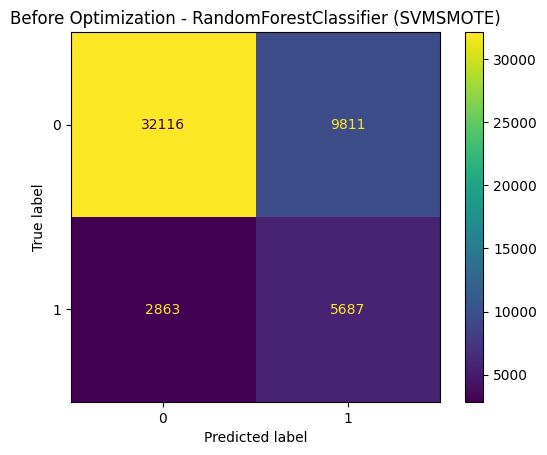


📋 Classification Report (Before) - RandomForestClassifier (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.92      0.77      0.84     41927
           1       0.37      0.67      0.47      8550

    accuracy                           0.75     50477
   macro avg       0.64      0.72      0.65     50477
weighted avg       0.82      0.75      0.77     50477



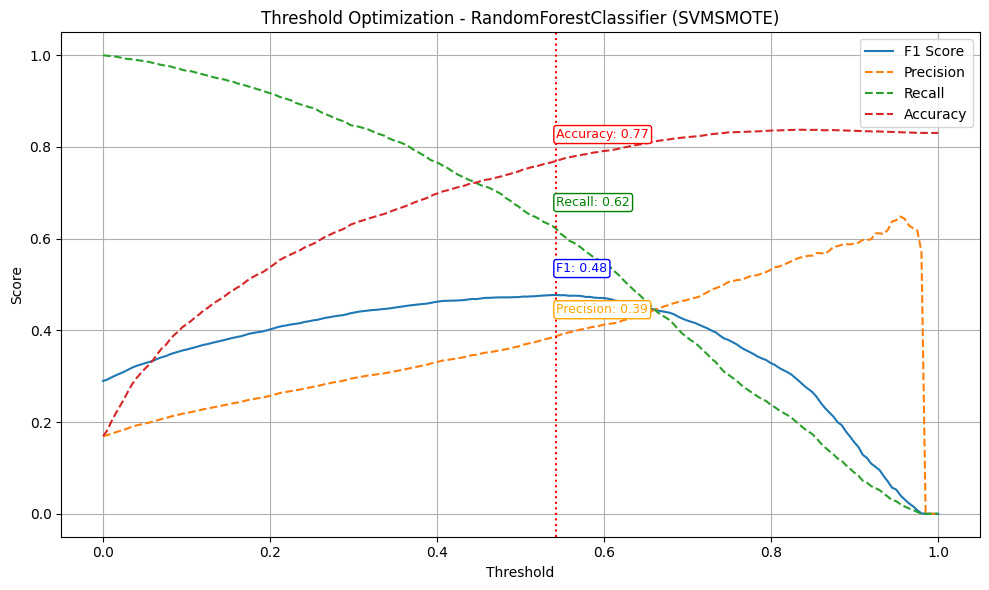


📊 Confusion Matrix (After) - RandomForestClassifier (SVMSMOTE)


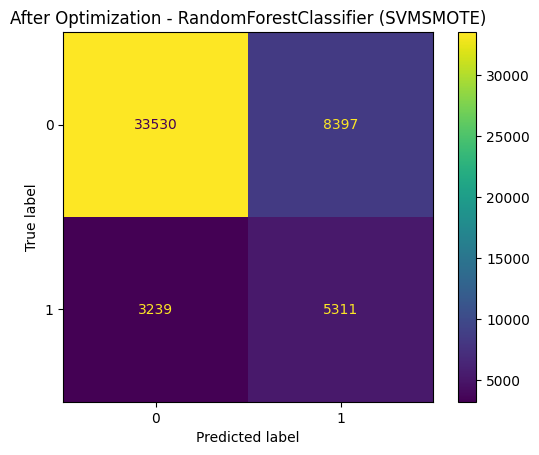


📋 Classification Report (After) - RandomForestClassifier (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.91      0.80      0.85     41927
           1       0.39      0.62      0.48      8550

    accuracy                           0.77     50477
   macro avg       0.65      0.71      0.66     50477
weighted avg       0.82      0.77      0.79     50477


🔍 Training and Evaluating: LogisticRegression (SVMSMOTE)

📊 Confusion Matrix (Before) - LogisticRegression (SVMSMOTE)


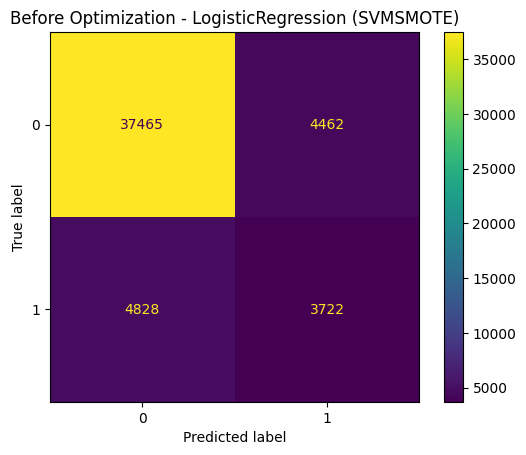


📋 Classification Report (Before) - LogisticRegression (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     41927
           1       0.45      0.44      0.44      8550

    accuracy                           0.82     50477
   macro avg       0.67      0.66      0.67     50477
weighted avg       0.81      0.82      0.81     50477



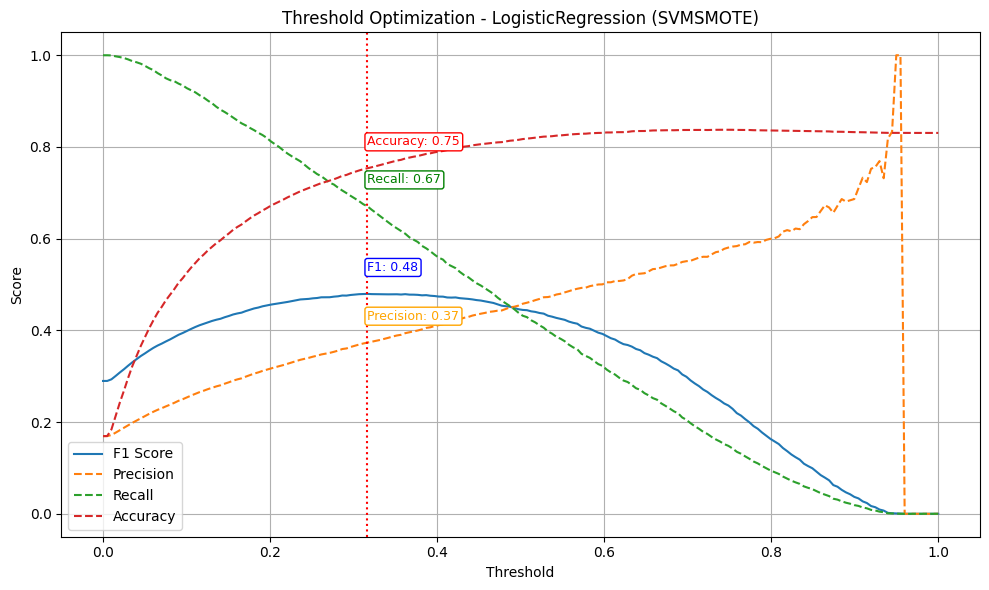


📊 Confusion Matrix (After) - LogisticRegression (SVMSMOTE)


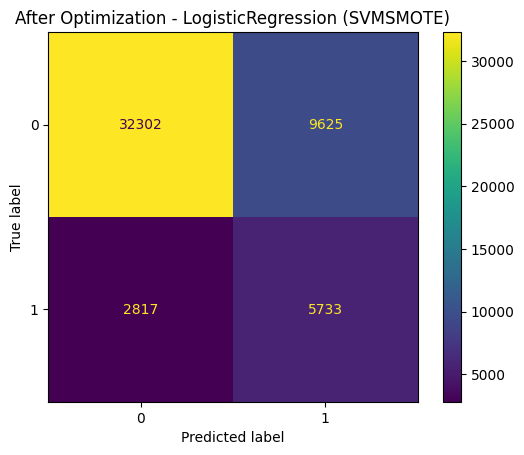


📋 Classification Report (After) - LogisticRegression (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.92      0.77      0.84     41927
           1       0.37      0.67      0.48      8550

    accuracy                           0.75     50477
   macro avg       0.65      0.72      0.66     50477
weighted avg       0.83      0.75      0.78     50477


🔍 Training and Evaluating: XGBoost (SVMSMOTE)

📊 Confusion Matrix (Before) - XGBoost (SVMSMOTE)


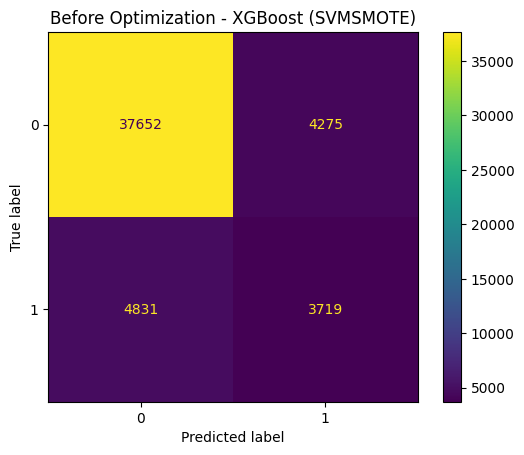


📋 Classification Report (Before) - XGBoost (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.89      0.90      0.89     41927
           1       0.47      0.43      0.45      8550

    accuracy                           0.82     50477
   macro avg       0.68      0.67      0.67     50477
weighted avg       0.81      0.82      0.82     50477



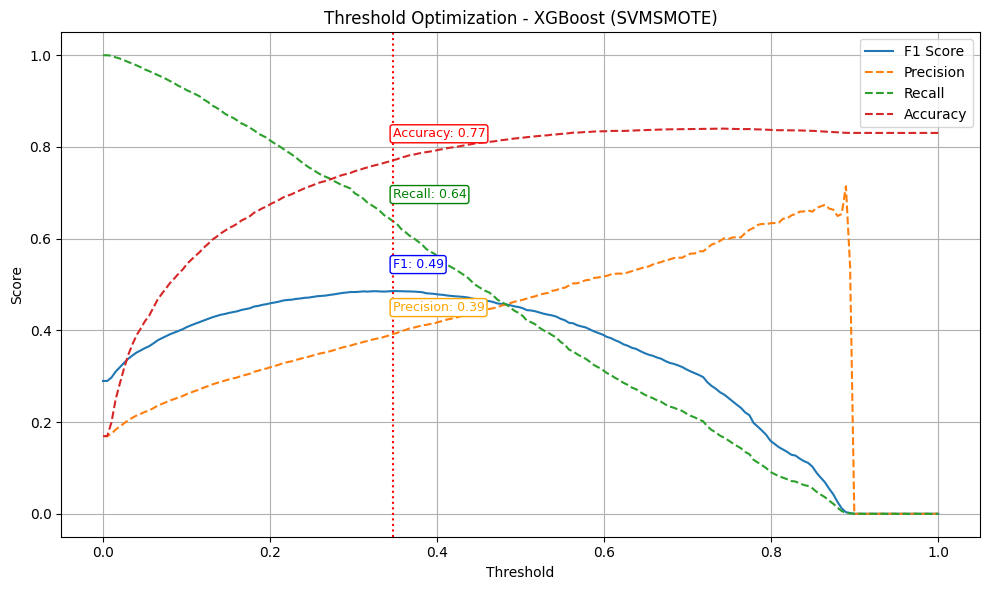


📊 Confusion Matrix (After) - XGBoost (SVMSMOTE)


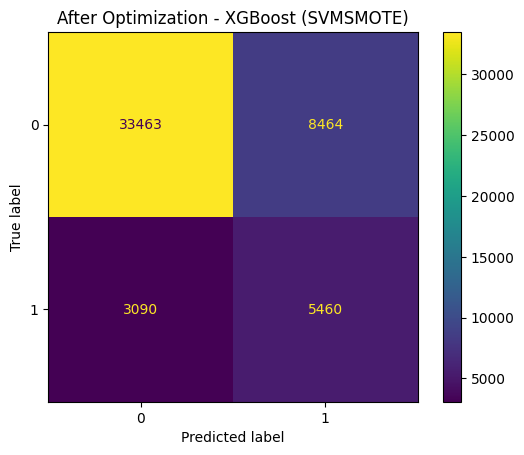


📋 Classification Report (After) - XGBoost (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.92      0.80      0.85     41927
           1       0.39      0.64      0.49      8550

    accuracy                           0.77     50477
   macro avg       0.65      0.72      0.67     50477
weighted avg       0.83      0.77      0.79     50477


🔍 Training and Evaluating: LightGBM (SVMSMOTE)
[LightGBM] [Info] Number of positive: 39330, number of negative: 131102
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.027923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2564
[LightGBM] [Info] Number of data points in the train set: 170432, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.230767 -> initscore=-1.203988
[LightGBM] [Info] Start training from score -1.203988

📊 Confusion Matrix (Before) - LightGBM (SVMSMOTE)


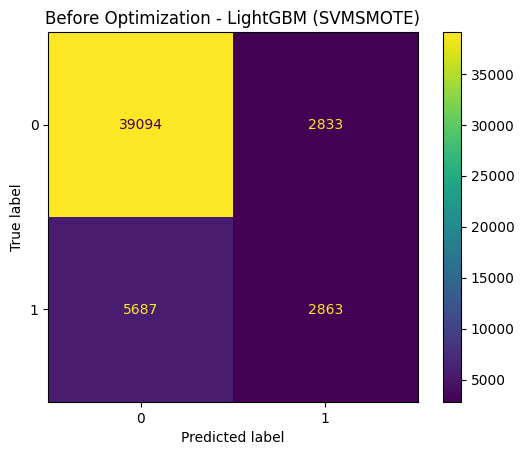


📋 Classification Report (Before) - LightGBM (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     41927
           1       0.50      0.33      0.40      8550

    accuracy                           0.83     50477
   macro avg       0.69      0.63      0.65     50477
weighted avg       0.81      0.83      0.82     50477



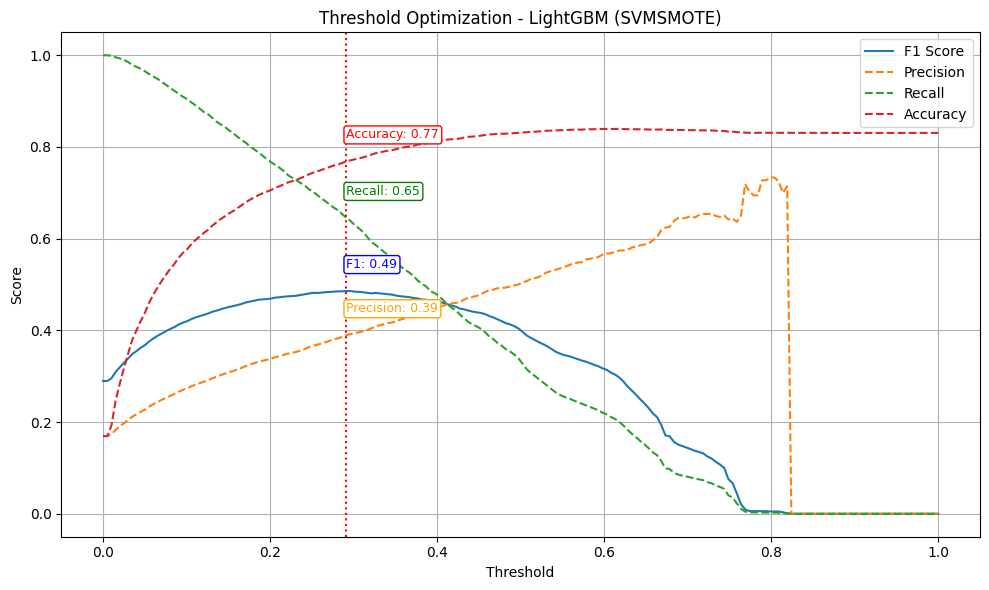


📊 Confusion Matrix (After) - LightGBM (SVMSMOTE)


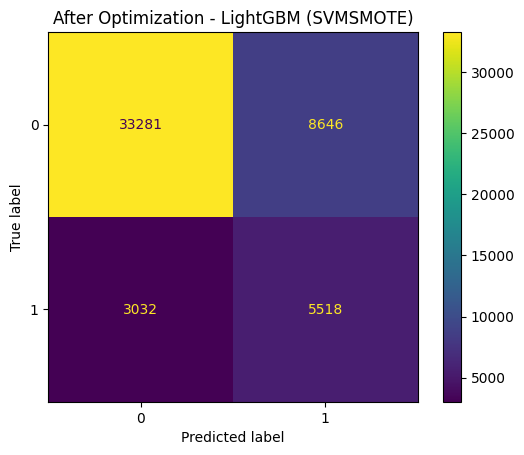


📋 Classification Report (After) - LightGBM (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.92      0.79      0.85     41927
           1       0.39      0.65      0.49      8550

    accuracy                           0.77     50477
   macro avg       0.65      0.72      0.67     50477
weighted avg       0.83      0.77      0.79     50477


🔍 Training and Evaluating: NeuralNetwork (SVMSMOTE)

📊 Confusion Matrix (Before) - NeuralNetwork (SVMSMOTE)


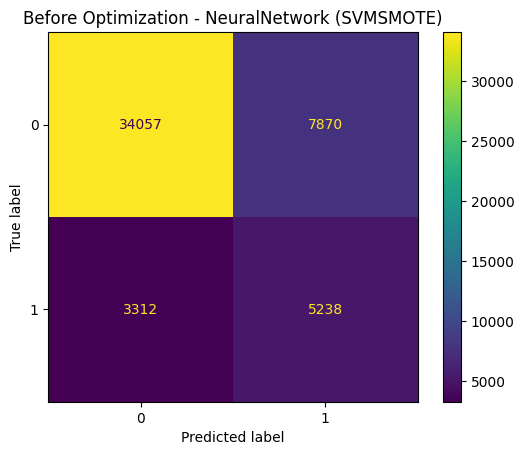


📋 Classification Report (Before) - NeuralNetwork (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.91      0.81      0.86     41927
           1       0.40      0.61      0.48      8550

    accuracy                           0.78     50477
   macro avg       0.66      0.71      0.67     50477
weighted avg       0.82      0.78      0.80     50477



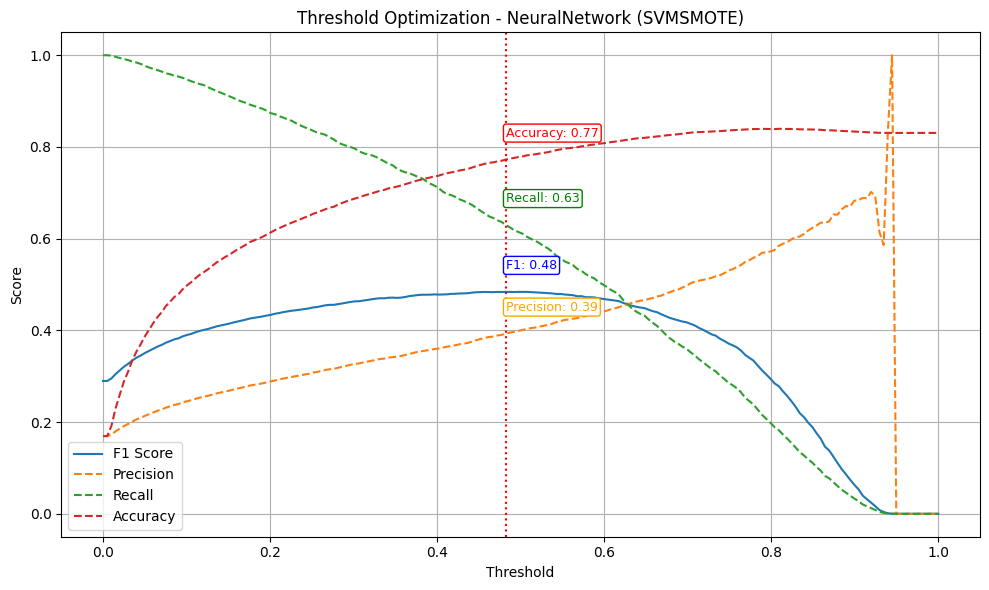


📊 Confusion Matrix (After) - NeuralNetwork (SVMSMOTE)


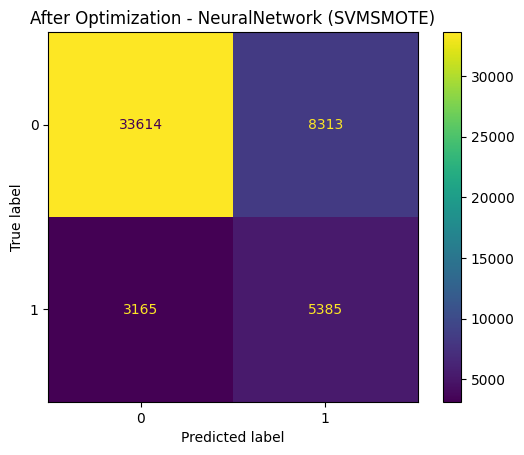


📋 Classification Report (After) - NeuralNetwork (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.91      0.80      0.85     41927
           1       0.39      0.63      0.48      8550

    accuracy                           0.77     50477
   macro avg       0.65      0.72      0.67     50477
weighted avg       0.83      0.77      0.79     50477


🔍 Training and Evaluating: AdaBoost (SVMSMOTE)

📊 Confusion Matrix (Before) - AdaBoost (SVMSMOTE)


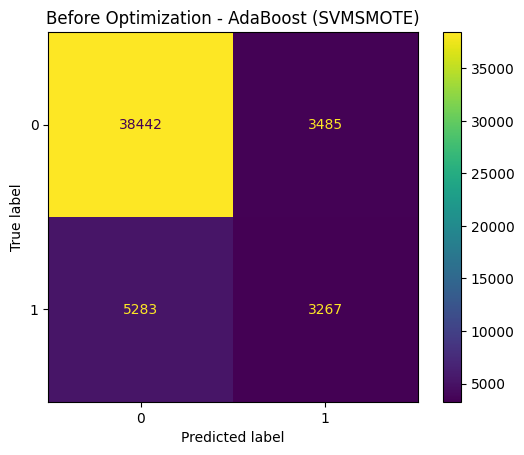


📋 Classification Report (Before) - AdaBoost (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     41927
           1       0.48      0.38      0.43      8550

    accuracy                           0.83     50477
   macro avg       0.68      0.65      0.66     50477
weighted avg       0.81      0.83      0.82     50477



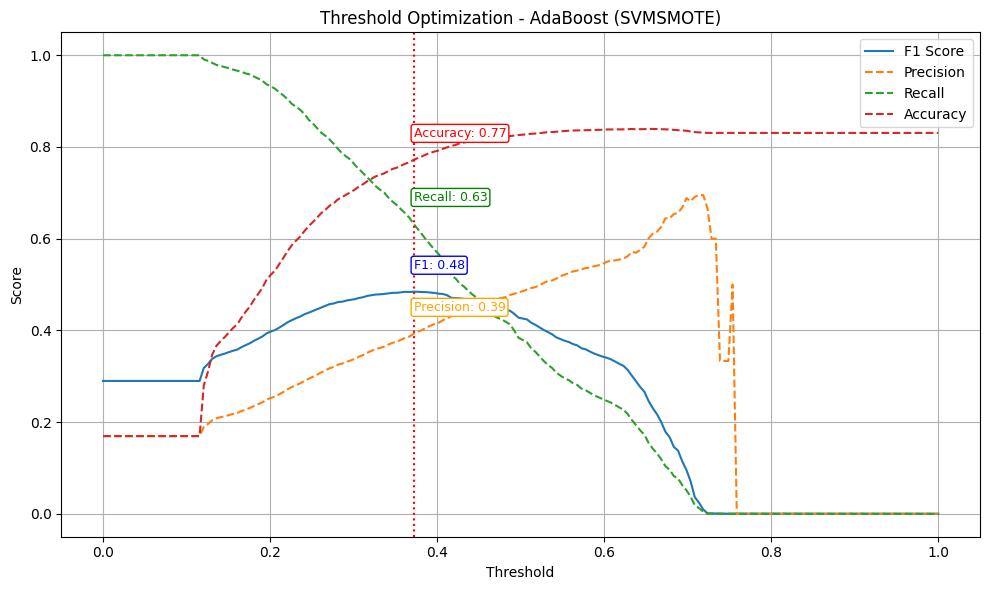


📊 Confusion Matrix (After) - AdaBoost (SVMSMOTE)


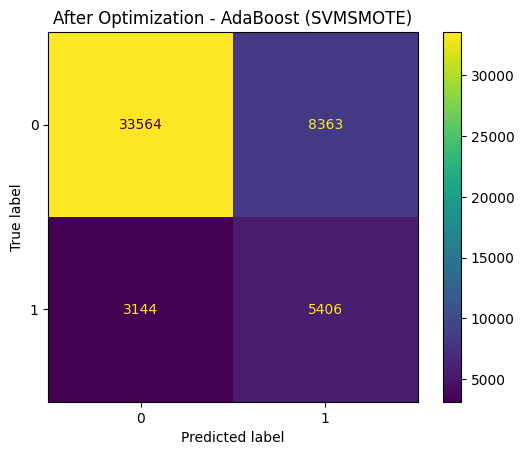


📋 Classification Report (After) - AdaBoost (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.91      0.80      0.85     41927
           1       0.39      0.63      0.48      8550

    accuracy                           0.77     50477
   macro avg       0.65      0.72      0.67     50477
weighted avg       0.83      0.77      0.79     50477


🔍 Training and Evaluating: GradientBoosting (SVMSMOTE)

📊 Confusion Matrix (Before) - GradientBoosting (SVMSMOTE)


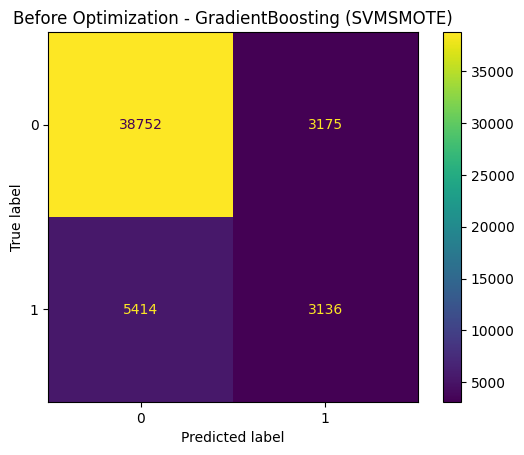


📋 Classification Report (Before) - GradientBoosting (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.88      0.92      0.90     41927
           1       0.50      0.37      0.42      8550

    accuracy                           0.83     50477
   macro avg       0.69      0.65      0.66     50477
weighted avg       0.81      0.83      0.82     50477



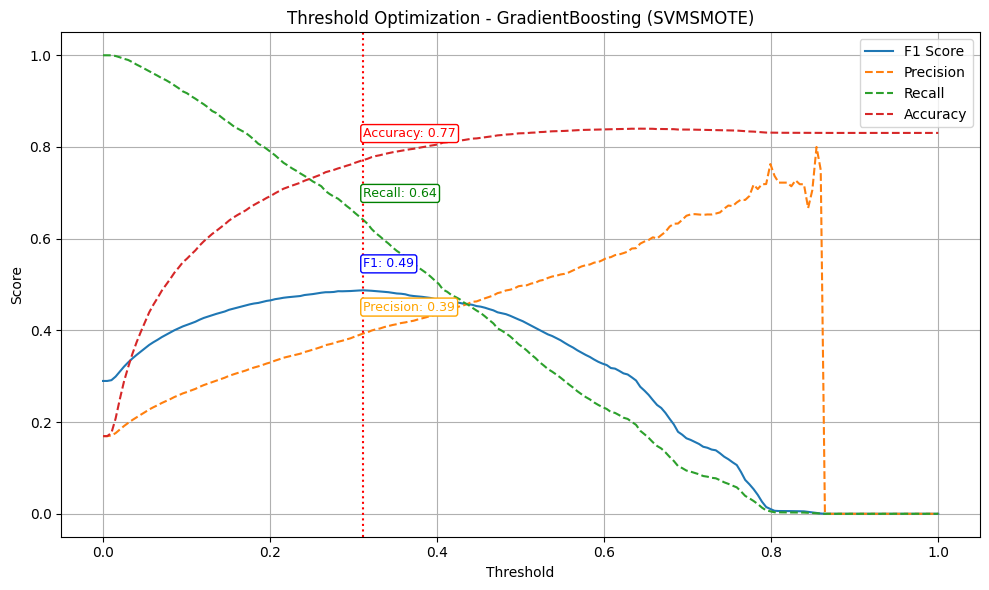


📊 Confusion Matrix (After) - GradientBoosting (SVMSMOTE)


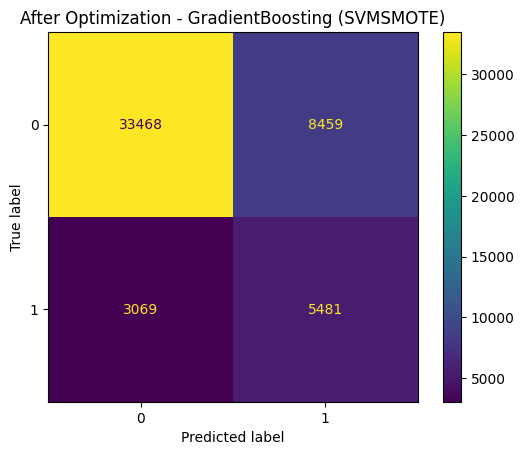


📋 Classification Report (After) - GradientBoosting (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.92      0.80      0.85     41927
           1       0.39      0.64      0.49      8550

    accuracy                           0.77     50477
   macro avg       0.65      0.72      0.67     50477
weighted avg       0.83      0.77      0.79     50477


🔍 Training and Evaluating: DecisionTreeClassifier (SVMSMOTE)

📊 Confusion Matrix (Before) - DecisionTreeClassifier (SVMSMOTE)


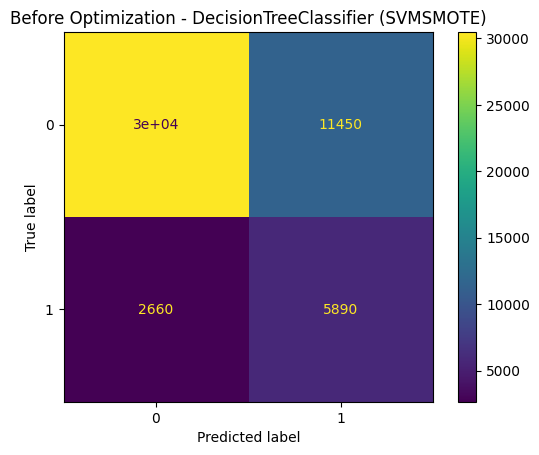


📋 Classification Report (Before) - DecisionTreeClassifier (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.92      0.73      0.81     41927
           1       0.34      0.69      0.46      8550

    accuracy                           0.72     50477
   macro avg       0.63      0.71      0.63     50477
weighted avg       0.82      0.72      0.75     50477



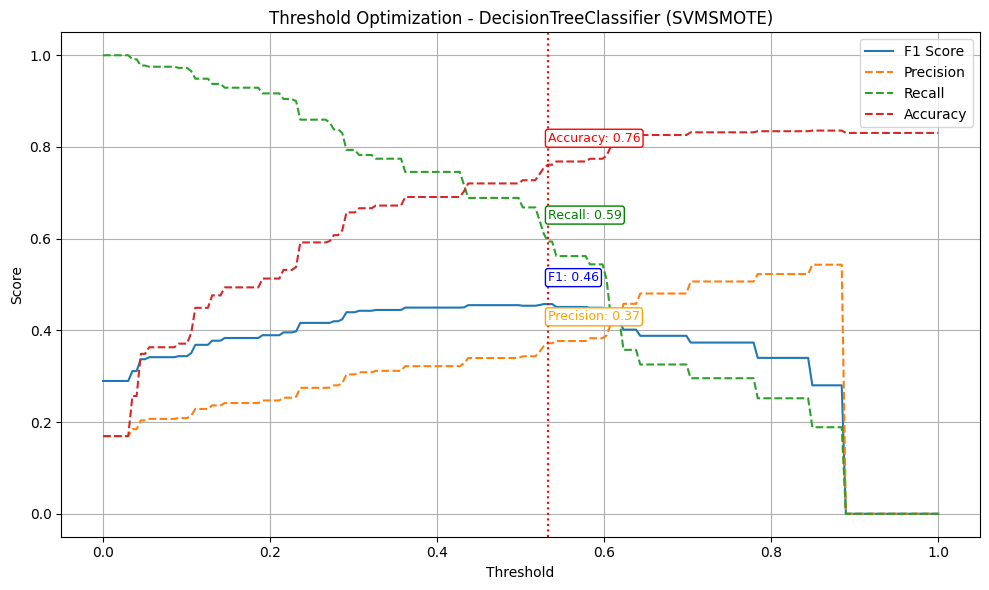


📊 Confusion Matrix (After) - DecisionTreeClassifier (SVMSMOTE)


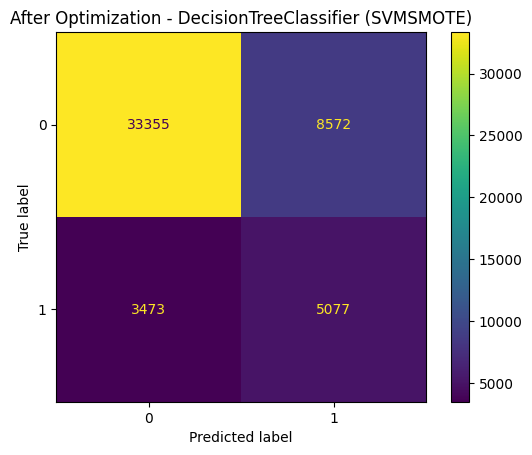


📋 Classification Report (After) - DecisionTreeClassifier (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.91      0.80      0.85     41927
           1       0.37      0.59      0.46      8550

    accuracy                           0.76     50477
   macro avg       0.64      0.69      0.65     50477
weighted avg       0.82      0.76      0.78     50477


🔍 Training and Evaluating: KNN (SVMSMOTE)

📊 Confusion Matrix (Before) - KNN (SVMSMOTE)


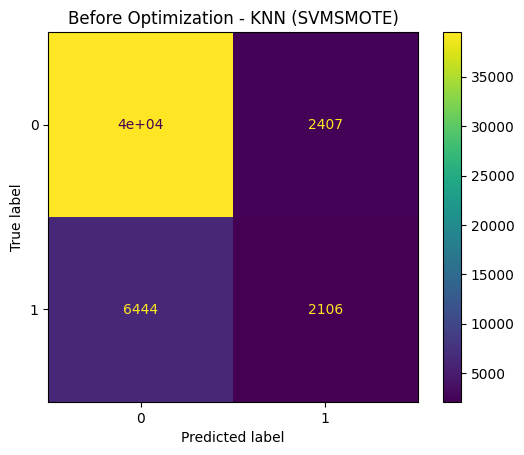


📋 Classification Report (Before) - KNN (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.86      0.94      0.90     41927
           1       0.47      0.25      0.32      8550

    accuracy                           0.82     50477
   macro avg       0.66      0.59      0.61     50477
weighted avg       0.79      0.82      0.80     50477



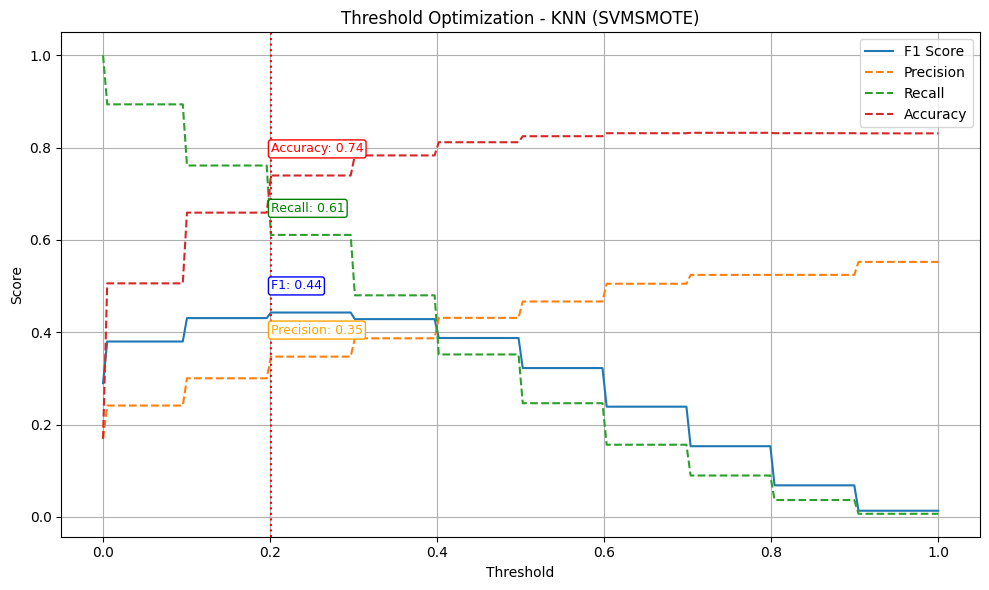


📊 Confusion Matrix (After) - KNN (SVMSMOTE)


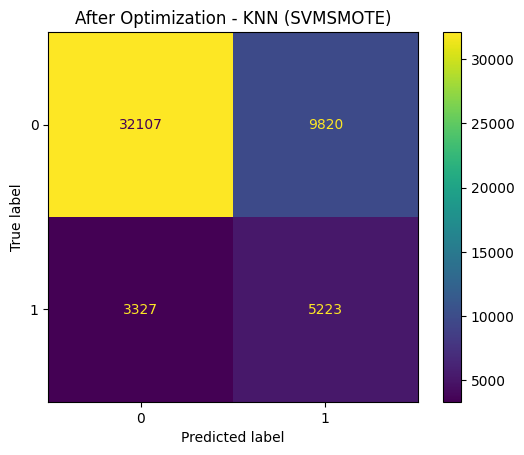


📋 Classification Report (After) - KNN (SVMSMOTE)
              precision    recall  f1-score   support

           0       0.91      0.77      0.83     41927
           1       0.35      0.61      0.44      8550

    accuracy                           0.74     50477
   macro avg       0.63      0.69      0.64     50477
weighted avg       0.81      0.74      0.76     50477



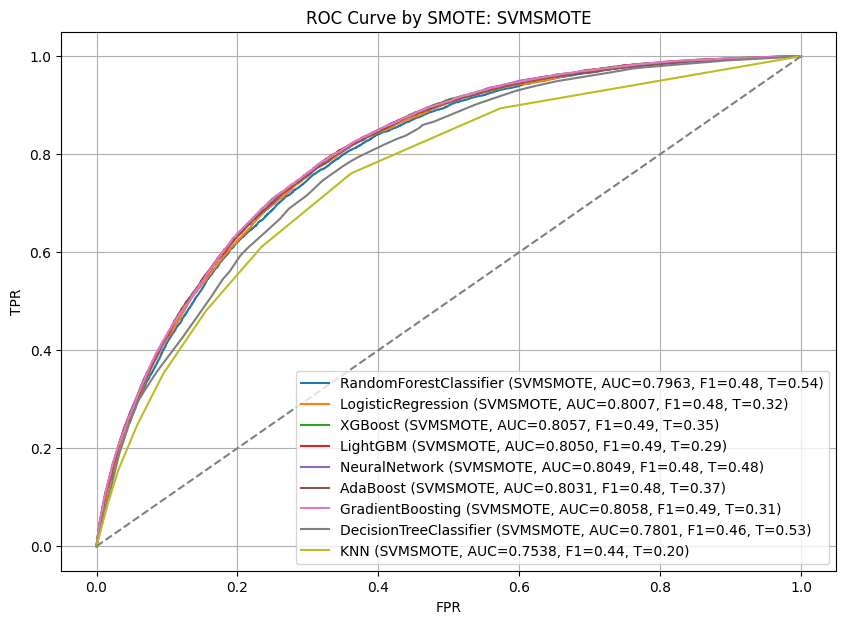

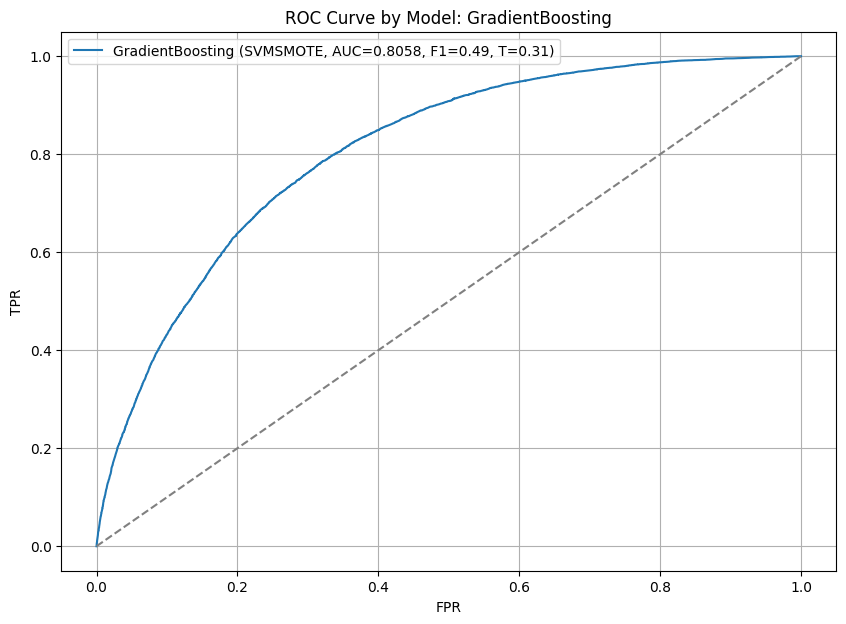

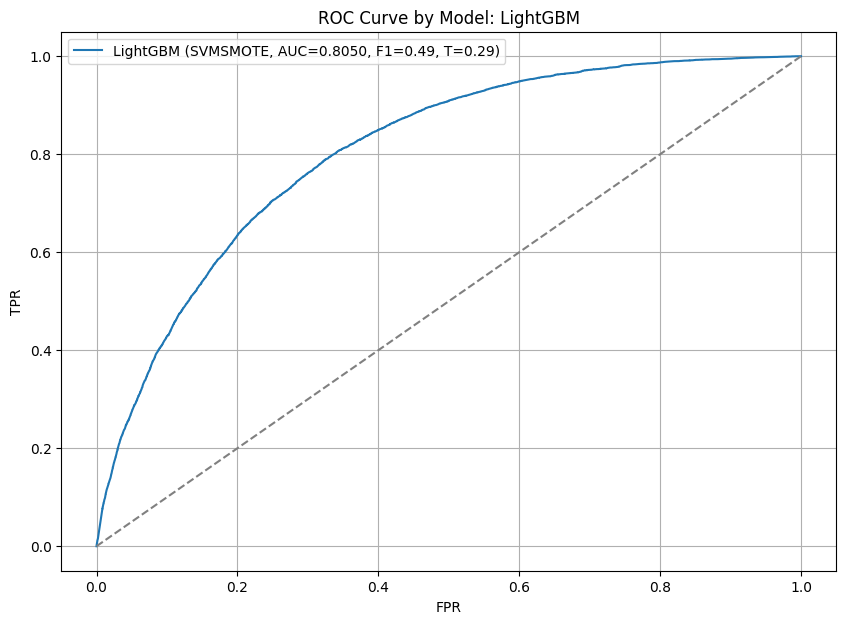

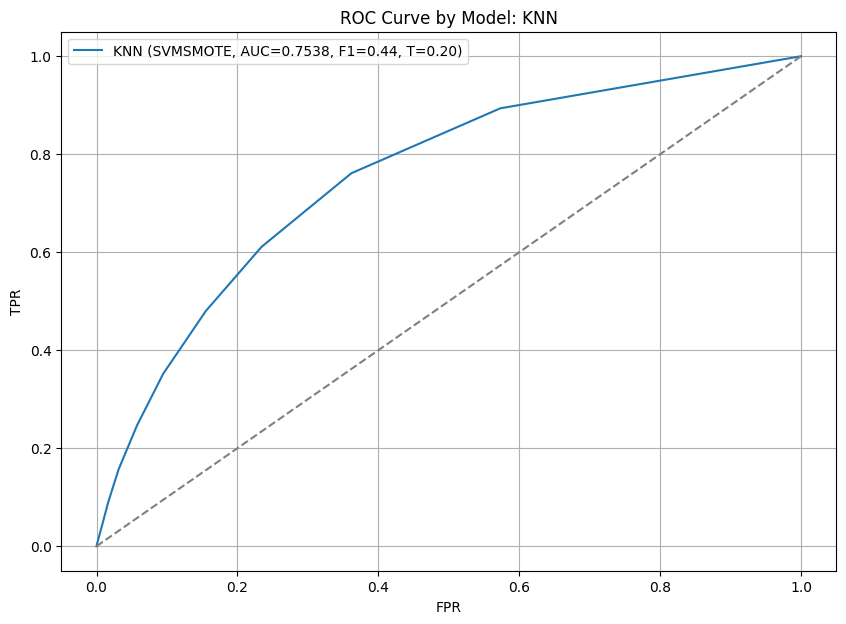

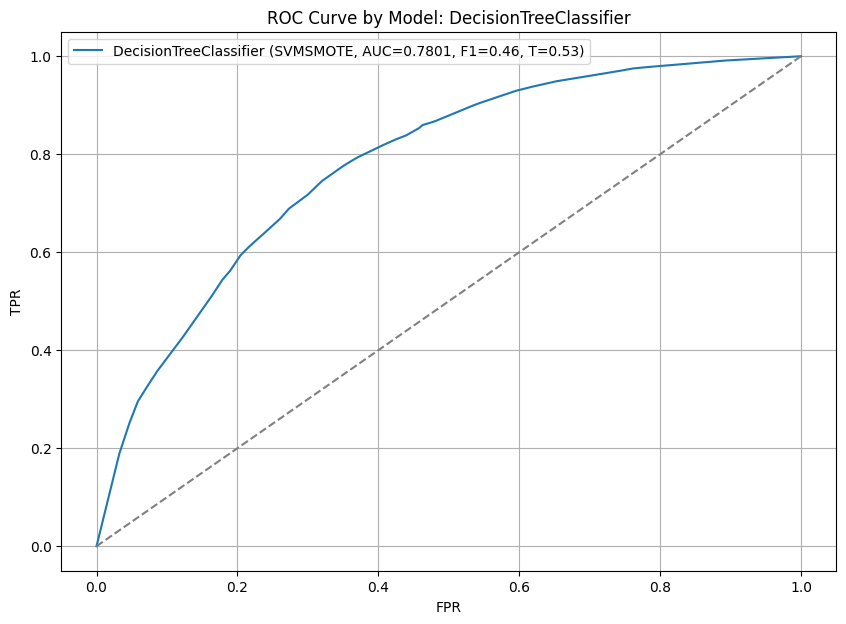

...

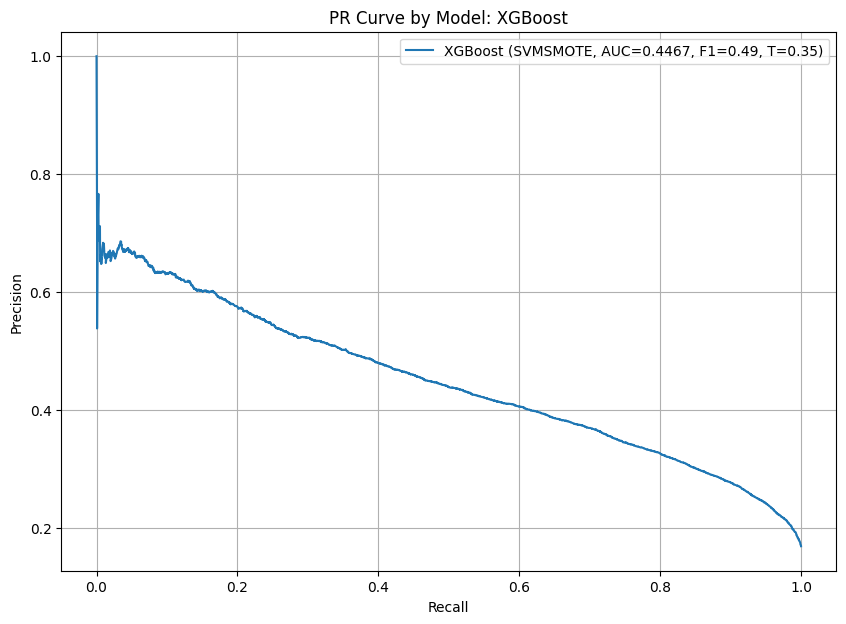

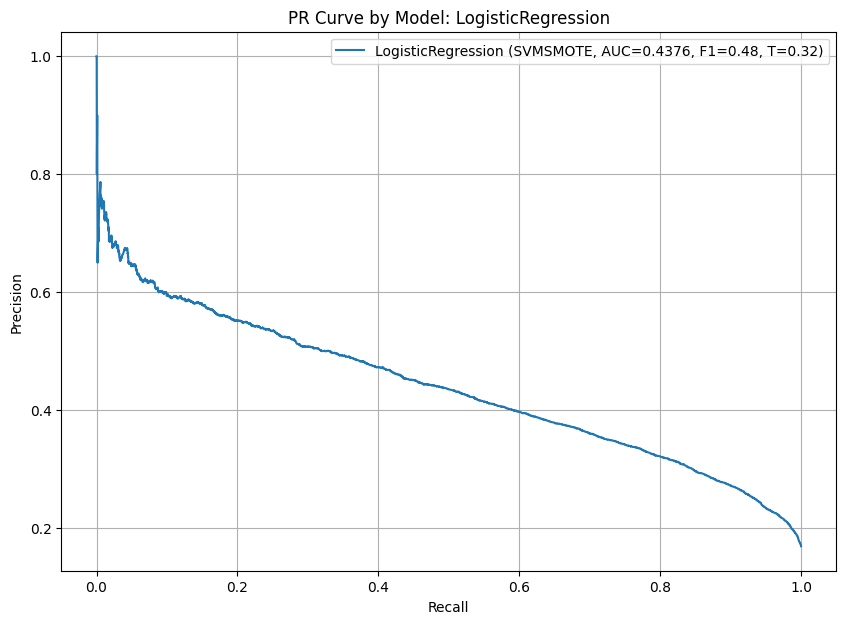

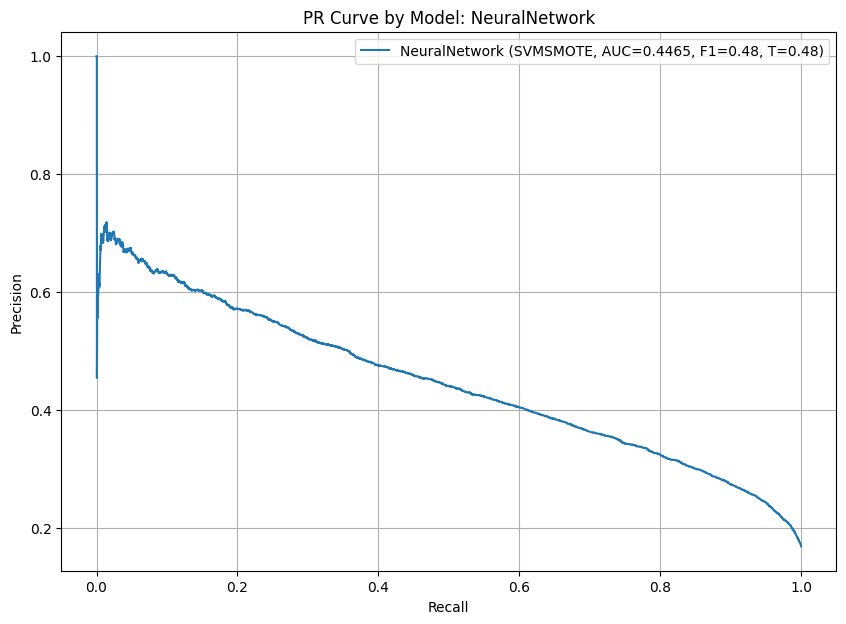

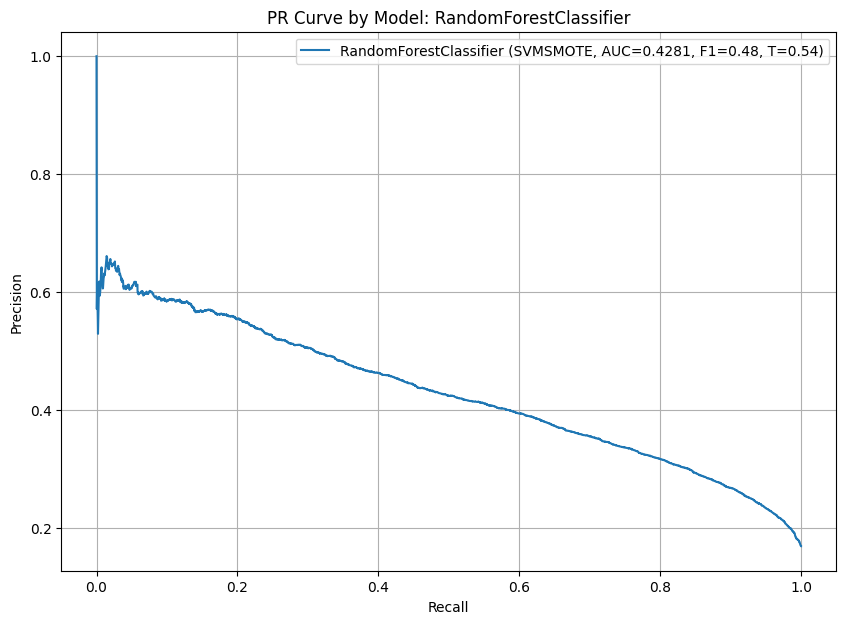

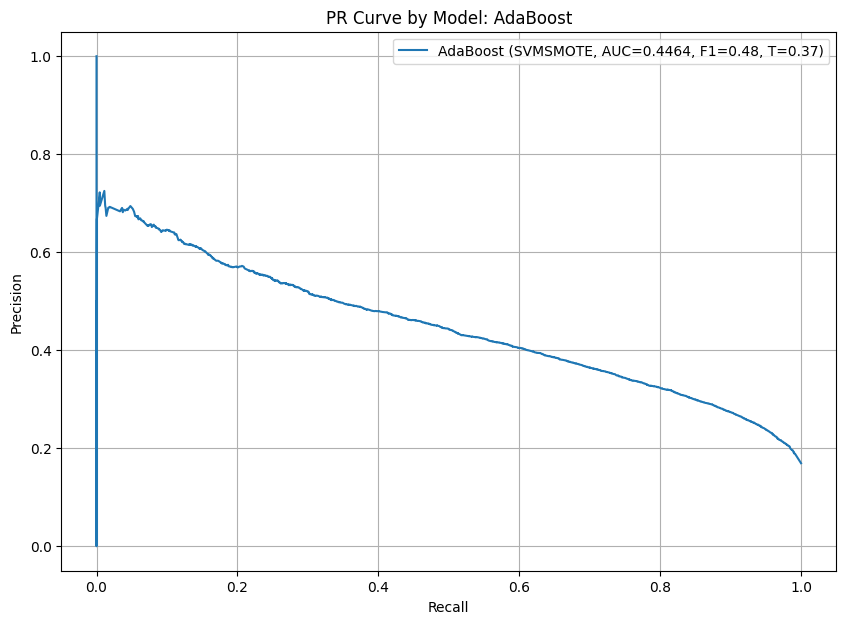


✅ Final Evaluation Summary:
                               Model     SMOTE  Test Accuracy (Before)  \
0  RandomForestClassifier (SVMSMOTE)  SVMSMOTE                0.748915   
1      LogisticRegression (SVMSMOTE)  SVMSMOTE                0.815956   
2                 XGBoost (SVMSMOTE)  SVMSMOTE                0.819601   
3                LightGBM (SVMSMOTE)  SVMSMOTE                0.831210   
4           NeuralNetwork (SVMSMOTE)  SVMSMOTE                0.778473   
5                AdaBoost (SVMSMOTE)  SVMSMOTE                0.826297   
6        GradientBoosting (SVMSMOTE)  SVMSMOTE                0.829843   
7  DecisionTreeClassifier (SVMSMOTE)  SVMSMOTE                0.720467   
8                     KNN (SVMSMOTE)  SVMSMOTE                0.824653   

   Test Precision (Before)  Test Recall (Before)  Test F1 (Before)  \
0                 0.366951              0.665146          0.472971   
1                 0.454790              0.435322          0.444843   
2                 0.

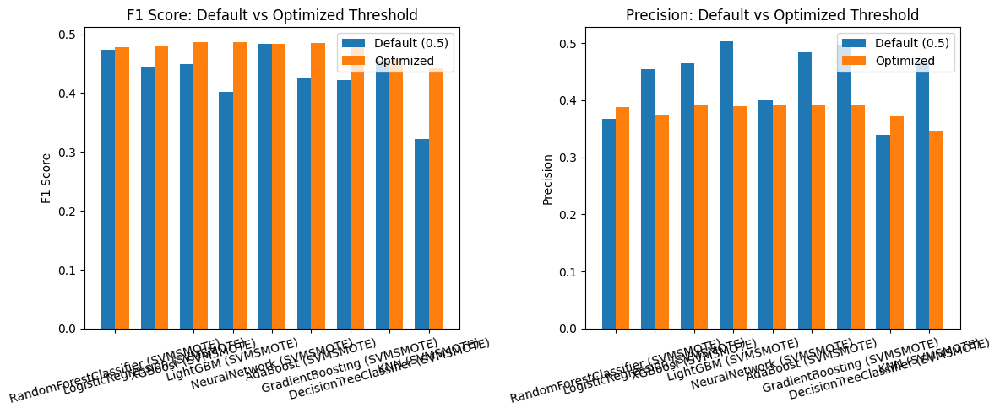


📋 Threshold Optimization Comparison Table:
                               Model  Default Threshold  Optimized Threshold  \
0  RandomForestClassifier (SVMSMOTE)                0.5               0.5427   
1      LogisticRegression (SVMSMOTE)                0.5               0.3166   
2                 XGBoost (SVMSMOTE)                0.5               0.3467   
3                LightGBM (SVMSMOTE)                0.5               0.2915   
4           NeuralNetwork (SVMSMOTE)                0.5               0.4824   
5                AdaBoost (SVMSMOTE)                0.5               0.3719   
6        GradientBoosting (SVMSMOTE)                0.5               0.3116   
7  DecisionTreeClassifier (SVMSMOTE)                0.5               0.5327   
8                     KNN (SVMSMOTE)                0.5               0.2010   

   Default Precision  Optimized Precision  Precision Change (%)  \
0             0.3670               0.3874                5.5831   
1             0.4548 

In [111]:
final_result_df = full_model_evaluation(x_train, x_test, y_train, y_test, classifiers)

In [121]:
import joblib

# Later, load the model if needed
model = joblib.load(r'c:\Users\sherm\OneDrive\Documents\P2\model_GradientBoosting_SVMSMOTE_with_threshold.pkl')

feature_names = model['model'].feature_names_in_
print("Feature Names:", feature_names)

Feature Names: ['GeneralHealth' 'AgeCategory' 'HighBloodPressure' 'BMI' 'Highcholesterol'
 'AlcoholDrinkers' 'Gender' 'RaceEthnicityCategory' 'PhysicalActivities'
 'DifficultyWalking' 'HouseholdIncome']


Feature importance attribute exists: True
                  Feature  Importance
0           GeneralHealth    0.228842
2       HighBloodPressure    0.217380
3                     BMI    0.123865
4         Highcholesterol    0.112914
1             AgeCategory    0.080220
5         AlcoholDrinkers    0.077789
9       DifficultyWalking    0.048127
10        HouseholdIncome    0.036299
6                  Gender    0.029612
8      PhysicalActivities    0.028041
7   RaceEthnicityCategory    0.016911


C:\Users\sherm\AppData\Local\Temp\ipykernel_11844\2950431136.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Importance", y="Feature", data=importance_df, palette="viridis")


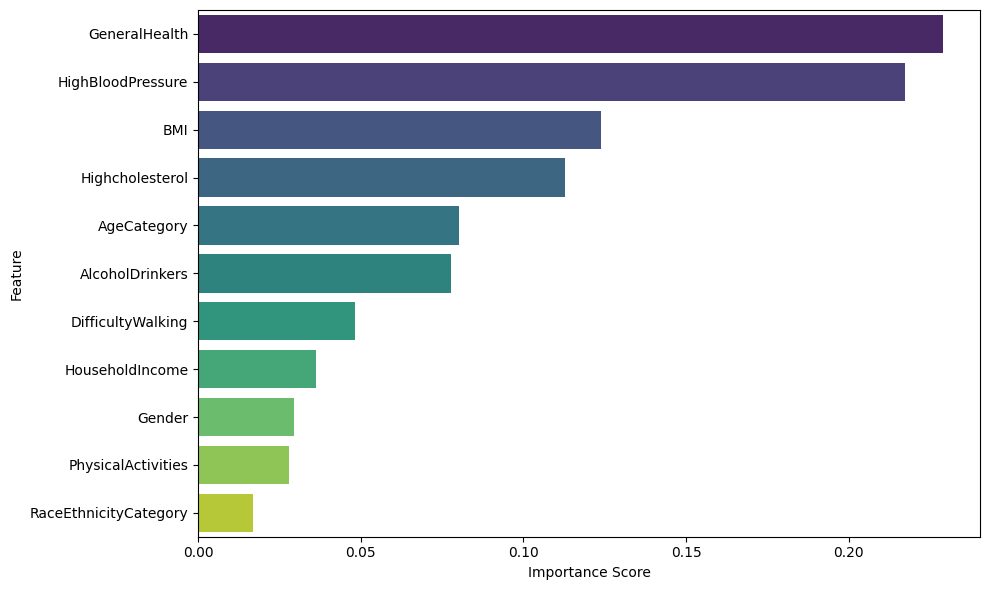

In [ ]:
# Confirm attribute exists
print("Feature importance attribute exists:", hasattr(model, "feature_importances_"))

# Extract and visualize feature importance
importances = model.feature_importances_

# Create DataFrame
importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importances
}).sort_values(by="Importance", ascending=False)

print(importance_df)

# Plot horizontal bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x="Importance", y="Feature", data=importance_df, palette="viridis")
# plt.title("Feature Importance")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()